In [ ]:
!pip install "openpyxl == 3.0.0"
!pip install umap-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 172 kB 6.5 MB/s 
  Created wheel for openpyxl: filename=openpyxl-3.0.0-py2.py3-none-any.whl size=241207 sha256=daeb94021524b4abf7adc005c83f42ed977870331effb4389cc94367e613e50d
  Stored in directory: /root/.cache/pip/wheels/c7/64/ff/ce98f6e1d2701ae8e216c875da62feed2839ac8a3cae0ab8af
Successfully built openpyxl
  Attempting uninstall: openpyxl
    Found existing installation: openpyxl 3.0.10
    Uninstalling openpyxl-3.0.10:
      Successfully uninstalled openpyxl-3.0.10
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 88 kB 2.9 MB/s 
     |████████████████████████████████| 1.1 MB 42.6 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82829 sha256=69bba4245776315148a71a88fcf7889c70e83cfdc628a00294aaf43a95a8fd28
  Stored in dire

## Setup

In [ ]:
from google.colab import drive
drive.mount('/drive', force_remount=True)
!cp /drive/MyDrive/Abbasi?Lab/Finger?Analysis/*.csv /tmp
!cp /drive/MyDrive/Abbasi?Lab/Finger?Analysis/motor_scales_all_2021.03.08.xlsx /tmp

Mounted at /drive


In [ ]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.patches as patches
from matplotlib import rc
import scipy.stats
from os import listdir
import os

In [ ]:
import torch
import gc
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, Subset, ConcatDataset

In [ ]:
seed = 123
# 1. Set `PYTHONHASHSEED` environment variable at a fixed value
os.environ['PYTHONHASHSEED']=str(seed)
# 2. Set `python` built-in pseudo-random generator at a fixed value
random.seed(seed)
# 3. Set `numpy` pseudo-random generator at a fixed value
np.random.seed(seed)
# 3. Set `torch` pseudo-random generator at a fixed value
torch.manual_seed(seed)

In [ ]:
files = listdir("/tmp")
hand_files = [f for f in files if f[-13:] == 'fingertap.csv']
hand_data = [pd.read_csv("/tmp/" + f, header=None, names=range(128)) for f in hand_files]
count = 0
print("Hand files:")
for i, f in enumerate(hand_files):
  print(f, ": Num columns =", len(hand_data[i].columns))
  count += 1
print()
print("# hand files:", count)
pid_data = pd.read_csv("/tmp/google_pidns.csv").iloc[:, :6].dropna(subset=["conference.consensus.dx"])
print()
print("PID data:")
print("google_pidns.csv : Num columns =", len(pid_data.columns))

hand_data_filtered = []
hand_files_filtered = []
count = 0
for i, d in enumerate(hand_data):
  if int(hand_files[i].split("_")[1]) in pid_data["pidn"].values and len(hand_data[i]) > 0:
    hand_data_filtered.append(d)
    hand_files_filtered.append(hand_files[i])
    count += 1
print()
print("# filtered hand files:", count)

hand_data = hand_data_filtered
hand_files = hand_files_filtered

Hand files:
google_31937_on_fingertap.csv : Num columns = 128
google_26463_off_fingertap.csv : Num columns = 128
google_31892_on_fingertap.csv : Num columns = 128
google_25288_on_fingertap.csv : Num columns = 128
google_31937_off_fingertap.csv : Num columns = 128
google_21987_on_fingertap.csv : Num columns = 128
google_32205_off_fingertap.csv : Num columns = 128
google_26463_on_fingertap.csv : Num columns = 128
google_31684_on_fingertap.csv : Num columns = 128
google_31249_off_fingertap.csv : Num columns = 128
google_32205_on_fingertap.csv : Num columns = 128
google_22423_off_fingertap.csv : Num columns = 128
google_31875_on_fingertap.csv : Num columns = 128
google_30605_on_fingertap.csv : Num columns = 128
google_20756_on_fingertap.csv : Num columns = 128
google_30605_off_fingertap.csv : Num columns = 128
google_21987_off_fingertap.csv : Num columns = 128
google_32035_on_fingertap.csv : Num columns = 128
google_25493_off_fingertap.csv : Num columns = 128
google_22423_on_fingertap.csv 

In [ ]:
pid_data

,pidn,conference.consensus.dx,ClinSynBestEst,ResDxA,mds.updrs.3.off,mds.updrs.3.on
1,8565.0,PD,PARKINSON'S DISEASE,PARKINSON'S: CONSENSUS,19.0,13.0
3,11845.0,PD,PARKINSON'S DISEASE,PARKINSON'S: CONSENSUS,35.0,20.0
5,15669.0,PD,PARKINSON'S DISEASE,PARKINSON'S: CONSENSUS,29.0,15.0
6,15883.0,PD,PARKINSON'S DISEASE,PARKINSON'S: CONSENSUS,25.0,16.0
7,16883.0,PD,PARKINSON'S DISEASE,PARKINSON'S: CONSENSUS,NaN,22.0
8,17002.0,PD,PARKINSON'S DISEASE,PARKINSON'S: CONSENSUS,33.0,21.0
9,18845.0,PUCS,DEMENTIA WITH LEWY BODIES,DLB POSSIBLE: MCKEITH,NaN,22.0
10,19672.0,PD,PARKINSON'S DISEASE,PARKINSON'S: CONSENSUS,28.0,11.0
11,20190.0,PUCS,PARKINSON'S DISEASE,PARKINSON'S: CONSENSUS,36.0,24.0
12,20452.0,PD,PARKINSON'S DISEASE,PARKINSON'S: CONSENSUS,14.0,14.0


In [ ]:
updrs_data = pd.read_excel("/tmp/motor_scales_all_2021.03.08.xlsx", sheet_name="Sheet1")
updrs_data = updrs_data[updrs_data["pidn"].isin(pid_data["pidn"])]
columns = ["pidn"] + [c for c in updrs_data.columns if c.startswith("updrs.off.3")] + \
[c for c in updrs_data.columns if c.startswith("updrs.on.3")] + ["off.exam", "pd.meds"]
updrs_data = updrs_data[columns]
for i, row in updrs_data.iterrows():
  if row["off.exam"] == -2:
    for c in updrs_data.columns:
      if c.startswith("updrs.off.3"):
        updrs_data.loc[i, c] = row[c.replace("off", "on")]
        updrs_data.loc[i, c.replace("off", "on")] = np.nan
  if row["off.exam"] == 0 and row["pd.meds"] == 1:
    for c in updrs_data.columns:
      if c.startswith("updrs.off.3"):
        updrs_data.loc[i, c] = np.nan
updrs_data.set_index("pidn", inplace=True)
updrs_data.drop(["off.exam", "pd.meds"], axis=1, inplace=True)
pid_data = pid_data.join(updrs_data, on="pidn")
pid_data.head()

,pidn,conference.consensus.dx,ClinSynBestEst,ResDxA,mds.updrs.3.off,mds.updrs.3.on,updrs.off.3.1,updrs.off.3.2,updrs.off.3.3.neck,updrs.off.3.3.rue,...,updrs.on.3.15.rue,updrs.on.3.15.lue,updrs.on.3.16.rue,updrs.on.3.16.lue,updrs.on.3.17.jaw,updrs.on.3.17.rue,updrs.on.3.17.lue,updrs.on.3.17.rle,updrs.on.3.17.lle,updrs.on.3.18
1,8565.0,PD,PARKINSON'S DISEASE,PARKINSON'S: CONSENSUS,19.0,13.0,1.0,2.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,11845.0,PD,PARKINSON'S DISEASE,PARKINSON'S: CONSENSUS,35.0,20.0,1.0,-99.0,1.0,2.0,...,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2.0
5,15669.0,PD,PARKINSON'S DISEASE,PARKINSON'S: CONSENSUS,29.0,15.0,0.0,1.0,0.0,2.0,...,3.0,1.0,1.0,1.0,1.0,3.0,1.0,0.0,0.0,4.0
6,15883.0,PD,PARKINSON'S DISEASE,PARKINSON'S: CONSENSUS,25.0,16.0,0.0,2.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
7,16883.0,PD,PARKINSON'S DISEASE,PARKINSON'S: CONSENSUS,NaN,22.0,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,1.0,1.0,0.0,2.0,0.0,0.0,2.0


In [ ]:
#'0 wrist', '1 thumb_cmc', '2 thumb_mcp', '3 thumb_ip', '4 thumb_tip',
#'5 index_mcp', '6 index_pip','7 index_dip','8 index_tip', 
#'9 middle_mcp','10 middle_pip','11 middle_dip', '12 middle_tip',
#'13 ring_mcp','14 ring_pip','15 ring_dip', '16 ring_tip',
#'17 pinky_mcp','18 pinky_pip','19 pinky_dip', '20 pinky_tip',
keypoints = ['wrist', 
             'thumb_cmc', 'thumb_mcp', 'thumb_ip', 'thumb_tip',
             'index_mcp', 'index_pip','index_dip','index_tip', 
             'middle_mcp','middle_pip','middle_dip', 'middle_tip',
             'ring_mcp','ring_pip','ring_dip', 'ring_tip',
             'pinky_mcp','pinky_pip','pinky_dip', 'pinky_tip']
columns = ['timestamp', 'inst'] + \
sum([["right_" + k + ":x", "right_" + k + ":y", "right_" + k + ":z"] 
     for k in keypoints], []) + \
sum([["left_" + k + ":x", "left_" + k + ":y", "left_" + k + ":z"] 
     for k in keypoints], [])

for df in hand_data:
  df.columns = columns

hand_data[0].head()

,timestamp,inst,right_wrist:x,right_wrist:y,right_wrist:z,right_thumb_cmc:x,right_thumb_cmc:y,right_thumb_cmc:z,right_thumb_mcp:x,right_thumb_mcp:y,...,left_pinky_mcp:z,left_pinky_pip:x,left_pinky_pip:y,left_pinky_pip:z,left_pinky_dip:x,left_pinky_dip:y,left_pinky_dip:z,left_pinky_tip:x,left_pinky_tip:y,left_pinky_tip:z
0,0,2,0.456245,0.812261,-0.000014,0.456050,0.793380,-0.032799,0.458554,0.785688,...,-0.048708,0.643162,0.878785,-0.064130,0.636587,0.882702,-0.072166,0.630269,0.885295,-0.077320
1,33366,2,0.454642,0.804302,-0.000005,0.453154,0.791809,-0.036810,0.455296,0.785987,...,-0.041261,0.643572,0.874335,-0.054742,0.635054,0.876939,-0.062120,0.628257,0.877399,-0.067571
2,66733,2,0.454652,0.807108,-0.000006,0.454649,0.791487,-0.034082,0.457443,0.784595,...,-0.039026,0.645272,0.872517,-0.050413,0.637008,0.876087,-0.057815,0.628712,0.877677,-0.064699
3,100100,2,0.454861,0.807823,-0.000011,0.455765,0.791871,-0.033560,0.458981,0.784862,...,-0.038985,0.647777,0.867810,-0.050293,0.639037,0.872812,-0.057424,0.631444,0.876728,-0.063725
4,133466,2,0.455505,0.810830,-0.000009,0.456431,0.794044,-0.032733,0.459423,0.785979,...,-0.036011,0.651489,0.850418,-0.049427,0.642057,0.853113,-0.056656,0.633586,0.854638,-0.061289


## Finger Tapping Animations

In [ ]:
def animate(data, title):
  #Return movement animation from patient upper body gait data
  fig, ax = plt.subplots(figsize=(6, 6))
  ax.set_xlim(0, 1)
  ax.set_ylim(0, 1)
  ax.invert_yaxis()
  ax.set_title(title)
  lines = []
  for i in range(42):
    line, = ax.plot([], [], 'ro-', markerfacecolor='blue')
    lines.append(line)
  plt.close(fig)
  
  def plot_frame(idx):
    #Return keypoints and connections for a frame given the index of the row 
    #corresponding to the frame
    x = [data.loc[idx][i] for i in range(2, len(data.columns), 3)]
    y = [data.loc[idx][i] for i in range(3, len(data.columns), 3)]
    connections = []
    connections.append([(x[0], y[0]), (x[1], y[1])])
    connections.append([(x[1], y[1]), (x[2], y[2])])
    connections.append([(x[2], y[2]), (x[3], y[3])])
    connections.append([(x[3], y[3]), (x[4], y[4])])
    connections.append([(x[0], y[0]), (x[5], y[5])])
    connections.append([(x[5], y[5]), (x[6], y[6])])
    connections.append([(x[6], y[6]), (x[7], y[7])])
    connections.append([(x[7], y[7]), (x[8], y[8])])
    connections.append([(x[5], y[5]), (x[9], y[9])])
    connections.append([(x[9], y[9]), (x[10], y[10])])
    connections.append([(x[10], y[10]), (x[11], y[11])])
    connections.append([(x[11], y[11]), (x[12], y[12])])
    connections.append([(x[9], y[9]), (x[13], y[13])])
    connections.append([(x[13], y[13]), (x[14], y[14])])
    connections.append([(x[14], y[14]), (x[15], y[15])])
    connections.append([(x[15], y[15]), (x[16], y[16])])
    connections.append([(x[13], y[13]), (x[17], y[17])])
    connections.append([(x[0], y[0]), (x[17], y[17])])
    connections.append([(x[17], y[17]), (x[18], y[18])])
    connections.append([(x[18], y[18]), (x[19], y[19])])
    connections.append([(x[19], y[19]), (x[20], y[20])])
    x = x[21:]
    y = y[21:]
    connections.append([(x[0], y[0]), (x[1], y[1])])
    connections.append([(x[1], y[1]), (x[2], y[2])])
    connections.append([(x[2], y[2]), (x[3], y[3])])
    connections.append([(x[3], y[3]), (x[4], y[4])])
    connections.append([(x[0], y[0]), (x[5], y[5])])
    connections.append([(x[5], y[5]), (x[6], y[6])])
    connections.append([(x[6], y[6]), (x[7], y[7])])
    connections.append([(x[7], y[7]), (x[8], y[8])])
    connections.append([(x[5], y[5]), (x[9], y[9])])
    connections.append([(x[9], y[9]), (x[10], y[10])])
    connections.append([(x[10], y[10]), (x[11], y[11])])
    connections.append([(x[11], y[11]), (x[12], y[12])])
    connections.append([(x[9], y[9]), (x[13], y[13])])
    connections.append([(x[13], y[13]), (x[14], y[14])])
    connections.append([(x[14], y[14]), (x[15], y[15])])
    connections.append([(x[15], y[15]), (x[16], y[16])])
    connections.append([(x[13], y[13]), (x[17], y[17])])
    connections.append([(x[0], y[0]), (x[17], y[17])])
    connections.append([(x[17], y[17]), (x[18], y[18])])
    connections.append([(x[18], y[18]), (x[19], y[19])])
    connections.append([(x[19], y[19]), (x[20], y[20])])
    for j, line in enumerate(lines):
      conn = connections[j]
      line.set_data([conn[0][0], conn[1][0]], [conn[0][1], conn[1][1]])
    return lines

  return animation.FuncAnimation(fig, plot_frame, frames=data.index, 
                                 interval=33, blit=True)

In [ ]:
anims = []
for i, df in enumerate(hand_data):
  anims.append(animate(df, hand_files[i]))
rc('animation', html='jshtml')

In [ ]:
anims[0]

In [ ]:
anims[1]

In [ ]:
anims[2]

In [ ]:
anims[3]

## Main Tapping Features

In [ ]:
def tapping_distance(data):
  #Returns time series of distance between right_thumb_tip and right_index_tip and
  #time series of distance between left_thumb_tip and left_index_tip, as well as
  #original timestamps
  right_thumb_tip_x = data["right_thumb_tip:x"]
  right_thumb_tip_y = data["right_thumb_tip:y"]
  right_index_tip_x = data["right_index_tip:x"]
  right_index_tip_y = data["right_index_tip:y"]

  left_thumb_tip_x = data["left_thumb_tip:x"]
  left_thumb_tip_y = data["left_thumb_tip:y"]
  left_index_tip_x = data["left_index_tip:x"]
  left_index_tip_y = data["left_index_tip:y"]

  dist_right = np.sqrt((right_thumb_tip_x - right_index_tip_x)**2 + \
              (right_thumb_tip_y - right_index_tip_y)**2)
  dist_left = np.sqrt((left_thumb_tip_x - left_index_tip_x)**2 + \
              (left_thumb_tip_y - left_index_tip_y)**2)
  return dist_right, dist_left, data['timestamp']

In [ ]:
def tap_velocity(time, distance):
  #Return velocity time series from distance time series, along with 
  #original timestamps
  dist_diff = distance.diff()
  time_diff = time.diff()
  v = dist_diff / time_diff
  return v, time

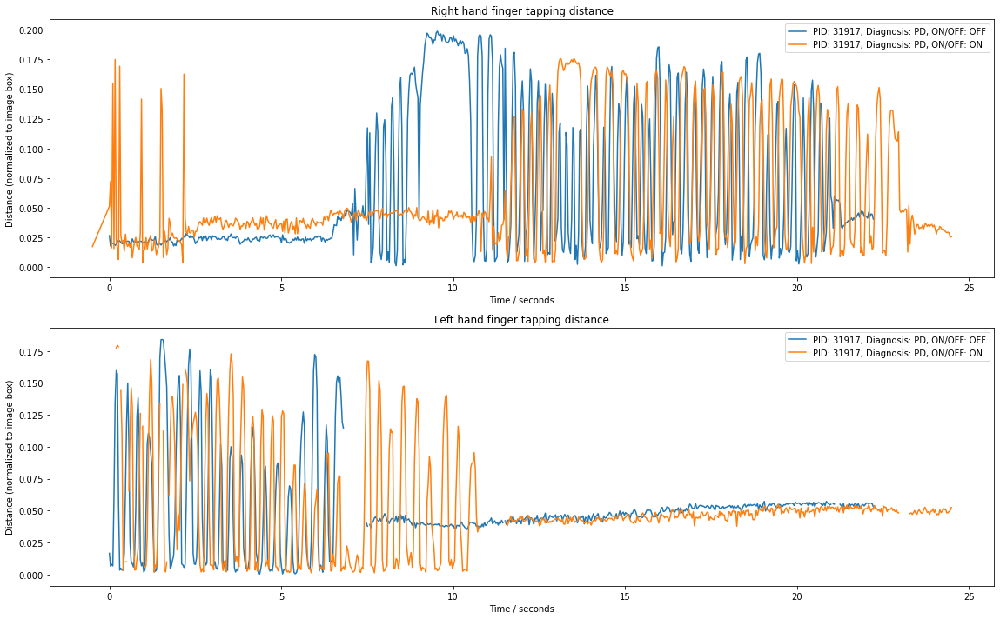

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))
ax1.set_title("Right hand finger tapping distance")
ax1.set_xlabel("Time / seconds")
ax1.set_ylabel("Distance (normalized to image box)")
ax2.set_title("Left hand finger tapping distance")
ax2.set_xlabel("Time / seconds")
ax2.set_ylabel("Distance (normalized to image box)")
fig.tight_layout()

for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  if pid != "31917":
    continue
  else:
    on_state = hand_files[i].split("_")[2]
    diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
    dist_right, dist_left, time = tapping_distance(df)
    ax1.plot(time / 1e6, dist_right, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax2.plot(time / 1e6, dist_left, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))

ax1.legend()
ax2.legend()
plt.show()

31937
26463
31892
25288
31937
21987
26463
31684
31249
22423
31875
30605
20756
30605
21987
25493
22423
15669
30185
31782
31917
20592
25587
32019
20452
15669
26135
31892
25493
30568
20592
30185
25587
31876
31876
20756
20190
31917
31710
32019
25288
31875
31249
31782
26135
31601
20190
20452


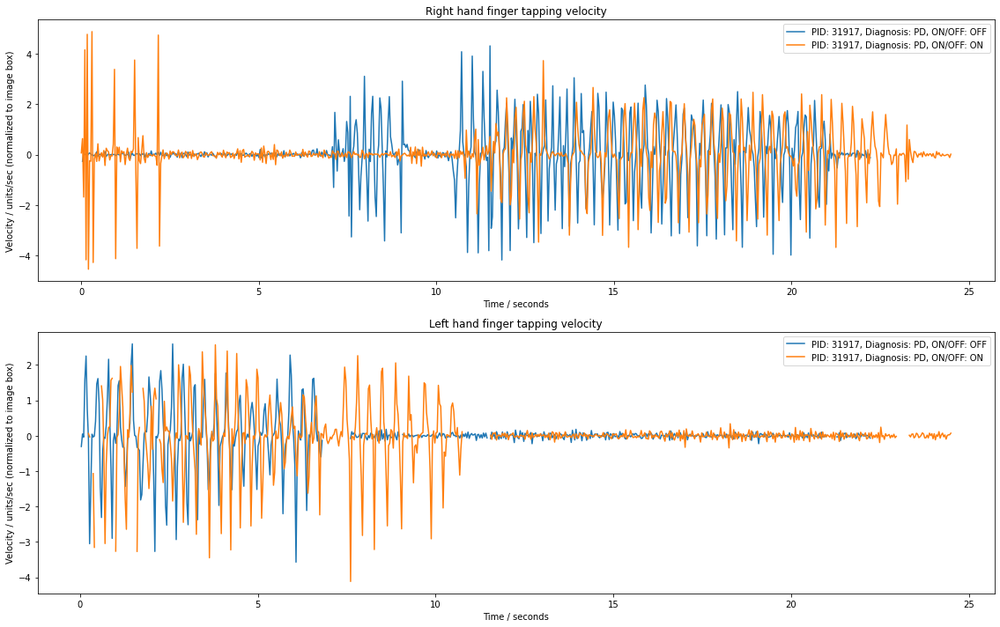

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))
ax1.set_title("Right hand finger tapping velocity")
ax1.set_xlabel("Time / seconds")
ax1.set_ylabel("Velocity / units/sec (normalized to image box)")
ax2.set_title("Left hand finger tapping velocity")
ax2.set_xlabel("Time / seconds")
ax2.set_ylabel("Velocity / units/sec (normalized to image box)")
fig.tight_layout()

for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  print(pid)
  diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
  if pid != "31917":
    continue
  else:
    dist_right, dist_left, time = tapping_distance(df)
    right_v, _ = tap_velocity(time, dist_right)
    left_v, _ = tap_velocity(time, dist_left)
    right_v *= 1e6
    left_v *= 1e6
    ax1.plot(time / 1e6, right_v, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax2.plot(time / 1e6, left_v, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))

ax1.legend()
ax2.legend()
plt.show()

## Tapping Distance Smoothing

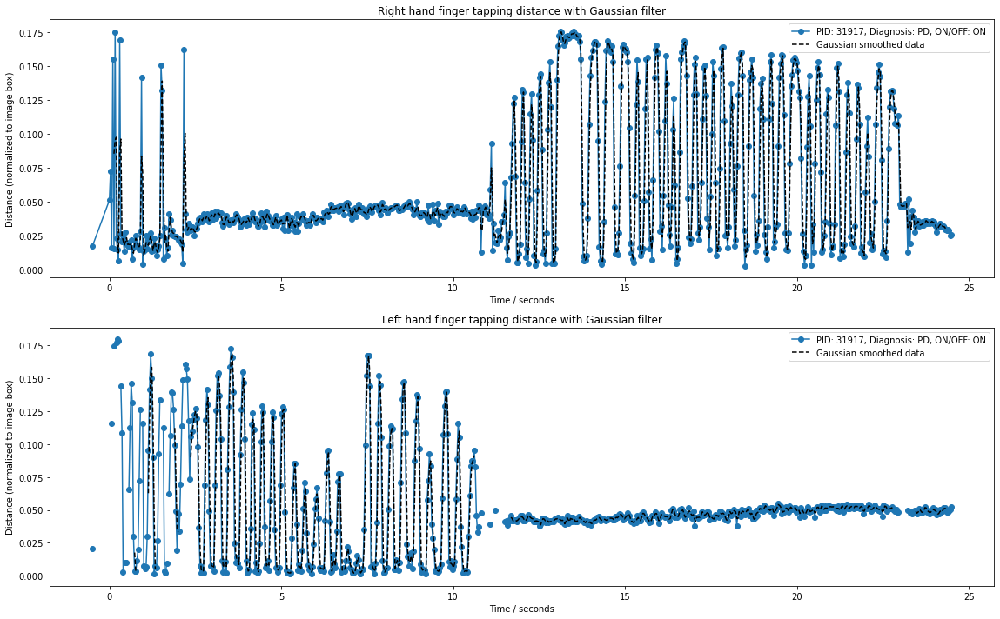

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))
ax1.set_title("Right hand finger tapping distance with Gaussian filter")
ax1.set_xlabel("Time / seconds")
ax1.set_ylabel("Distance (normalized to image box)")
ax2.set_title("Left hand finger tapping distance with Gaussian filter")
ax2.set_xlabel("Time / seconds")
ax2.set_ylabel("Distance (normalized to image box)")
fig.tight_layout()

for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
  if pid != "31917" or on_state != 'on':
    continue
  else:
    dist_right, dist_left, time = tapping_distance(df)
    dist_right_smooth = dist_right.rolling(window=10, win_type='gaussian', 
                                    center=True).mean(std=0.5)
    dist_left_smooth = dist_left.rolling(window=10, win_type='gaussian', 
                                    center=True).mean(std=0.5)
    ax1.plot(time / 1e6, dist_right, 'o-', 
             label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax1.plot(time / 1e6, dist_right_smooth, '--', color='black',
             label="Gaussian smoothed data")

    ax2.plot(time / 1e6, dist_left, 'o-',
             label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax2.plot(time / 1e6, dist_left_smooth, '--', color='black',
             label="Gaussian smoothed data")
ax1.legend()
ax2.legend()
plt.show()

TypeError: ignored

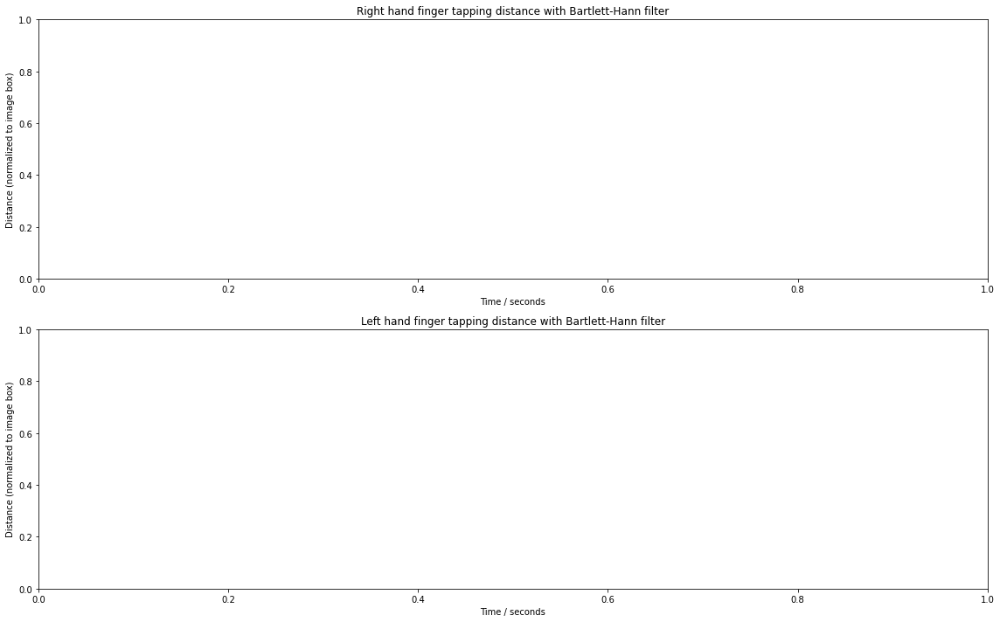

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))
ax1.set_title("Right hand finger tapping distance with Bartlett-Hann filter")
ax1.set_xlabel("Time / seconds")
ax1.set_ylabel("Distance (normalized to image box)")
ax2.set_title("Left hand finger tapping distance with Bartlett-Hann filter")
ax2.set_xlabel("Time / seconds")
ax2.set_ylabel("Distance (normalized to image box)")
fig.tight_layout()

for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
  if pid != "31917" or on_state != 'on':
    continue
  else:
    dist_right, dist_left, time = tapping_distance(df)
    dist_right_smooth = dist_right.rolling(window=8, win_type='barthann', 
                                    center=True).mean(std=0.5)
    dist_left_smooth = dist_left.rolling(window=8, win_type='barthann', 
                                    center=True).mean(std=0.5)
    ax1.plot(time / 1e6, dist_right, 'o-', 
             label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax1.plot(time / 1e6, dist_right_smooth, '--', color='black',
             label="Bartlett-Hann smoothed data")

    ax2.plot(time / 1e6, dist_left, 'o-',
             label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax2.plot(time / 1e6, dist_left_smooth, '--', color='black',
             label="Bartlett-Hann smoothed data")
ax1.legend()
ax2.legend()
plt.show()

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))
ax1.set_title(
    "Right hand finger tapping velocity with and without Bartlett-Hann smoothed distances")
ax1.set_xlabel("Time / seconds")
ax1.set_ylabel("Velocity / units/sec (normalized to image box)")
ax2.set_title(
    "Left hand finger tapping velocity with and without Bartlett-Hann smoothed distances")
ax2.set_xlabel("Time / seconds")
ax2.set_ylabel("Velocity / units/sec (normalized to image box)")
fig.tight_layout()

for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
  if pid != "31917" or on_state != 'on':
    continue
  else:
    dist_right, dist_left, time = tapping_distance(df)
    dist_right_smooth = dist_right.rolling(window=8, win_type='barthann', 
                                    center=True).mean(std=0.5)
    dist_left_smooth = dist_left.rolling(window=8, win_type='barthann', 
                                    center=True).mean(std=0.5)
    right_v, _ = tap_velocity(time, dist_right)
    left_v, _ = tap_velocity(time, dist_left)
    right_v_smooth, _ = tap_velocity(time, dist_right_smooth)
    left_v_smooth, _ = tap_velocity(time, dist_left_smooth)
    right_v *= 1e6
    left_v *= 1e6
    right_v_smooth *= 1e6
    left_v_smooth *= 1e6
    ax1.plot(time / 1e6, right_v, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax1.plot(time / 1e6, right_v_smooth, '--', color='black', label="With distance smoothing")
    ax2.plot(time / 1e6, left_v, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax2.plot(time / 1e6, left_v_smooth, '--', color='black', label="With distance smoothing")

ax1.legend()
ax2.legend()
plt.show()

## Tapping Distance Normalization Using Hand Area Estimation

In [ ]:
def hand_size(data):
  #Returns time series of right hand area, left hand area, as well as original
  #timestamps
  right_index_mcp_x = data["right_index_mcp:x"].to_numpy()
  right_index_mcp_y = data["right_index_mcp:y"].to_numpy()
  right_middle_mcp_x = data["right_middle_mcp:x"].to_numpy()
  right_middle_mcp_y = data["right_middle_mcp:y"].to_numpy()
  right_ring_mcp_x = data["right_ring_mcp:x"].to_numpy()
  right_ring_mcp_y = data["right_ring_mcp:y"].to_numpy()
  right_pinky_mcp_x = data["right_pinky_mcp:x"].to_numpy()
  right_pinky_mcp_y = data["right_pinky_mcp:y"].to_numpy()
  right_wrist_x = data["right_wrist:x"].to_numpy()
  right_wrist_y = data["right_wrist:y"].to_numpy()

  left_index_mcp_x = data["left_index_mcp:x"].to_numpy()
  left_index_mcp_y = data["left_index_mcp:y"].to_numpy()
  left_middle_mcp_x = data["left_middle_mcp:x"].to_numpy()
  left_middle_mcp_y = data["left_middle_mcp:y"].to_numpy()
  left_ring_mcp_x = data["left_ring_mcp:x"].to_numpy()
  left_ring_mcp_y = data["left_ring_mcp:y"].to_numpy()
  left_pinky_mcp_x = data["left_pinky_mcp:x"].to_numpy()
  left_pinky_mcp_y = data["left_pinky_mcp:y"].to_numpy()
  left_wrist_x = data["left_wrist:x"].to_numpy()
  left_wrist_y = data["left_wrist:y"].to_numpy()

  right_x = np.array([right_index_mcp_x, right_middle_mcp_x, right_ring_mcp_x, 
                      right_pinky_mcp_x, right_wrist_x])
  right_y = np.array([right_index_mcp_y, right_middle_mcp_y, right_ring_mcp_y, 
                      right_pinky_mcp_y, right_wrist_y])

  left_x = np.array([left_index_mcp_x, left_middle_mcp_x, left_ring_mcp_x, 
                     left_pinky_mcp_x, left_wrist_x])
  left_y = np.array([left_index_mcp_y, left_middle_mcp_y, left_ring_mcp_y, 
                     left_pinky_mcp_y, left_wrist_y])

  right_area = [0.5 * np.abs(np.dot(right_x[:, i], np.roll(right_y[:, i], 1)) - 
                             np.dot(right_y[:, i], np.roll(right_x[:, i], 1))) 
                             for i in range(right_x.shape[1])]

  left_area = [0.5 * np.abs(np.dot(left_x[:, i], np.roll(left_y[:, i], 1)) - 
                             np.dot(left_y[:, i], np.roll(left_x[:, i], 1))) 
                             for i in range(left_x.shape[1])]

  return right_area, left_area, data['timestamp']

In [ ]:
def normalized_tapping_distance(data):
  #Returns time series of distance between right_thumb_tip and right_index_tip and
  #time series of distance between left_thumb_tip and left_index_tip, normalized
  #by estimated hand area as well as original timestamps

  right_area, left_area, time = hand_size(data)
  dist_right, dist_left, _ = tapping_distance(data)

  area_estimate = max(max(right_area), max(left_area))
  norm_dist_right = dist_right / np.sqrt(area_estimate)
  norm_dist_left = dist_left / np.sqrt(area_estimate)

  return norm_dist_right, norm_dist_left, time

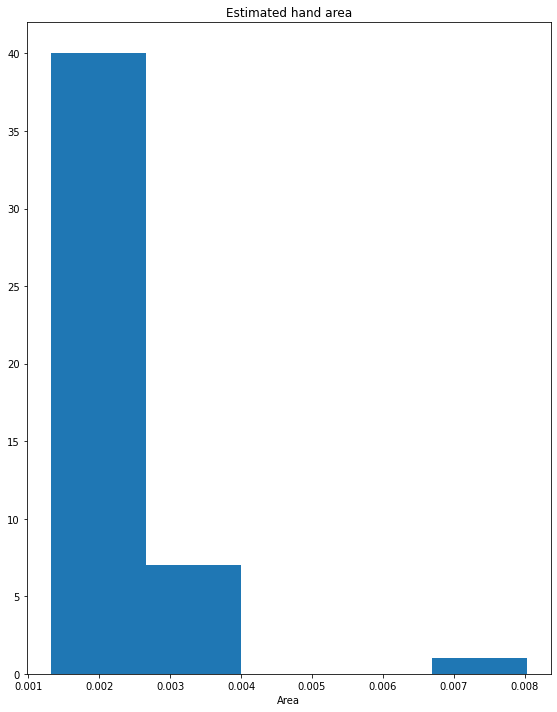

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(8, 10))
ax1.set_title(
    "Estimated hand area")
ax1.set_xlabel("Area")
fig.tight_layout()
areas = []

for i, df in enumerate(hand_data):
  right_area, left_area, time = hand_size(df)
  estimated_area = max(max(right_area), max(left_area))
  areas.append(estimated_area)

ax1.hist(areas, bins=5)
plt.show()

## Tapping Speed Amplitude Estimation

In [ ]:
def velocity_amplitude(time, velocity):
  #Returns velocity amplitude time series from normalized velocity time series.
  #Sends amplitudes < 15 normalized units / sec to 0 and interpolates values in-between.
  velocity_abs = np.abs(np.array(velocity))
  zero_idxs = [i for i in time.index if (i > 0 and i < len(time) - 1 and
                                        velocity_abs[i - 1] > velocity_abs[i] and
                                        velocity_abs[i + 1] > velocity_abs[i])]
  times = []
  amps = []
  for i in range(len(zero_idxs) - 1):
    z1, z2 = zero_idxs[i], zero_idxs[i + 1]
    max_val = np.nanmax(velocity_abs[z1:z2])
    if max_val > 15e-6:
      amps.append(max_val)
      times.append(time[np.where(velocity_abs == max_val)[0][0]])
  times = np.array(times)
  amps = np.array(amps)
  amps_final = []
  times_final = []
  if len(times) == 0:
    return np.zeros(len(time)), np.array(time)
  for j in np.array(time):
    if j < times[0]:
      times_final.append(j)
      amps_final.append(0)
  for j in np.array(time):
    if j >= times[0] and j <= times[-1]:
      times_final.append(j)
      if len(times[times == j]) != 0:
        amps_final.append(amps[times == j][0])
      else:
        lower_bound = times[times <= j].max()
        upper_bound = times[times >= j].min()
        if (upper_bound - lower_bound) / 1e6 > 1:
          amps_final.append(0)
        else:
          lower_amp = amps[times == lower_bound][0]
          upper_amp = amps[times == upper_bound][0]
          interpolated_amp = (upper_amp - lower_amp) / (upper_bound - lower_bound) * (j - lower_bound) + lower_amp
          amps_final.append(interpolated_amp)
  for j in np.array(time):
    if j > times[-1]:
      times_final.append(j)
      amps_final.append(0)
  return np.array(amps_final), np.array(times_final)

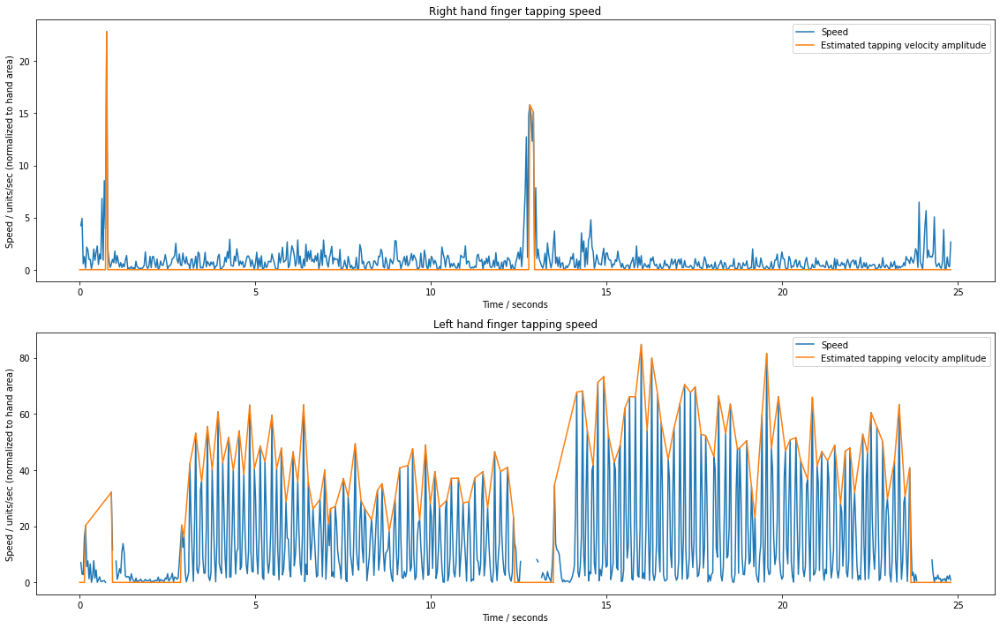

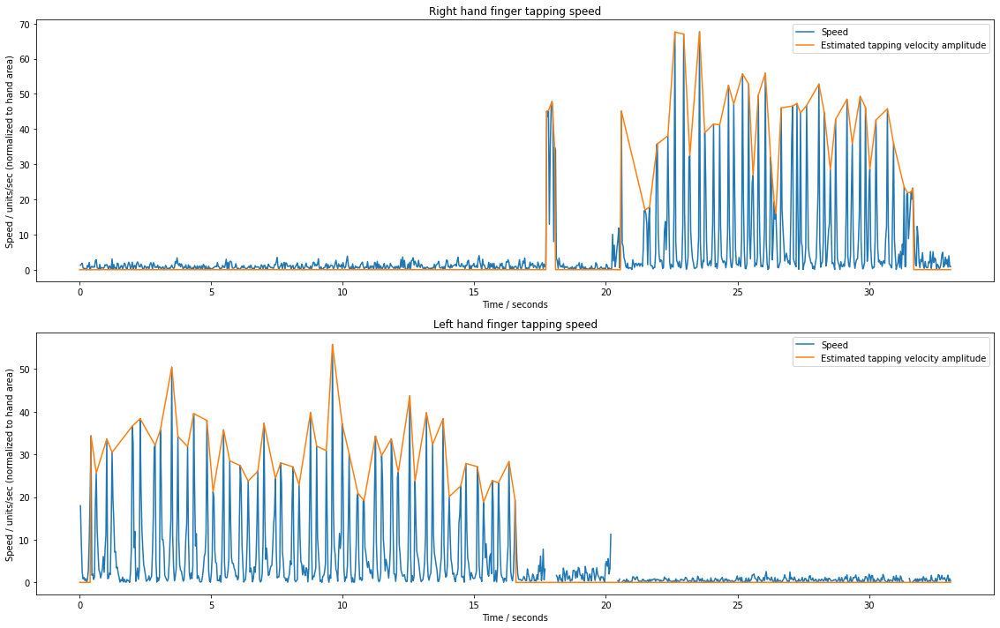

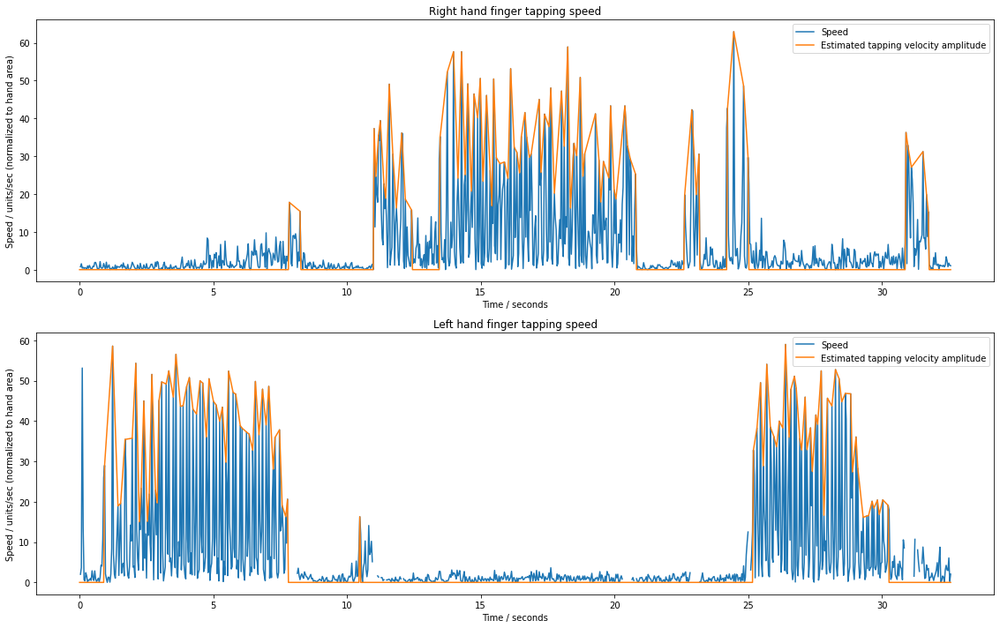

In [ ]:
for i in range(3):

  fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))
  ax1.set_title("Right hand finger tapping speed")
  ax1.set_xlabel("Time / seconds")
  ax1.set_ylabel("Speed / units/sec (normalized to hand area)")
  ax2.set_title("Left hand finger tapping speed")
  ax2.set_xlabel("Time / seconds")
  ax2.set_ylabel("Speed / units/sec (normalized to hand area)")
  fig.tight_layout()

  dist_right, dist_left, time = normalized_tapping_distance(hand_data[i])
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  right_amp, _ = velocity_amplitude(time, right_v)
  left_amp, _ = velocity_amplitude(time, left_v)

  ax1.plot(time / 1e6, np.abs(right_v) * 1e6, label="Speed")
  ax1.plot(time / 1e6, right_amp * 1e6, label="Estimated tapping velocity amplitude")
  ax2.plot(time / 1e6, np.abs(left_v) * 1e6, label="Speed")
  ax2.plot(time / 1e6, left_amp * 1e6, label="Estimated tapping velocity amplitude")
  ax1.legend()
  ax2.legend()

  plt.show()

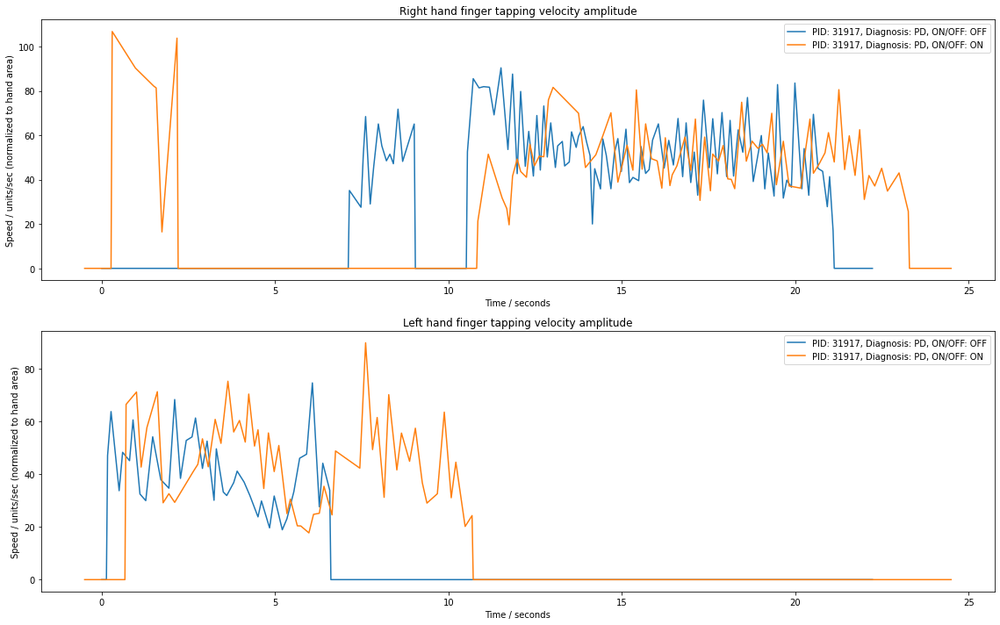

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))
ax1.set_title("Right hand finger tapping velocity amplitude")
ax1.set_xlabel("Time / seconds")
ax1.set_ylabel("Speed / units/sec (normalized to hand area)")
ax2.set_title("Left hand finger tapping velocity amplitude")
ax2.set_xlabel("Time / seconds")
ax2.set_ylabel("Speed / units/sec (normalized to hand area)")
fig.tight_layout()

for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
  if pid != "31917":
    continue
  else:
    dist_right, dist_left, time = normalized_tapping_distance(df)
    right_v, _ = tap_velocity(time, dist_right)
    left_v, _ = tap_velocity(time, dist_left)
    right_v_amp, _ = velocity_amplitude(time, right_v)
    left_v_amp, _ = velocity_amplitude(time, left_v)
    right_v_abs = np.abs(right_v)
    left_v_abs = np.abs(left_v)
    right_v_amp *= 1e6
    left_v_amp *= 1e6
    right_v_abs *= 1e6
    left_v_abs *= 1e6
    #ax1.plot(time / 1e6, right_v_abs, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        #pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    #ax2.plot(time / 1e6, left_v_abs, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        #pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax1.plot(time / 1e6, right_v_amp, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax2.plot(time / 1e6, left_v_amp, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))

ax1.legend()
ax2.legend()
plt.show()

## Good Segment Estimation

In [ ]:
def find_good_segments(data):
  #Returns list of 'good' segments from data, as Pandas dataframes. A segment
  #is considered good if the estimated hand area for either hand is above a 
  #specified threshold of (0.3 * max area), the tapping velocity amplitude for
  #either hand is above 15 normalized units / sec and the segment has a length 
  #of more than 3 seconds.
  right_area, left_area, time = hand_size(data)
  dist_right, dist_left, _ = normalized_tapping_distance(data)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  right_amps, _ = velocity_amplitude(time, right_v)
  left_amps, _ = velocity_amplitude(time, left_v)

  time = np.array(time)
  right_area, left_area = np.array(right_area), np.array(left_area)
  right_v, left_v = np.array(right_v), np.array(left_v)
  right_amps = np.array(right_amps)
  left_amps = np.array(left_amps)

  area_thresh = 0.3 * max(max(right_area), max(left_area))

  segments = [[]]
  for i, _ in enumerate(data.index):
    if max(right_area[i], left_area[i]) <= area_thresh or \
(right_amps[i] * 1e6 < 15 and left_amps[i] * 1e6 < 15):
      segments.append([])
    else:     
      segments[-1].append(time[i])
  good_segments = []
  for seg in segments:
    if len(seg) > 2 and (seg[-1] / 1e6 - seg[0] / 1e6) > 3:
      good_segments.append(seg)
  segment_dfs = []
  for seg in good_segments:
    df = data[data['timestamp'].isin(seg)]
    df = df.reset_index()
    segment_dfs.append(df)
  return segment_dfs

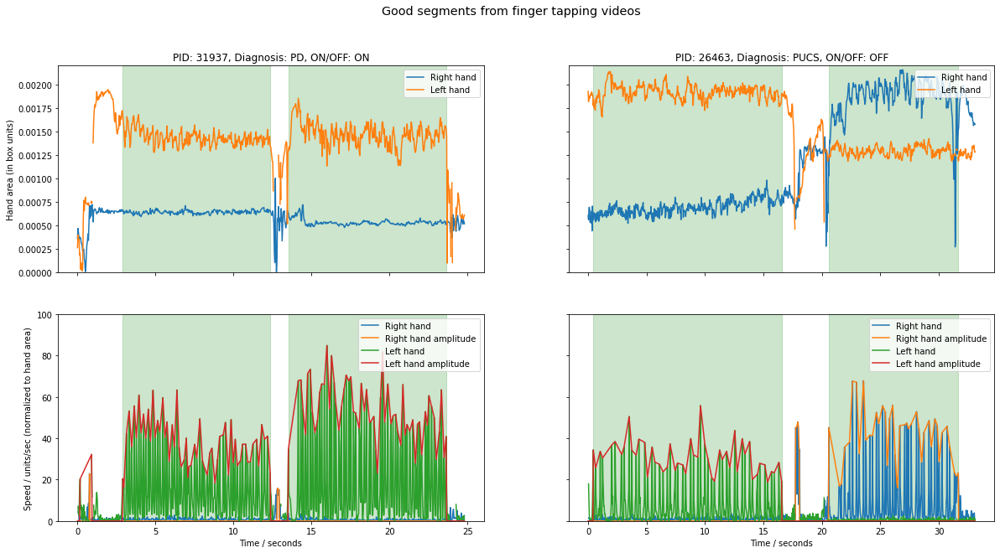

In [ ]:
fig, ax = plt.subplots(2, 2, sharey='row', sharex='col', figsize=(20, 10))

for i, df in enumerate(hand_data[:2]):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
  
  right_area, left_area, time = hand_size(df)
  dist_right, dist_left, _ = normalized_tapping_distance(df)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  right_v_amp, _ = velocity_amplitude(time, right_v)
  left_v_amp, _ = velocity_amplitude(time, left_v)
  right_v_abs = np.abs(right_v)
  left_v_abs = np.abs(left_v)
  right_v_amp *= 1e6
  left_v_amp *= 1e6
  right_v_abs *= 1e6
  left_v_abs *= 1e6
  good_segments = find_good_segments(df)

  curr_ax = ax[i // 2][i % 2]
  curr_ax.plot(time / 1e6, right_area, label='Right hand')
  curr_ax.plot(time / 1e6, left_area, label='Left hand')

  for seg in good_segments:
    t = np.array(seg['timestamp'])
    t_in, t_f = t[0] / 1e6, t[-1] / 1e6
    rect = patches.Rectangle((t_in, 0), (t_f - t_in), 22e-4, alpha=0.2, color='green')
    curr_ax.add_patch(rect)

  curr_ax.set_title("PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
  curr_ax.legend(loc='upper right')
  curr_ax.set_ylim(0, 22e-4)

  curr_ax = ax[i // 2 + 1][i % 2]
  curr_ax.plot(time / 1e6, right_v_abs, label='Right hand')
  curr_ax.plot(time / 1e6, right_v_amp, label='Right hand amplitude')
  curr_ax.plot(time / 1e6, left_v_abs, label='Left hand')
  curr_ax.plot(time / 1e6, left_v_amp, label='Left hand amplitude')

  for seg in good_segments:
    t = np.array(seg['timestamp'])
    t_in, t_f = t[0] / 1e6, t[-1] / 1e6
    rect = patches.Rectangle((t_in, 0), (t_f - t_in), 100, alpha=0.2, color='green')
    curr_ax.add_patch(rect)

  curr_ax.legend(loc='upper right')
  curr_ax.set_xlabel("Time / seconds")
  curr_ax.set_ylim(0, 100)

ax[0][0].set_ylabel("Hand area (in box units)")
ax[1][0].set_ylabel("Speed / units/sec (normalized to hand area)")

plt.suptitle("Good segments from finger tapping videos", fontsize='x-large')
plt.show()

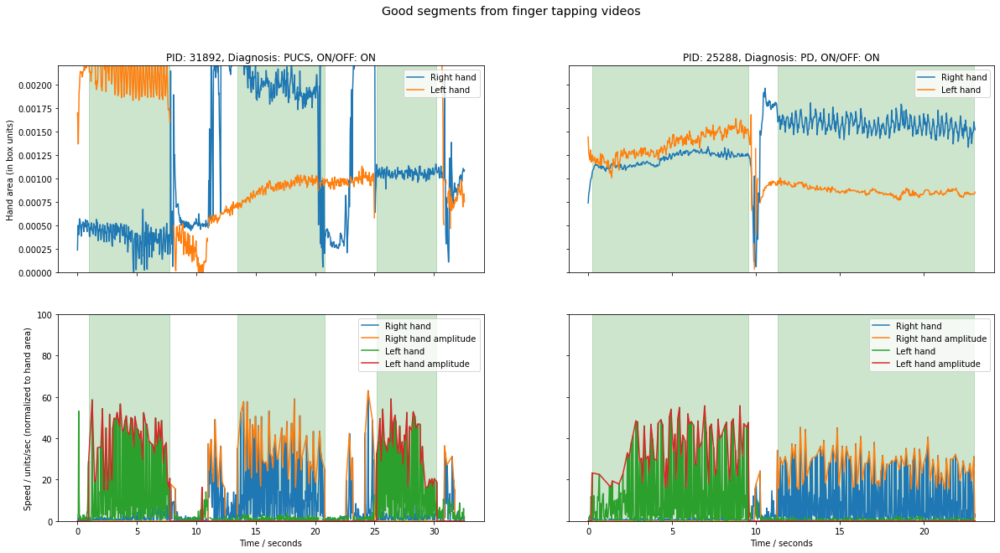

In [ ]:
fig, ax = plt.subplots(2, 2, sharey='row', sharex='col', figsize=(20, 10))

for i, df in enumerate(hand_data[2:4]):
  pid = hand_files[i + 2].split("_")[1]
  on_state = hand_files[i + 2].split("_")[2]
  diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
  
  right_area, left_area, time = hand_size(df)
  dist_right, dist_left, _ = normalized_tapping_distance(df)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  right_v_amp, _ = velocity_amplitude(time, right_v)
  left_v_amp, _ = velocity_amplitude(time, left_v)
  right_v_abs = np.abs(right_v)
  left_v_abs = np.abs(left_v)
  right_v_amp *= 1e6
  left_v_amp *= 1e6
  right_v_abs *= 1e6
  left_v_abs *= 1e6
  good_segments = find_good_segments(df)

  curr_ax = ax[i // 2][i % 2]
  curr_ax.plot(time / 1e6, right_area, label='Right hand')
  curr_ax.plot(time / 1e6, left_area, label='Left hand')

  for seg in good_segments:
    t = np.array(seg['timestamp'])
    t_in, t_f = t[0] / 1e6, t[-1] / 1e6
    rect = patches.Rectangle((t_in, 0), (t_f - t_in), 22e-4, alpha=0.2, color='green')
    curr_ax.add_patch(rect)

  curr_ax.set_title("PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
  curr_ax.legend(loc='upper right')
  curr_ax.set_ylim(0, 22e-4)

  curr_ax = ax[i // 2 + 1][i % 2]
  curr_ax.plot(time / 1e6, right_v_abs, label='Right hand')
  curr_ax.plot(time / 1e6, right_v_amp, label='Right hand amplitude')
  curr_ax.plot(time / 1e6, left_v_abs, label='Left hand')
  curr_ax.plot(time / 1e6, left_v_amp, label='Left hand amplitude')

  for seg in good_segments:
    t = np.array(seg['timestamp'])
    t_in, t_f = t[0] / 1e6, t[-1] / 1e6
    rect = patches.Rectangle((t_in, 0), (t_f - t_in), 100, alpha=0.2, color='green')
    curr_ax.add_patch(rect)

  curr_ax.legend(loc='upper right')
  curr_ax.set_xlabel("Time / seconds")
  curr_ax.set_ylim(0, 100)

ax[0][0].set_ylabel("Hand area (in box units)")
ax[1][0].set_ylabel("Speed / units/sec (normalized to hand area)")

plt.suptitle("Good segments from finger tapping videos", fontsize='x-large')
plt.show()

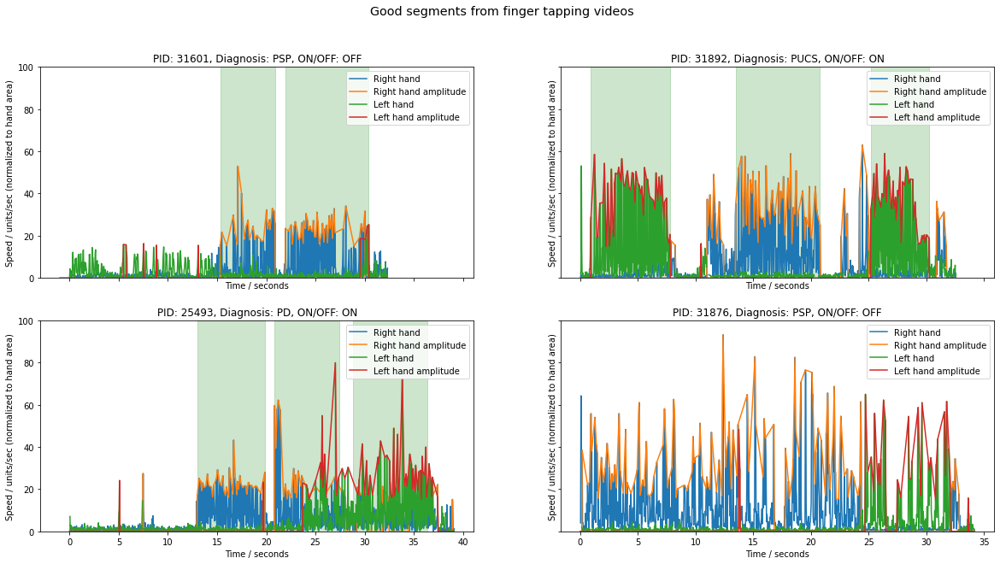

In [ ]:
fig, ax = plt.subplots(2, 2, sharey='row', sharex='col', figsize=(20, 10))
j = 0

for i in np.random.randint(0, len(hand_data), 4):
  df = hand_data[i]
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
  
  right_area, left_area, time = hand_size(df)
  dist_right, dist_left, _ = normalized_tapping_distance(df)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  right_v_amp, _ = velocity_amplitude(time, right_v)
  left_v_amp, _ = velocity_amplitude(time, left_v)
  right_v_abs = np.abs(right_v)
  left_v_abs = np.abs(left_v)
  right_v_amp *= 1e6
  left_v_amp *= 1e6
  right_v_abs *= 1e6
  left_v_abs *= 1e6
  good_segments = find_good_segments(df)

  curr_ax = ax[j // 2][j % 2]
  curr_ax.plot(time / 1e6, right_v_abs, label='Right hand')
  curr_ax.plot(time / 1e6, right_v_amp, label='Right hand amplitude')
  curr_ax.plot(time / 1e6, left_v_abs, label='Left hand')
  curr_ax.plot(time / 1e6, left_v_amp, label='Left hand amplitude')

  for seg in good_segments:
    t = np.array(seg['timestamp'])
    t_in, t_f = t[0] / 1e6, t[-1] / 1e6
    rect = patches.Rectangle((t_in, 0), (t_f - t_in), 100, alpha=0.2, color='green')
    curr_ax.add_patch(rect)

  curr_ax.legend(loc='upper right')
  curr_ax.set_xlabel("Time / seconds")
  curr_ax.set_ylim(0, 100)
  curr_ax.set_ylabel("Speed / units/sec (normalized to hand area)")
  curr_ax.set_title("PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
  curr_ax.legend(loc='upper right')

  j += 1

plt.suptitle("Good segments from finger tapping videos", fontsize='x-large')
plt.show()

## Validating Estimated Good Segments

In [ ]:
for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  if pid == "31917" and on_state == "on":
    good_segments_31917_on = find_good_segments(df)
  if pid == "31917" and on_state == "off":
    good_segments_31917_off = find_good_segments(df)

In [ ]:
diagnosis = pid_data[pid_data["pidn"] == 31917].iloc[0][1]
right_on_tapping_score = pid_data[pid_data["pidn"] == 31917]["updrs.on.3.4.rue"].iloc[0]
right_off_tapping_score = pid_data[pid_data["pidn"] == 31917]["updrs.off.3.4.rue"].iloc[0]
left_on_tapping_score = pid_data[pid_data["pidn"] == 31917]["updrs.on.3.4.lue"].iloc[0]
left_off_tapping_score = pid_data[pid_data["pidn"] == 31917]["updrs.off.3.4.lue"].iloc[0]

anims_on = []
for i, df in enumerate(good_segments_31917_on):
  anims_on.append(animate(df, "PID: 31917, Diagnosis: {}, ON/OFF: ON, Segment: {}, \n Right Hand Tapping Score: {}, Left Hand Tapping Score: {}".format(
      diagnosis, i + 1, right_on_tapping_score, left_on_tapping_score
  )))

anims_off = []
for i, df in enumerate(good_segments_31917_off):
  anims_off.append(animate(df, "PID: 31917, Diagnosis: {}, ON/OFF: OFF, Segment: {}, \n Right Hand Tapping Score: {}, Left Hand Tapping Score: {}".format(
      diagnosis, i + 1, right_off_tapping_score, left_off_tapping_score
  )))

rc('animation', html='jshtml')

NameError: ignored

In [ ]:
anims_on[0]

In [ ]:
anims_on[1]

In [ ]:
anims_off[0]

In [ ]:
anims_off[1]

In [ ]:
for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  if pid == "21987" and on_state == "on":
    good_segments_21987_on = find_good_segments(df)
  if pid == "21987" and on_state == "off":
    good_segments_21987_off = find_good_segments(df)

In [ ]:
diagnosis = pid_data[pid_data["pidn"] == 21987].iloc[0][1]
right_on_tapping_score = pid_data[pid_data["pidn"] == 21987]["updrs.on.3.4.rue"].iloc[0]
right_off_tapping_score = pid_data[pid_data["pidn"] == 21987]["updrs.off.3.4.rue"].iloc[0]
left_on_tapping_score = pid_data[pid_data["pidn"] == 21987]["updrs.on.3.4.lue"].iloc[0]
left_off_tapping_score = pid_data[pid_data["pidn"] == 21987]["updrs.off.3.4.lue"].iloc[0]

anims_on = []
for i, df in enumerate(good_segments_21987_on):
  anims_on.append(animate(df, "PID: 21987, Diagnosis: {}, ON/OFF: ON, Segment: {}, \n Right Hand Tapping Score: {}, Left Hand Tapping Score: {}".format(
      diagnosis, i + 1, right_on_tapping_score, left_on_tapping_score
  )))

anims_off = []
for i, df in enumerate(good_segments_21987_off):
  anims_off.append(animate(df, "PID: 21987, Diagnosis: {}, ON/OFF: OFF, Segment: {}, \n Right Hand Tapping Score: {}, Left Hand Tapping Score: {}".format(
      diagnosis, i + 1, right_off_tapping_score, left_off_tapping_score
  )))

rc('animation', html='jshtml')

In [ ]:
anims_on[0]

In [ ]:
anims_on[1]

In [ ]:
anims_off[0]

In [ ]:
anims_off[1]

In [ ]:
anims_off[2]

In [ ]:
anims_off[3]

In [ ]:
anims_off[4]

## Dataset Generation

In [ ]:
class Data:
  def __init__(self, data, pid, on_state, diagnosis, 
               part3_on_score, part3_off_score, 
               right_on_tapping_score, right_off_tapping_score,
               left_on_tapping_score, left_off_tapping_score,
               prominent_hand):
    self.data = data
    self.pid = pid
    self.on_state = on_state
    self.diagnosis = diagnosis
    self.part3_on_score = part3_on_score
    self.part3_off_score = part3_off_score
    self.right_on_tapping_score = right_on_tapping_score
    self.right_off_tapping_score = right_off_tapping_score
    self.left_on_tapping_score = left_on_tapping_score
    self.left_off_tapping_score = left_off_tapping_score
    self.prominent_hand = prominent_hand
    self.subsegs = []

In [ ]:
def generate_dataset(raw_data):
  dataset = []

  for i, df in enumerate(raw_data):
    pid = hand_files[i].split("_")[1]
    on_state = hand_files[i].split("_")[2]
    diagnosis = pid_data[pid_data["pidn"] == int(pid)]["conference.consensus.dx"].iloc[0]
    part3_on_score = pid_data[pid_data["pidn"] == int(pid)]["mds.updrs.3.on"].iloc[0]
    part3_off_score = pid_data[pid_data["pidn"] == int(pid)]["mds.updrs.3.off"].iloc[0]
    right_on_tapping_score = pid_data[pid_data["pidn"] == int(pid)]["updrs.on.3.4.rue"].iloc[0]
    right_off_tapping_score = pid_data[pid_data["pidn"] == int(pid)]["updrs.off.3.4.rue"].iloc[0]
    left_on_tapping_score = pid_data[pid_data["pidn"] == int(pid)]["updrs.on.3.4.lue"].iloc[0]
    left_off_tapping_score = pid_data[pid_data["pidn"] == int(pid)]["updrs.off.3.4.lue"].iloc[0]
    
    segments = find_good_segments(df)
    for seg in segments:
      dist_right, dist_left, time = normalized_tapping_distance(seg)
      right_v, _ = tap_velocity(time, dist_right)
      left_v, _ = tap_velocity(time, dist_left)
      right_amps, _ = velocity_amplitude(time, right_v)
      left_amps, _ = velocity_amplitude(time, left_v)

      time = np.array(time)
      right_amps = np.array(right_amps)
      left_amps = np.array(left_amps)
      n = len(right_amps)

      if sum(right_amps * 1e6 >= 15 * np.ones(n)) > 0.5 * n:
        dataset.append(Data(seg, pid, on_state, diagnosis, part3_on_score, part3_off_score,
                      right_on_tapping_score, right_off_tapping_score,
                      left_on_tapping_score, left_off_tapping_score,
                      "right"))
        append_subsegs(dataset[-1], np.asarray(right_v))
      elif sum(left_amps * 1e6 >= 15 * np.ones(n)) > 0.5 * n:
        dataset.append(Data(seg, pid, on_state, diagnosis, part3_on_score, part3_off_score,
                      right_on_tapping_score, right_off_tapping_score,
                      left_on_tapping_score, left_off_tapping_score,
                      "left"))
        append_subsegs(dataset[-1], np.asarray(left_v))
  return dataset

def append_subsegs(seg, v):
  for i in range(len(seg.data) // 100 + 1):
    subseg = seg.data[100 * i : 100 * (i + 1)]
    if sum(v[100 * i : 100 * (i + 1)] * 1e6 >= 15) >= 2 and len(subseg) == 100:
      seg.subsegs.append(Data(subseg.reset_index(), seg.pid, seg.on_state, seg.diagnosis,
                              seg.part3_on_score, seg.part3_off_score,
                              seg.right_on_tapping_score, seg.right_off_tapping_score,
                              seg.left_on_tapping_score, seg.left_off_tapping_score,
                              seg.prominent_hand))

In [ ]:
dataset = generate_dataset(hand_data)

In [ ]:
sample_data = dataset[np.random.randint(len(dataset))]
print("PID:", sample_data.pid)
print("Prominent hand:", sample_data.prominent_hand)
print("Diagnosis:", sample_data.diagnosis)
sample_data.data

print(len(dataset))

PID: 31249
Prominent hand: right
Diagnosis: PD
99


## Secondary Tapping Features

In [ ]:
def distance_amplitude(time, distance):
  #Returns distance amplitude time series from normalized distance time series.
  #Includes amplitudes > 1.3 * mean distance and interpolates values in-between.
  distance = np.array(distance)
  zero_idxs = [i for i in time.index if (i > 0 and i < len(time) - 1 and
                                        distance[i - 1] > distance[i] and
                                        distance[i + 1] > distance[i])]
  times = []
  amps = []
  for i in range(len(zero_idxs) - 1):
    z1, z2 = zero_idxs[i], zero_idxs[i + 1]
    max_val = np.nanmax(distance[z1:z2])
    if max_val > 1.2 * np.nanmean(distance):
      amps.append(max_val)
      times.append(time[np.where(distance == max_val)[0][0]])
  times = np.array(times)
  amps = np.array(amps)
  amps_final = []
  times_final = []
  if len(times) == 0:
    return np.zeros(len(time)), np.asarray(time)
  for i, j in enumerate(np.array(time)):
    if j < times[0]:
      times_final.append(j)
      if i == 0:
        amps_final.append(distance[i])
      else:
        amps_final.append(np.nanmean([distance[i], amps_final[-1]]))
  flag = 0
  for i, j in enumerate(np.array(time)):
    if j >= times[0] and j <= times[-1]:
      times_final.append(j)
      if len(times[times == j]) != 0:
        amps_final.append(amps[times == j][0])
      else:
        lower_bound = times[times <= j].max()
        upper_bound = times[times >= j].min()
        if (upper_bound - lower_bound) / 1e6 > 1:
          if flag == 0:
            amps_final.append(distance[i])
            flag = 1
          else:
            amps_final.append(np.nanmean([distance[i], amps_final[-1]]))
        else:
          lower_amp = amps[times == lower_bound][0]
          upper_amp = amps[times == upper_bound][0]
          interpolated_amp = (upper_amp - lower_amp) / (upper_bound - lower_bound) * (j - lower_bound) + lower_amp
          amps_final.append(interpolated_amp)
  flag = 0
  for i, j in enumerate(np.array(time)):
    if j > times[-1]:
      times_final.append(j)
      if flag == 0:
        amps_final.append(distance[i])
        flag = 1
      else:
        amps_final.append(np.nanmean([distance[i], amps_final[-1]]))
  return np.array(amps_final), np.array(times_final)

In [ ]:
def tapping_frequency(time, distance):
  #Returns tapping frequency time series from normalized tapping distance time 
  #series by estimating zero crossings and tapping regime.
  #Also returns mean tapping frequency.
  distance_amp, _ = distance_amplitude(time, distance)
  velocity_amp, _ = velocity_amplitude(time, tap_velocity(time, distance)[0])
  zero_idxs = [i for i in time.index if (velocity_amp[i] > 0 and 
                                        i > 0 and i < len(time) - 1 and
                                        distance[i - 1] > distance[i] and
                                        distance[i + 1] > distance[i])]
  zero_times = np.array(time)[zero_idxs]
  period = np.diff(zero_times)
  freq = np.ones(len(time)) * np.nan
  for i, t in enumerate(time):
    if t in zero_times[1:]:
      freq[i] = 1/period[zero_times[1:] == t]
  mean_freq = np.mean(1/period)
  return freq, mean_freq, time

In [ ]:
def tap_acceleration(time, velocity):
  #Return acceleration time series for right and left hand tapping, along with 
  #original timestamps
  time_diff = time.diff()
  velocity_diff = velocity.diff()
  acc = velocity_diff / time_diff
  return acc, time

In [ ]:
def movement_consistency(time, distance):
  #Returns array of inter-tap intervals and the coefficient of variation for it
  freq, mean_freq, _ = tapping_frequency(time, distance)
  intervals = 1/freq[~np.isnan(freq)]
  cv = scipy.stats.variation(intervals)
  return intervals, cv

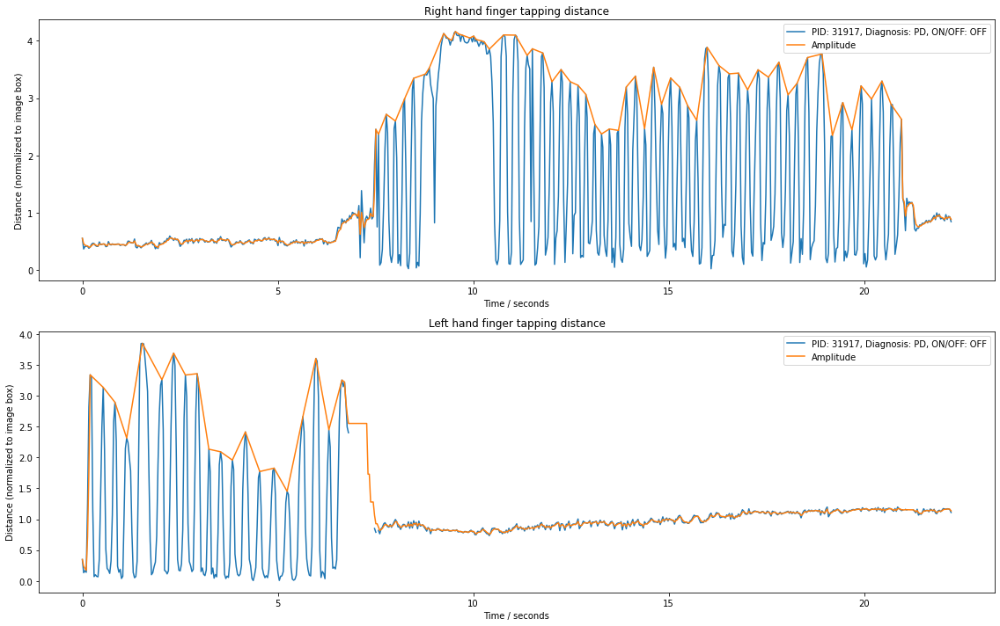

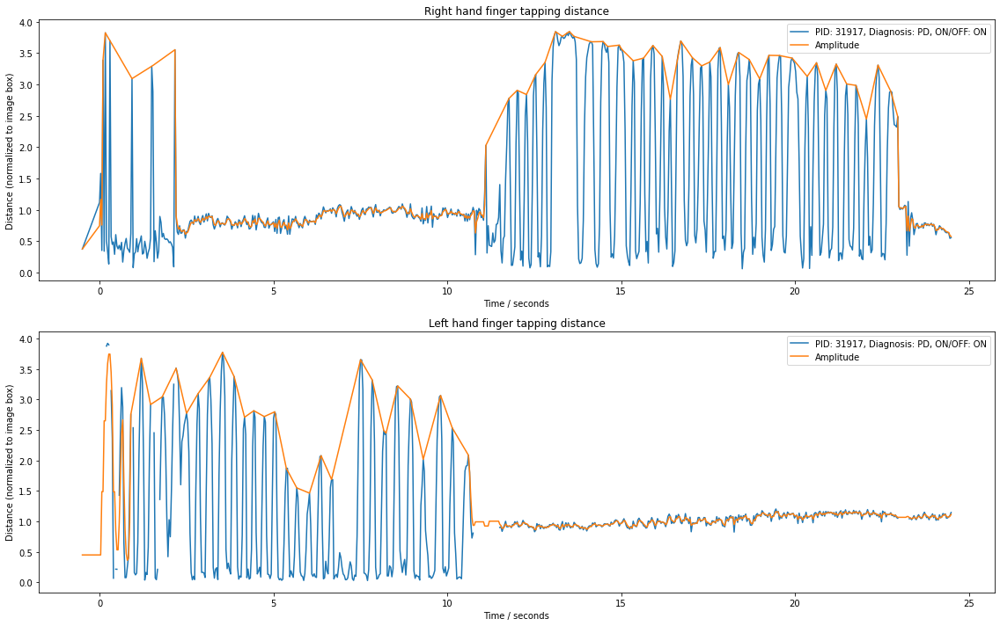

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))
ax1.set_title("Right hand finger tapping distance")
ax1.set_xlabel("Time / seconds")
ax1.set_ylabel("Distance (normalized to image box)")
ax2.set_title("Left hand finger tapping distance")
ax2.set_xlabel("Time / seconds")
ax2.set_ylabel("Distance (normalized to image box)")
fig.tight_layout()

for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  if pid != "31917" or on_state != "off":
    continue
  else:
    diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
    dist_right, dist_left, time = normalized_tapping_distance(df)
    dist_amp_right, _ = distance_amplitude(time, dist_right)
    dist_amp_left, _ = distance_amplitude(time, dist_left)
    ax1.plot(time / 1e6, dist_right, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax1.plot(time / 1e6, dist_amp_right, label="Amplitude")
    ax2.plot(time / 1e6, dist_left, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax2.plot(time / 1e6, dist_amp_left, label="Amplitude")

ax1.legend()
ax2.legend()
plt.show()

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))
ax1.set_title("Right hand finger tapping distance")
ax1.set_xlabel("Time / seconds")
ax1.set_ylabel("Distance (normalized to image box)")
ax2.set_title("Left hand finger tapping distance")
ax2.set_xlabel("Time / seconds")
ax2.set_ylabel("Distance (normalized to image box)")
fig.tight_layout()

for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  if pid != "31917" or on_state != "on":
    continue
  else:
    diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
    dist_right, dist_left, time = normalized_tapping_distance(df)
    dist_amp_right, _ = distance_amplitude(time, dist_right)
    dist_amp_left, _ = distance_amplitude(time, dist_left)
    ax1.plot(time / 1e6, dist_right, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax1.plot(time / 1e6, dist_amp_right, label="Amplitude")
    ax2.plot(time / 1e6, dist_left, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax2.plot(time / 1e6, dist_amp_left, label="Amplitude")

ax1.legend()
ax2.legend()
plt.show()

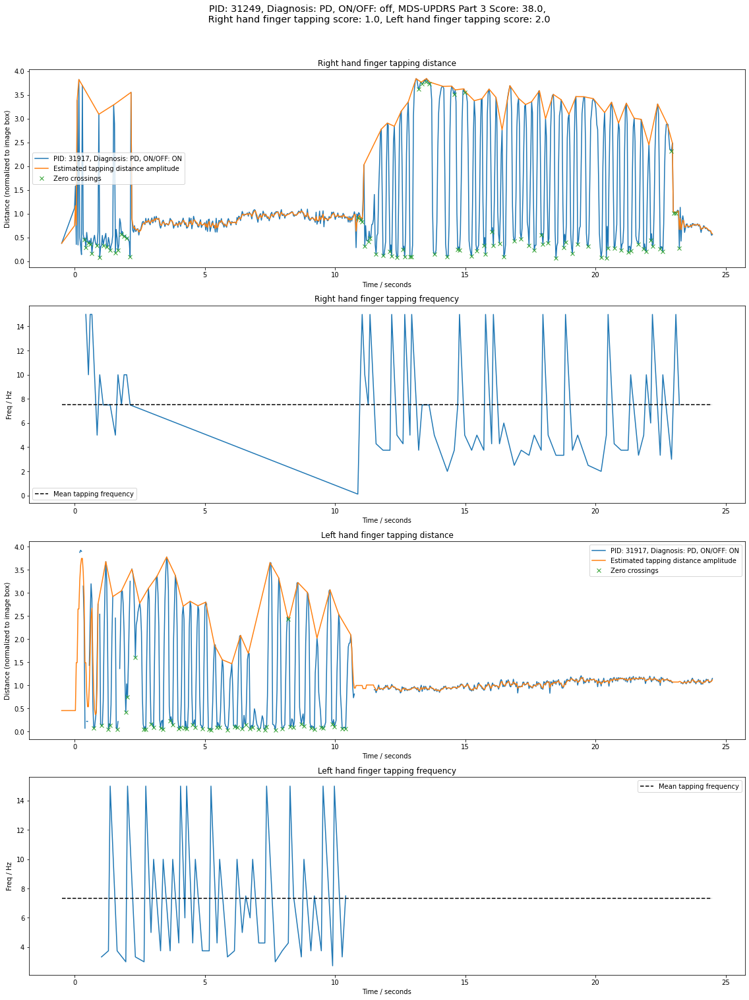

In [ ]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(16, 20))
ax1.set_title("Right hand finger tapping distance")
ax1.set_xlabel("Time / seconds")
ax1.set_ylabel("Distance (normalized to image box)")
ax2.set_title("Right hand finger tapping frequency")
ax2.set_xlabel("Time / seconds")
ax2.set_ylabel("Freq / Hz")
ax3.set_title("Left hand finger tapping distance")
ax3.set_xlabel("Time / seconds")
ax3.set_ylabel("Distance (normalized to image box)")
ax4.set_title("Left hand finger tapping frequency")
ax4.set_xlabel("Time / seconds")
ax4.set_ylabel("Freq / Hz")
fig.tight_layout()

for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  if pid == "31917" and on_state == "on":
    data_31917 = df
    break

dist_right, dist_left, time = normalized_tapping_distance(data_31917)
right_v, _ = tap_velocity(time, dist_right)
left_v, _ = tap_velocity(time, dist_left)
right_amp, _ = velocity_amplitude(time, right_v)
left_amp, _ = velocity_amplitude(time, left_v)
right_dist_amp, _ = distance_amplitude(time, dist_right)
left_dist_amp, _ = distance_amplitude(time, dist_left)
right_freq, mean_right_freq, _ = tapping_frequency(time, dist_right)
left_freq, mean_left_freq, _ = tapping_frequency(time, dist_left)

ax1.plot(time / 1e6, dist_right, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
ax1.plot(time / 1e6, right_dist_amp, label="Estimated tapping distance amplitude")
distance_amp, _ = distance_amplitude(time, dist_right)
zero_idxs = [i for i in time.index if (right_amp[i] > 0 and 
                                        i > 0 and i < len(time) - 1 and
                                        dist_right[i - 1] > dist_right[i] and
                                        dist_right[i + 1] > dist_right[i])]
zero_times = np.array(time)[zero_idxs]
ax1.plot(zero_times / 1e6, dist_right[time.isin(zero_times)], 'x', label="Zero crossings")
ax2.plot(time[~np.isnan(right_freq)] / 1e6, right_freq[~np.isnan(right_freq)] * 1e6, '-')
ax2.plot(time / 1e6, np.ones(time.shape) * mean_right_freq * 1e6, '--', 
         color='black', label="Mean tapping frequency")
ax3.plot(time / 1e6, dist_left, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
ax3.plot(time / 1e6, left_dist_amp, label="Estimated tapping distance amplitude")
distance_amp, _ = distance_amplitude(time, dist_left)
zero_idxs = [i for i in time.index if (left_amp[i] > 0 and 
                                        i > 0 and i < len(time) - 1 and
                                        dist_left[i - 1] > dist_left[i] and
                                        dist_left[i + 1] > dist_left[i])]
zero_times = np.array(time)[zero_idxs]
ax3.plot(zero_times / 1e6, dist_left[time.isin(zero_times)], 'x', label="Zero crossings")
ax4.plot(time[~np.isnan(left_freq)] / 1e6, left_freq[~np.isnan(left_freq)] * 1e6, '-')
ax4.plot(time / 1e6, np.ones(time.shape) * mean_left_freq * 1e6, '--', 
         color='black', label="Mean tapping frequency")
ax1.legend()
ax2.legend()
ax3.legend()
ax4.legend()

part3_score = {"on": sample_data.part3_on_score, 
               "off": sample_data.part3_off_score}[sample_data.on_state]
right_score = {"on": sample_data.right_on_tapping_score, 
               "off": sample_data.right_off_tapping_score}[sample_data.on_state]
left_score = {"on": sample_data.left_on_tapping_score, 
               "off": sample_data.left_off_tapping_score}[sample_data.on_state]
plt.suptitle("PID: {}, Diagnosis: {}, ON/OFF: {}, MDS-UPDRS Part 3 Score: {},\n Right hand finger tapping score: {}, Left hand finger tapping score: {}".format(
    sample_data.pid, sample_data.diagnosis, sample_data.on_state, part3_score, right_score, left_score
), fontsize='x-large', y=1.05)

plt.show()

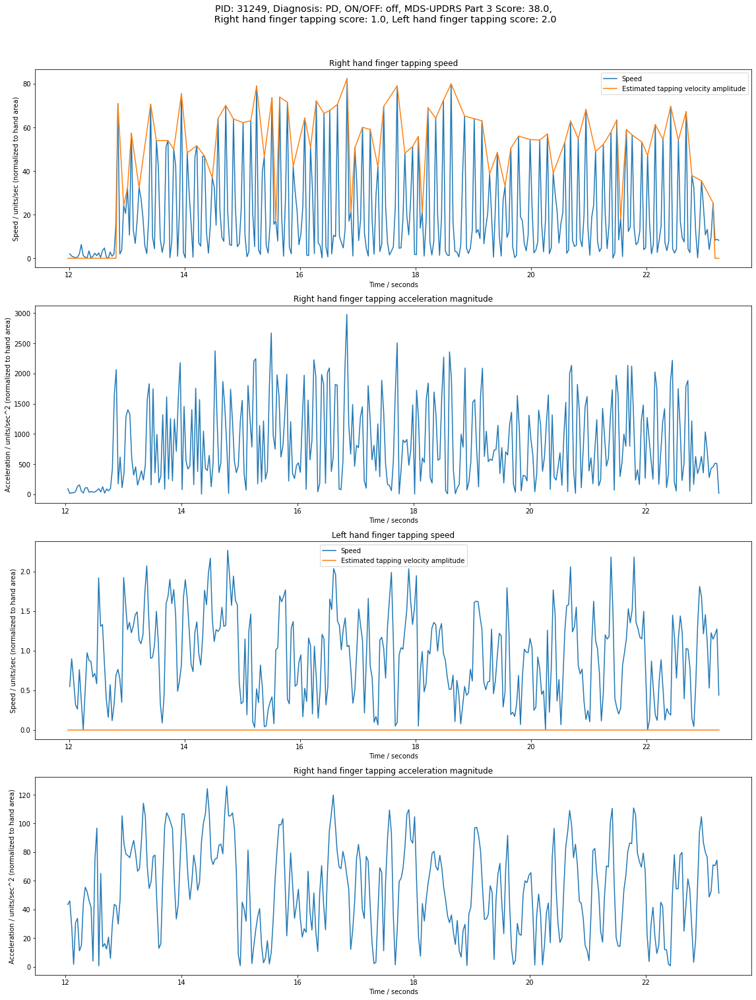

In [ ]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(16, 20))
ax1.set_title("Right hand finger tapping speed")
ax1.set_xlabel("Time / seconds")
ax1.set_ylabel("Speed / units/sec (normalized to hand area)")
ax2.set_title("Right hand finger tapping acceleration magnitude")
ax2.set_xlabel("Time / seconds")
ax2.set_ylabel("Acceleration / units/sec^2 (normalized to hand area)")
ax3.set_title("Left hand finger tapping speed")
ax3.set_xlabel("Time / seconds")
ax3.set_ylabel("Speed / units/sec (normalized to hand area)")
ax4.set_title("Right hand finger tapping acceleration magnitude")
ax4.set_xlabel("Time / seconds")
ax4.set_ylabel("Acceleration / units/sec^2 (normalized to hand area)")
fig.tight_layout()

dist_right, dist_left, time = normalized_tapping_distance(sample_data.data)
right_v,  _ = tap_velocity(time, dist_right)
left_v,  _ = tap_velocity(time, dist_left)
right_amp, _ = velocity_amplitude(time, right_v)
left_amp, _ = velocity_amplitude(time, left_v)
right_acc, _ = tap_acceleration(time, right_v)
left_acc, _ = tap_acceleration(time, left_v)

ax1.plot(time / 1e6, np.abs(right_v) * 1e6, label="Speed")
ax1.plot(time / 1e6, right_amp * 1e6, label="Estimated tapping velocity amplitude")
ax2.plot(time / 1e6, np.abs(right_acc) * 1e12)
ax3.plot(time / 1e6, np.abs(left_v) * 1e6, label="Speed")
ax3.plot(time / 1e6, left_amp * 1e6, label="Estimated tapping velocity amplitude")
ax4.plot(time / 1e6, np.abs(left_acc) * 1e12)
ax1.legend()
ax3.legend()

part3_score = {"on": sample_data.part3_on_score, 
               "off": sample_data.part3_off_score}[sample_data.on_state]
right_score = {"on": sample_data.right_on_tapping_score, 
               "off": sample_data.right_off_tapping_score}[sample_data.on_state]
left_score = {"on": sample_data.left_on_tapping_score, 
               "off": sample_data.left_off_tapping_score}[sample_data.on_state]
plt.suptitle("PID: {}, Diagnosis: {}, ON/OFF: {}, MDS-UPDRS Part 3 Score: {},\n Right hand finger tapping score: {}, Left hand finger tapping score: {}".format(
    sample_data.pid, sample_data.diagnosis, sample_data.on_state, part3_score, right_score, left_score
), fontsize='x-large', y=1.05)

plt.show()

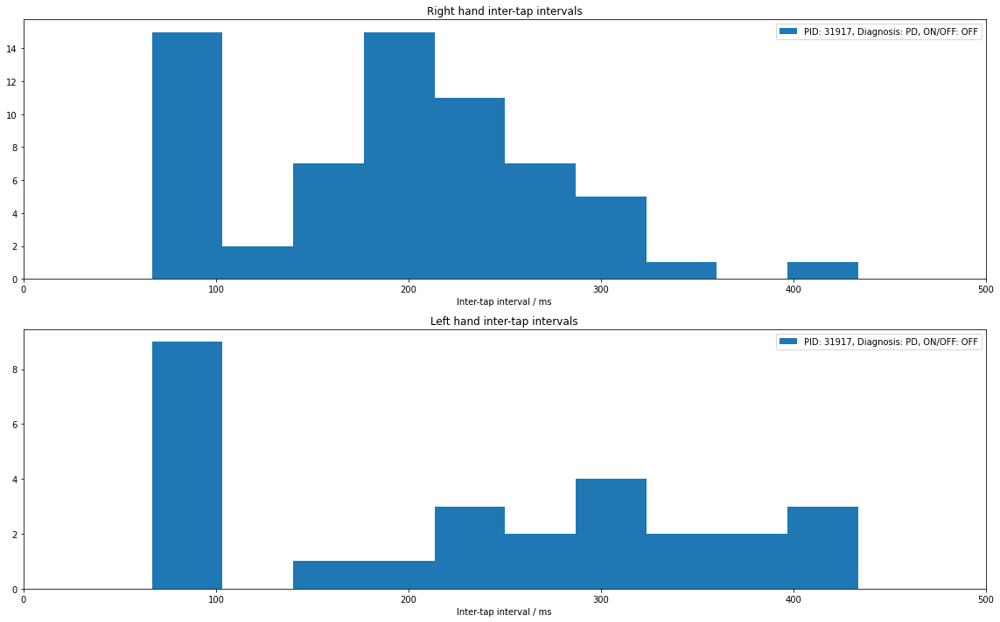

Right-hand inter-tap interval coefficient of variation:  0.8981522761939328
Left-hand inter-tap interval coefficient of variation:  0.5383739975110494


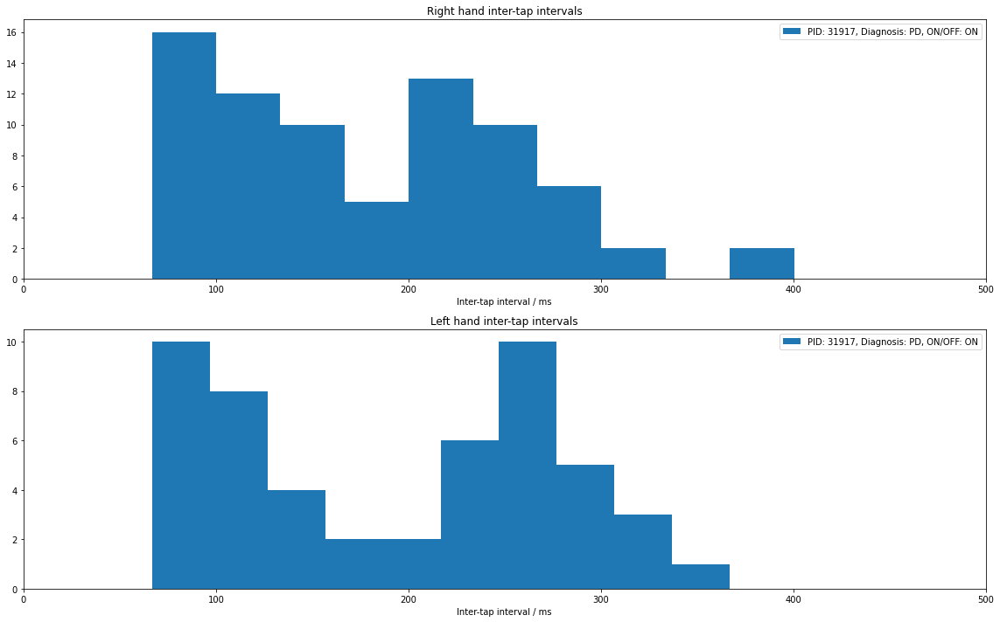

Right-hand inter-tap interval coefficient of variation:  3.326315175141965
Left-hand inter-tap interval coefficient of variation:  0.49801072112922373


In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))
ax1.set_title("Right hand inter-tap intervals")
ax1.set_xlabel("Inter-tap interval / ms")
ax2.set_title("Left hand inter-tap intervals")
ax2.set_xlabel("Inter-tap interval / ms")
fig.tight_layout()

for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  if pid != "31917" or on_state != "off":
    continue
  else:
    diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
    dist_right, dist_left, time = normalized_tapping_distance(df)
    right_v, _ = tap_velocity(time, dist_right)
    left_v, _ = tap_velocity(time, dist_left)
    right_intervals, right_cv = movement_consistency(time, dist_right)
    left_intervals, left_cv = movement_consistency(time, dist_left)
    right_intervals = right_intervals[right_intervals < 500 * 1e3]
    left_intervals = left_intervals[left_intervals < 500 * 1e3]
    ax1.hist(right_intervals / 1e3, bins=10, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax2.hist(left_intervals / 1e3, bins=10, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax1.set_xlim(0, 500)
    ax2.set_xlim(0, 500)

ax1.legend()
ax2.legend()
plt.show()

print("Right-hand inter-tap interval coefficient of variation: ", right_cv)
print("Left-hand inter-tap interval coefficient of variation: ", left_cv)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))
ax1.set_title("Right hand inter-tap intervals")
ax1.set_xlabel("Inter-tap interval / ms")
ax2.set_title("Left hand inter-tap intervals")
ax2.set_xlabel("Inter-tap interval / ms")
fig.tight_layout()

for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  if pid != "31917" or on_state != "on":
    continue
  else:
    diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
    dist_right, dist_left, time = normalized_tapping_distance(df)
    right_v, _ = tap_velocity(time, dist_right)
    left_v, _ = tap_velocity(time, dist_left)
    right_intervals, right_cv = movement_consistency(time, dist_right)
    left_intervals, left_cv = movement_consistency(time, dist_left)
    right_intervals = right_intervals[right_intervals < 500 * 1e3]
    left_intervals = left_intervals[left_intervals < 500 * 1e3]
    ax1.hist(right_intervals / 1e3, bins=10, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax2.hist(left_intervals / 1e3, bins=10, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax1.set_xlim(0, 500)
    ax2.set_xlim(0, 500)

ax1.legend()
ax2.legend()
plt.show()

print("Right-hand inter-tap interval coefficient of variation: ", right_cv)
print("Left-hand inter-tap interval coefficient of variation: ", left_cv)

## Fourier Features

In [ ]:
def fourier_transform(time, signal):
  #transforms time-domain signal to frequency-domain spectrum
  sample_period = np.mean(np.diff(np.asarray(time)))
  sample_period /= 1e6
  if len(signal[~np.isnan(signal)]) == 0:
    return np.zeros(1), np.zeros(1)
  signal = np.interp(time, time[~np.isnan(signal)], signal[~np.isnan(signal)])
  spectrum = np.fft.rfft(signal)
  freq = np.fft.rfftfreq(len(time), sample_period)
  return np.abs(spectrum), freq

In [ ]:
def psd(time, signal):
  #transforms time-domain signal to power spectrum density
  from scipy.signal import welch
  sample_period = np.mean(np.diff(np.asarray(time)))
  sample_period /= 1e6
  if len(signal[~np.isnan(signal)]) == 0:
    return np.zeros(1), np.zeros(1)
  signal = np.interp(time, time[~np.isnan(signal)], signal[~np.isnan(signal)])
  freq, spectrum = welch(signal, nperseg=512, fs=1 / sample_period)
  return spectrum, freq

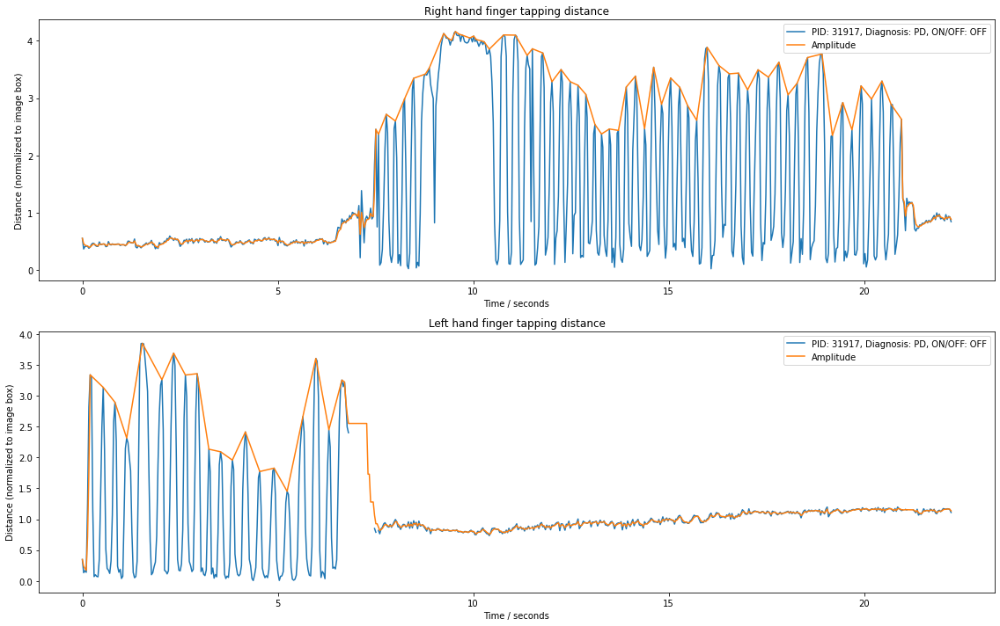

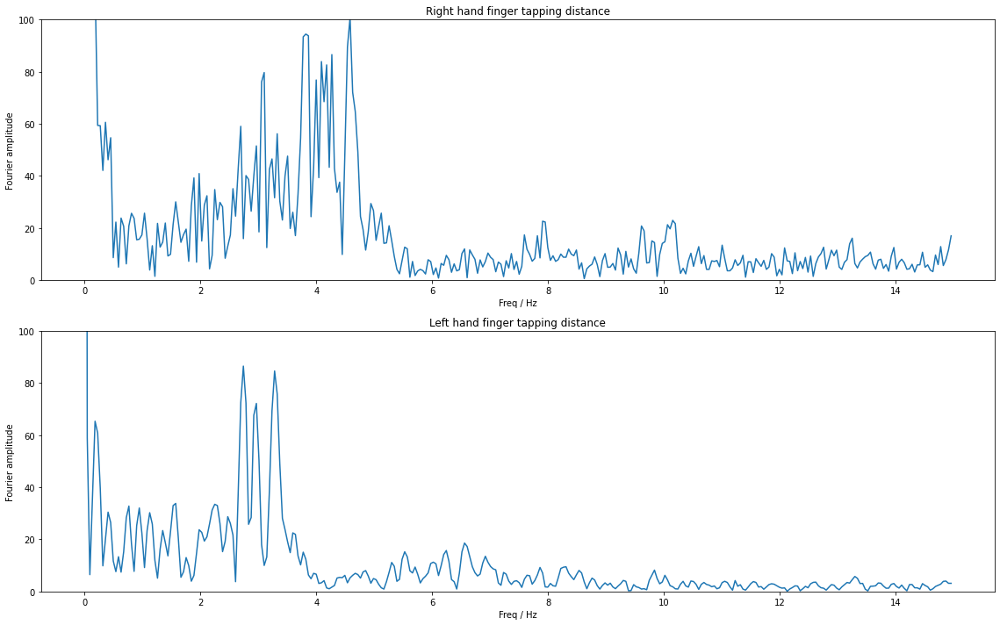

2.4661811869415318
0.4076476294959153


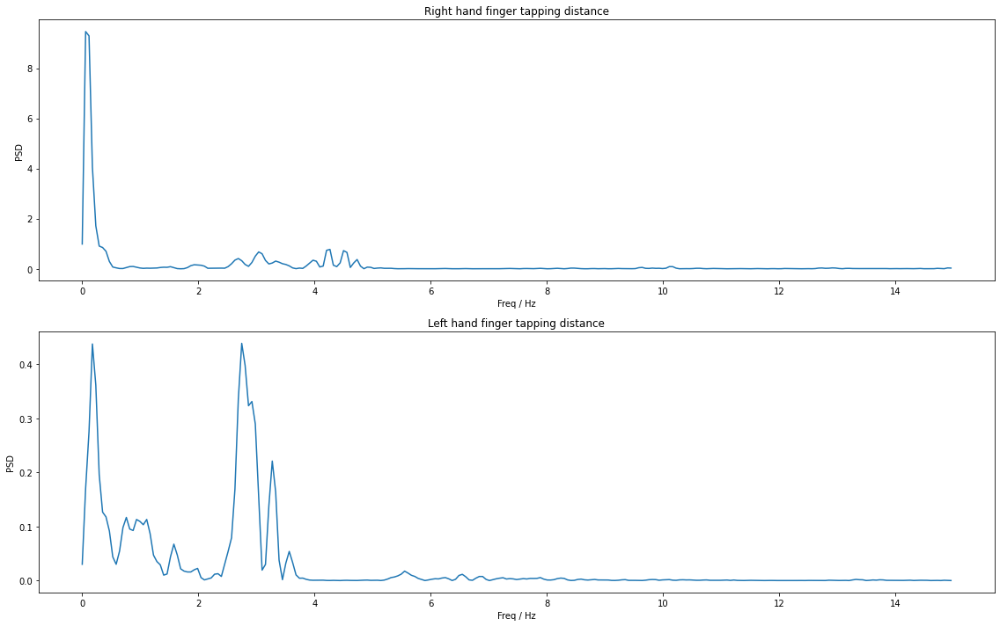

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))
ax1.set_title("Right hand finger tapping distance")
ax1.set_xlabel("Time / seconds")
ax1.set_ylabel("Distance (normalized to image box)")
ax2.set_title("Left hand finger tapping distance")
ax2.set_xlabel("Time / seconds")
ax2.set_ylabel("Distance (normalized to image box)")
fig.tight_layout()

for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  if pid != "31917" or on_state != "off":
    continue
  else:
    diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
    dist_right, dist_left, time = normalized_tapping_distance(df)
    dist_amp_right, _ = distance_amplitude(time, dist_right)
    dist_amp_left, _ = distance_amplitude(time, dist_left)
    ax1.plot(time / 1e6, dist_right, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax1.plot(time / 1e6, dist_amp_right, label="Amplitude")
    ax2.plot(time / 1e6, dist_left, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax2.plot(time / 1e6, dist_amp_left, label="Amplitude")

ax1.legend()
ax2.legend()
plt.show()

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))
ax1.set_title("Right hand finger tapping distance")
ax1.set_xlabel("Freq / Hz")
ax1.set_ylabel("Fourier amplitude")
ax2.set_title("Left hand finger tapping distance")
ax2.set_xlabel("Freq / Hz")
ax2.set_ylabel("Fourier amplitude")
fig.tight_layout()

for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  if pid != "31917" or on_state != "off":
    continue
  else:
    diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
    dist_right, dist_left, time = normalized_tapping_distance(df)
    spectrum_right, ffreq_right = fourier_transform(time, dist_right) 
    spectrum_left, ffreq_left = fourier_transform(time, dist_left) 
    ax1.plot(ffreq_right, spectrum_right)
    ax2.plot(ffreq_left, spectrum_left)

ax1.set_ylim(0, 100)
ax2.set_ylim(0, 100)
plt.show()

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))
ax1.set_title("Right hand finger tapping distance")
ax1.set_xlabel("Freq / Hz")
ax1.set_ylabel("PSD")
ax2.set_title("Left hand finger tapping distance")
ax2.set_xlabel("Freq / Hz")
ax2.set_ylabel("PSD")
fig.tight_layout()

for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  if pid != "31917" or on_state != "off":
    continue
  else:
    diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
    dist_right, dist_left, time = normalized_tapping_distance(df)
    spectrum_right, ffreq_right = psd(time, dist_right) 
    spectrum_left, ffreq_left = psd(time, dist_left) 
    ax1.plot(ffreq_right, spectrum_right)
    print(np.trapz(spectrum_right, ffreq_right))
    ax2.plot(ffreq_left, spectrum_left)
    print(np.trapz(spectrum_left, ffreq_left))
plt.show()

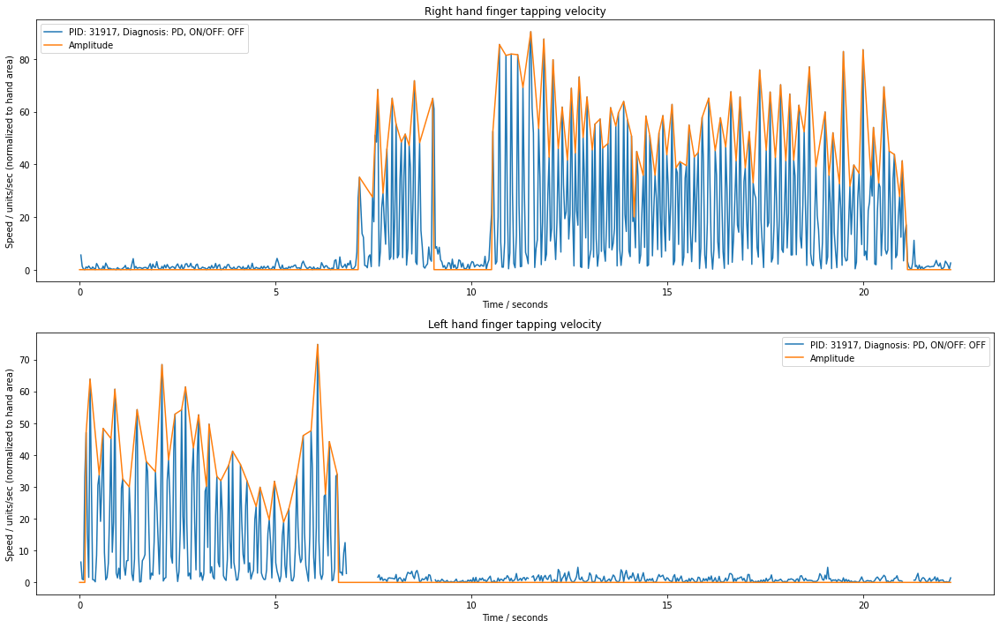

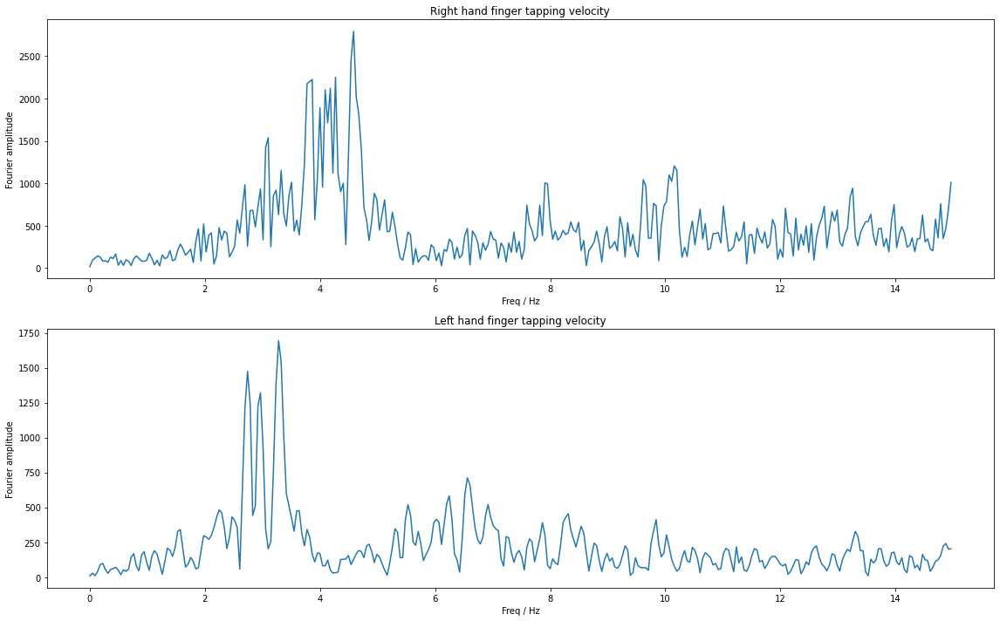

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))
ax1.set_title("Right hand finger tapping velocity")
ax1.set_xlabel("Time / seconds")
ax1.set_ylabel("Speed / units/sec (normalized to hand area)")
ax2.set_title("Left hand finger tapping velocity")
ax2.set_xlabel("Time / seconds")
ax2.set_ylabel("Speed / units/sec (normalized to hand area)")
fig.tight_layout()

for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  if pid != "31917" or on_state != "off":
    continue
  else:
    diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
    dist_right, dist_left, time = normalized_tapping_distance(df)
    right_v, _ = tap_velocity(time, dist_right)
    left_v, _ = tap_velocity(time, dist_left)
    right_v_amp, _ = velocity_amplitude(time, right_v)
    left_v_amp, _ = velocity_amplitude(time, left_v)
    ax1.plot(time / 1e6, np.abs(right_v) * 1e6, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax1.plot(time / 1e6, right_v_amp * 1e6, label="Amplitude")
    ax2.plot(time / 1e6, np.abs(left_v) * 1e6, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax2.plot(time / 1e6, left_v_amp * 1e6, label="Amplitude")

ax1.legend()
ax2.legend()
plt.show()

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))
ax1.set_title("Right hand finger tapping velocity")
ax1.set_xlabel("Freq / Hz")
ax1.set_ylabel("Fourier amplitude")
ax2.set_title("Left hand finger tapping velocity")
ax2.set_xlabel("Freq / Hz")
ax2.set_ylabel("Fourier amplitude")
fig.tight_layout()

for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  if pid != "31917" or on_state != "off":
    continue
  else:
    diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
    dist_right, dist_left, time = normalized_tapping_distance(df)
    right_v, _ = tap_velocity(time, dist_right)
    left_v, _ = tap_velocity(time, dist_left)
    spectrum_right, ffreq_right = fourier_transform(time, right_v * 1e6) 
    spectrum_left, ffreq_left = fourier_transform(time, left_v * 1e6) 
    ax1.plot(ffreq_right, spectrum_right)
    ax2.plot(ffreq_left, spectrum_left)
    
plt.show()

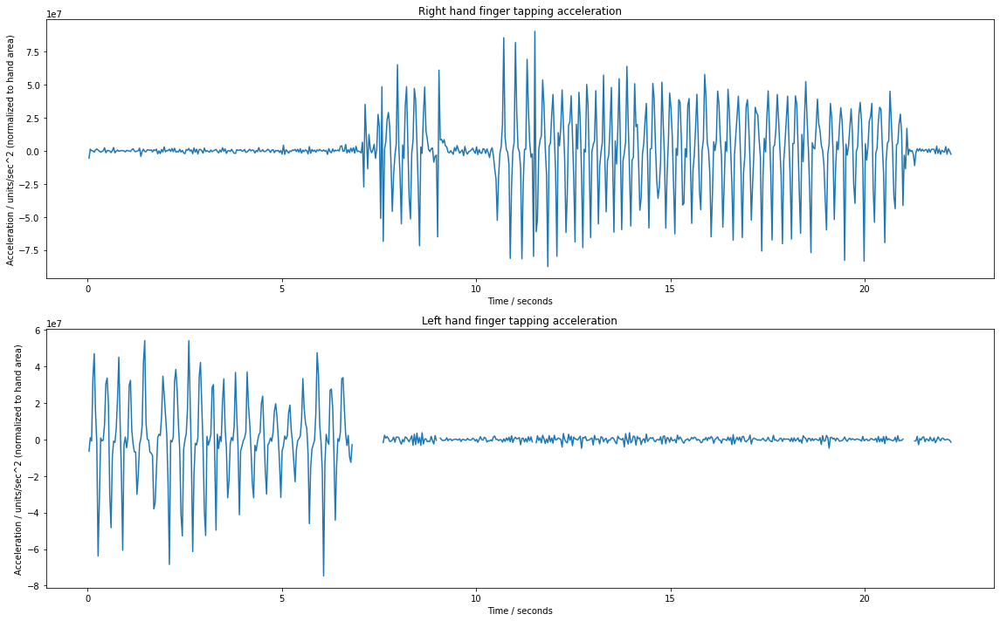

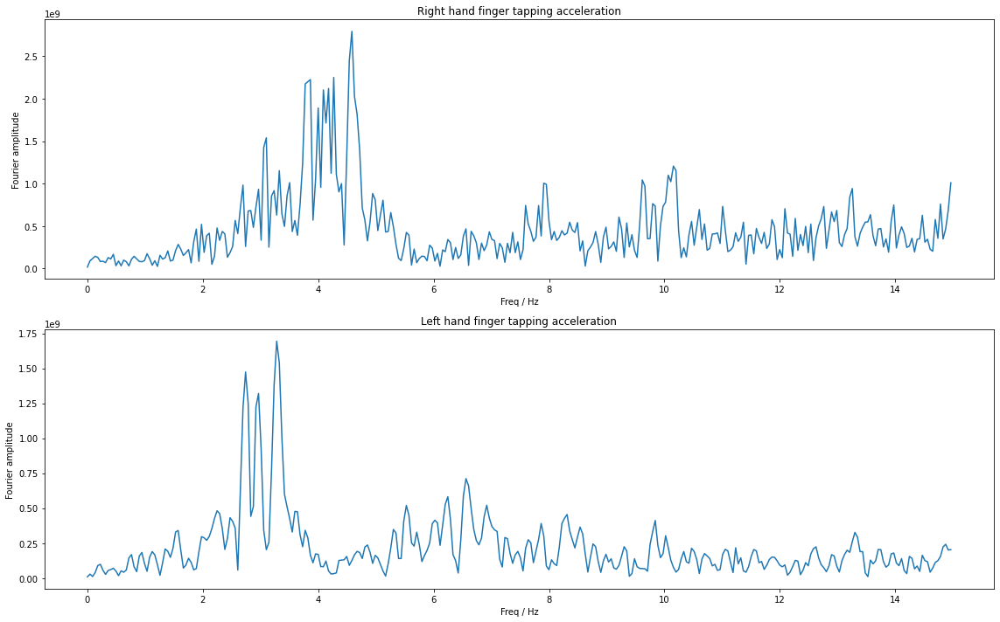

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))
ax1.set_title("Right hand finger tapping acceleration")
ax1.set_xlabel("Time / seconds")
ax1.set_ylabel("Acceleration / units/sec^2 (normalized to hand area)")
ax2.set_title("Left hand finger tapping acceleration")
ax2.set_xlabel("Time / seconds")
ax2.set_ylabel("Acceleration / units/sec^2 (normalized to hand area)")
fig.tight_layout()

for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  if pid != "31917" or on_state != "off":
    continue
  else:
    diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
    dist_right, dist_left, time = normalized_tapping_distance(df)
    right_a, _ = tap_acceleration(time, dist_right)
    left_a, _ = tap_acceleration(time, dist_left)
    ax1.plot(time / 1e6, right_a * 1e12, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))
    ax2.plot(time / 1e6, left_a * 1e12, label="PID: {}, Diagnosis: {}, ON/OFF: {}".format(
        pid, diagnosis, {"on": "ON", "off": "OFF"}[on_state]))

plt.show()

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))
ax1.set_title("Right hand finger tapping acceleration")
ax1.set_xlabel("Freq / Hz")
ax1.set_ylabel("Fourier amplitude")
ax2.set_title("Left hand finger tapping acceleration")
ax2.set_xlabel("Freq / Hz")
ax2.set_ylabel("Fourier amplitude")
fig.tight_layout()

for i, df in enumerate(hand_data):
  pid = hand_files[i].split("_")[1]
  on_state = hand_files[i].split("_")[2]
  if pid != "31917" or on_state != "off":
    continue
  else:
    diagnosis = pid_data[pid_data["pidn"] == int(pid)].iloc[0][1]
    dist_right, dist_left, time = normalized_tapping_distance(df)
    right_a, _ = tap_acceleration(time, dist_right)
    left_a, _ = tap_acceleration(time, dist_left)
    spectrum_right, ffreq_right = fourier_transform(time, right_a * 1e12) 
    spectrum_left, ffreq_left = fourier_transform(time, left_a * 1e12) 
    ax1.plot(ffreq_right, spectrum_right)
    ax2.plot(ffreq_left, spectrum_left)

plt.show()

## Feature Visualization

In [ ]:
def get_features(sample):
  dist_right, dist_left, time = normalized_tapping_distance(sample.data)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  right_acc, _ = tap_acceleration(time, right_v)
  left_acc, _ = tap_acceleration(time, left_v)
  right_freq, _, _ = tapping_frequency(time, dist_right)
  left_freq, _, _ = tapping_frequency(time, dist_right)
  dist_right_spectrum, freq = fourier_transform(time, np.asarray(dist_right))
  dist_left_spectrum, _ = fourier_transform(time, np.asarray(dist_left))
  right_v_spectrum, _ = fourier_transform(time, np.asarray(right_v))
  left_v_spectrum, _ = fourier_transform(time, np.asarray(left_v))
  right_acc_spectrum, _ = fourier_transform(time, np.asarray(right_acc))
  left_acc_spectrum, _ = fourier_transform(time, np.asarray(left_acc))
  _, right_cv = movement_consistency(time, dist_right)
  _, left_cv = movement_consistency(time, dist_left)

  return (time, dist_right, dist_left, right_v, left_v, right_acc, left_acc, 
          right_freq, left_freq, freq, dist_right_spectrum, dist_left_spectrum,
          right_v_spectrum, left_v_spectrum, right_acc_spectrum, 
          left_acc_spectrum, right_cv, left_cv)

In [ ]:
import seaborn as sns

def skeleton_frame(data, idx, frame):
    fig = plt.figure(figsize=(10, 8))
    ax_hands = plt.gca()
    ax_hands.set_xlim(0, 1)
    ax_hands.set_ylim(0, 1)
    ax_hands.invert_yaxis()
    ax_hands.xaxis.set_visible(False)
    ax_hands.yaxis.set_visible(False)
    
    x = [data.data.loc[idx][i] for i in range(3, len(data.data.columns), 3)]
    y = [data.data.loc[idx][i] for i in range(4, len(data.data.columns), 3)]
    connections = []
    connections.append([(x[0], y[0]), (x[1], y[1])])
    connections.append([(x[1], y[1]), (x[2], y[2])])
    connections.append([(x[2], y[2]), (x[3], y[3])])
    connections.append([(x[3], y[3]), (x[4], y[4])])
    connections.append([(x[0], y[0]), (x[5], y[5])])
    connections.append([(x[5], y[5]), (x[6], y[6])])
    connections.append([(x[6], y[6]), (x[7], y[7])])
    connections.append([(x[7], y[7]), (x[8], y[8])])
    connections.append([(x[5], y[5]), (x[9], y[9])])
    connections.append([(x[9], y[9]), (x[10], y[10])])
    connections.append([(x[10], y[10]), (x[11], y[11])])
    connections.append([(x[11], y[11]), (x[12], y[12])])
    connections.append([(x[9], y[9]), (x[13], y[13])])
    connections.append([(x[13], y[13]), (x[14], y[14])])
    connections.append([(x[14], y[14]), (x[15], y[15])])
    connections.append([(x[15], y[15]), (x[16], y[16])])
    connections.append([(x[13], y[13]), (x[17], y[17])])
    connections.append([(x[0], y[0]), (x[17], y[17])])
    connections.append([(x[17], y[17]), (x[18], y[18])])
    connections.append([(x[18], y[18]), (x[19], y[19])])
    connections.append([(x[19], y[19]), (x[20], y[20])])
    x = x[21:]
    y = y[21:]
    connections.append([(x[0], y[0]), (x[1], y[1])])
    connections.append([(x[1], y[1]), (x[2], y[2])])
    connections.append([(x[2], y[2]), (x[3], y[3])])
    connections.append([(x[3], y[3]), (x[4], y[4])])
    connections.append([(x[0], y[0]), (x[5], y[5])])
    connections.append([(x[5], y[5]), (x[6], y[6])])
    connections.append([(x[6], y[6]), (x[7], y[7])])
    connections.append([(x[7], y[7]), (x[8], y[8])])
    connections.append([(x[5], y[5]), (x[9], y[9])])
    connections.append([(x[9], y[9]), (x[10], y[10])])
    connections.append([(x[10], y[10]), (x[11], y[11])])
    connections.append([(x[11], y[11]), (x[12], y[12])])
    connections.append([(x[9], y[9]), (x[13], y[13])])
    connections.append([(x[13], y[13]), (x[14], y[14])])
    connections.append([(x[14], y[14]), (x[15], y[15])])
    connections.append([(x[15], y[15]), (x[16], y[16])])
    connections.append([(x[13], y[13]), (x[17], y[17])])
    connections.append([(x[0], y[0]), (x[17], y[17])])
    connections.append([(x[17], y[17]), (x[18], y[18])])
    connections.append([(x[18], y[18]), (x[19], y[19])])
    connections.append([(x[19], y[19]), (x[20], y[20])])

    poselines = []
    for conn in connections:
        oneline, = ax_hands.plot([], [], 'ro-', markerfacecolor='blue')
        poselines.append(oneline)
    for j, line in enumerate(poselines):
      conn = connections[j]
      line.set_data([conn[0][0], conn[1][0]], [conn[0][1], conn[1][1]])

    sns.set_style("white")
    sns.despine(left=True, bottom=True)
    plt.savefig(f"skeleton_frame_{frame}.png", dpi=200)
    plt.close()

In [ ]:
data = [data for data in dataset if data.pid == "31249"][0]
frame = 0
for i in range(30, 40, 4):
    fig = skeleton_frame(data, idx=i, frame=frame)
    frame += 1

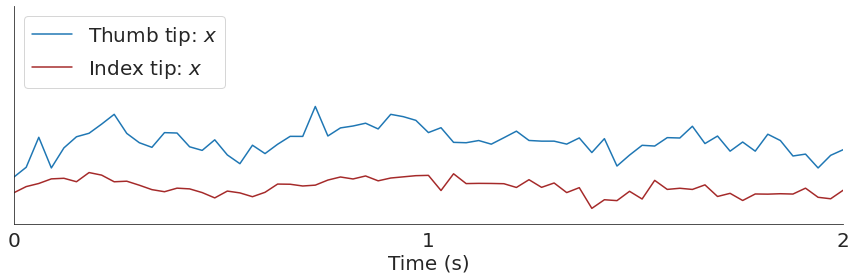

In [ ]:
sns.set_style("white")
fig = plt.figure(figsize=(12, 4))
plt.plot(data.data["right_thumb_tip:x"], label="Thumb tip: $x$")
plt.plot(1.8 * data.data["right_index_tip:x"] - np.max(data.data["right_thumb_tip:x"]) * 0.74, 
         label="Index tip: $x$", color='brown')
sns.despine()
ax = fig.gca()
ax.set_xlim(0, ax.get_xlim()[1] * 0.2)
ax.set_ylim(ax.get_ylim()[0], ax.get_ylim()[1] * 1.02)
ax.yaxis.set_visible(False)
ax.set_xticks([0, 33, 66])
ax.set_xticklabels([0, 1, 2], fontsize=20)
plt.xlabel("Time (s)", fontsize=20)
plt.legend(fontsize=20, loc="upper left")
plt.tight_layout()
plt.savefig("raw_coordinates_x.png", dpi=200)
plt.show()

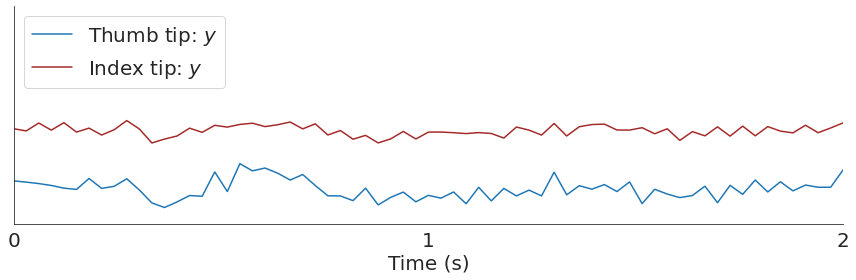

In [ ]:
sns.set_style("white")
fig = plt.figure(figsize=(12, 4))
plt.plot(data.data["right_thumb_tip:y"] + np.max(data.data["right_index_tip:y"]) * 0.015, label="Thumb tip: $y$")
plt.plot(data.data["right_index_tip:y"], label="Index tip: $y$", color='brown')
sns.despine()
ax = fig.gca()
ax.set_xlim(0, ax.get_xlim()[1] * 0.2)
ax.set_ylim(ax.get_ylim()[0], ax.get_ylim()[1] * 1.02)
ax.yaxis.set_visible(False)
ax.set_xticks([0, 33, 66])
ax.set_xticklabels([0, 1, 2], fontsize=20)
plt.xlabel("Time (s)", fontsize=20)
plt.legend(fontsize=20, loc="upper left")
plt.tight_layout()
plt.savefig("raw_coordinates_y.png", dpi=200)
plt.show()

In [ ]:
import seaborn as sns

def static_viz(data, idx=None):
    sns.set()
    fig = plt.figure(constrained_layout=True, figsize=(15, 12))
    gs = fig.add_gridspec(nrows=3, ncols=6, wspace=0.1)
    ax_hands = fig.add_subplot(gs[0:3, 0:2])
    ax_hands.set_xlim(0, 1)
    ax_hands.set_ylim(0, 1)
    ax_hands.invert_yaxis()
    ax_hands.xaxis.set_visible(False)
    ax_hands.yaxis.set_visible(False)
    ax_metrics = []
    for i in range(3):
        ax_metrics.append(fig.add_subplot(gs[i, 2:4]))
        ax_metrics[-1].yaxis.set_visible(False)
    for i in range(3):
        ax_metrics.append(fig.add_subplot(gs[i, 4:6]))
        ax_metrics[-1].yaxis.set_visible(False)

    if idx is None:
        idx = 10
    x = [data.data.loc[idx][i] for i in range(3, len(data.data.columns), 3)]
    y = [data.data.loc[idx][i] for i in range(4, len(data.data.columns), 3)]
    connections = []
    connections.append([(x[0], y[0]), (x[1], y[1])])
    connections.append([(x[1], y[1]), (x[2], y[2])])
    connections.append([(x[2], y[2]), (x[3], y[3])])
    connections.append([(x[3], y[3]), (x[4], y[4])])
    connections.append([(x[0], y[0]), (x[5], y[5])])
    connections.append([(x[5], y[5]), (x[6], y[6])])
    connections.append([(x[6], y[6]), (x[7], y[7])])
    connections.append([(x[7], y[7]), (x[8], y[8])])
    connections.append([(x[5], y[5]), (x[9], y[9])])
    connections.append([(x[9], y[9]), (x[10], y[10])])
    connections.append([(x[10], y[10]), (x[11], y[11])])
    connections.append([(x[11], y[11]), (x[12], y[12])])
    connections.append([(x[9], y[9]), (x[13], y[13])])
    connections.append([(x[13], y[13]), (x[14], y[14])])
    connections.append([(x[14], y[14]), (x[15], y[15])])
    connections.append([(x[15], y[15]), (x[16], y[16])])
    connections.append([(x[13], y[13]), (x[17], y[17])])
    connections.append([(x[0], y[0]), (x[17], y[17])])
    connections.append([(x[17], y[17]), (x[18], y[18])])
    connections.append([(x[18], y[18]), (x[19], y[19])])
    connections.append([(x[19], y[19]), (x[20], y[20])])
    x = x[21:]
    y = y[21:]
    connections.append([(x[0], y[0]), (x[1], y[1])])
    connections.append([(x[1], y[1]), (x[2], y[2])])
    connections.append([(x[2], y[2]), (x[3], y[3])])
    connections.append([(x[3], y[3]), (x[4], y[4])])
    connections.append([(x[0], y[0]), (x[5], y[5])])
    connections.append([(x[5], y[5]), (x[6], y[6])])
    connections.append([(x[6], y[6]), (x[7], y[7])])
    connections.append([(x[7], y[7]), (x[8], y[8])])
    connections.append([(x[5], y[5]), (x[9], y[9])])
    connections.append([(x[9], y[9]), (x[10], y[10])])
    connections.append([(x[10], y[10]), (x[11], y[11])])
    connections.append([(x[11], y[11]), (x[12], y[12])])
    connections.append([(x[9], y[9]), (x[13], y[13])])
    connections.append([(x[13], y[13]), (x[14], y[14])])
    connections.append([(x[14], y[14]), (x[15], y[15])])
    connections.append([(x[15], y[15]), (x[16], y[16])])
    connections.append([(x[13], y[13]), (x[17], y[17])])
    connections.append([(x[0], y[0]), (x[17], y[17])])
    connections.append([(x[17], y[17]), (x[18], y[18])])
    connections.append([(x[18], y[18]), (x[19], y[19])])
    connections.append([(x[19], y[19]), (x[20], y[20])])

    poselines = []
    for conn in connections:
        oneline, = ax_hands.plot([], [], 'ro-', markerfacecolor='blue')
        poselines.append(oneline)
    for j, line in enumerate(poselines):
      conn = connections[j]
      line.set_data([conn[0][0], conn[1][0]], [conn[0][1], conn[1][1]])
    ax_hands.set_title("Video skeleton snapshot")

    features = get_features(data)
    time, freq = features[0], features[9]
    ax_metrics[0].plot(time/1e6, features[1], label="Right hand")
    ax_metrics[0].plot(time/1e6, features[2], label="Left hand")
    ax_metrics[0].set_title("Tap distance (time series)")
    ax_metrics[0].legend()
    ax_metrics[0].set_xlabel("Time (s)")
    ax_metrics[1].plot(time/1e6, features[3], label="Right hand")
    ax_metrics[1].plot(time/1e6, features[4], label="Left hand")
    ax_metrics[1].set_title("Tap velocity (time series)")
    ax_metrics[1].legend()
    ax_metrics[1].set_xlabel("Time (s)")
    ax_metrics[2].plot(time/1e6, features[5], label="Right hand")
    ax_metrics[2].plot(time/1e6, features[6], label="Left hand")
    ax_metrics[2].set_title("Tap acceleration (time series)")
    ax_metrics[2].legend()
    ax_metrics[2].set_xlabel("Time (s)")
    ax_metrics[3].plot(freq, features[10], label="Right hand")
    ax_metrics[3].plot(freq, features[11], label="Left hand")
    ax_metrics[3].set_title("Tap distance (Fourier spectrum)")
    ax_metrics[3].legend()
    ax_metrics[3].set_xlabel("Frequency (Hz)")
    ax_metrics[4].plot(freq, features[12], label="Right hand")
    ax_metrics[4].plot(freq, features[13], label="Left hand")
    ax_metrics[4].set_title("Tap velocity (Fourier spectrum)")
    ax_metrics[4].legend()
    ax_metrics[4].set_xlabel("Frequency (Hz)")
    ax_metrics[5].plot(freq, features[14], label="Right hand")
    ax_metrics[5].plot(freq, features[15], label="Left hand")
    ax_metrics[5].set_title("Tap acceleration (Fourier spectrum)")
    ax_metrics[5].legend()
    ax_metrics[5].set_xlabel("Frequency (Hz)")

    return fig

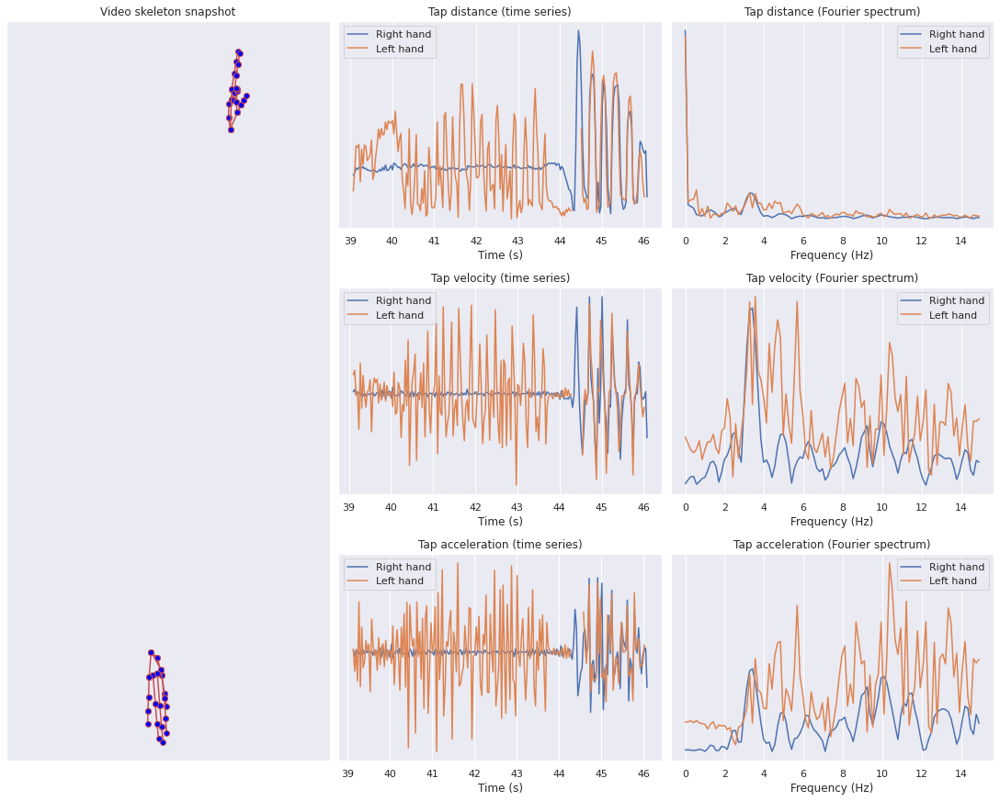

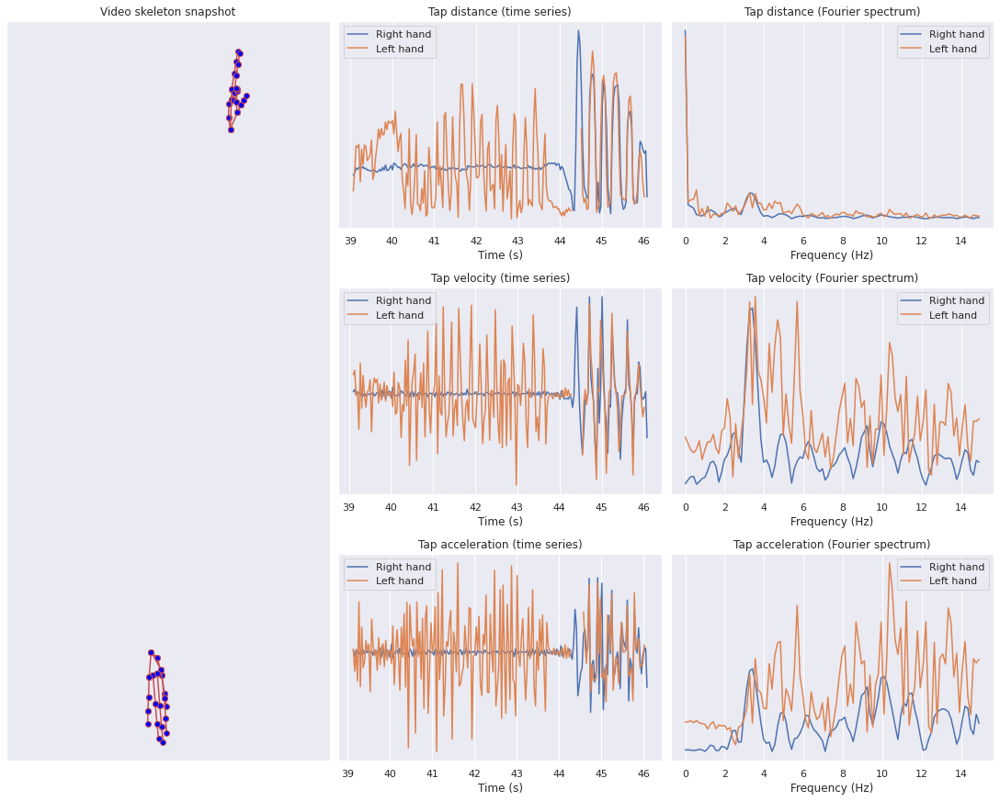

In [ ]:
static_viz(dataset[14], idx=20)

In [ ]:
import seaborn as sns

def time_norm(feature):
    return feature / np.max(np.abs(feature))

def fourier_norm(feature, freq):
    return feature / np.trapz(feature, freq)

def compare_features(data1, data2, hand="right"):
    ''' data1 is patient with high tapping score (high severity) and 
    data2 is patient with low tapping score (low severity)'''
    sns.set(font_scale=1.2)
    fig = plt.figure(constrained_layout=True, figsize=(16, 12))
    gs = fig.add_gridspec(nrows=3, ncols=8, wspace=0.1)
    ax_metrics1 = []
    for i in range(3):
        ax_metrics1.append(fig.add_subplot(gs[i, 0:2]))
    for i in range(3):
        ax_metrics1.append(fig.add_subplot(gs[i, 2:4]))
    ax_metrics2 = []
    for i in range(3):
        ax_metrics2.append(fig.add_subplot(gs[i, 4:6]))
    for i in range(3):
        ax_metrics2.append(fig.add_subplot(gs[i, 6:8]))

    for i, data in enumerate([data1, data2]):
        features = list(get_features(data))
        time, freq = np.array(features[0]), features[9]

        # if i == 0:
        #     for j in range(1, 7):
        #         features[j] = features[j][time/1e6 > 25]
        #     time = time[time/1e6 > 25]

        ax_metrics = ax_metrics1 if i == 0 else ax_metrics2
        if hand == "right":
            ax_metrics[0].plot((time - time[0])/1e6, time_norm(features[1]), label="Right hand")
        else:
            ax_metrics[0].plot((time - time[0])/1e6, time_norm(features[2]), label="Left hand")
        ax_metrics[0].set_title("Tap distance (time series)")
        ax_metrics[0].set_xlim(0, 3)
        ax_metrics[0].legend(loc='upper right')
        ax_metrics[0].set_xlabel("Time (s)")
        if hand == "right":
            ax_metrics[1].plot((time - time[0])/1e6, time_norm(features[3]), label="Right hand")
        else:
            ax_metrics[1].plot((time - time[0])/1e6, time_norm(features[4]), label="Left hand")
        ax_metrics[1].set_title("Tap velocity (time series)")
        ax_metrics[1].set_xlim(0, 3)
        ax_metrics[1].legend(loc='upper right')
        ax_metrics[1].set_xlabel("Time (s)")
        if hand == "right":
            ax_metrics[2].plot((time - time[0])/1e6, time_norm(features[5]), label="Right hand")
        else:
            ax_metrics[2].plot((time - time[0])/1e6, time_norm(features[6]), label="Left hand")
        ax_metrics[2].set_title("Tap acceleration (time series)")
        ax_metrics[2].set_xlim(0, 3)
        ax_metrics[2].legend(loc='upper right')
        ax_metrics[2].set_xlabel("Time (s)")
        if hand == "right":
            ax_metrics[3].plot(freq, fourier_norm(features[10], freq), label="Right hand")
        else:
            ax_metrics[3].plot(freq, fourier_norm(features[11], freq), label="Left hand")
        ax_metrics[3].set_title("Tap distance (Fourier spectrum)")
        ax_metrics[3].set_xlim(0.5, 15.5)
        ax_metrics[3].set_ylim(0, 1)
        ax_metrics[3].legend(loc='upper right')
        ax_metrics[3].set_xlabel("Frequency (Hz)")
        if hand == "right":
            ax_metrics[4].plot(freq, fourier_norm(features[12], freq), label="Right hand")
        else:
            ax_metrics[4].plot(freq, fourier_norm(features[13], freq), label="Left hand")
        ax_metrics[4].set_title("Tap velocity (Fourier spectrum)")
        ax_metrics[4].set_xlim(0.5, 15.5)
        ax_metrics[4].set_ylim(0, 1)
        ax_metrics[4].legend(loc='upper right')
        ax_metrics[4].set_xlabel("Frequency (Hz)")
        if hand == "right":
            ax_metrics[5].plot(freq, fourier_norm(features[14], freq), label="Right hand")
        else:
            ax_metrics[5].plot(freq, fourier_norm(features[15], freq), label="Left hand")
        ax_metrics[5].set_title("Tap acceleration (Fourier spectrum)")
        ax_metrics[5].set_xlim(0.5, 15.5)
        ax_metrics[5].set_ylim(0, 1)
        ax_metrics[5].legend(loc='upper right')
        ax_metrics[5].set_xlabel("Frequency (Hz)")

    return fig

In [ ]:
right_tap_scores = []
left_tap_scores = []

for d in dataset:
    if d.on_state == "on":
        if d.prominent_hand == "right":
            right_tap_scores.append(d.right_on_tapping_score)
        else:
            left_tap_scores.append(d.left_on_tapping_score)
    else:
        if d.prominent_hand == "right":
            right_tap_scores.append(d.right_off_tapping_score)
        else:
            left_tap_scores.append(d.left_off_tapping_score)
right_tap_scores = np.array(right_tap_scores)
right_tap_scores = right_tap_scores[(right_tap_scores <= 4) & (right_tap_scores >= 0)]
left_tap_scores = np.array(left_tap_scores)
left_tap_scores = left_tap_scores[(left_tap_scores <= 4) & (left_tap_scores >= 0)]

In [ ]:
print(len(right_tap_scores), len(left_tap_scores))

47 46


In [ ]:
on_tap_scores = []
off_tap_scores = []

for d in dataset:
    if d.on_state == "on":
        if d.prominent_hand == "right":
            on_tap_scores.append(d.right_on_tapping_score)
        else:
            on_tap_scores.append(d.left_on_tapping_score)
    else:
        if d.prominent_hand == "right":
            off_tap_scores.append(d.right_off_tapping_score)
        else:
            off_tap_scores.append(d.left_off_tapping_score)
off_tap_scores = np.array(off_tap_scores)
off_tap_scores = off_tap_scores[(off_tap_scores <= 4) & (off_tap_scores >= 0)]
on_tap_scores = np.array(on_tap_scores)
on_tap_scores = on_tap_scores[(on_tap_scores <= 4) & (on_tap_scores >= 0)]

In [ ]:
print(len(on_tap_scores), len(off_tap_scores))

47 46


/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


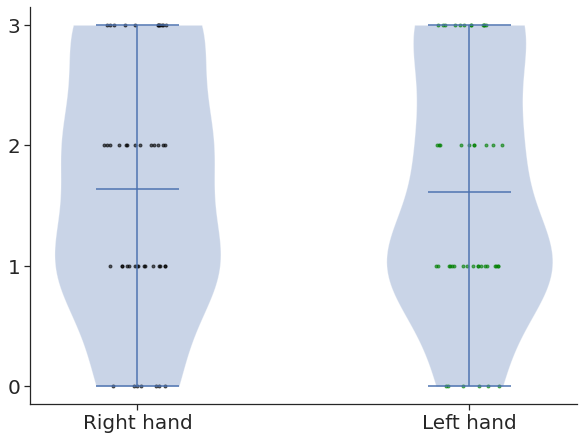

In [ ]:
import seaborn as sns

sns.set_style("ticks")
fig = plt.figure(constrained_layout=True, figsize=(8, 6))
plt.violinplot([right_tap_scores, left_tap_scores], vert=True, showmeans=True)
plt.scatter(np.random.uniform(0.9, 1.1, len(right_tap_scores)), right_tap_scores, color="black", alpha=0.6, marker=".")
plt.scatter(np.random.uniform(1.9, 2.1, len(left_tap_scores)), left_tap_scores, color="green", alpha=0.6, marker=".")
plt.xticks([1, 2], ["Right hand", "Left hand"], fontsize=20)
plt.yticks(range(4), range(4), fontsize=20)
#plt.title("Distribution of finger tapping scores")
sns.despine()
plt.savefig("score_distribution.png", dpi=200)
plt.show()

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


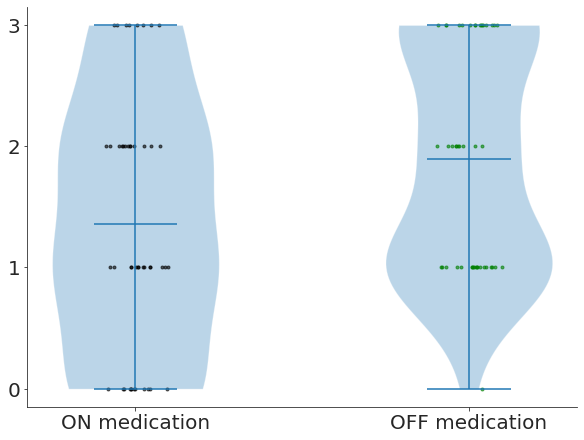

In [ ]:
import seaborn as sns

sns.set_style("ticks")
fig = plt.figure(constrained_layout=True, figsize=(8, 6))
plt.violinplot([on_tap_scores, off_tap_scores], vert=True, showmeans=True)
plt.scatter(np.random.uniform(0.9, 1.1, len(on_tap_scores)), on_tap_scores, color="black", alpha=0.6, marker=".")
plt.scatter(np.random.uniform(1.9, 2.1, len(off_tap_scores)), off_tap_scores, color="green", alpha=0.6, marker=".")
plt.xticks([1, 2], ["ON medication", "OFF medication"], fontsize=20)
plt.yticks(range(4), range(4), fontsize=20)
#plt.title("Distribution of finger tapping scores")
sns.despine()
plt.savefig("score_distribution.png", dpi=200)
plt.show()

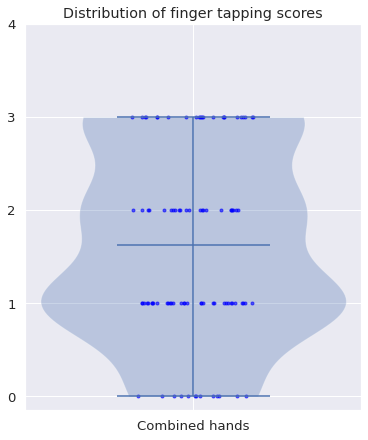

In [ ]:
import seaborn as sns

sns.set(font_scale = 1.2)
fig = plt.figure(constrained_layout=True, figsize=(5, 6))
scores = np.concatenate([right_tap_scores, left_tap_scores])
plt.violinplot(scores, vert=True, showmeans=True)
plt.scatter(np.random.uniform(0.9, 1.1, len(scores)), scores, color="blue", alpha=0.6, marker=".")
plt.xticks([1], ["Combined hands"])
plt.yticks(range(5))
plt.title("Distribution of finger tapping scores")
plt.show()

In [ ]:
high_scores = []
low_scores = []

for d in dataset:
    if d.on_state == "on":
        if d.prominent_hand == "right":
            if d.right_on_tapping_score >= 2:
                high_scores.append(d)
            else:
                low_scores.append(d)
        else:
            if d.left_on_tapping_score >= 2:
                high_scores.append(d)
            else:
                low_scores.append(d)
    else:
        if d.prominent_hand == "right":
            if d.right_off_tapping_score >= 2:
                high_scores.append(d)
            else:
                low_scores.append(d)
        else:
            if d.left_off_tapping_score >= 2:
                high_scores.append(d)
            else:
                low_scores.append(d)

In [ ]:
def time_series_feature_comparison(data1, data2, hand="right"):
    ''' data1 is patient with high tapping score (high severity) and 
    data2 is patient with low tapping score (low severity)'''
    sns.set_style("ticks")

    for i, data in enumerate([data1, data2]):
        features = list(get_features(data))
        time, freq = np.array(features[0]), features[9]

        # if i == 0:
        #     for j in range(1, 7):
        #         features[j] = features[j][time/1e6 > 25]
        #     time = time[time/1e6 > 25]

        fig = plt.figure(figsize=(6, 4))
        ax_metrics = fig.gca()
        if hand == "right":
            ax_metrics.plot((time - time[0])/1e6, time_norm(features[1]), label="Right hand")
        else:
            ax_metrics.plot((time - time[0])/1e6, time_norm(features[2]), label="Left hand")
        ax_metrics.set_xlim(1, 3)
        ax_metrics.set_ylim(0, 1)
        ax_metrics.set_xlabel("Time (s)", fontsize=20)
        ax_metrics.set_ylabel("Tapping distance", fontsize=20)
        ax_metrics.set_xticks([1, 2, 3])
        ax_metrics.set_xticklabels([0, 1, 2], fontsize=20)
        ax_metrics.set_yticks([0, 0.5, 1])
        ax_metrics.set_yticklabels([0.0, 0.5, 1.0], fontsize=20)
        sns.despine()
        plt.tight_layout()
        if i == 0:
            plt.savefig("distance_time_series_high_score.png", dpi=200)
        else:
            plt.savefig("distance_time_series_low_score.png", dpi=200)
        plt.show()
        plt.close()
        fig = plt.figure(figsize=(6, 4))
        ax_metrics = fig.gca()
        if hand == "right":
            ax_metrics.plot((time - time[0])/1e6, time_norm(features[3]), label="Right hand")
        else:
            ax_metrics.plot((time - time[0])/1e6, time_norm(features[4]), label="Left hand")
        ax_metrics.set_xlim(1, 3)
        ax_metrics.set_ylim(0, 1)
        ax_metrics.set_xlabel("Time (s)", fontsize=20)
        ax_metrics.set_ylabel("Tapping velocity", fontsize=20)
        ax_metrics.set_xticks([1, 2, 3])
        ax_metrics.set_xticklabels([0, 1, 2], fontsize=20)
        ax_metrics.set_yticks([-1, -0.5, 0, 0.5, 1])
        ax_metrics.set_yticklabels([-1.0, -0.5, 0.0, 0.5, 1.0], fontsize=20)
        sns.despine()
        plt.tight_layout()
        if i == 0:
            plt.savefig("velocity_time_series_high_score.png", dpi=200)
        else:
            plt.savefig("velocity_time_series_low_score.png", dpi=200)
        plt.close()
        fig = plt.figure(figsize=(6, 4))
        ax_metrics = fig.gca()
        if hand == "right":
            ax_metrics.plot((time - time[0])/1e6, time_norm(features[5]), label="Right hand")
        else:
            ax_metrics.plot((time - time[0])/1e6, time_norm(features[6]), label="Left hand")
        ax_metrics.set_xlim(1, 3)
        ax_metrics.set_ylim(0, 1)
        ax_metrics.set_xlabel("Time (s)", fontsize=20)
        ax_metrics.set_ylabel("Tapping acceleration", fontsize=20)
        ax_metrics.set_xticks([1, 2, 3])
        ax_metrics.set_xticklabels([0, 1, 2], fontsize=20)
        ax_metrics.set_yticks([-1, -0.5, 0, 0.5, 1])
        ax_metrics.set_yticklabels([-1.0, -0.5, 0.0, 0.5, 1.0], fontsize=20)
        sns.despine()
        plt.tight_layout()
        if i == 0:
            plt.savefig("acceleration_time_series_high_score.png", dpi=200)
        else:
            plt.savefig("acceleration_time_series_low_score.png", dpi=200)
        plt.close()

In [ ]:
def psd_feature_comparison(data1, data2, hand="right"):
    ''' data1 is patient with high tapping score (high severity) and 
    data2 is patient with low tapping score (low severity)'''
    sns.set_style("ticks")

    for i, data in enumerate([data1, data2]):
        features = list(get_features(data))
        time, freq = np.array(features[0]), features[9]
        time = (time - time[0])/1e6

        # if i == 0:
        #     for j in range(1, 7):
        #         features[j] = features[j][time/1e6 > 25]
        #     time = time[time/1e6 > 25]

        fig = plt.figure(figsize=(6, 4))
        ax_metrics = fig.gca()
        if hand == "right":
            ax_metrics.plot(freq, fourier_norm(*psd(time, features[1])), label="Right hand")
        else:
            ax_metrics.plot(freq, fourier_norm(*psd(time, features[2])), label="Left hand")
        ax_metrics.set_xlim(0.5, 15)
        ax_metrics.set_ylim(0, 2.4e-6)
        ax_metrics.set_xlabel("Frequency (Hz)", fontsize=20)
        ax_metrics.set_ylabel("Tapping distance PSD", fontsize=20)
        ax_metrics.set_xticks([0, 7.5, 15])
        ax_metrics.set_yticks([0, 1.2e-6, 2.4e-6])
        ax_metrics.set_xticklabels([0, 7.5, 15], fontsize=20)
        ax_metrics.set_yticklabels([0.0, 0.5, 1.0], fontsize=20)
        sns.despine()
        plt.tight_layout()
        if i == 0:
            plt.savefig("distance_psd_high_score.png", dpi=200)
        else:
            plt.savefig("distance_psd_low_score.png", dpi=200)
        plt.show()
        plt.close()
        fig = plt.figure(figsize=(6, 4))
        ax_metrics = fig.gca()
        if hand == "right":
            ax_metrics.plot(freq, fourier_norm(*psd(time, features[3])), label="Right hand")
        else:
            ax_metrics.plot(freq, fourier_norm(*psd(time, features[4])), label="Left hand")
        # ax_metrics.set_xlim(0, 2)
        # ax_metrics.set_ylim(0, 1)
        ax_metrics.set_xlabel("Frequency (Hz)", fontsize=20)
        ax_metrics.set_ylabel("Tapping velocity PSD", fontsize=20)
        ax_metrics.set_xticks([0, 7.5, 15])
        ax_metrics.set_yticks([0, 0.6e-6, 1.2e-6])
        ax_metrics.set_xticklabels([0, 7.5, 15], fontsize=20)
        ax_metrics.set_yticklabels([0.0, 0.5, 1.0], fontsize=20)
        sns.despine()
        plt.tight_layout()
        if i == 0:
            plt.savefig("velocity_psd_high_score.png", dpi=200)
        else:
            plt.savefig("velocity_psd_low_score.png", dpi=200)
        plt.close()
        fig = plt.figure(figsize=(6, 4))
        ax_metrics = fig.gca()
        if hand == "right":
            ax_metrics.plot(freq, fourier_norm(*psd(time, features[5])), label="Right hand")
        else:
            ax_metrics.plot(freq, fourier_norm(*psd(time, features[6])), label="Left hand")
        ax_metrics.set_xlim(0.5, 15)
        ax_metrics.set_ylim(0, 1.2e-6)
        ax_metrics.set_xlabel("Frequency (Hz)", fontsize=20)
        ax_metrics.set_ylabel("Tapping acceleration PSD", fontsize=20)
        ax_metrics.set_xticks([0, 7.5, 15])
        ax_metrics.set_yticks([0, 0.6e-6, 1.2e-6])
        ax_metrics.set_xticklabels([0, 7.5, 15], fontsize=20)
        ax_metrics.set_yticklabels([0.0, 0.5, 1.0], fontsize=20)
        sns.despine()
        plt.tight_layout()
        if i == 0:
            plt.savefig("acceleration_psd_high_score.png", dpi=200)
        else:
            plt.savefig("acceleration_psd_low_score.png", dpi=200)
        plt.close()

4
18


/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:263: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims, where=where)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:223: RuntimeWarning: invalid value encountered in true_divide
  subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:1021: RuntimeWarning: Mean of empty slice.
  return a.std(axis, ddof=ddof) / a.mean(axis)


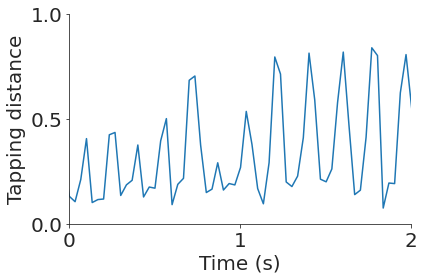

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:263: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims, where=where)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:223: RuntimeWarning: invalid value encountered in true_divide
  subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:1021: RuntimeWarning: Mean of empty slice.
  return a.std(axis, ddof=ddof) / a.mean(axis)


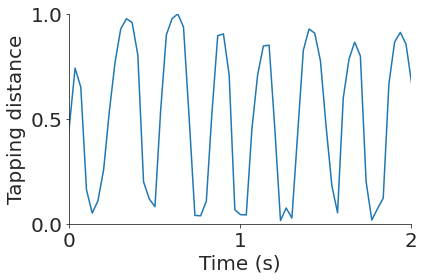

In [ ]:
i = [i for i in range(len(high_scores)) if high_scores[i].pid == "21987"][0]
print(i)
high_example = high_scores[i]
i = [i for i in range(len(low_scores)) if low_scores[i].pid == "31249"][0]
print(i)
low_example = low_scores[i]
time_series_feature_comparison(high_example, low_example)

7
22


/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:263: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims, where=where)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:223: RuntimeWarning: invalid value encountered in true_divide
  subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:1021: RuntimeWarning: Mean of empty slice.
  return a.std(axis, ddof=ddof) / a.mean(axis)
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 512 is gre

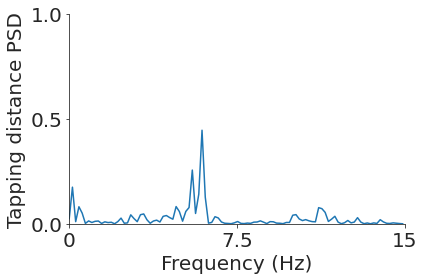

/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 512 is greater than input length  = 207, using nperseg = 207
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 512 is greater than input length  = 207, using nperseg = 207
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:263: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims, where=where)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:223: RuntimeWarning: invalid value encountered in true_divide
  subok=False)
/usr/local/lib/python3.7/dist-packages/nu

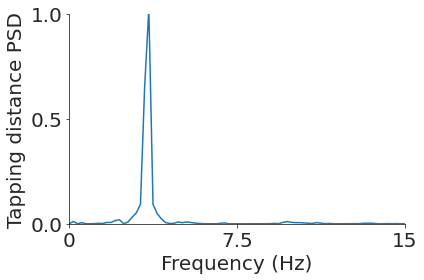

/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 512 is greater than input length  = 160, using nperseg = 160
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 512 is greater than input length  = 160, using nperseg = 160
  .format(nperseg, input_length))


In [ ]:
i = [i for i in range(len(high_scores)) if high_scores[i].pid == "21987"][3]
print(i)
high_example = high_scores[i]
i = [i for i in range(len(low_scores)) if low_scores[i].pid == "31249"][2]
print(i)
low_example = low_scores[i]
psd_feature_comparison(high_example, low_example)

In [ ]:
print(len(high_scores), len(low_scores))

47 52


In [ ]:
def mean_baseline(freq, signal):
    peak_idx = np.argmax(signal)
    baseline = np.concatenate([signal[:peak_idx - 5], signal[peak_idx + 5:]])
    return np.mean(baseline)

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:263: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims, where=where)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:223: RuntimeWarning: invalid value encountered in true_divide
  subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:1021: RuntimeWarning: Mean of empty slice.
  return a.std(axis, ddof=ddof) / a.mean(axis)


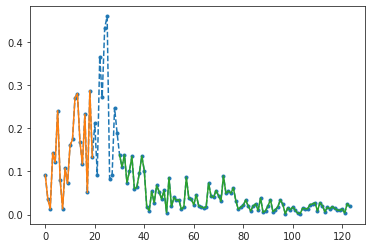

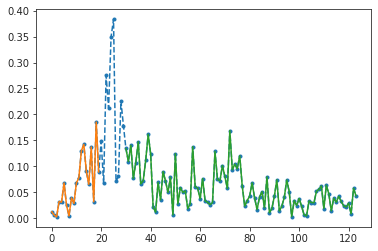

In [ ]:
example_data = low_scores[2]
features = get_features(example_data)
freq = features[9]
signal = fourier_norm(features[10][freq > 0.5], freq[freq > 0.5])
plt.figure()
plt.plot(signal, '.--')
peak_idx = np.argmax(signal)
plt.plot(range(peak_idx - 5), signal[:peak_idx - 5])
plt.plot(range(peak_idx + 5, len(signal)), signal[peak_idx + 5:])
signal = fourier_norm(features[12][freq > 0.5], freq[freq > 0.5])
plt.figure()
plt.plot(signal, '.--')
peak_idx = np.argmax(signal)
plt.plot(range(peak_idx - 5), signal[:peak_idx - 5])
plt.plot(range(peak_idx + 5, len(signal)), signal[peak_idx + 5:])

In [ ]:
dist_low_baselines = []
vel_low_baselines = []

for i in range(len(low_scores)):
    low = low_scores[i]
    features = get_features(low)
    freq = features[9]
    if low.prominent_hand == 'right':
        dist = features[10][freq > 0.5]
        vel = features[12][freq > 0.5]
        freq = freq[freq > 0.5]
        dist = fourier_norm(dist, freq)
        vel = fourier_norm(vel, freq)
    else:
        dist = features[11][freq > 0.5]
        vel = features[13][freq > 0.5]
        freq = freq[freq > 0.5]
        dist = fourier_norm(dist, freq)
        vel = fourier_norm(vel, freq)
    dist_low_baselines.append(mean_baseline(freq, dist))
    vel_low_baselines.append(mean_baseline(freq, vel))

dist_high_baselines = []
vel_high_baselines = []

for i in range(len(high_scores)):
    high = high_scores[i]
    features = get_features(high)
    freq = features[9]
    if high.prominent_hand == 'right':
        dist = features[10][freq > 0.5]
        vel = features[12][freq > 0.5]
        freq = freq[freq > 0.5]
        dist = fourier_norm(dist, freq)
        vel = fourier_norm(vel, freq)
    else:
        dist = features[11][freq > 0.5]
        vel = features[13][freq > 0.5]
        freq = freq[freq > 0.5]
        dist = fourier_norm(dist, freq)
        vel = fourier_norm(vel, freq)
    dist_high_baselines.append(mean_baseline(freq, dist))
    vel_high_baselines.append(mean_baseline(freq, vel))

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:263: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims, where=where)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:223: RuntimeWarning: invalid value encountered in true_divide
  subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:1021: RuntimeWarning: Mean of empty slice.
  return a.std(axis, ddof=ddof) / a.mean(axis)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: Mean of empty slice


/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))
/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


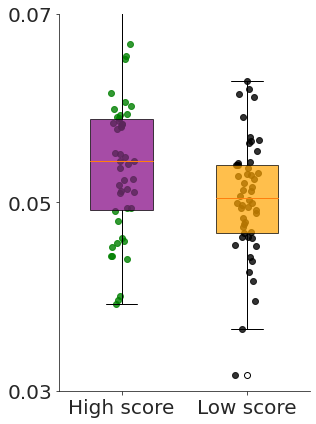

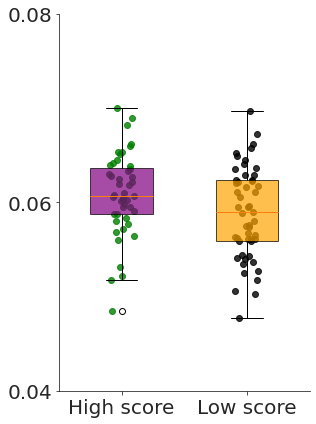

In [ ]:
import seaborn as sns

sns.set_style("ticks")
fig = plt.figure(figsize=(4.5, 6))
ax = fig.gca()
bplot = ax.boxplot([dist_high_baselines, dist_low_baselines], vert=True, 
                   patch_artist=True, widths=(0.5, 0.5))
bplot["boxes"][0].set_facecolor("purple")
bplot["boxes"][1].set_facecolor("orange")
bplot["boxes"][0].set_alpha(0.7)
bplot["boxes"][1].set_alpha(0.7)
ax.scatter(np.random.uniform(0.9, 1.1, len(dist_high_baselines)), 
                dist_high_baselines, color="green", alpha=0.8, marker="o")
ax.scatter(np.random.uniform(1.9, 2.1, len(dist_low_baselines)), 
                dist_low_baselines, color="black", alpha=0.8, marker="o")
ax.set_xticks([1, 2])
ax.set_xticklabels(["High score", "Low score"], fontsize=20)
ax.set_ylim(0.03, 0.07)
ax.set_yticks([0.03, 0.05, 0.07])
ax.set_yticklabels([0.03, 0.05, 0.07], fontsize=20)
sns.despine()
plt.tight_layout()
plt.savefig("fourier_backgrounds_distance.png", dpi=200)
fig = plt.figure(figsize=(4.5, 6))
ax = fig.gca()
bplot = ax.boxplot([vel_high_baselines, vel_low_baselines], vert=True, 
                   patch_artist=True, widths=(0.5, 0.5))
bplot["boxes"][0].set_facecolor("purple")
bplot["boxes"][1].set_facecolor("orange")
bplot["boxes"][0].set_alpha(0.7)
bplot["boxes"][1].set_alpha(0.7)
ax.scatter(np.random.uniform(0.9, 1.1, len(vel_high_baselines)), 
                vel_high_baselines, color="green", alpha=0.8, marker="o")
ax.scatter(np.random.uniform(1.9, 2.1, len(dist_low_baselines)), 
                vel_low_baselines, color="black", alpha=0.8, marker="o")
ax.set_xticks([1, 2])
ax.set_xticklabels(["High score", "Low score"], fontsize=20)
ax.set_ylim(0.04, 0.08)
ax.set_yticks([0.04, 0.06, 0.08])
ax.set_yticklabels([0.04, 0.06, 0.08], fontsize=20)
sns.despine()
plt.tight_layout()
plt.savefig("fourier_backgrounds_velocity.png", dpi=200)

In [ ]:
dist_low_baselines = []
vel_low_baselines = []

for i in range(len(low_scores)):
    low = low_scores[i]
    features = get_features(low)
    time, freq = np.array(features[0]), features[9]
    time = (time - time[0])/1e6
    if low.prominent_hand == 'right':
        dist = features[1]
        vel = features[3]
        dist = fourier_norm(*psd(time, dist))
        vel = fourier_norm(*psd(time, vel))
    else:
        dist = features[2]
        vel = features[4]
        dist = fourier_norm(*psd(time, dist))
        vel = fourier_norm(*psd(time, vel))
    dist_low_baselines.append(mean_baseline(freq, dist))
    vel_low_baselines.append(mean_baseline(freq, vel))

dist_high_baselines = []
vel_high_baselines = []

for i in range(len(high_scores)):
    high = high_scores[i]
    features = get_features(high)
    time, freq = np.array(features[0]), features[9]
    time = (time - time[0])/1e6
    if low.prominent_hand == 'right':
        dist = features[1]
        vel = features[3]
        dist = fourier_norm(*psd(time, dist))
        vel = fourier_norm(*psd(time, vel))
    else:
        dist = features[2]
        vel = features[4]
        dist = fourier_norm(*psd(time, dist))
        vel = fourier_norm(*psd(time, vel))
    dist_high_baselines.append(mean_baseline(freq, dist))
    vel_high_baselines.append(mean_baseline(freq, vel))

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:263: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims, where=where)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:223: RuntimeWarning: invalid value encountered in true_divide
  subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:1021: RuntimeWarning: Mean of empty slice.
  return a.std(axis, ddof=ddof) / a.mean(axis)
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 512 is gre

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))
/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


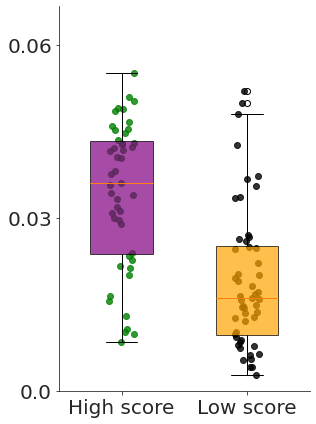

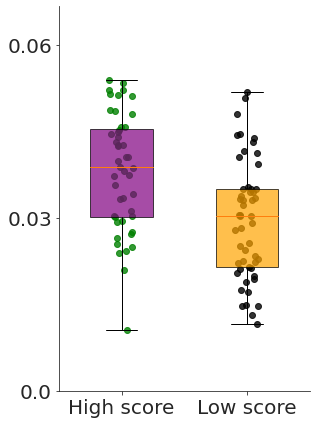

In [ ]:
import seaborn as sns

sns.set_style("ticks")
fig = plt.figure(figsize=(4.5, 6))
ax = fig.gca()
bplot = ax.boxplot([dist_high_baselines, dist_low_baselines], vert=True, 
                   patch_artist=True, widths=(0.5, 0.5))
bplot["boxes"][0].set_facecolor("purple")
bplot["boxes"][1].set_facecolor("orange")
bplot["boxes"][0].set_alpha(0.7)
bplot["boxes"][1].set_alpha(0.7)
ax.scatter(np.random.uniform(0.9, 1.1, len(dist_high_baselines)), 
                dist_high_baselines, color="green", alpha=0.8, marker="o")
ax.scatter(np.random.uniform(1.9, 2.1, len(dist_low_baselines)), 
                dist_low_baselines, color="black", alpha=0.8, marker="o")
ax.set_xticks([1, 2])
ax.set_xticklabels(["High score", "Low score"], fontsize=20)
ax.set_ylim(0, 8e-8)
ax.set_yticks([0, 3.6e-8, 7.2e-8])
ax.set_yticklabels([0.00, 0.03, 0.06], fontsize=20)
sns.despine()
plt.tight_layout()
plt.savefig("fourier_backgrounds_distance.png", dpi=200)
fig = plt.figure(figsize=(4.5, 6))
ax = fig.gca()
bplot = ax.boxplot([vel_high_baselines, vel_low_baselines], vert=True, 
                   patch_artist=True, widths=(0.5, 0.5))
bplot["boxes"][0].set_facecolor("purple")
bplot["boxes"][1].set_facecolor("orange")
bplot["boxes"][0].set_alpha(0.7)
bplot["boxes"][1].set_alpha(0.7)
ax.scatter(np.random.uniform(0.9, 1.1, len(vel_high_baselines)), 
                vel_high_baselines, color="green", alpha=0.8, marker="o")
ax.scatter(np.random.uniform(1.9, 2.1, len(dist_low_baselines)), 
                vel_low_baselines, color="black", alpha=0.8, marker="o")
ax.set_xticks([1, 2])
ax.set_xticklabels(["High score", "Low score"], fontsize=20)
ax.set_ylim(0, 8e-8)
ax.set_yticks([0, 3.6e-8, 7.2e-8])
ax.set_yticklabels([0.00, 0.03, 0.06], fontsize=20)
sns.despine()
plt.tight_layout()
plt.savefig("fourier_backgrounds_velocity.png", dpi=200)

In [ ]:
def peak_variance(signal):
    peak_idxs = [i for i in range(len(signal)) if np.abs(signal[i]) == np.max(np.abs(signal[i - 3 : i + 4]))]
    peaks = signal[peak_idxs]
    return np.var(np.abs(peaks))

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:263: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims, where=where)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:223: RuntimeWarning: invalid value encountered in true_divide
  subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:1021: RuntimeWarning: Mean of empty slice.
  return a.std(axis, ddof=ddof) / a.mean(axis)


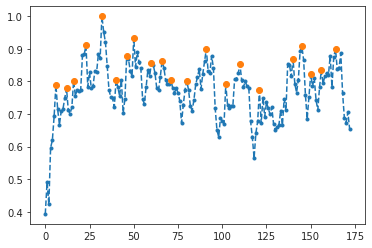

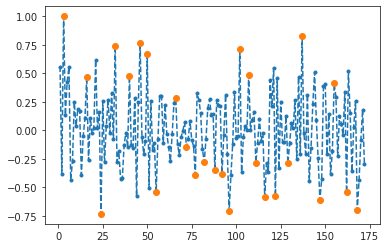

In [ ]:
example_data = low_scores[0]
features = get_features(example_data)
signal = time_norm(features[1])
plt.figure()
plt.plot(signal, '.--')
peak_idxs = [i for i in range(len(signal)) if np.abs(signal[i]) == np.max(np.abs(signal[i - 3 : i + 4]))]
peaks = signal[peak_idxs]
plt.plot(peaks, 'o')
signal = time_norm(features[3])
plt.figure()
plt.plot(signal, '.--')
peak_idxs = [i for i in range(len(signal)) if np.abs(signal[i]) == np.max(np.abs(signal[i - 3 : i + 4]))]
peaks = signal[peak_idxs]
plt.plot(peaks, 'o')

In [ ]:
dist_low_peak_vars = []
vel_low_peak_vars = []

for i in range(len(low_scores)):
    low = low_scores[i]
    features = get_features(low)
    if low.prominent_hand == 'right':
        dist = time_norm(features[1])
        vel = time_norm(features[3])
    else:
        dist = time_norm(features[2])
        vel = time_norm(features[4])
    dist_low_peak_vars.append(peak_variance(dist))
    vel_low_peak_vars.append(peak_variance(vel))

dist_high_peak_vars = []
vel_high_peak_vars = []

for i in range(len(high_scores)):
    high = high_scores[i]
    features = get_features(high)
    if high.prominent_hand == 'right':
        dist = time_norm(features[1])
        vel = time_norm(features[3])
    else:
        dist = time_norm(features[2])
        vel = time_norm(features[3])
    dist_high_peak_vars.append(peak_variance(dist))
    vel_high_peak_vars.append(peak_variance(vel))

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:263: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims, where=where)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:223: RuntimeWarning: invalid value encountered in true_divide
  subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:1021: RuntimeWarning: Mean of empty slice.
  return a.std(axis, ddof=ddof) / a.mean(axis)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: Mean of empty slice


/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))
/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


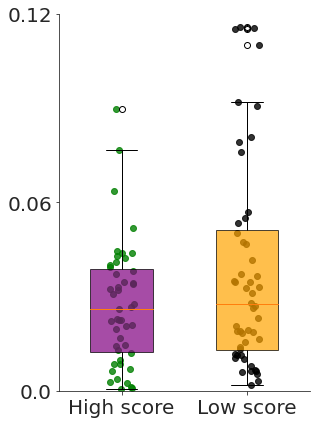

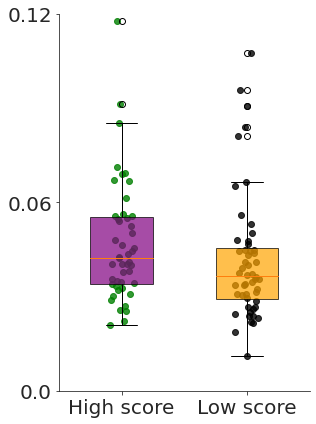

In [ ]:
import seaborn as sns

sns.set_style("ticks")
fig = plt.figure(figsize=(4.5, 6))
ax = fig.gca()
bplot = ax.boxplot([dist_high_peak_vars, dist_low_peak_vars], vert=True, 
                   patch_artist=True, widths=(0.5, 0.5))
bplot["boxes"][0].set_facecolor("purple")
bplot["boxes"][1].set_facecolor("orange")
bplot["boxes"][0].set_alpha(0.7)
bplot["boxes"][1].set_alpha(0.7)
ax.scatter(np.random.uniform(0.9, 1.1, len(dist_high_peak_vars)), 
                dist_high_peak_vars, color="green", alpha=0.8, marker="o")
ax.scatter(np.random.uniform(1.9, 2.1, len(dist_low_peak_vars)), 
                dist_low_peak_vars, color="black", alpha=0.8, marker="o")
ax.set_xticks([1, 2])
ax.set_xticklabels(["High score", "Low score"], fontsize=20)
ax.set_ylim(0, 0.12)
ax.set_yticks([0.00, 0.06, 0.12])
ax.set_yticklabels([0.00, 0.06, 0.12], fontsize=20)
sns.despine()
plt.tight_layout()
plt.savefig("peak_variances_distance.png", dpi=200)
fig = plt.figure(figsize=(4.5, 6))
ax = fig.gca()
bplot = ax.boxplot([vel_high_peak_vars, vel_low_peak_vars], vert=True, 
                   patch_artist=True, widths=(0.5, 0.5))
bplot["boxes"][0].set_facecolor("purple")
bplot["boxes"][1].set_facecolor("orange")
bplot["boxes"][0].set_alpha(0.7)
bplot["boxes"][1].set_alpha(0.7)
ax.scatter(np.random.uniform(0.9, 1.1, len(vel_high_peak_vars)), 
                vel_high_peak_vars, color="green", alpha=0.8, marker="o")
ax.scatter(np.random.uniform(1.9, 2.1, len(vel_low_peak_vars)), 
                vel_low_peak_vars, color="black", alpha=0.8, marker="o")
ax.set_xticks([1, 2])
ax.set_xticklabels(["High score", "Low score"], fontsize=20)
ax.set_ylim(0, 0.12)
ax.set_yticks([0.00, 0.06, 0.12])
ax.set_yticklabels([0.00, 0.06, 0.12], fontsize=20)
sns.despine()
plt.tight_layout()
plt.savefig("peak_variances_velocity.png", dpi=200)

In [ ]:
import pandas as pd

classes = []
dist_peak_vars = []
vel_peak_vars = []
dist_psd_bg = []
vel_psd_bg = []

for i, data in enumerate(high_scores + low_scores):
    if i < len(high_scores):
        classes.append('high_score')
    else:
        classes.append('low_score')
    features = get_features(data)
    if data.prominent_hand == 'right':
        dist = time_norm(features[1])
        vel = time_norm(features[3])
    else:
        dist = time_norm(features[2])
        vel = time_norm(features[4])
    dist_peak_vars.append(peak_variance(dist))
    vel_peak_vars.append(peak_variance(vel))
    time, freq = np.array(features[0]), features[9]
    time = (time - time[0])/1e6
    if data.prominent_hand == 'right':
        dist = features[1]
        vel = features[3]
        dist = fourier_norm(*psd(time, dist))
        vel = fourier_norm(*psd(time, vel))
    else:
        dist = features[2]
        vel = features[4]
        dist = fourier_norm(*psd(time, dist))
        vel = fourier_norm(*psd(time, vel))
    dist_psd_bg.append(mean_baseline(freq, dist))
    vel_psd_bg.append(mean_baseline(freq, vel))

df = pd.DataFrame(data = {'class': classes,
                          'dist_peak_var': dist_peak_vars,
                          'vel_peak_var': vel_peak_vars,
                          'dist_psd_bg': dist_psd_bg,
                          'vel_psd_bg': vel_psd_bg})

df.to_csv('featurized_dataset.csv', index=False)

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:263: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims, where=where)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:223: RuntimeWarning: invalid value encountered in true_divide
  subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:1021: RuntimeWarning: Mean of empty slice.
  return a.std(axis, ddof=ddof) / a.mean(axis)
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 512 is gre

In [ ]:
df

,class,dist_peak_var,vel_peak_var,dist_psd_bg,vel_psd_bg
0,high_score,0.022557,0.043412,1.219102e-08,1.271847e-08
1,high_score,0.089572,0.049299,2.871244e-08,5.278564e-08
2,high_score,0.043972,0.041584,2.955590e-08,4.322543e-08
3,high_score,0.043045,0.030853,5.874574e-08,5.821434e-08
4,high_score,0.020997,0.035625,3.709797e-08,3.735691e-08
...,...,...,...,...,...
94,low_score,0.035066,0.048010,2.008262e-08,3.967619e-08
95,low_score,0.016398,0.047751,2.978712e-08,3.989549e-08
96,low_score,0.005417,0.030850,5.770021e-08,6.083531e-08
97,low_score,0.036545,0.052955,2.987247e-08,3.659784e-08


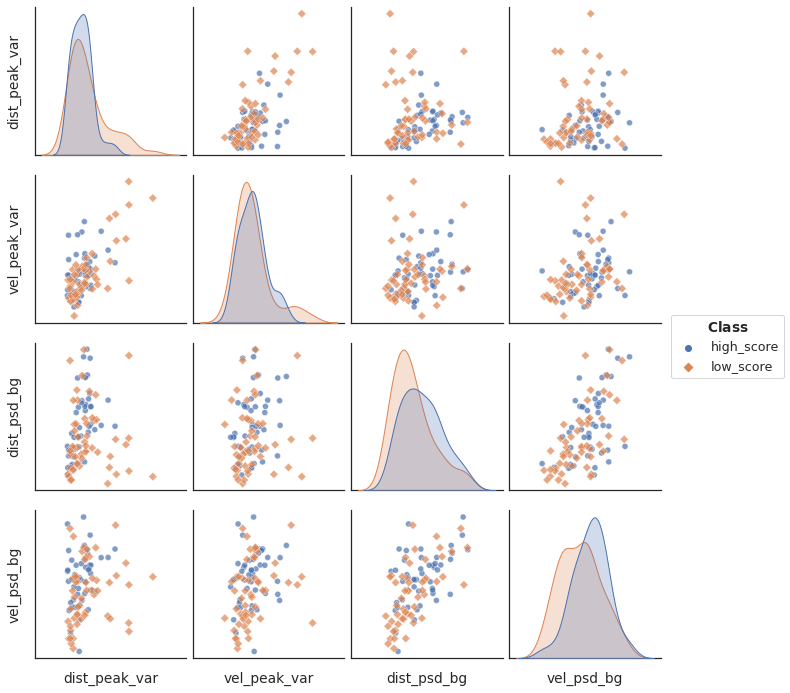

In [ ]:
import seaborn as sns

sns.set(font_scale=1.15, style='white')
g = sns.pairplot(df, hue='class', markers=['o', 'D'], plot_kws={'alpha':0.7})
g.set(xticklabels=[], yticklabels=[])
g.legend.set_frame_on(1)
g.legend.set_title('$\\bf{Class}$')
g.savefig('feature_space_slices.png', dpi=200)

In [ ]:
import umap
from sklearn.preprocessing import StandardScaler

reducer = umap.UMAP()
values = df[['dist_peak_var', 'vel_peak_var', 'dist_psd_bg', 'vel_psd_bg']].values
scaled_data = StandardScaler().fit_transform(values)

embedding = reducer.fit_transform(scaled_data)
embedding.shape

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


(99, 2)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


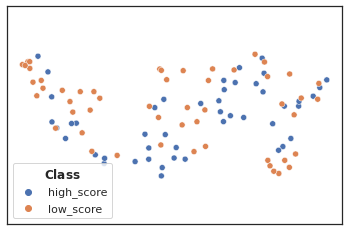

In [ ]:
sns.set(style='white')
sns.scatterplot(
    embedding[:, 0],
    embedding[:, 1],
    hue=df['class'])
plt.gca().set_aspect('equal', 'datalim')
plt.xticks(ticks=[])
plt.yticks(ticks=[])
plt.legend(loc='lower left').set_title('$\\bf{Class}$')
plt.savefig('umap_plot.png', dpi=200)

In [ ]:
def baseline(freq, signal):
    peak_idx = np.argmax(signal)
    baseline = np.concatenate([signal[:peak_idx - 5], signal[peak_idx + 5:]])
    freq = np.concatenate([freq[:peak_idx - 5], freq[peak_idx + 5:]])
    closest_f = []
    i = 0
    for f in range(1, 16):
        while i < len(freq) - 1 and freq[i] < f:
            i += 1
        closest_f.append(freq[i])
    baseline = baseline[np.isin(freq, closest_f)]
    if len(baseline) < 15:
        baseline = np.concatenate([baseline, [baseline[-1] for _ in range(15 - len(baseline))]])
    return baseline[:15]

In [ ]:
#logistic regression with psd background features

dist_low_baselines = []
vel_low_baselines = []

for i in range(len(low_scores)):
    low = low_scores[i]
    features = get_features(low)
    freq = features[9]
    if low.prominent_hand == 'right':
        dist = features[10][freq > 0.5]
        vel = features[12][freq > 0.5]
        freq = freq[freq > 0.5]
        dist = fourier_norm(dist, freq)
        vel = fourier_norm(vel, freq)
    else:
        dist = features[11][freq > 0.5]
        vel = features[13][freq > 0.5]
        freq = freq[freq > 0.5]
        dist = fourier_norm(dist, freq)
        vel = fourier_norm(vel, freq)
    dist_low_baselines.append(baseline(freq, dist))
    vel_low_baselines.append(baseline(freq, vel))

dist_high_baselines = []
vel_high_baselines = []

for i in range(len(high_scores)):
    high = high_scores[i]
    features = get_features(high)
    freq = features[9]
    if high.prominent_hand == 'right':
        dist = features[10][freq > 0.5]
        vel = features[12][freq > 0.5]
        freq = freq[freq > 0.5]
        dist = fourier_norm(dist, freq)
        vel = fourier_norm(vel, freq)
    else:
        dist = features[11][freq > 0.5]
        vel = features[13][freq > 0.5]
        freq = freq[freq > 0.5]
        dist = fourier_norm(dist, freq)
        vel = fourier_norm(vel, freq)
    dist_high_baselines.append(baseline(freq, dist))
    vel_high_baselines.append(baseline(freq, vel))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: Mean of empty slice


In [ ]:
#logistic regression

model = nn.Sequential((nn.Linear(30, 1)), nn.Sigmoid())

x = []
for i in range(len(dist_high_baselines)):
    x.append(np.concatenate([dist_high_baselines[i], vel_high_baselines[i]]))
for i in range(len(dist_low_baselines)):
    x.append(np.concatenate([dist_low_baselines[i], vel_low_baselines[i]]))
x = torch.FloatTensor(x)
y = np.concatenate([np.ones(len(dist_high_baselines)), np.zeros(len(dist_low_baselines))])
y = torch.FloatTensor(y.reshape(y.shape[0], 1))
print(x.shape)
print(y.shape)

optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)

loss_fn = nn.BCELoss()

for epoch in range(100):
    optimizer.zero_grad()
    output = model(x)
    loss = loss_fn(output, y)
    loss.backward()
    optimizer.step()

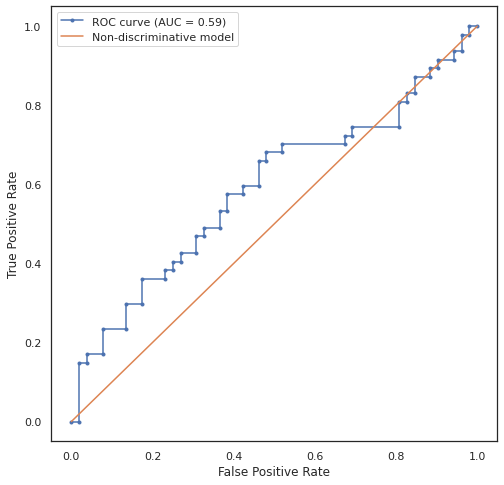

In [ ]:
#metrics

from sklearn.metrics import roc_curve, auc

sns.set(style='white')
plt.figure(figsize=[8, 8])
nn_fpr, nn_tpr, nn_thresholds = roc_curve(y.detach().numpy(), model(x).detach().numpy())
auc_val = auc(nn_fpr, nn_tpr)
plt.plot(nn_fpr, nn_tpr, marker='.', label='ROC curve (AUC = {})'.format(round(auc_val, 3)))
plt.plot(nn_fpr, nn_fpr, label='Non-discriminative model')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate' )
plt.legend()
plt.savefig('roc_curve.png', dpi=200)
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


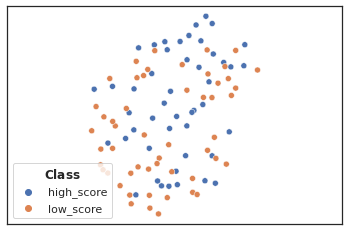

In [ ]:
#feature_matrix

df = pd.DataFrame(x.detach().numpy())
df.columns = ['feature_{}'.format(i) for i in range(30)]
df['class'] = ['high_score' if z == 1 else 'low_score' for z in y.detach().numpy() ]
df

import umap
from sklearn.preprocessing import StandardScaler

reducer = umap.UMAP()
values = x.detach().numpy()
scaled_data = StandardScaler().fit_transform(values)

embedding = reducer.fit_transform(scaled_data)
embedding.shape

sns.set(style='white')
sns.scatterplot(
    embedding[:, 0],
    embedding[:, 1],
    hue=df['class'])
plt.gca().set_aspect('equal', 'datalim')
plt.xticks(ticks=[])
plt.yticks(ticks=[])
plt.legend(loc='lower left').set_title('$\\bf{Class}$')
plt.savefig('umap_plot (1).png', dpi=200)

In [ ]:
scores = []
dist_baselines = []
vel_baselines = []
dist_peak_vars = []
vel_peak_vars = []

for i, data in enumerate(dataset):
    if data.prominent_hand == "right":
        if data.on_state == "on":
            score = data.right_on_tapping_score 
        else:
            score = data.right_off_tapping_score 
    else:
        if data.on_state == "on":
            score = data.left_on_tapping_score 
        else:
            score = data.left_off_tapping_score 
    scores.append(score)
    features = get_features(data)
    freq = features[9]
    if data.prominent_hand == 'right':
        dist = features[10][freq > 0.5]
        vel = features[12][freq > 0.5]
        freq = freq[freq > 0.5]
        dist = fourier_norm(dist, freq)
        vel = fourier_norm(vel, freq)
    else:
        dist = features[11][freq > 0.5]
        vel = features[13][freq > 0.5]
        freq = freq[freq > 0.5]
        dist = fourier_norm(dist, freq)
        vel = fourier_norm(vel, freq)
    dist_baselines.append(mean_baseline(freq, dist))
    vel_baselines.append(mean_baseline(freq, vel))
    if data.prominent_hand == 'right':
        dist = time_norm(features[1])
        vel = time_norm(features[3])
    else:
        dist = time_norm(features[2])
        vel = time_norm(features[4])
    dist_peak_vars.append(peak_variance(dist))
    vel_peak_vars.append(peak_variance(vel))

scores = np.array(scores)
dist_baselines = np.array(dist_baselines)
vel_baselines = np.array(vel_baselines)
dist_peak_vars = np.array(dist_peak_vars)
vel_peak_vars = np.array(vel_peak_vars)

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:263: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims, where=where)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:223: RuntimeWarning: invalid value encountered in true_divide
  subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:1072: RuntimeWarning: Mean of empty slice.
  return a.std(axis) / a.mean(axis)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: Mean of empty slice


/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


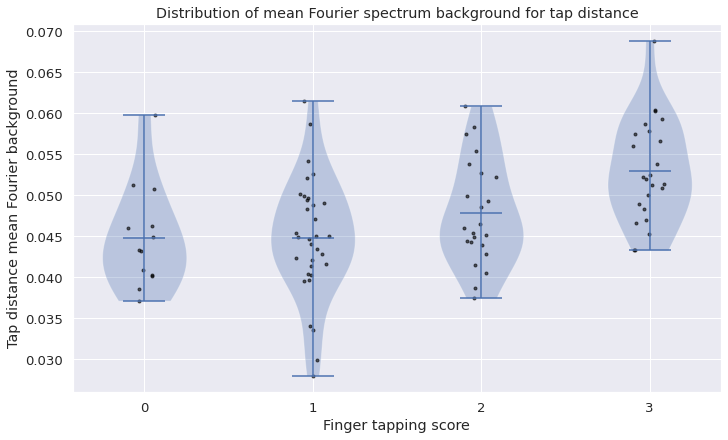

In [ ]:
import seaborn as sns

sns.set(font_scale = 1.2)
fig = plt.figure(constrained_layout=True, figsize=(10, 6))
plt.violinplot([dist_baselines[scores == 0], dist_baselines[scores == 1], 
                dist_baselines[scores == 2], dist_baselines[scores == 3]], 
               vert=True, showmeans=True)
plt.scatter(np.random.uniform(0.9, 1.1, len(scores[scores == 0])), dist_baselines[scores == 0], color="black", alpha=0.6, marker=".")
plt.scatter(np.random.uniform(1.9, 2.1, len(scores[scores == 1])), dist_baselines[scores == 1], color="black", alpha=0.6, marker=".")
plt.scatter(np.random.uniform(2.9, 3.1, len(scores[scores == 2])), dist_baselines[scores == 2], color="black", alpha=0.6, marker=".")
plt.scatter(np.random.uniform(3.9, 4.1, len(scores[scores == 3])), dist_baselines[scores == 3], color="black", alpha=0.6, marker=".")
plt.xticks([1, 2, 3, 4], [0, 1, 2, 3])
plt.xlabel("Finger tapping score")
plt.ylabel("Tap distance mean Fourier background")
plt.title("Distribution of mean Fourier spectrum background for tap distance")
plt.show()

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


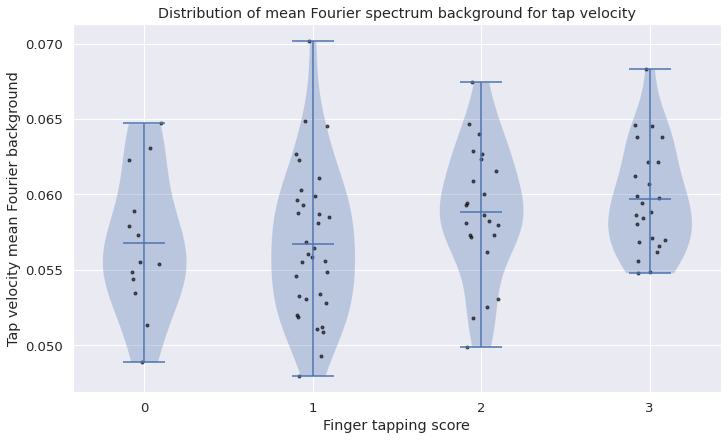

In [ ]:
import seaborn as sns

sns.set(font_scale = 1.2)
fig = plt.figure(constrained_layout=True, figsize=(10, 6))
plt.violinplot([vel_baselines[scores == 0], vel_baselines[scores == 1], 
                vel_baselines[scores == 2], vel_baselines[scores == 3]], 
               vert=True, showmeans=True)
plt.scatter(np.random.uniform(0.9, 1.1, len(scores[scores == 0])), vel_baselines[scores == 0], color="black", alpha=0.6, marker=".")
plt.scatter(np.random.uniform(1.9, 2.1, len(scores[scores == 1])), vel_baselines[scores == 1], color="black", alpha=0.6, marker=".")
plt.scatter(np.random.uniform(2.9, 3.1, len(scores[scores == 2])), vel_baselines[scores == 2], color="black", alpha=0.6, marker=".")
plt.scatter(np.random.uniform(3.9, 4.1, len(scores[scores == 3])), vel_baselines[scores == 3], color="black", alpha=0.6, marker=".")
plt.xticks([1, 2, 3, 4], [0, 1, 2, 3])
plt.xlabel("Finger tapping score")
plt.ylabel("Tap velocity mean Fourier background")
plt.title("Distribution of mean Fourier spectrum background for tap velocity")
plt.show()

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


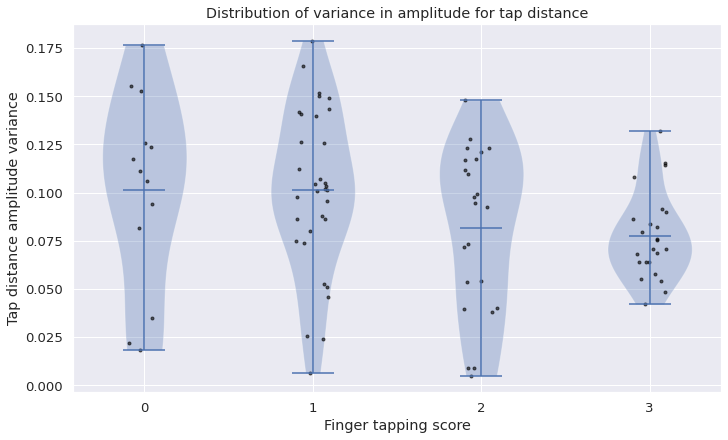

In [ ]:
import seaborn as sns

sns.set(font_scale = 1.2)
fig = plt.figure(constrained_layout=True, figsize=(10, 6))
plt.violinplot([dist_peak_vars[scores == 0], dist_peak_vars[scores == 1], 
                dist_peak_vars[scores == 2], dist_peak_vars[scores == 3]], 
               vert=True, showmeans=True)
plt.scatter(np.random.uniform(0.9, 1.1, len(scores[scores == 0])), dist_peak_vars[scores == 0], color="black", alpha=0.6, marker=".")
plt.scatter(np.random.uniform(1.9, 2.1, len(scores[scores == 1])), dist_peak_vars[scores == 1], color="black", alpha=0.6, marker=".")
plt.scatter(np.random.uniform(2.9, 3.1, len(scores[scores == 2])), dist_peak_vars[scores == 2], color="black", alpha=0.6, marker=".")
plt.scatter(np.random.uniform(3.9, 4.1, len(scores[scores == 3])), dist_peak_vars[scores == 3], color="black", alpha=0.6, marker=".")
plt.xticks([1, 2, 3, 4], [0, 1, 2, 3])
plt.xlabel("Finger tapping score")
plt.ylabel("Tap distance amplitude variance")
plt.title("Distribution of variance in amplitude for tap distance")
plt.show()

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


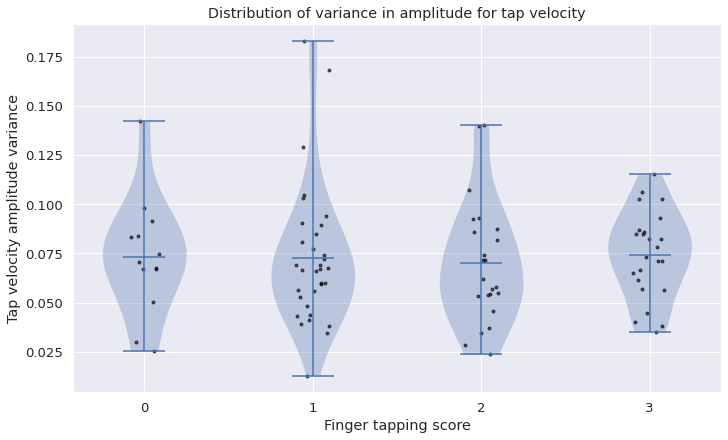

In [ ]:
import seaborn as sns

sns.set(font_scale = 1.2)
fig = plt.figure(constrained_layout=True, figsize=(10, 6))
plt.violinplot([vel_peak_vars[scores == 0], vel_peak_vars[scores == 1], 
                vel_peak_vars[scores == 2], vel_peak_vars[scores == 3]], 
               vert=True, showmeans=True)
plt.scatter(np.random.uniform(0.9, 1.1, len(scores[scores == 0])), vel_peak_vars[scores == 0], color="black", alpha=0.6, marker=".")
plt.scatter(np.random.uniform(1.9, 2.1, len(scores[scores == 1])), vel_peak_vars[scores == 1], color="black", alpha=0.6, marker=".")
plt.scatter(np.random.uniform(2.9, 3.1, len(scores[scores == 2])), vel_peak_vars[scores == 2], color="black", alpha=0.6, marker=".")
plt.scatter(np.random.uniform(3.9, 4.1, len(scores[scores == 3])), vel_peak_vars[scores == 3], color="black", alpha=0.6, marker=".")
plt.xticks([1, 2, 3, 4], [0, 1, 2, 3])
plt.xlabel("Finger tapping score")
plt.ylabel("Tap velocity amplitude variance")
plt.title("Distribution of variance in amplitude for tap velocity")
plt.show()

In [ ]:
# with open('sample.txt', 'w') as f:
#     f.write("dist_high_baselines:")
#     f.write(str(dist_high_baselines))
#     f.write("\n")
#     f.write("vel_high_baselines:")
#     f.write(str(vel_high_baselines))
#     f.write("\n")
#     f.write("acc_high_baselines:")
#     f.write(str(acc_high_baselines))
#     f.write("\n")
#     f.write("dist_low_baselines:")
#     f.write(str(dist_low_baselines))
#     f.write("\n")
#     f.write("vel_low_baselines:")
#     f.write(str(vel_low_baselines))
#     f.write("\n")
#     f.write("acc_low_baselines:")
#     f.write(str(acc_low_baselines))
#     f.write("\n")

## Regression to Finger Tapping Score

In [ ]:
left_hand_data = [data for data in dataset if data.prominent_hand == "left"]
right_hand_data = [data for data in dataset if data.prominent_hand == "right"]

print("# of left hand samples:", len(left_hand_data))
print("# of right hand samples:", len(right_hand_data))

# of left hand samples: 50
# of right hand samples: 49


### Only Primary Features

In [ ]:
def primary_featurized_data(sample, hand):
  dist_right, dist_left, time = normalized_tapping_distance(sample.data)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  time = np.asarray(time) - time[0]
  seq_len = len(time)
  if sample.on_state == "on":
    label = sample.left_on_tapping_score if (hand == "left") else sample.right_on_tapping_score
  else:
    label = sample.left_off_tapping_score if (hand == "left") else sample.right_off_tapping_score
  featurized = np.zeros((seq_len, 1, 2))
  if hand == "left":
    featurized[:, 0, 0] = np.asarray(dist_left)
    featurized[:, 0, 1] = np.asarray(left_v)
  elif hand == "right":
    featurized[:, 0, 0] = np.asarray(dist_right)
    featurized[:, 0, 1] = np.asarray(right_v)
  else:
    return "error"
  return time, featurized, label

def primary_featurized_dataset(dataset, hand):
  featurized_list = []
  times_list = []
  labels = []
  for sample in dataset:
    time, featurized, label = primary_featurized_data(sample, hand)
    featurized_list.append(featurized)
    times_list.append(time)
    labels.append(label)
  times_concat = np.concatenate(times_list)
  times_union = np.unique(times_concat)
  featurized_interped_list = []
  seq_len = len(times_union)
  for i, f in enumerate(featurized_list):
    times_f = times_list[i]
    dist_f = f[:, 0, 0]
    v_f = f[:, 0, 1]
    dist_interped = np.interp(times_union, times_f, dist_f)
    v_interped = np.interp(times_union, times_f, v_f)
    featurized_interped = torch.zeros((seq_len, 1, 2))
    featurized_interped[:, 0, 0] = torch.tensor(dist_interped)
    featurized_interped[:, 0, 1] = torch.tensor(v_interped)
    featurized_interped_list.append(featurized_interped)
  return featurized_interped_list, labels

In [ ]:
left_hand_featurized, left_hand_labels = primary_featurized_dataset(
                                          left_hand_data, "left")
right_hand_featurized, right_hand_labels = primary_featurized_dataset(
                                          right_hand_data, "right")

left_hand_featurized = [f for i, f in enumerate(left_hand_featurized) if 
                        left_hand_labels[i] <= 4 and left_hand_labels[i] >= 0]
left_hand_labels = [l for l in left_hand_labels if l <= 4 and l >= 0]
right_hand_featurized = [f for i, f in enumerate(right_hand_featurized) if 
                        right_hand_labels[i] <= 4 and right_hand_labels[i] >= 0]
right_hand_labels = [l for l in right_hand_labels if l <= 4 and l >= 0]

In [ ]:
n = len(left_hand_featurized)
left_train_idxs = np.random.choice(range(n), round(0.8 * n), replace=False)
left_test_idxs = [i for i in range(n) if i not in left_train_idxs]

n = len(right_hand_featurized)
right_train_idxs = np.random.choice(range(n), round(0.8 * n), replace=False)
right_test_idxs = [i for i in range(n) if i not in right_train_idxs]

In [ ]:
left_hand_train = [left_hand_featurized[i] for i in left_train_idxs]
left_hand_train = torch.nan_to_num(torch.cat(left_hand_train, dim=1))
left_train_labels = [left_hand_labels[i] for i in left_train_idxs]
left_hand_test = [left_hand_featurized[i] for i in left_test_idxs]
left_test_labels = [left_hand_labels[i] for i in left_test_idxs]

right_hand_train = [right_hand_featurized[i] for i in right_train_idxs]
right_hand_train = torch.nan_to_num(torch.cat(right_hand_train, dim=1))
right_train_labels = [right_hand_labels[i] for i in right_train_idxs]
right_hand_test = [right_hand_featurized[i] for i in right_test_idxs]
right_test_labels = [right_hand_labels[i] for i in right_test_idxs]

In [ ]:
n = len(left_hand_test)
left_val_idxs = np.random.choice(range(n), round(0.6 * n), replace=False)
left_test_idxs = [i for i in range(n) if i not in left_val_idxs]

n = len(right_hand_test)
right_val_idxs = np.random.choice(range(n), round(0.6 * n), replace=False)
right_test_idxs = [i for i in range(n) if i not in right_val_idxs]

In [ ]:
left_hand_val = [left_hand_test[i] for i in left_val_idxs]
left_hand_val = torch.nan_to_num(torch.cat(left_hand_val, dim=1))
left_val_labels = [left_test_labels[i] for i in left_val_idxs]
left_hand_test = [left_hand_test[i] for i in left_test_idxs]
left_hand_test = torch.nan_to_num(torch.cat(left_hand_test, dim=1))
left_test_labels = [left_test_labels[i] for i in left_test_idxs]

right_hand_val = [right_hand_test[i] for i in right_val_idxs]
right_hand_val = torch.nan_to_num(torch.cat(right_hand_val, dim=1))
right_val_labels = [right_test_labels[i] for i in right_val_idxs]
right_hand_test = [right_hand_test[i] for i in right_test_idxs]
right_hand_test = torch.nan_to_num(torch.cat(right_hand_test, dim=1))
right_test_labels = [right_test_labels[i] for i in right_test_idxs]

In [ ]:
print(left_hand_train.size())
print(right_hand_train.size())
print(left_hand_val.size())
print(right_hand_val.size())
print(left_hand_test.size())
print(right_hand_test.size())

torch.Size([12088, 37, 2])
torch.Size([10266, 38, 2])
torch.Size([12088, 5, 2])
torch.Size([10266, 5, 2])
torch.Size([12088, 4, 2])
torch.Size([10266, 4, 2])


In [ ]:
def standardize_data(dataset):
  mean = torch.mean(dataset, dim=0)
  std = torch.std(dataset, dim=0)
  return (dataset - mean) / std

In [ ]:
left_hand_train = standardize_data(left_hand_train)
right_hand_train = standardize_data(right_hand_train)
left_hand_val = standardize_data(left_hand_val)
right_hand_val = standardize_data(right_hand_val)
left_hand_test = standardize_data(left_hand_test)
right_hand_test = standardize_data(right_hand_test)

#### Left hand model: Multi-layer LSTM

In [ ]:
seq_len = left_hand_train.shape[0]
num_samples = left_hand_train.shape[1]
num_features = 2
num_epochs = 10
batch_size = 8
num_batches = num_samples // batch_size + 1

class LSTMRegressor(nn.Module):

  def __init__(self, num_features, hidden_dim, num_layers=1, fc_size=10, bidirectional=True):
    super().__init__()
    self.lstm = nn.LSTM(num_features, hidden_dim, num_layers)
    self.linear = nn.Linear(hidden_dim, fc_size)
    self.relu = nn.ReLU()
    self.output = nn.Linear(fc_size, 1)

  def forward(self, x):
    all_h, (h, c) = self.lstm(x)
    h = torch.mean(h, dim=0)
    out = self.output(self.relu(self.linear(h)))
    return out

loss_fn = nn.MSELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
seed = 123
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

inputs = left_hand_train
val_in = left_hand_val
targets = torch.FloatTensor(left_train_labels)
val_targets = torch.FloatTensor(left_val_labels)

inputs, targets = inputs.to(device), targets.to(device)
val_in, val_targets = val_in.to(device), val_targets.to(device)

best_hyperparams = {}
best_val_loss = np.inf

for i in range(20):
  L = np.random.choice([1, 2])
  fc_dim = np.random.choice([20, 50, 100])
  lr = np.random.choice([1e-1, 1e-2, 1e-3])
  hidden_dim = np.random.choice([20, 50, 100])

  curr_hyperparams = {"L": L, "lr": lr, "fc_dim": fc_dim, 
                        "hidden_dim": hidden_dim}

  model = LSTMRegressor(num_features, hidden_dim, num_layers=L, fc_size=fc_dim)
  optimizer = optim.SGD(model.parameters(), lr=lr)
  model = model.to(device)

  running_train_loss = []
  running_val_loss = []
  for epoch in range(num_epochs):
    train_loss = 0
    for i in range(num_batches):
      model.zero_grad()
      batch = inputs[:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      target_batch = targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      scores = model(batch).squeeze()
      loss = loss_fn(scores, target_batch.squeeze())
      loss.backward()
      optimizer.step()
      train_loss += loss / num_batches
    val_loss = 0
    num_val_batches = val_in.shape[1] // batch_size + 1
    with torch.no_grad():
      for i in range(num_val_batches):
        batch = val_in[:, i * batch_size : min(val_in.shape[1], 
                                            i * batch_size + batch_size), :]
        target_batch = val_targets[i * batch_size : min(val_in.shape[1], 
                                            i * batch_size + batch_size)]
        val_scores = model(batch).squeeze()
        loss = loss_fn(val_scores, target_batch.squeeze())
        val_loss += loss / num_val_batches
    running_train_loss.append(train_loss)
    running_val_loss.append(val_loss)
  if min(running_val_loss) < best_val_loss:
    best_val_loss = min(running_val_loss)
    best_hyperparams = curr_hyperparams

  print(curr_hyperparams)
  print("Train loss:", min(running_train_loss))
  print("Val loss:", min(running_val_loss))
  print()

  gc.collect()
  torch.cuda.empty_cache()
  del model

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim': 100}
Train loss: tensor(3.3095, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(3.8000, device='cuda:0')

{'L': 1, 'lr': 0.001, 'fc_dim': 100, 'hidden_dim': 50}
Train loss: tensor(3.2792, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(3.7605, device='cuda:0')

{'L': 2, 'lr': 0.01, 'fc_dim': 100, 'hidden_dim': 100}
Train loss: tensor(1.1967, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.2135, device='cuda:0')

{'L': 2, 'lr': 0.01, 'fc_dim': 20, 'hidden_dim': 100}
Train loss: tensor(1.2956, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.3480, device='cuda:0')

{'L': 2, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim': 100}
Train loss: tensor(1.0976, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.9810, device='cuda:0')

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim': 50}
Train loss: tensor(3.1820, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(3.6574, device='cuda:0')

{'L': 1,

Best hyperparameters: {'L': 2, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim': 20}

Epoch 0: 
 Training loss = 1.9274365901947021 
 Validation loss = 1.0313338041305542

Epoch 1: 
 Training loss = 1.0987446308135986 
 Validation loss = 0.9885064959526062

Epoch 2: 
 Training loss = 1.1070061922073364 
 Validation loss = 0.9881569147109985

Epoch 3: 
 Training loss = 1.106811761856079 
 Validation loss = 0.9884344339370728

Epoch 4: 
 Training loss = 1.1064869165420532 
 Validation loss = 0.9886663556098938

Epoch 5: 
 Training loss = 1.1060702800750732 
 Validation loss = 0.9889259338378906

Epoch 6: 
 Training loss = 1.1057283878326416 
 Validation loss = 0.9892191886901855

Epoch 7: 
 Training loss = 1.1054086685180664 
 Validation loss = 0.9893444180488586

Epoch 8: 
 Training loss = 1.1051104068756104 
 Validation loss = 0.9896041750907898

Epoch 9: 
 Training loss = 1.1048461198806763 
 Validation loss = 0.9899225234985352

Epoch 10: 
 Training loss = 1.1045925617218018 
 Validation loss =

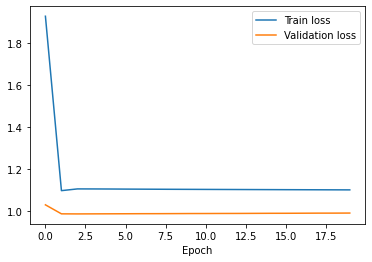

Train loss = tensor(1.0987, device='cuda:0', grad_fn=<AddBackward0>)
Val loss = tensor(0.9882, device='cuda:0')


In [ ]:
print("Best hyperparameters:", best_hyperparams)
print()

num_epochs = 20
inputs = left_hand_train
val_in = left_hand_val
targets = torch.FloatTensor(left_train_labels)
val_targets = torch.FloatTensor(left_val_labels)
inputs, targets = inputs.to(device), targets.to(device)
val_in, val_targets = val_in.to(device), val_targets.to(device)

model = LSTMRegressor(num_features, best_hyperparams['hidden_dim'], 
                      num_layers=best_hyperparams['L'], fc_size=best_hyperparams['fc_dim'])
optimizer = optim.SGD(model.parameters(), lr=best_hyperparams['lr'])
model = model.to(device)

running_train_loss = []
running_val_loss = []
for epoch in range(num_epochs):
  train_loss = 0
  for i in range(num_batches):
    model.zero_grad()
    batch = inputs[:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model(batch).squeeze()
    loss = loss_fn(scores, target_batch.squeeze())
    loss.backward()
    optimizer.step()
    train_loss += loss / num_batches
  val_loss = 0
  num_val_batches = val_in.shape[1] // batch_size + 1
  with torch.no_grad():
    for i in range(num_val_batches):
      batch = val_in[:, i * batch_size : min(val_in.shape[1], 
                                          i * batch_size + batch_size), :]
      target_batch = val_targets[i * batch_size : min(val_in.shape[1], 
                                          i * batch_size + batch_size)]
      val_scores = model(batch).squeeze()
      loss = loss_fn(val_scores, target_batch.squeeze())
      val_loss += loss / num_val_batches
  running_train_loss.append(train_loss)
  running_val_loss.append(val_loss)
  print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
      epoch, train_loss, val_loss))
  print("")

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(running_val_loss, label="Validation loss")
plt.legend()
plt.xlabel("Epoch")
plt.show()

print("Train loss =", min(running_train_loss))
print("Val loss =", min(running_val_loss))

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del model
del inputs
del targets
del val_in
del val_targets

#### Right hand model: Multi-layer LSTM

In [ ]:
seq_len = right_hand_train.shape[0]
num_samples = right_hand_train.shape[1]
num_features = 2
num_epochs = 10
batch_size = 8
num_batches = num_samples // batch_size + 1

class LSTMRegressor(nn.Module):

  def __init__(self, num_features, hidden_dim, num_layers=1, fc_size=10, bidirectional=True):
    super().__init__()
    self.lstm = nn.LSTM(num_features, hidden_dim, num_layers)
    self.linear = nn.Linear(hidden_dim, fc_size)
    self.relu = nn.ReLU()
    self.output = nn.Linear(fc_size, 1)

  def forward(self, x):
    all_h, (h, c) = self.lstm(x)
    h = torch.mean(h, dim=0)
    out = self.output(self.relu(self.linear(h)))
    return out

loss_fn = nn.MSELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
seed = 123
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

inputs = right_hand_train
val_in = right_hand_val
targets = torch.FloatTensor(right_train_labels)
val_targets = torch.FloatTensor(right_val_labels)

inputs, targets = inputs.to(device), targets.to(device)
val_in, val_targets = val_in.to(device), val_targets.to(device)

best_hyperparams = {}
best_val_loss = np.inf

for i in range(20):
  L = np.random.choice([1, 2])
  fc_dim = np.random.choice([20, 50, 100])
  lr = np.random.choice([1e-1, 1e-2, 1e-3])
  hidden_dim = np.random.choice([20, 50, 100])

  curr_hyperparams = {"L": L, "lr": lr, "fc_dim": fc_dim, 
                        "hidden_dim": hidden_dim}

  model = LSTMRegressor(num_features, hidden_dim, num_layers=L, fc_size=fc_dim)
  optimizer = optim.SGD(model.parameters(), lr=lr)
  model = model.to(device)

  running_train_loss = []
  running_val_loss = []
  for epoch in range(num_epochs):
    train_loss = 0
    for i in range(num_batches):
      model.zero_grad()
      batch = inputs[:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      target_batch = targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      scores = model(batch).squeeze()
      loss = loss_fn(scores, target_batch.squeeze())
      loss.backward()
      optimizer.step()
      train_loss += loss / num_batches
    val_loss = 0
    num_val_batches = val_in.shape[1] // batch_size + 1
    with torch.no_grad():
      for i in range(num_val_batches):
        batch = val_in[:, i * batch_size : min(val_in.shape[1], 
                                            i * batch_size + batch_size), :]
        target_batch = val_targets[i * batch_size : min(val_in.shape[1], 
                                            i * batch_size + batch_size)]
        val_scores = model(batch).squeeze()
        loss = loss_fn(val_scores, target_batch.squeeze())
        val_loss += loss / num_val_batches
    running_train_loss.append(train_loss)
    running_val_loss.append(val_loss)
  if min(running_val_loss) < best_val_loss:
    best_val_loss = min(running_val_loss)
    best_hyperparams = curr_hyperparams

  print(curr_hyperparams)
  print("Train loss:", min(running_train_loss))
  print("Val loss:", min(running_val_loss))
  print()

  gc.collect()
  torch.cuda.empty_cache()
  del model

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim': 100}
Train loss: tensor(3.5988, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.7083, device='cuda:0')

{'L': 1, 'lr': 0.001, 'fc_dim': 100, 'hidden_dim': 50}
Train loss: tensor(3.5511, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.6734, device='cuda:0')

{'L': 2, 'lr': 0.01, 'fc_dim': 100, 'hidden_dim': 100}
Train loss: tensor(1.1579, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.5639, device='cuda:0')

{'L': 2, 'lr': 0.01, 'fc_dim': 20, 'hidden_dim': 100}
Train loss: tensor(1.2673, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.5599, device='cuda:0')

{'L': 2, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim': 100}
Train loss: tensor(1.0864, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.5611, device='cuda:0')

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim': 50}
Train loss: tensor(3.4493, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.5948, device='cuda:0')

{'L': 1,

Best hyperparameters: {'L': 1, 'lr': 0.1, 'fc_dim': 20, 'hidden_dim': 20}

Epoch 0: 
 Training loss = 2.289931058883667 
 Validation loss = 0.5623569488525391

Epoch 1: 
 Training loss = 1.14216148853302 
 Validation loss = 0.5928241610527039

Epoch 2: 
 Training loss = 1.0981303453445435 
 Validation loss = 0.5965690612792969

Epoch 3: 
 Training loss = 1.0952551364898682 
 Validation loss = 0.5991940498352051

Epoch 4: 
 Training loss = 1.093427300453186 
 Validation loss = 0.6018163561820984

Epoch 5: 
 Training loss = 1.091676115989685 
 Validation loss = 0.6044585108757019

Epoch 6: 
 Training loss = 1.0899721384048462 
 Validation loss = 0.6071056723594666

Epoch 7: 
 Training loss = 1.088316798210144 
 Validation loss = 0.6097472906112671

Epoch 8: 
 Training loss = 1.086704134941101 
 Validation loss = 0.6124200820922852

Epoch 9: 
 Training loss = 1.0851068496704102 
 Validation loss = 0.6150590777397156

Epoch 10: 
 Training loss = 1.083560585975647 
 Validation loss = 0.6176

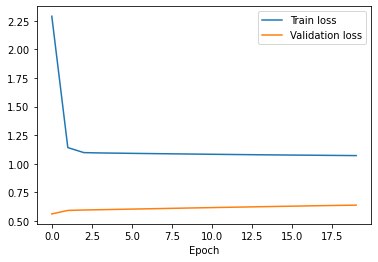

Train loss = tensor(1.0722, device='cuda:0', grad_fn=<AddBackward0>)
Val loss = tensor(0.5624, device='cuda:0')


In [ ]:
print("Best hyperparameters:", best_hyperparams)
print()

num_epochs = 20
inputs = right_hand_train
val_in = right_hand_val
targets = torch.FloatTensor(right_train_labels)
val_targets = torch.FloatTensor(right_val_labels)
inputs, targets = inputs.to(device), targets.to(device)
val_in, val_targets = val_in.to(device), val_targets.to(device)

model = LSTMRegressor(num_features, best_hyperparams['hidden_dim'], 
                      num_layers=best_hyperparams['L'], fc_size=best_hyperparams['fc_dim'])
optimizer = optim.SGD(model.parameters(), lr=best_hyperparams['lr'])
model = model.to(device)

running_train_loss = []
running_val_loss = []
for epoch in range(num_epochs):
  train_loss = 0
  for i in range(num_batches):
    model.zero_grad()
    batch = inputs[:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model(batch).squeeze()
    loss = loss_fn(scores, target_batch.squeeze())
    loss.backward()
    optimizer.step()
    train_loss += loss / num_batches
  val_loss = 0
  num_val_batches = val_in.shape[1] // batch_size + 1
  with torch.no_grad():
    for i in range(num_val_batches):
      batch = val_in[:, i * batch_size : min(val_in.shape[1], 
                                          i * batch_size + batch_size), :]
      target_batch = val_targets[i * batch_size : min(val_in.shape[1], 
                                          i * batch_size + batch_size)]
      val_scores = model(batch).squeeze()
      loss = loss_fn(val_scores, target_batch.squeeze())
      val_loss += loss / num_val_batches
  running_train_loss.append(train_loss)
  running_val_loss.append(val_loss)
  print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
      epoch, train_loss, val_loss))
  print("")

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(running_val_loss, label="Validation loss")
plt.legend()
plt.xlabel("Epoch")
plt.show()

print("Train loss =", min(running_train_loss))
print("Val loss =", min(running_val_loss))

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del model
del inputs
del targets
del val_in
del val_targets

### Primary + Secondary Features

In [ ]:
def primary_secondary_featurized_data(sample, hand):
  #distance, velocity, distance amplitude, velocity amplitude, frequency, 
  #acceleration, and movement coefficient of variation
  dist_right, dist_left, time = normalized_tapping_distance(sample.data)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  dist_right_amp, _ = distance_amplitude(time, dist_right)
  dist_left_amp, _ = distance_amplitude(time, dist_left)
  right_v_amp, _ = velocity_amplitude(time, right_v)
  left_v_amp, _ = velocity_amplitude(time, left_v)
  right_freq, _, _ = tapping_frequency(time, dist_right)
  left_freq, _, _ = tapping_frequency(time, dist_right)
  right_acc, _ = tap_acceleration(time, right_v)
  left_acc, _ = tap_acceleration(time, left_v)
  _, right_cv = movement_consistency(time, dist_right)
  _, left_cv = movement_consistency(time, dist_left)
  time = np.asarray(time) - time[0]
  seq_len = len(time)
  if sample.on_state == "on":
    label = sample.left_on_tapping_score if (hand == "left") else sample.right_on_tapping_score
  else:
    label = sample.left_off_tapping_score if (hand == "left") else sample.right_off_tapping_score
  featurized = np.zeros((seq_len, 1, 7))
  if hand == "left":
    featurized[:, 0, 0] = np.asarray(dist_left)
    featurized[:, 0, 1] = np.asarray(left_v)
    featurized[:, 0, 2] = np.asarray(dist_left_amp)
    featurized[:, 0, 3] = np.asarray(left_v_amp)
    featurized[:, 0, 4] = np.asarray(left_freq)
    featurized[:, 0, 5] = np.asarray(left_acc)
    featurized[:, 0, 6] = np.asarray(left_cv)
  elif hand == "right":
    featurized[:, 0, 0] = np.asarray(dist_right)
    featurized[:, 0, 1] = np.asarray(right_v)
    featurized[:, 0, 2] = np.asarray(dist_right_amp)
    featurized[:, 0, 3] = np.asarray(right_v_amp)
    featurized[:, 0, 4] = np.asarray(right_freq)
    featurized[:, 0, 5] = np.asarray(right_acc)
    featurized[:, 0, 6] = np.asarray(right_cv)
  else:
    return "error"
  return time, featurized, label

def primary_secondary_featurized_dataset(dataset, hand):
  featurized_list = []
  times_list = []
  labels = []
  for sample in dataset:
    time, featurized, label = primary_secondary_featurized_data(sample, hand)
    featurized_list.append(featurized)
    times_list.append(time)
    labels.append(label)
  times_concat = np.concatenate(times_list)
  times_union = np.unique(times_concat)
  featurized_interped_list = []
  seq_len = len(times_union)
  for i, f in enumerate(featurized_list):
    times_f = times_list[i]
    featurized_interped = torch.zeros((seq_len, 1, 7))
    for j in range(7):
      feature = f[:, 0, j]
      feature_interped = np.interp(times_union, times_f, feature)
      featurized_interped[:, 0, j] = torch.tensor(feature_interped)
    featurized_interped_list.append(featurized_interped)
  return featurized_interped_list, labels

In [ ]:
left_hand_featurized, left_hand_labels = primary_secondary_featurized_dataset(
                                          left_hand_data, "left")
right_hand_featurized, right_hand_labels = primary_secondary_featurized_dataset(
                                          right_hand_data, "right")

left_hand_featurized = [f for i, f in enumerate(left_hand_featurized) if 
                        left_hand_labels[i] <= 4 and left_hand_labels[i] >= 0]
left_hand_labels = [l for l in left_hand_labels if l <= 4 and l >= 0]
right_hand_featurized = [f for i, f in enumerate(right_hand_featurized) if 
                        right_hand_labels[i] <= 4 and right_hand_labels[i] >= 0]
right_hand_labels = [l for l in right_hand_labels if l <= 4 and l >= 0]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:43: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/p

In [ ]:
n = len(left_hand_featurized)
left_train_idxs = np.random.choice(range(n), round(0.8 * n), replace=False)
left_test_idxs = [i for i in range(n) if i not in left_train_idxs]

n = len(right_hand_featurized)
right_train_idxs = np.random.choice(range(n), round(0.8 * n), replace=False)
right_test_idxs = [i for i in range(n) if i not in right_train_idxs]

In [ ]:
left_hand_train = [left_hand_featurized[i] for i in left_train_idxs]
left_hand_train = torch.nan_to_num(torch.cat(left_hand_train, dim=1))
left_train_labels = [left_hand_labels[i] for i in left_train_idxs]
left_hand_test = [left_hand_featurized[i] for i in left_test_idxs]
left_test_labels = [left_hand_labels[i] for i in left_test_idxs]

right_hand_train = [right_hand_featurized[i] for i in right_train_idxs]
right_hand_train = torch.nan_to_num(torch.cat(right_hand_train, dim=1))
right_train_labels = [right_hand_labels[i] for i in right_train_idxs]
right_hand_test = [right_hand_featurized[i] for i in right_test_idxs]
right_test_labels = [right_hand_labels[i] for i in right_test_idxs]

In [ ]:
n = len(left_hand_test)
left_val_idxs = np.random.choice(range(n), round(0.6 * n), replace=False)
left_test_idxs = [i for i in range(n) if i not in left_val_idxs]

n = len(right_hand_test)
right_val_idxs = np.random.choice(range(n), round(0.6 * n), replace=False)
right_test_idxs = [i for i in range(n) if i not in right_val_idxs]

In [ ]:
left_hand_val = [left_hand_test[i] for i in left_val_idxs]
left_hand_val = torch.nan_to_num(torch.cat(left_hand_val, dim=1))
left_val_labels = [left_test_labels[i] for i in left_val_idxs]
left_hand_test = [left_hand_test[i] for i in left_test_idxs]
left_hand_test = torch.nan_to_num(torch.cat(left_hand_test, dim=1))
left_test_labels = [left_test_labels[i] for i in left_test_idxs]

right_hand_val = [right_hand_test[i] for i in right_val_idxs]
right_hand_val = torch.nan_to_num(torch.cat(right_hand_val, dim=1))
right_val_labels = [right_test_labels[i] for i in right_val_idxs]
right_hand_test = [right_hand_test[i] for i in right_test_idxs]
right_hand_test = torch.nan_to_num(torch.cat(right_hand_test, dim=1))
right_test_labels = [right_test_labels[i] for i in right_test_idxs]

In [ ]:
print(left_hand_train.size())
print(right_hand_train.size())
print(left_hand_val.size())
print(right_hand_val.size())
print(left_hand_test.size())
print(right_hand_test.size())

torch.Size([12088, 37, 7])
torch.Size([10266, 38, 7])
torch.Size([12088, 5, 7])
torch.Size([10266, 5, 7])
torch.Size([12088, 4, 7])
torch.Size([10266, 4, 7])


In [ ]:
def standardize_data(dataset):
  mean = torch.mean(dataset, dim=0)
  std = torch.std(dataset, dim=0)
  return (dataset - mean) / std

In [ ]:
left_hand_train = standardize_data(left_hand_train).nan_to_num()
right_hand_train = standardize_data(right_hand_train).nan_to_num()
left_hand_val = standardize_data(left_hand_val).nan_to_num()
right_hand_val = standardize_data(right_hand_val).nan_to_num()
left_hand_test = standardize_data(left_hand_test).nan_to_num()
right_hand_test = standardize_data(right_hand_test).nan_to_num()

#### Left hand model: Multi-layer LSTM

In [ ]:
seq_len = left_hand_train.shape[0]
num_samples = left_hand_train.shape[1]
num_features = 7
num_epochs = 10
batch_size = 8
num_batches = num_samples // batch_size + 1

class LSTMRegressor(nn.Module):

  def __init__(self, num_features, hidden_dim, num_layers=1, fc_size=10, bidirectional=True):
    super().__init__()
    self.lstm = nn.LSTM(num_features, hidden_dim, num_layers)
    self.linear = nn.Linear(hidden_dim, fc_size)
    self.relu = nn.ReLU()
    self.output = nn.Linear(fc_size, 1)

  def forward(self, x):
    all_h, (h, c) = self.lstm(x)
    h = torch.mean(h, dim=0)
    out = self.output(self.relu(self.linear(h)))
    return out

loss_fn = nn.MSELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
seed = 123
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

inputs = left_hand_train
val_in = left_hand_val
targets = torch.FloatTensor(left_train_labels)
val_targets = torch.FloatTensor(left_val_labels)

inputs, targets = inputs.to(device), targets.to(device)
val_in, val_targets = val_in.to(device), val_targets.to(device)

best_hyperparams = {}
best_val_loss = np.inf

for i in range(20):
  L = np.random.choice([1, 2])
  fc_dim = np.random.choice([20, 50, 100])
  lr = np.random.choice([1e-1, 1e-2, 1e-3])
  hidden_dim = np.random.choice([20, 50, 100])

  curr_hyperparams = {"L": L, "lr": lr, "fc_dim": fc_dim, 
                        "hidden_dim": hidden_dim}

  model = LSTMRegressor(num_features, hidden_dim, num_layers=L, fc_size=fc_dim)
  optimizer = optim.SGD(model.parameters(), lr=lr)
  model = model.to(device)

  running_train_loss = []
  running_val_loss = []
  for epoch in range(num_epochs):
    train_loss = 0
    for i in range(num_batches):
      model.zero_grad()
      batch = inputs[:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      target_batch = targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      scores = model(batch).squeeze()
      loss = loss_fn(scores, target_batch.squeeze())
      loss.backward()
      optimizer.step()
      train_loss += loss / num_batches
    val_loss = 0
    num_val_batches = val_in.shape[1] // batch_size + 1
    with torch.no_grad():
      for i in range(num_val_batches):
        batch = val_in[:, i * batch_size : min(val_in.shape[1], 
                                            i * batch_size + batch_size), :]
        target_batch = val_targets[i * batch_size : min(val_in.shape[1], 
                                            i * batch_size + batch_size)]
        val_scores = model(batch).squeeze()
        loss = loss_fn(val_scores, target_batch.squeeze())
        val_loss += loss / num_val_batches
    running_train_loss.append(train_loss)
    running_val_loss.append(val_loss)
  if min(running_val_loss) < best_val_loss:
    best_val_loss = min(running_val_loss)
    best_hyperparams = curr_hyperparams

  print(curr_hyperparams)
  print("Train loss:", min(running_train_loss))
  print("Val loss:", min(running_val_loss))
  print()

  gc.collect()
  torch.cuda.empty_cache()
  del model

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim': 100}
Train loss: tensor(1.8489, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.6177, device='cuda:0')

{'L': 1, 'lr': 0.001, 'fc_dim': 100, 'hidden_dim': 50}
Train loss: tensor(2.2326, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.9452, device='cuda:0')

{'L': 2, 'lr': 0.01, 'fc_dim': 100, 'hidden_dim': 100}
Train loss: tensor(0.8774, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6914, device='cuda:0')

{'L': 2, 'lr': 0.01, 'fc_dim': 20, 'hidden_dim': 100}
Train loss: tensor(0.9323, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.8268, device='cuda:0')

{'L': 2, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim': 100}
Train loss: tensor(0.9266, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.7012, device='cuda:0')

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim': 50}
Train loss: tensor(2.1932, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.9284, device='cuda:0')

{'L': 1,

Best hyperparameters: {'L': 1, 'lr': 0.01, 'fc_dim': 100, 'hidden_dim': 100}

Epoch 0: 
 Training loss = 3.049673557281494 
 Validation loss = 2.21600079536438

Epoch 1: 
 Training loss = 1.996559500694275 
 Validation loss = 1.5059722661972046

Epoch 2: 
 Training loss = 1.496194839477539 
 Validation loss = 1.0995463132858276

Epoch 3: 
 Training loss = 1.258925199508667 
 Validation loss = 0.8661112189292908

Epoch 4: 
 Training loss = 1.1352304220199585 
 Validation loss = 0.731478214263916

Epoch 5: 
 Training loss = 1.06220281124115 
 Validation loss = 0.6537342071533203

Epoch 6: 
 Training loss = 1.0159056186676025 
 Validation loss = 0.6094409823417664

Epoch 7: 
 Training loss = 0.9854884147644043 
 Validation loss = 0.5848560333251953

Epoch 8: 
 Training loss = 0.9648063778877258 
 Validation loss = 0.5718368887901306

Epoch 9: 
 Training loss = 0.9500744342803955 
 Validation loss = 0.5655866861343384

Epoch 10: 
 Training loss = 0.9389899373054504 
 Validation loss = 0.56

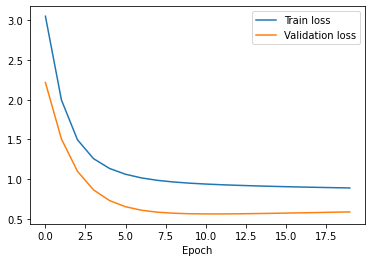

Train loss = tensor(0.8900, device='cuda:0', grad_fn=<AddBackward0>)
Val loss = tensor(0.5633, device='cuda:0')


In [ ]:
print("Best hyperparameters:", best_hyperparams)
print()

num_epochs = 20
inputs = left_hand_train
val_in = left_hand_val
targets = torch.FloatTensor(left_train_labels)
val_targets = torch.FloatTensor(left_val_labels)
inputs, targets = inputs.to(device), targets.to(device)
val_in, val_targets = val_in.to(device), val_targets.to(device)

model = LSTMRegressor(num_features, best_hyperparams['hidden_dim'], 
                      num_layers=best_hyperparams['L'], fc_size=best_hyperparams['fc_dim'])
optimizer = optim.SGD(model.parameters(), lr=best_hyperparams['lr'])
model = model.to(device)

running_train_loss = []
running_val_loss = []
for epoch in range(num_epochs):
  train_loss = 0
  for i in range(num_batches):
    model.zero_grad()
    batch = inputs[:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model(batch).squeeze()
    loss = loss_fn(scores, target_batch.squeeze())
    loss.backward()
    optimizer.step()
    train_loss += loss / num_batches
  val_loss = 0
  num_val_batches = val_in.shape[1] // batch_size + 1
  with torch.no_grad():
    for i in range(num_val_batches):
      batch = val_in[:, i * batch_size : min(val_in.shape[1], 
                                          i * batch_size + batch_size), :]
      target_batch = val_targets[i * batch_size : min(val_in.shape[1], 
                                          i * batch_size + batch_size)]
      val_scores = model(batch).squeeze()
      loss = loss_fn(val_scores, target_batch.squeeze())
      val_loss += loss / num_val_batches
  running_train_loss.append(train_loss)
  running_val_loss.append(val_loss)
  print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
      epoch, train_loss, val_loss))
  print("")

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(running_val_loss, label="Validation loss")
plt.legend()
plt.xlabel("Epoch")
plt.show()

print("Train loss =", min(running_train_loss))
print("Val loss =", min(running_val_loss))

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del model
del inputs
del targets
del val_in
del val_targets

#### Right hand model: Multi-layer LSTM

In [ ]:
seq_len = right_hand_train.shape[0]
num_samples = right_hand_train.shape[1]
num_features = 7
num_epochs = 10
batch_size = 8
num_batches = num_samples // batch_size + 1

class LSTMRegressor(nn.Module):

  def __init__(self, num_features, hidden_dim, num_layers=1, fc_size=10, bidirectional=True):
    super().__init__()
    self.lstm = nn.LSTM(num_features, hidden_dim, num_layers)
    self.linear = nn.Linear(hidden_dim, fc_size)
    self.relu = nn.ReLU()
    self.output = nn.Linear(fc_size, 1)

  def forward(self, x):
    all_h, (h, c) = self.lstm(x)
    h = torch.mean(h, dim=0)
    out = self.output(self.relu(self.linear(h)))
    return out

loss_fn = nn.MSELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
seed = 123
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

inputs = right_hand_train
val_in = right_hand_val
targets = torch.FloatTensor(right_train_labels)
val_targets = torch.FloatTensor(right_val_labels)

inputs, targets = inputs.to(device), targets.to(device)
val_in, val_targets = val_in.to(device), val_targets.to(device)

best_hyperparams = {}
best_val_loss = np.inf

for i in range(20):
  L = np.random.choice([1, 2])
  fc_dim = np.random.choice([20, 50, 100])
  lr = np.random.choice([1e-1, 1e-2, 1e-3])
  hidden_dim = np.random.choice([20, 50, 100])

  curr_hyperparams = {"L": L, "lr": lr, "fc_dim": fc_dim, 
                        "hidden_dim": hidden_dim}

  model = LSTMRegressor(num_features, hidden_dim, num_layers=L, fc_size=fc_dim)
  optimizer = optim.SGD(model.parameters(), lr=lr)
  model = model.to(device)

  running_train_loss = []
  running_val_loss = []
  for epoch in range(num_epochs):
    train_loss = 0
    for i in range(num_batches):
      model.zero_grad()
      batch = inputs[:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      target_batch = targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      scores = model(batch).squeeze()
      loss = loss_fn(scores, target_batch.squeeze())
      loss.backward()
      optimizer.step()
      train_loss += loss / num_batches
    val_loss = 0
    num_val_batches = val_in.shape[1] // batch_size + 1
    with torch.no_grad():
      for i in range(num_val_batches):
        batch = val_in[:, i * batch_size : min(val_in.shape[1], 
                                            i * batch_size + batch_size), :]
        target_batch = val_targets[i * batch_size : min(val_in.shape[1], 
                                            i * batch_size + batch_size)]
        val_scores = model(batch).squeeze()
        loss = loss_fn(val_scores, target_batch.squeeze())
        val_loss += loss / num_val_batches
    running_train_loss.append(train_loss)
    running_val_loss.append(val_loss)
  if min(running_val_loss) < best_val_loss:
    best_val_loss = min(running_val_loss)
    best_hyperparams = curr_hyperparams

  print(curr_hyperparams)
  print("Train loss:", min(running_train_loss))
  print("Val loss:", min(running_val_loss))
  print()

  gc.collect()
  torch.cuda.empty_cache()
  del model

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim': 100}
Train loss: tensor(2.2537, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(2.7663, device='cuda:0')

{'L': 1, 'lr': 0.001, 'fc_dim': 100, 'hidden_dim': 50}
Train loss: tensor(2.6730, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(3.2290, device='cuda:0')

{'L': 2, 'lr': 0.01, 'fc_dim': 100, 'hidden_dim': 100}
Train loss: tensor(1.0887, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.3003, device='cuda:0')

{'L': 2, 'lr': 0.01, 'fc_dim': 20, 'hidden_dim': 100}
Train loss: tensor(1.1032, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.2831, device='cuda:0')

{'L': 2, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim': 100}
Train loss: tensor(1.0177, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6773, device='cuda:0')

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim': 50}
Train loss: tensor(2.6092, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(3.0488, device='cuda:0')

{'L': 1,

Best hyperparameters: {'L': 1, 'lr': 0.1, 'fc_dim': 20, 'hidden_dim': 20}

Epoch 0: 
 Training loss = 1.9075193405151367 
 Validation loss = 1.0816175937652588

Epoch 1: 
 Training loss = 1.0505149364471436 
 Validation loss = 0.9256267547607422

Epoch 2: 
 Training loss = 1.0338807106018066 
 Validation loss = 0.8482978940010071

Epoch 3: 
 Training loss = 1.015842318534851 
 Validation loss = 0.7838534712791443

Epoch 4: 
 Training loss = 1.0007317066192627 
 Validation loss = 0.7260710000991821

Epoch 5: 
 Training loss = 0.9877306818962097 
 Validation loss = 0.6783242225646973

Epoch 6: 
 Training loss = 0.9761680364608765 
 Validation loss = 0.6403055191040039

Epoch 7: 
 Training loss = 0.9657093286514282 
 Validation loss = 0.6106480956077576

Epoch 8: 
 Training loss = 0.9545577764511108 
 Validation loss = 0.5835137367248535

Epoch 9: 
 Training loss = 0.9443436861038208 
 Validation loss = 0.5622066855430603

Epoch 10: 
 Training loss = 0.9327032566070557 
 Validation loss =

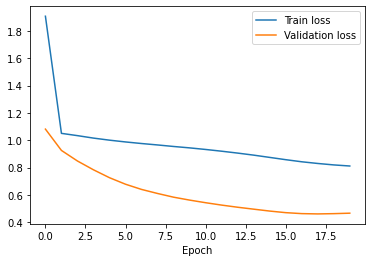

Train loss = tensor(0.8117, device='cuda:0', grad_fn=<AddBackward0>)
Val loss = tensor(0.4611, device='cuda:0')


In [ ]:
print("Best hyperparameters:", best_hyperparams)
print()

num_epochs = 20
inputs = right_hand_train
val_in = right_hand_val
targets = torch.FloatTensor(right_train_labels)
val_targets = torch.FloatTensor(right_val_labels)
inputs, targets = inputs.to(device), targets.to(device)
val_in, val_targets = val_in.to(device), val_targets.to(device)

model = LSTMRegressor(num_features, best_hyperparams['hidden_dim'], 
                      num_layers=best_hyperparams['L'], fc_size=best_hyperparams['fc_dim'])
optimizer = optim.SGD(model.parameters(), lr=best_hyperparams['lr'])
model = model.to(device)

running_train_loss = []
running_val_loss = []
for epoch in range(num_epochs):
  train_loss = 0
  for i in range(num_batches):
    model.zero_grad()
    batch = inputs[:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model(batch).squeeze()
    loss = loss_fn(scores, target_batch.squeeze())
    loss.backward()
    optimizer.step()
    train_loss += loss / num_batches
  val_loss = 0
  num_val_batches = val_in.shape[1] // batch_size + 1
  with torch.no_grad():
    for i in range(num_val_batches):
      batch = val_in[:, i * batch_size : min(val_in.shape[1], 
                                          i * batch_size + batch_size), :]
      target_batch = val_targets[i * batch_size : min(val_in.shape[1], 
                                          i * batch_size + batch_size)]
      val_scores = model(batch).squeeze()
      loss = loss_fn(val_scores, target_batch.squeeze())
      val_loss += loss / num_val_batches
  running_train_loss.append(train_loss)
  running_val_loss.append(val_loss)
  print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
      epoch, train_loss, val_loss))
  print("")

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(running_val_loss, label="Validation loss")
plt.legend()
plt.xlabel("Epoch")
plt.show()

print("Train loss =", min(running_train_loss))
print("Val loss =", min(running_val_loss))

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del model
del inputs
del targets
del val_in
del val_targets

### Primary (with Fourier) Features

In [ ]:
def primary_featurized_data(sample, hand):
  dist_right, dist_left, time = normalized_tapping_distance(sample.data)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  time = np.asarray(time) - time[0]
  seq_len = len(time)
  if sample.on_state == "on":
    label = sample.left_on_tapping_score if (hand == "left") else sample.right_on_tapping_score
  else:
    label = sample.left_off_tapping_score if (hand == "left") else sample.right_off_tapping_score
  featurized_main = np.zeros((seq_len, 1, 2))
  if hand == "left":
    featurized_main[:, 0, 0] = np.asarray(dist_left)
    featurized_main[:, 0, 1] = np.asarray(left_v)
  elif hand == "right":
    featurized_main[:, 0, 0] = np.asarray(dist_right)
    featurized_main[:, 0, 1] = np.asarray(right_v)
  else:
    return "error"
  dist_right_spectrum, freq = fourier_transform(time, np.asarray(dist_right))
  dist_left_spectrum, _ = fourier_transform(time, np.asarray(dist_left))
  right_v_spectrum, _ = fourier_transform(time, np.asarray(right_v))
  left_v_spectrum, _ = fourier_transform(time, np.asarray(left_v))
  seq_len = len(freq)
  featurized_fourier = np.zeros((seq_len, 1, 2))
  if hand == "left":
    featurized_fourier[:, 0, 0] = dist_left_spectrum
    featurized_fourier[:, 0, 1] = left_v_spectrum
  elif hand == "right":
    featurized_fourier[:, 0, 0] = dist_right_spectrum
    featurized_fourier[:, 0, 1] = right_v_spectrum
  else:
    return "error"
  return time, featurized_main, freq, featurized_fourier, label

def primary_featurized_dataset(dataset, hand):
  featurized_main_list = []
  times_list = []
  featurized_fourier_list = []
  freq_list = []
  labels = []
  for sample in dataset:
    time, featurized_main, freq, featurized_fourier, label = primary_featurized_data(sample, hand)
    featurized_main_list.append(featurized_main)
    times_list.append(time)
    featurized_fourier_list.append(featurized_fourier)
    freq_list.append(freq)
    labels.append(label)
  times_concat = np.concatenate(times_list)
  times_union = np.unique(times_concat)
  freq_concat = np.concatenate(freq_list)
  freq_union = np.unique(freq_concat)
  featurized_main_interped_list = []
  featurized_fourier_interped_list = []

  seq_len = len(times_union)
  for i, f in enumerate(featurized_main_list):
    times_f = times_list[i]
    dist_f = f[:, 0, 0]
    v_f = f[:, 0, 1]
    dist_interped = np.interp(times_union, times_f, dist_f)
    v_interped = np.interp(times_union, times_f, v_f)
    featurized_interped = torch.zeros((seq_len, 1, 2))
    featurized_interped[:, 0, 0] = torch.tensor(dist_interped)
    featurized_interped[:, 0, 1] = torch.tensor(v_interped)
    featurized_main_interped_list.append(featurized_interped)
  
  seq_len = len(freq_union)
  for i, f in enumerate(featurized_fourier_list):
    freq_f = freq_list[i]
    dist_spectrum_f = f[:, 0, 0]
    v_spectrum_f = f[:, 0, 1]
    dist_spectrum_interped = np.interp(freq_union, freq_f, dist_spectrum_f)
    v_spectrum_interped = np.interp(freq_union, freq_f, v_spectrum_f)
    featurized_interped = torch.zeros((seq_len, 1, 2))
    featurized_interped[:, 0, 0] = torch.tensor(dist_spectrum_interped)
    featurized_interped[:, 0, 1] = torch.tensor(v_spectrum_interped)
    featurized_fourier_interped_list.append(featurized_interped)
    
  return (featurized_main_interped_list, featurized_fourier_interped_list), labels

In [ ]:
left_hand_featurized, left_hand_labels = primary_featurized_dataset(
                                          left_hand_data, "left")
right_hand_featurized, right_hand_labels = primary_featurized_dataset(
                                          right_hand_data, "right")

left_hand_featurized_main = [left_hand_featurized[0][i] for i in 
                             range(len(left_hand_featurized[0])) if 
                             left_hand_labels[i] <= 4 and left_hand_labels[i] >= 0]
left_hand_featurized_fourier = [left_hand_featurized[1][i] for i in 
                             range(len(left_hand_featurized[1])) if 
                             left_hand_labels[i] <= 4 and left_hand_labels[i] >= 0]
left_hand_labels = [l for l in left_hand_labels if l <= 4 and l >= 0]

right_hand_featurized_main = [right_hand_featurized[0][i] for i in 
                             range(len(right_hand_featurized[0])) if 
                             right_hand_labels[i] <= 4 and right_hand_labels[i] >= 0]
right_hand_featurized_fourier = [right_hand_featurized[1][i] for i in 
                             range(len(right_hand_featurized[1])) if 
                             right_hand_labels[i] <= 4 and right_hand_labels[i] >= 0]
right_hand_labels = [l for l in right_hand_labels if l <= 4 and l >= 0]

In [ ]:
n = len(left_hand_featurized_main)
left_train_idxs = np.random.choice(range(n), round(0.8 * n), replace=False)
left_test_idxs = [i for i in range(n) if i not in left_train_idxs]

n = len(right_hand_featurized_main)
right_train_idxs = np.random.choice(range(n), round(0.8 * n), replace=False)
right_test_idxs = [i for i in range(n) if i not in right_train_idxs]

In [ ]:
left_hand_train_main = [left_hand_featurized_main[i] for i in left_train_idxs]
left_hand_train_fourier = [left_hand_featurized_fourier[i] for i in left_train_idxs]
left_hand_train_main = torch.nan_to_num(torch.cat(left_hand_train_main, dim=1))
left_hand_train_fourier = torch.nan_to_num(torch.cat(left_hand_train_fourier, dim=1))
left_train_labels = [left_hand_labels[i] for i in left_train_idxs]

left_hand_test_main = [left_hand_featurized_main[i] for i in left_test_idxs]
left_hand_test_fourier = [left_hand_featurized_fourier[i] for i in left_test_idxs]
left_test_labels = [left_hand_labels[i] for i in left_test_idxs]

right_hand_train_main = [right_hand_featurized_main[i] for i in right_train_idxs]
right_hand_train_fourier = [right_hand_featurized_fourier[i] for i in right_train_idxs]
right_hand_train_main = torch.nan_to_num(torch.cat(right_hand_train_main, dim=1))
right_hand_train_fourier = torch.nan_to_num(torch.cat(right_hand_train_fourier, dim=1))
right_train_labels = [right_hand_labels[i] for i in right_train_idxs]

right_hand_test_main = [right_hand_featurized_main[i] for i in right_test_idxs]
right_hand_test_fourier = [right_hand_featurized_fourier[i] for i in right_test_idxs]
right_test_labels = [right_hand_labels[i] for i in right_test_idxs]

In [ ]:
n = len(left_hand_test_main)
left_val_idxs = np.random.choice(range(n), round(0.6 * n), replace=False)
left_test_idxs = [i for i in range(n) if i not in left_val_idxs]

n = len(right_hand_test_main)
right_val_idxs = np.random.choice(range(n), round(0.6 * n), replace=False)
right_test_idxs = [i for i in range(n) if i not in right_val_idxs]

In [ ]:
left_hand_val_main = [left_hand_test_main[i] for i in left_val_idxs]
left_hand_val_main = torch.nan_to_num(torch.cat(left_hand_val_main, dim=1))
left_hand_val_fourier = [left_hand_test_fourier[i] for i in left_val_idxs]
left_hand_val_fourier = torch.nan_to_num(torch.cat(left_hand_val_fourier, dim=1))
left_val_labels = [left_test_labels[i] for i in left_val_idxs]

left_hand_test_main = [left_hand_test_main[i] for i in left_test_idxs]
left_hand_test_main = torch.nan_to_num(torch.cat(left_hand_test_main, dim=1))
left_hand_test_fourier = [left_hand_test_fourier[i] for i in left_test_idxs]
left_hand_test_fourier = torch.nan_to_num(torch.cat(left_hand_test_fourier, dim=1))
left_test_labels = [left_test_labels[i] for i in left_test_idxs]

right_hand_val_main = [right_hand_test_main[i] for i in right_val_idxs]
right_hand_val_main = torch.nan_to_num(torch.cat(right_hand_val_main, dim=1))
right_hand_val_fourier = [right_hand_test_fourier[i] for i in right_val_idxs]
right_hand_val_fourier = torch.nan_to_num(torch.cat(right_hand_val_fourier, dim=1))
right_val_labels = [right_test_labels[i] for i in right_val_idxs]

right_hand_test_main = [right_hand_test_main[i] for i in right_test_idxs]
right_hand_test_main = torch.nan_to_num(torch.cat(right_hand_test_main, dim=1))
right_hand_test_fourier = [right_hand_test_fourier[i] for i in right_test_idxs]
right_hand_test_fourier = torch.nan_to_num(torch.cat(right_hand_test_fourier, dim=1))
right_test_labels = [right_test_labels[i] for i in right_test_idxs]

In [ ]:
print(left_hand_train_main.size())
print(left_hand_train_fourier.size())
print(right_hand_train_main.size())
print(right_hand_train_fourier.size())
print(left_hand_val_main.size())
print(left_hand_val_fourier.size())
print(right_hand_val_main.size())
print(right_hand_val_fourier.size())
print(left_hand_test_main.size())
print(left_hand_test_fourier.size())
print(right_hand_test_main.size())
print(right_hand_test_fourier.size())

torch.Size([12088, 37, 2])
torch.Size([17696, 37, 2])
torch.Size([10266, 38, 2])
torch.Size([15727, 38, 2])
torch.Size([12088, 5, 2])
torch.Size([17696, 5, 2])
torch.Size([10266, 5, 2])
torch.Size([15727, 5, 2])
torch.Size([12088, 4, 2])
torch.Size([17696, 4, 2])
torch.Size([10266, 4, 2])
torch.Size([15727, 4, 2])


In [ ]:
def standardize_data(dataset):
  mean = torch.mean(dataset, dim=0)
  std = torch.std(dataset, dim=0)
  return (dataset - mean) / std

In [ ]:
left_hand_train_main = standardize_data(left_hand_train_main)
right_hand_train_main = standardize_data(right_hand_train_main)
left_hand_val_main = standardize_data(left_hand_val_main)
right_hand_val_main = standardize_data(right_hand_val_main)
left_hand_test_main = standardize_data(left_hand_test_main)
right_hand_test_main = standardize_data(right_hand_test_main)

left_hand_train_fourier = standardize_data(left_hand_train_fourier)
right_hand_train_fourier = standardize_data(right_hand_train_fourier)
left_hand_val_fourier = standardize_data(left_hand_val_fourier)
right_hand_val_fourier = standardize_data(right_hand_val_fourier)
left_hand_test_fourier = standardize_data(left_hand_test_fourier)
right_hand_test_fourier = standardize_data(right_hand_test_fourier)

#### Left hand model: Multi-layer LSTM

In [ ]:
seq_len_main = left_hand_train_main.shape[0]
num_samples = left_hand_train_main.shape[1]
num_features = 2
num_epochs = 10
batch_size = 8
num_batches = num_samples // batch_size + 1

class LSTMRegressorWithFourierAux(nn.Module):

  def __init__(self, num_features, hidden_dim_main, hidden_dim_aux, 
               num_layers=1, fc_size=10, bidirectional=True):
    super().__init__()
    self.lstm_main = nn.LSTM(num_features, hidden_dim_main, num_layers)
    if num_features == 2:
      self.lstm_aux = nn.LSTM(2, hidden_dim_aux, num_layers)
    elif num_features == 7:
      self.lstm_aux = nn.LSTM(5, hidden_dim_aux, num_layers)
    self.linear_main = nn.Linear(hidden_dim_main, fc_size)
    self.linear_aux = nn.Linear(hidden_dim_aux, fc_size)
    self.relu = nn.ReLU()
    self.output = nn.Linear(2 * fc_size, 1)

  def forward(self, x):
    x_main = x[0]
    x_fourier = x[1]
    all_h, (h, c) = self.lstm_main(x_main)
    h_main = torch.mean(h, dim=0)
    all_h, (h, c) = self.lstm_aux(x_fourier)
    h_aux = torch.mean(h, dim=0)
    a_main = self.relu(self.linear_main(h_main))
    a_aux = self.relu(self.linear_aux(h_aux))
    out = self.output(torch.cat([a_main, a_aux], dim=-1))
    return out

loss_fn = nn.MSELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
seed = 123
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

inputs = [left_hand_train_main, left_hand_train_fourier]
val_in = [left_hand_val_main, left_hand_val_fourier]
targets = torch.FloatTensor(left_train_labels)
val_targets = torch.FloatTensor(left_val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

best_hyperparams = {}
best_val_loss = np.inf

for i in range(20):
  L = np.random.choice([1, 2])
  fc_dim = np.random.choice([20, 50, 100])
  lr = np.random.choice([1e-1, 1e-2, 1e-3])
  hidden_dim_main = np.random.choice([20, 50, 100])
  hidden_dim_aux = np.random.choice([20, 50, 100])

  curr_hyperparams = {"L": L, "lr": lr, "fc_dim": fc_dim, 
                      "hidden_dim_main": hidden_dim_main, 
                      "hidden_dim_aux":hidden_dim_aux}

  model = LSTMRegressorWithFourierAux(num_features, hidden_dim_main, hidden_dim_aux, 
                                      num_layers=L, fc_size=fc_dim)
  optimizer = optim.SGD(model.parameters(), lr=lr)
  model = model.to(device)

  running_train_loss = []
  running_val_loss = []
  for epoch in range(num_epochs):
    train_loss = 0
    for i in range(num_batches):
      model.zero_grad()
      batch_main = inputs[0][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      batch_fourier = inputs[1][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      target_batch = targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      scores = model((batch_main, batch_fourier)).squeeze()
      loss = loss_fn(scores, target_batch.squeeze())
      loss.backward()
      optimizer.step()
      train_loss += loss / num_batches
    val_loss = 0
    num_val_batches = val_in[0].shape[1] // batch_size + 1
    with torch.no_grad():
      for i in range(num_val_batches):
        batch_main = val_in[0][:, i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size), :]
        batch_fourier = val_in[1][:, i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size), :]
        target_batch = val_targets[i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size)]
        val_scores = model((batch_main, batch_fourier)).squeeze()
        loss = loss_fn(val_scores, target_batch.squeeze())
        val_loss += loss / num_val_batches
    running_train_loss.append(train_loss)
    running_val_loss.append(val_loss)
  if min(running_val_loss) < best_val_loss:
    best_val_loss = min(running_val_loss)
    best_hyperparams = curr_hyperparams

  print(curr_hyperparams)
  print("Train loss:", min(running_train_loss))
  print("Val loss:", min(running_val_loss))
  print()

  gc.collect()
  torch.cuda.empty_cache()
  del model

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim_main': 100, 'hidden_dim_aux': 20}
Train loss: tensor(2.9186, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(2.8717, device='cuda:0')

{'L': 1, 'lr': 0.01, 'fc_dim': 100, 'hidden_dim_main': 100, 'hidden_dim_aux': 50}
Train loss: tensor(0.9842, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.0673, device='cuda:0')

{'L': 1, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim_main': 50, 'hidden_dim_aux': 100}
Train loss: tensor(1.0241, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.0778, device='cuda:0')

{'L': 2, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim_main': 100, 'hidden_dim_aux': 20}
Train loss: tensor(1.0481, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.0622, device='cuda:0')

{'L': 2, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim_main': 50, 'hidden_dim_aux': 20}
Train loss: tensor(2.8464, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(2.8054, device='cuda:0')

{'L': 1, 'lr': 0.1, 'fc_dim': 20, 'hidde

In [ ]:
del inputs
del val_in

Best hyperparameters: {'L': 1, 'lr': 0.1, 'fc_dim': 20, 'hidden_dim_main': 50, 'hidden_dim_aux': 100}

Epoch 0: 
 Training loss = 2.0455451011657715 
 Validation loss = 1.0945018529891968

Epoch 1: 
 Training loss = 1.0149855613708496 
 Validation loss = 1.08305823802948

Epoch 2: 
 Training loss = 1.0298172235488892 
 Validation loss = 1.0948861837387085

Epoch 3: 
 Training loss = 1.0320850610733032 
 Validation loss = 1.0968096256256104

Epoch 4: 
 Training loss = 1.0296266078948975 
 Validation loss = 1.0983116626739502

Epoch 5: 
 Training loss = 1.0268943309783936 
 Validation loss = 1.1000537872314453

Epoch 6: 
 Training loss = 1.0241174697875977 
 Validation loss = 1.1021419763565063

Epoch 7: 
 Training loss = 1.021427869796753 
 Validation loss = 1.1046637296676636

Epoch 8: 
 Training loss = 1.0187044143676758 
 Validation loss = 1.1075633764266968

Epoch 9: 
 Training loss = 1.0160545110702515 
 Validation loss = 1.1109215021133423

Epoch 10: 
 Training loss = 1.0133378505

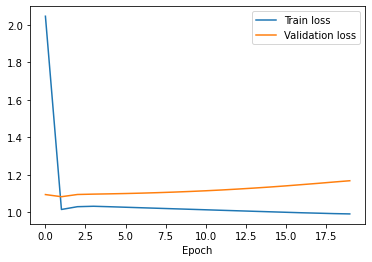

Train loss = tensor(0.9913, device='cuda:0', grad_fn=<AddBackward0>)
Val loss = tensor(1.0831, device='cuda:0')


In [ ]:
print("Best hyperparameters:", best_hyperparams)
print()

num_epochs = 20
inputs = [left_hand_train_main, left_hand_train_fourier]
val_in = [left_hand_val_main, left_hand_val_fourier]
targets = torch.FloatTensor(left_train_labels)
val_targets = torch.FloatTensor(left_val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

model = LSTMRegressorWithFourierAux(num_features, 
                                    best_hyperparams['hidden_dim_main'],
                                    best_hyperparams['hidden_dim_aux'], 
                                    num_layers=best_hyperparams['L'], 
                                    fc_size=best_hyperparams['fc_dim'])
optimizer = optim.SGD(model.parameters(), lr=best_hyperparams['lr'])
model = model.to(device)

running_train_loss = []
running_val_loss = []
for epoch in range(num_epochs):
  train_loss = 0
  for i in range(num_batches):
    model.zero_grad()
    batch_main = inputs[0][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
    batch_fourier = inputs[1][:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model((batch_main, batch_fourier)).squeeze()
    loss = loss_fn(scores, target_batch.squeeze())
    loss.backward()
    optimizer.step()
    train_loss += loss / num_batches
  val_loss = 0
  num_val_batches = val_in[0].shape[1] // batch_size + 1
  with torch.no_grad():
    for i in range(num_val_batches):
      batch_main = val_in[0][:, i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size), :]
      batch_fourier = val_in[1][:, i * batch_size : min(val_in[0].shape[1], 
                                          i * batch_size + batch_size), :]
      target_batch = val_targets[i * batch_size : min(val_in[0].shape[1], 
                                          i * batch_size + batch_size)]
      val_scores = model((batch_main, batch_fourier)).squeeze()
      loss = loss_fn(val_scores, target_batch.squeeze())
      val_loss += loss / num_val_batches
  running_train_loss.append(train_loss)
  running_val_loss.append(val_loss)
  print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
      epoch, train_loss, val_loss))
  print("")

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(running_val_loss, label="Validation loss")
plt.legend()
plt.xlabel("Epoch")
plt.show()

print("Train loss =", min(running_train_loss))
print("Val loss =", min(running_val_loss))

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del model
del inputs
del targets
del val_in
del val_targets

#### Right hand model: Multi-layer LSTM

In [ ]:
seq_len_main = right_hand_train_main.shape[0]
num_samples = right_hand_train_main.shape[1]
num_features = 2
num_epochs = 10
batch_size = 8
num_batches = num_samples // batch_size + 1

class LSTMRegressorWithFourierAux(nn.Module):

  def __init__(self, num_features, hidden_dim_main, hidden_dim_aux, 
               num_layers=1, fc_size=10, bidirectional=True):
    super().__init__()
    self.lstm_main = nn.LSTM(num_features, hidden_dim_main, num_layers)
    if num_features == 2:
      self.lstm_aux = nn.LSTM(2, hidden_dim_aux, num_layers)
    elif num_features == 7:
      self.lstm_aux = nn.LSTM(5, hidden_dim_aux, num_layers)
    self.linear_main = nn.Linear(hidden_dim_main, fc_size)
    self.linear_aux = nn.Linear(hidden_dim_aux, fc_size)
    self.relu = nn.ReLU()
    self.output = nn.Linear(2 * fc_size, 1)

  def forward(self, x):
    x_main = x[0]
    x_fourier = x[1]
    all_h, (h, c) = self.lstm_main(x_main)
    h_main = torch.mean(h, dim=0)
    all_h, (h, c) = self.lstm_aux(x_fourier)
    h_aux = torch.mean(h, dim=0)
    a_main = self.relu(self.linear_main(h_main))
    a_aux = self.relu(self.linear_aux(h_aux))
    out = self.output(torch.cat([a_main, a_aux], dim=-1))
    return out

loss_fn = nn.MSELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
seed = 123
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

inputs = [right_hand_train_main, right_hand_train_fourier]
val_in = [right_hand_val_main, right_hand_val_fourier]
targets = torch.FloatTensor(right_train_labels)
val_targets = torch.FloatTensor(right_val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

best_hyperparams = {}
best_val_loss = np.inf

for i in range(20):
  L = np.random.choice([1, 2])
  fc_dim = np.random.choice([20, 50, 100])
  lr = np.random.choice([1e-1, 1e-2, 1e-3])
  hidden_dim_main = np.random.choice([20, 50, 100])
  hidden_dim_aux = np.random.choice([20, 50, 100])

  curr_hyperparams = {"L": L, "lr": lr, "fc_dim": fc_dim, 
                      "hidden_dim_main": hidden_dim_main, 
                      "hidden_dim_aux":hidden_dim_aux}

  model = LSTMRegressorWithFourierAux(num_features, hidden_dim_main, hidden_dim_aux, 
                                      num_layers=L, fc_size=fc_dim)
  optimizer = optim.SGD(model.parameters(), lr=lr)
  model = model.to(device)

  running_train_loss = []
  running_val_loss = []
  for epoch in range(num_epochs):
    train_loss = 0
    for i in range(num_batches):
      model.zero_grad()
      batch_main = inputs[0][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      batch_fourier = inputs[1][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      target_batch = targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      scores = model((batch_main, batch_fourier)).squeeze()
      loss = loss_fn(scores, target_batch.squeeze())
      loss.backward()
      optimizer.step()
      train_loss += loss / num_batches
    val_loss = 0
    num_val_batches = val_in[0].shape[1] // batch_size + 1
    with torch.no_grad():
      for i in range(num_val_batches):
        batch_main = val_in[0][:, i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size), :]
        batch_fourier = val_in[1][:, i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size), :]
        target_batch = val_targets[i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size)]
        val_scores = model((batch_main, batch_fourier)).squeeze()
        loss = loss_fn(val_scores, target_batch.squeeze())
        val_loss += loss / num_val_batches
    running_train_loss.append(train_loss)
    running_val_loss.append(val_loss)
  if min(running_val_loss) < best_val_loss:
    best_val_loss = min(running_val_loss)
    best_hyperparams = curr_hyperparams

  print(curr_hyperparams)
  print("Train loss:", min(running_train_loss))
  print("Val loss:", min(running_val_loss))
  print()

  gc.collect()
  torch.cuda.empty_cache()
  del model

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim_main': 100, 'hidden_dim_aux': 20}
Train loss: tensor(3.1637, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(3.2171, device='cuda:0')

{'L': 1, 'lr': 0.01, 'fc_dim': 100, 'hidden_dim_main': 100, 'hidden_dim_aux': 50}
Train loss: tensor(1.0753, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.4427, device='cuda:0')

{'L': 1, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim_main': 50, 'hidden_dim_aux': 100}
Train loss: tensor(1.0540, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.4530, device='cuda:0')

{'L': 2, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim_main': 100, 'hidden_dim_aux': 20}
Train loss: tensor(1.0820, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.4614, device='cuda:0')

{'L': 2, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim_main': 50, 'hidden_dim_aux': 20}
Train loss: tensor(3.1037, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(3.1659, device='cuda:0')

{'L': 1, 'lr': 0.1, 'fc_dim': 20, 'hidde

In [ ]:
del inputs
del val_in

Best hyperparameters: {'L': 1, 'lr': 0.01, 'fc_dim': 100, 'hidden_dim_main': 100, 'hidden_dim_aux': 50}

Epoch 0: 
 Training loss = 3.8459858894348145 
 Validation loss = 3.3089516162872314

Epoch 1: 
 Training loss = 2.8922088146209717 
 Validation loss = 2.607750654220581

Epoch 2: 
 Training loss = 2.231858730316162 
 Validation loss = 2.131244421005249

Epoch 3: 
 Training loss = 1.7753444910049438 
 Validation loss = 1.8193168640136719

Epoch 4: 
 Training loss = 1.4720587730407715 
 Validation loss = 1.629955530166626

Epoch 5: 
 Training loss = 1.2823388576507568 
 Validation loss = 1.5255239009857178

Epoch 6: 
 Training loss = 1.1710524559020996 
 Validation loss = 1.4745373725891113

Epoch 7: 
 Training loss = 1.1096910238265991 
 Validation loss = 1.4537509679794312

Epoch 8: 
 Training loss = 1.0775558948516846 
 Validation loss = 1.448099970817566

Epoch 9: 
 Training loss = 1.061357021331787 
 Validation loss = 1.449028491973877

Epoch 10: 
 Training loss = 1.053356409072

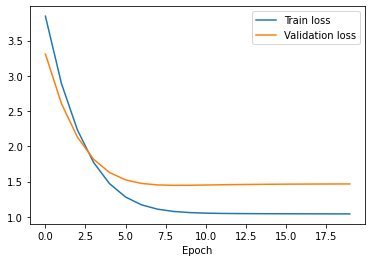

Train loss = tensor(1.0424, device='cuda:0', grad_fn=<AddBackward0>)
Val loss = tensor(1.4481, device='cuda:0')


In [ ]:
print("Best hyperparameters:", best_hyperparams)
print()

num_epochs = 20
inputs = [right_hand_train_main, right_hand_train_fourier]
val_in = [right_hand_val_main, right_hand_val_fourier]
targets = torch.FloatTensor(right_train_labels)
val_targets = torch.FloatTensor(right_val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

model = LSTMRegressorWithFourierAux(num_features, 
                                    best_hyperparams['hidden_dim_main'],
                                    best_hyperparams['hidden_dim_aux'], 
                                    num_layers=best_hyperparams['L'], 
                                    fc_size=best_hyperparams['fc_dim'])
optimizer = optim.SGD(model.parameters(), lr=best_hyperparams['lr'])
model = model.to(device)

running_train_loss = []
running_val_loss = []
for epoch in range(num_epochs):
  train_loss = 0
  for i in range(num_batches):
    model.zero_grad()
    batch_main = inputs[0][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
    batch_fourier = inputs[1][:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model((batch_main, batch_fourier)).squeeze()
    loss = loss_fn(scores, target_batch.squeeze())
    loss.backward()
    optimizer.step()
    train_loss += loss / num_batches
  val_loss = 0
  num_val_batches = val_in[0].shape[1] // batch_size + 1
  with torch.no_grad():
    for i in range(num_val_batches):
      batch_main = val_in[0][:, i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size), :]
      batch_fourier = val_in[1][:, i * batch_size : min(val_in[0].shape[1], 
                                          i * batch_size + batch_size), :]
      target_batch = val_targets[i * batch_size : min(val_in[0].shape[1], 
                                          i * batch_size + batch_size)]
      val_scores = model((batch_main, batch_fourier)).squeeze()
      loss = loss_fn(val_scores, target_batch.squeeze())
      val_loss += loss / num_val_batches
  running_train_loss.append(train_loss)
  running_val_loss.append(val_loss)
  print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
      epoch, train_loss, val_loss))
  print("")

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(running_val_loss, label="Validation loss")
plt.legend()
plt.xlabel("Epoch")
plt.show()

print("Train loss =", min(running_train_loss))
print("Val loss =", min(running_val_loss))

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del model
del inputs
del targets
del val_in
del val_targets

### Primary + Secondary (with Fourier) Features

In [ ]:
def primary_secondary_featurized_data(sample, hand):
  #distance, velocity, distance amplitude, velocity amplitude, frequency, 
  #acceleration, and movement coefficient of variation
  dist_right, dist_left, time = normalized_tapping_distance(sample.data)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  dist_right_amp, _ = distance_amplitude(time, dist_right)
  dist_left_amp, _ = distance_amplitude(time, dist_left)
  right_v_amp, _ = velocity_amplitude(time, right_v)
  left_v_amp, _ = velocity_amplitude(time, left_v)
  right_freq, _, _ = tapping_frequency(time, dist_right)
  left_freq, _, _ = tapping_frequency(time, dist_right)
  right_acc, _ = tap_acceleration(time, right_v)
  left_acc, _ = tap_acceleration(time, left_v)
  _, right_cv = movement_consistency(time, dist_right)
  _, left_cv = movement_consistency(time, dist_left)
  time = np.asarray(time) - time[0]
  seq_len = len(time)
  if sample.on_state == "on":
    label = sample.left_on_tapping_score if (hand == "left") else sample.right_on_tapping_score
  else:
    label = sample.left_off_tapping_score if (hand == "left") else sample.right_off_tapping_score
  featurized_main = np.zeros((seq_len, 1, 7))
  if hand == "left":
    featurized_main[:, 0, 0] = np.asarray(dist_left)
    featurized_main[:, 0, 1] = np.asarray(left_v)
    featurized_main[:, 0, 2] = np.asarray(dist_left_amp)
    featurized_main[:, 0, 3] = np.asarray(left_v_amp)
    featurized_main[:, 0, 4] = np.asarray(left_freq)
    featurized_main[:, 0, 5] = np.asarray(left_acc)
    featurized_main[:, 0, 6] = np.asarray(left_cv)
  elif hand == "right":
    featurized_main[:, 0, 0] = np.asarray(dist_right)
    featurized_main[:, 0, 1] = np.asarray(right_v)
    featurized_main[:, 0, 2] = np.asarray(dist_right_amp)
    featurized_main[:, 0, 3] = np.asarray(right_v_amp)
    featurized_main[:, 0, 4] = np.asarray(right_freq)
    featurized_main[:, 0, 5] = np.asarray(right_acc)
    featurized_main[:, 0, 6] = np.asarray(right_cv)
  else:
    return "error"
  dist_right_spectrum, freq = fourier_transform(time, np.asarray(dist_right))
  dist_left_spectrum, _ = fourier_transform(time, np.asarray(dist_left))
  right_v_spectrum, _ = fourier_transform(time, np.asarray(right_v))
  left_v_spectrum, _ = fourier_transform(time, np.asarray(left_v))
  dist_right_amp_spectrum, _ = fourier_transform(time, np.asarray(dist_right_amp))
  dist_left_amp_spectrum, _ = fourier_transform(time, np.asarray(dist_left_amp))
  right_v_amp_spectrum, _ = fourier_transform(time, np.asarray(right_v_amp))
  left_v_amp_spectrum, _ = fourier_transform(time, np.asarray(left_v_amp))
  right_acc_spectrum, _ = fourier_transform(time, np.asarray(right_acc))
  left_acc_spectrum, _ = fourier_transform(time, np.asarray(left_acc))
  seq_len = len(freq)
  featurized_fourier = np.zeros((seq_len, 1, 5))
  if hand == "left":
    featurized_fourier[:, 0, 0] = dist_left_spectrum
    featurized_fourier[:, 0, 1] = left_v_spectrum
    featurized_fourier[:, 0, 2] = dist_left_amp_spectrum
    featurized_fourier[:, 0, 3] = left_v_amp_spectrum
    featurized_fourier[:, 0, 4] = left_acc_spectrum
  elif hand == "right":
    featurized_fourier[:, 0, 0] = dist_right_spectrum
    featurized_fourier[:, 0, 1] = right_v_spectrum
    featurized_fourier[:, 0, 2] = dist_right_amp_spectrum
    featurized_fourier[:, 0, 3] = right_v_amp_spectrum
    featurized_fourier[:, 0, 4] = right_acc_spectrum
  else:
    return "error"
  return time, featurized_main, freq, featurized_fourier, label

def primary_secondary_featurized_dataset(dataset, hand):
  featurized_main_list = []
  featurized_fourier_list = []
  times_list = []
  freq_list = []
  labels = []
  for sample in dataset:
    time, featurized_main, freq, featurized_fourier, label = primary_secondary_featurized_data(sample, hand)
    featurized_main_list.append(featurized_main)
    featurized_fourier_list.append(featurized_fourier)
    times_list.append(time)
    freq_list.append(freq)
    labels.append(label)

  times_concat = np.concatenate(times_list)
  times_union = np.unique(times_concat)
  featurized_main_interped_list = []
  seq_len = len(times_union)
  for i, f in enumerate(featurized_main_list):
    times_f = times_list[i]
    featurized_interped = torch.zeros((seq_len, 1, 7))
    for j in range(7):
      feature = f[:, 0, j]
      feature_interped = np.interp(times_union, times_f, feature)
      featurized_interped[:, 0, j] = torch.tensor(feature_interped)
    featurized_main_interped_list.append(featurized_interped)

  freq_concat = np.concatenate(freq_list)
  freq_union = np.unique(freq_concat)
  featurized_fourier_interped_list = []
  seq_len = len(freq_union)
  for i, f in enumerate(featurized_fourier_list):
    freq_f = freq_list[i]
    featurized_interped = torch.zeros((seq_len, 1, 5))
    for j in range(5):
      feature = f[:, 0, j]
      feature_interped = np.interp(freq_union, freq_f, feature)
      featurized_interped[:, 0, j] = torch.tensor(feature_interped)
    featurized_fourier_interped_list.append(featurized_interped)

  return (featurized_main_interped_list, featurized_fourier_interped_list), labels

In [ ]:
(left_hand_featurized_main, 
 left_hand_featurized_fourier), left_hand_labels = primary_secondary_featurized_dataset(
                                          left_hand_data, "left")
(right_hand_featurized_main, 
 right_hand_featurized_fourier), right_hand_labels = primary_secondary_featurized_dataset(
                                          right_hand_data, "right")

left_hand_featurized_main = [f for i, f in enumerate(left_hand_featurized_main) if 
                        left_hand_labels[i] <= 4 and left_hand_labels[i] >= 0]
left_hand_featurized_fourier = [f for i, f in enumerate(left_hand_featurized_fourier) if 
                        left_hand_labels[i] <= 4 and left_hand_labels[i] >= 0]
left_hand_labels = [l for l in left_hand_labels if l <= 4 and l >= 0]

right_hand_featurized_main = [f for i, f in enumerate(right_hand_featurized_main) if 
                        right_hand_labels[i] <= 4 and right_hand_labels[i] >= 0]
right_hand_featurized_fourier = [f for i, f in enumerate(right_hand_featurized_fourier) if 
                        right_hand_labels[i] <= 4 and right_hand_labels[i] >= 0]
right_hand_labels = [l for l in right_hand_labels if l <= 4 and l >= 0]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:43: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/p

In [ ]:
n = len(left_hand_featurized_main)
left_train_idxs = np.random.choice(range(n), round(0.8 * n), replace=False)
left_test_idxs = [i for i in range(n) if i not in left_train_idxs]

n = len(right_hand_featurized_main)
right_train_idxs = np.random.choice(range(n), round(0.8 * n), replace=False)
right_test_idxs = [i for i in range(n) if i not in right_train_idxs]

In [ ]:
left_hand_train_main = [left_hand_featurized_main[i] for i in left_train_idxs]
left_hand_train_fourier = [left_hand_featurized_fourier[i] for i in left_train_idxs]
left_hand_train_main = torch.nan_to_num(torch.cat(left_hand_train_main, dim=1))
left_hand_train_fourier = torch.nan_to_num(torch.cat(left_hand_train_fourier, dim=1))
left_train_labels = [left_hand_labels[i] for i in left_train_idxs]

left_hand_test_main = [left_hand_featurized_main[i] for i in left_test_idxs]
left_hand_test_fourier = [left_hand_featurized_fourier[i] for i in left_test_idxs]
left_test_labels = [left_hand_labels[i] for i in left_test_idxs]

right_hand_train_main = [right_hand_featurized_main[i] for i in right_train_idxs]
right_hand_train_fourier = [right_hand_featurized_fourier[i] for i in right_train_idxs]
right_hand_train_main = torch.nan_to_num(torch.cat(right_hand_train_main, dim=1))
right_hand_train_fourier = torch.nan_to_num(torch.cat(right_hand_train_fourier, dim=1))
right_train_labels = [right_hand_labels[i] for i in right_train_idxs]

right_hand_test_main = [right_hand_featurized_main[i] for i in right_test_idxs]
right_hand_test_fourier = [right_hand_featurized_fourier[i] for i in right_test_idxs]
right_test_labels = [right_hand_labels[i] for i in right_test_idxs]

In [ ]:
n = len(left_hand_test_main)
left_val_idxs = np.random.choice(range(n), round(0.6 * n), replace=False)
left_test_idxs = [i for i in range(n) if i not in left_val_idxs]

n = len(right_hand_test_main)
right_val_idxs = np.random.choice(range(n), round(0.6 * n), replace=False)
right_test_idxs = [i for i in range(n) if i not in right_val_idxs]

In [ ]:
left_hand_val_main = [left_hand_test_main[i] for i in left_val_idxs]
left_hand_val_main = torch.nan_to_num(torch.cat(left_hand_val_main, dim=1))
left_hand_val_fourier = [left_hand_test_fourier[i] for i in left_val_idxs]
left_hand_val_fourier = torch.nan_to_num(torch.cat(left_hand_val_fourier, dim=1))
left_val_labels = [left_test_labels[i] for i in left_val_idxs]

left_hand_test_main = [left_hand_test_main[i] for i in left_test_idxs]
left_hand_test_main = torch.nan_to_num(torch.cat(left_hand_test_main, dim=1))
left_hand_test_fourier = [left_hand_test_fourier[i] for i in left_test_idxs]
left_hand_test_fourier = torch.nan_to_num(torch.cat(left_hand_test_fourier, dim=1))
left_test_labels = [left_test_labels[i] for i in left_test_idxs]

right_hand_val_main = [right_hand_test_main[i] for i in right_val_idxs]
right_hand_val_main = torch.nan_to_num(torch.cat(right_hand_val_main, dim=1))
right_hand_val_fourier = [right_hand_test_fourier[i] for i in right_val_idxs]
right_hand_val_fourier = torch.nan_to_num(torch.cat(right_hand_val_fourier, dim=1))
right_val_labels = [right_test_labels[i] for i in right_val_idxs]

right_hand_test_main = [right_hand_test_main[i] for i in right_test_idxs]
right_hand_test_main = torch.nan_to_num(torch.cat(right_hand_test_main, dim=1))
right_hand_test_fourier = [right_hand_test_fourier[i] for i in right_test_idxs]
right_hand_test_fourier = torch.nan_to_num(torch.cat(right_hand_test_fourier, dim=1))
right_test_labels = [right_test_labels[i] for i in right_test_idxs]

In [ ]:
print(left_hand_train_main.size())
print(left_hand_train_fourier.size())
print(right_hand_train_main.size())
print(right_hand_train_fourier.size())
print(left_hand_val_main.size())
print(left_hand_val_fourier.size())
print(right_hand_val_main.size())
print(right_hand_val_fourier.size())
print(left_hand_test_main.size())
print(left_hand_test_fourier.size())
print(right_hand_test_main.size())
print(right_hand_test_fourier.size())

torch.Size([12088, 37, 7])
torch.Size([17696, 37, 5])
torch.Size([10266, 38, 7])
torch.Size([15727, 38, 5])
torch.Size([12088, 5, 7])
torch.Size([17696, 5, 5])
torch.Size([10266, 5, 7])
torch.Size([15727, 5, 5])
torch.Size([12088, 4, 7])
torch.Size([17696, 4, 5])
torch.Size([10266, 4, 7])
torch.Size([15727, 4, 5])


In [ ]:
def standardize_data(dataset):
  mean = torch.mean(dataset, dim=0)
  std = torch.std(dataset, dim=0)
  return (dataset - mean) / std

In [ ]:
left_hand_train_main = standardize_data(left_hand_train_main).nan_to_num()
right_hand_train_main = standardize_data(right_hand_train_main).nan_to_num()
left_hand_val_main = standardize_data(left_hand_val_main).nan_to_num()
right_hand_val_main = standardize_data(right_hand_val_main).nan_to_num()
left_hand_test_main = standardize_data(left_hand_test_main).nan_to_num()
right_hand_test_main = standardize_data(right_hand_test_main).nan_to_num()

left_hand_train_fourier = standardize_data(left_hand_train_fourier).nan_to_num()
right_hand_train_fourier = standardize_data(right_hand_train_fourier).nan_to_num()
left_hand_val_fourier = standardize_data(left_hand_val_fourier).nan_to_num()
right_hand_val_fourier = standardize_data(right_hand_val_fourier).nan_to_num()
left_hand_test_fourier = standardize_data(left_hand_test_fourier).nan_to_num()
right_hand_test_fourier = standardize_data(right_hand_test_fourier).nan_to_num()

#### Left hand model: Multi-layer LSTM

In [ ]:
seq_len_main = left_hand_train_main.shape[0]
num_samples = left_hand_train_main.shape[1]
num_features = 7
num_epochs = 10
batch_size = 8
num_batches = num_samples // batch_size + 1

class LSTMRegressorWithFourierAux(nn.Module):

  def __init__(self, num_features, hidden_dim_main, hidden_dim_aux, 
               num_layers=1, fc_size=10, bidirectional=True):
    super().__init__()
    self.lstm_main = nn.LSTM(num_features, hidden_dim_main, num_layers)
    if num_features == 2:
      self.lstm_aux = nn.LSTM(2, hidden_dim_aux, num_layers)
    elif num_features == 7:
      self.lstm_aux = nn.LSTM(5, hidden_dim_aux, num_layers)
    self.linear_main = nn.Linear(hidden_dim_main, fc_size)
    self.linear_aux = nn.Linear(hidden_dim_aux, fc_size)
    self.relu = nn.ReLU()
    self.output = nn.Linear(2 * fc_size, 1)

  def forward(self, x):
    x_main = x[0]
    x_fourier = x[1]
    all_h, (h, c) = self.lstm_main(x_main)
    h_main = torch.mean(h, dim=0)
    all_h, (h, c) = self.lstm_aux(x_fourier)
    h_aux = torch.mean(h, dim=0)
    a_main = self.relu(self.linear_main(h_main))
    a_aux = self.relu(self.linear_aux(h_aux))
    out = self.output(torch.cat([a_main, a_aux], dim=-1))
    return out

loss_fn = nn.MSELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
seed = 123
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

inputs = [left_hand_train_main, left_hand_train_fourier]
val_in = [left_hand_val_main, left_hand_val_fourier]
targets = torch.FloatTensor(left_train_labels)
val_targets = torch.FloatTensor(left_val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

best_hyperparams = {}
best_val_loss = np.inf

for i in range(20):
  L = np.random.choice([1, 2])
  fc_dim = np.random.choice([20, 50, 100])
  lr = np.random.choice([1e-1, 1e-2, 1e-3])
  hidden_dim_main = np.random.choice([20, 50, 100])
  hidden_dim_aux = np.random.choice([20, 50, 100])

  curr_hyperparams = {"L": L, "lr": lr, "fc_dim": fc_dim, 
                      "hidden_dim_main": hidden_dim_main, 
                      "hidden_dim_aux":hidden_dim_aux}

  model = LSTMRegressorWithFourierAux(num_features, hidden_dim_main, hidden_dim_aux, 
                                      num_layers=L, fc_size=fc_dim)
  optimizer = optim.SGD(model.parameters(), lr=lr)
  model = model.to(device)

  running_train_loss = []
  running_val_loss = []
  for epoch in range(num_epochs):
    train_loss = 0
    for i in range(num_batches):
      model.zero_grad()
      batch_main = inputs[0][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      batch_fourier = inputs[1][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      target_batch = targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      scores = model((batch_main, batch_fourier)).squeeze()
      loss = loss_fn(scores, target_batch.squeeze())
      loss.backward()
      optimizer.step()
      train_loss += loss / num_batches
    val_loss = 0
    num_val_batches = val_in[0].shape[1] // batch_size + 1
    with torch.no_grad():
      for i in range(num_val_batches):
        batch_main = val_in[0][:, i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size), :]
        batch_fourier = val_in[1][:, i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size), :]
        target_batch = val_targets[i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size)]
        val_scores = model((batch_main, batch_fourier)).squeeze()
        loss = loss_fn(val_scores, target_batch.squeeze())
        val_loss += loss / num_val_batches
    running_train_loss.append(train_loss)
    running_val_loss.append(val_loss)
  if min(running_val_loss) < best_val_loss:
    best_val_loss = min(running_val_loss)
    best_hyperparams = curr_hyperparams

  print(curr_hyperparams)
  print("Train loss:", min(running_train_loss))
  print("Val loss:", min(running_val_loss))
  print()

  gc.collect()
  torch.cuda.empty_cache()
  del model

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim_main': 100, 'hidden_dim_aux': 20}
Train loss: tensor(2.7998, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(2.3115, device='cuda:0')

{'L': 1, 'lr': 0.01, 'fc_dim': 100, 'hidden_dim_main': 100, 'hidden_dim_aux': 50}
Train loss: tensor(0.9813, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.3301, device='cuda:0')

{'L': 1, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim_main': 50, 'hidden_dim_aux': 100}
Train loss: tensor(1.0401, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.3587, device='cuda:0')

{'L': 2, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim_main': 100, 'hidden_dim_aux': 20}
Train loss: tensor(1.0642, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.3786, device='cuda:0')

{'L': 2, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim_main': 50, 'hidden_dim_aux': 20}
Train loss: tensor(2.6364, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(2.2040, device='cuda:0')

{'L': 1, 'lr': 0.1, 'fc_dim': 20, 'hidde

In [ ]:
del inputs
del val_in

Best hyperparameters: {'L': 1, 'lr': 0.01, 'fc_dim': 100, 'hidden_dim_main': 100, 'hidden_dim_aux': 50}

Epoch 0: 
 Training loss = 3.286790370941162 
 Validation loss = 2.385669231414795

Epoch 1: 
 Training loss = 2.6215178966522217 
 Validation loss = 1.9851025342941284

Epoch 2: 
 Training loss = 2.1248645782470703 
 Validation loss = 1.7069271802902222

Epoch 3: 
 Training loss = 1.7536388635635376 
 Validation loss = 1.5231183767318726

Epoch 4: 
 Training loss = 1.4822922945022583 
 Validation loss = 1.4127782583236694

Epoch 5: 
 Training loss = 1.2914310693740845 
 Validation loss = 1.3570257425308228

Epoch 6: 
 Training loss = 1.1631730794906616 
 Validation loss = 1.3385908603668213

Epoch 7: 
 Training loss = 1.0811078548431396 
 Validation loss = 1.3425081968307495

Epoch 8: 
 Training loss = 1.0309504270553589 
 Validation loss = 1.3576463460922241

Epoch 9: 
 Training loss = 1.0015877485275269 
 Validation loss = 1.3765127658843994

Epoch 10: 
 Training loss = 0.9849348

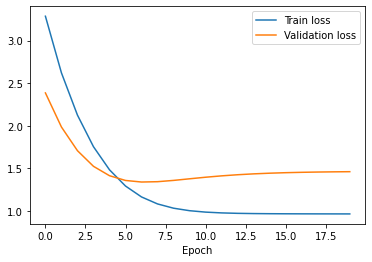

Train loss = tensor(0.9638, device='cuda:0', grad_fn=<AddBackward0>)
Val loss = tensor(1.3386, device='cuda:0')


In [ ]:
print("Best hyperparameters:", best_hyperparams)
print()

num_epochs = 20
inputs = [left_hand_train_main, left_hand_train_fourier]
val_in = [left_hand_val_main, left_hand_val_fourier]
targets = torch.FloatTensor(left_train_labels)
val_targets = torch.FloatTensor(left_val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

model = LSTMRegressorWithFourierAux(num_features, 
                                    best_hyperparams['hidden_dim_main'],
                                    best_hyperparams['hidden_dim_aux'], 
                                    num_layers=best_hyperparams['L'], 
                                    fc_size=best_hyperparams['fc_dim'])
optimizer = optim.SGD(model.parameters(), lr=best_hyperparams['lr'])
model = model.to(device)

running_train_loss = []
running_val_loss = []
for epoch in range(num_epochs):
  train_loss = 0
  for i in range(num_batches):
    model.zero_grad()
    batch_main = inputs[0][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
    batch_fourier = inputs[1][:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model((batch_main, batch_fourier)).squeeze()
    loss = loss_fn(scores, target_batch.squeeze())
    loss.backward()
    optimizer.step()
    train_loss += loss / num_batches
  val_loss = 0
  num_val_batches = val_in[0].shape[1] // batch_size + 1
  with torch.no_grad():
    for i in range(num_val_batches):
      batch_main = val_in[0][:, i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size), :]
      batch_fourier = val_in[1][:, i * batch_size : min(val_in[0].shape[1], 
                                          i * batch_size + batch_size), :]
      target_batch = val_targets[i * batch_size : min(val_in[0].shape[1], 
                                          i * batch_size + batch_size)]
      val_scores = model((batch_main, batch_fourier)).squeeze()
      loss = loss_fn(val_scores, target_batch.squeeze())
      val_loss += loss / num_val_batches
  running_train_loss.append(train_loss)
  running_val_loss.append(val_loss)
  print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
      epoch, train_loss, val_loss))
  print("")

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(running_val_loss, label="Validation loss")
plt.legend()
plt.xlabel("Epoch")
plt.show()

print("Train loss =", min(running_train_loss))
print("Val loss =", min(running_val_loss))

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del model
del inputs
del targets
del val_in
del val_targets

#### Right hand model: Multi-layer LSTM

In [ ]:
seq_len_main = right_hand_train_main.shape[0]
num_samples = right_hand_train_main.shape[1]
num_features = 7
num_epochs = 10
batch_size = 8
num_batches = num_samples // batch_size + 1

class LSTMRegressorWithFourierAux(nn.Module):

  def __init__(self, num_features, hidden_dim_main, hidden_dim_aux, 
               num_layers=1, fc_size=10, bidirectional=True):
    super().__init__()
    self.lstm_main = nn.LSTM(num_features, hidden_dim_main, num_layers)
    if num_features == 2:
      self.lstm_aux = nn.LSTM(2, hidden_dim_aux, num_layers)
    elif num_features == 7:
      self.lstm_aux = nn.LSTM(5, hidden_dim_aux, num_layers)
    self.linear_main = nn.Linear(hidden_dim_main, fc_size)
    self.linear_aux = nn.Linear(hidden_dim_aux, fc_size)
    self.relu = nn.ReLU()
    self.output = nn.Linear(2 * fc_size, 1)

  def forward(self, x):
    x_main = x[0]
    x_fourier = x[1]
    all_h, (h, c) = self.lstm_main(x_main)
    h_main = torch.mean(h, dim=0)
    all_h, (h, c) = self.lstm_aux(x_fourier)
    h_aux = torch.mean(h, dim=0)
    a_main = self.relu(self.linear_main(h_main))
    a_aux = self.relu(self.linear_aux(h_aux))
    out = self.output(torch.cat([a_main, a_aux], dim=-1))
    return out

loss_fn = nn.MSELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
seed = 123
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

inputs = [right_hand_train_main, right_hand_train_fourier]
val_in = [right_hand_val_main, right_hand_val_fourier]
targets = torch.FloatTensor(right_train_labels)
val_targets = torch.FloatTensor(right_val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

best_hyperparams = {}
best_val_loss = np.inf

for i in range(20):
  L = np.random.choice([1, 2])
  fc_dim = np.random.choice([20, 50, 100])
  lr = np.random.choice([1e-1, 1e-2, 1e-3])
  hidden_dim_main = np.random.choice([20, 50, 100])
  hidden_dim_aux = np.random.choice([20, 50, 100])

  curr_hyperparams = {"L": L, "lr": lr, "fc_dim": fc_dim, 
                      "hidden_dim_main": hidden_dim_main, 
                      "hidden_dim_aux":hidden_dim_aux}

  model = LSTMRegressorWithFourierAux(num_features, hidden_dim_main, hidden_dim_aux, 
                                      num_layers=L, fc_size=fc_dim)
  optimizer = optim.SGD(model.parameters(), lr=lr)
  model = model.to(device)

  running_train_loss = []
  running_val_loss = []
  for epoch in range(num_epochs):
    train_loss = 0
    for i in range(num_batches):
      model.zero_grad()
      batch_main = inputs[0][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      batch_fourier = inputs[1][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      target_batch = targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      scores = model((batch_main, batch_fourier)).squeeze()
      loss = loss_fn(scores, target_batch.squeeze())
      loss.backward()
      optimizer.step()
      train_loss += loss / num_batches
    val_loss = 0
    num_val_batches = val_in[0].shape[1] // batch_size + 1
    with torch.no_grad():
      for i in range(num_val_batches):
        batch_main = val_in[0][:, i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size), :]
        batch_fourier = val_in[1][:, i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size), :]
        target_batch = val_targets[i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size)]
        val_scores = model((batch_main, batch_fourier)).squeeze()
        loss = loss_fn(val_scores, target_batch.squeeze())
        val_loss += loss / num_val_batches
    running_train_loss.append(train_loss)
    running_val_loss.append(val_loss)
  if min(running_val_loss) < best_val_loss:
    best_val_loss = min(running_val_loss)
    best_hyperparams = curr_hyperparams

  print(curr_hyperparams)
  print("Train loss:", min(running_train_loss))
  print("Val loss:", min(running_val_loss))
  print()

  gc.collect()
  torch.cuda.empty_cache()
  del model

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim_main': 100, 'hidden_dim_aux': 20}
Train loss: tensor(2.6195, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(3.1452, device='cuda:0')

{'L': 1, 'lr': 0.01, 'fc_dim': 100, 'hidden_dim_main': 100, 'hidden_dim_aux': 50}
Train loss: tensor(1.1069, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(1.2894, device='cuda:0')

{'L': 1, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim_main': 50, 'hidden_dim_aux': 100}
Train loss: tensor(0.9958, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.5263, device='cuda:0')

{'L': 2, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim_main': 100, 'hidden_dim_aux': 20}
Train loss: tensor(1.0398, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6932, device='cuda:0')

{'L': 2, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim_main': 50, 'hidden_dim_aux': 20}
Train loss: tensor(2.7807, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(3.1746, device='cuda:0')

{'L': 1, 'lr': 0.1, 'fc_dim': 20, 'hidde

In [ ]:
del inputs
del val_in

Best hyperparameters: {'L': 1, 'lr': 0.1, 'fc_dim': 100, 'hidden_dim_main': 20, 'hidden_dim_aux': 50}

Epoch 0: 
 Training loss = 1.6230437755584717 
 Validation loss = 0.961042582988739

Epoch 1: 
 Training loss = 1.1542093753814697 
 Validation loss = 0.7680543065071106

Epoch 2: 
 Training loss = 1.1127161979675293 
 Validation loss = 0.653333842754364

Epoch 3: 
 Training loss = 1.0836578607559204 
 Validation loss = 0.5826073884963989

Epoch 4: 
 Training loss = 1.0594056844711304 
 Validation loss = 0.5372215509414673

Epoch 5: 
 Training loss = 1.0358020067214966 
 Validation loss = 0.5032892227172852

Epoch 6: 
 Training loss = 1.011283040046692 
 Validation loss = 0.4755890965461731

Epoch 7: 
 Training loss = 0.985619306564331 
 Validation loss = 0.4516768455505371

Epoch 8: 
 Training loss = 0.9594212770462036 
 Validation loss = 0.43074342608451843

Epoch 9: 
 Training loss = 0.9328646659851074 
 Validation loss = 0.41381216049194336

Epoch 10: 
 Training loss = 0.908377766

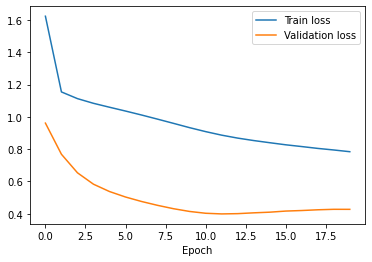

Train loss = tensor(0.7839, device='cuda:0', grad_fn=<AddBackward0>)
Val loss = tensor(0.3986, device='cuda:0')


In [ ]:
print("Best hyperparameters:", best_hyperparams)
print()

num_epochs = 20
inputs = [right_hand_train_main, right_hand_train_fourier]
val_in = [right_hand_val_main, right_hand_val_fourier]
targets = torch.FloatTensor(right_train_labels)
val_targets = torch.FloatTensor(right_val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

model = LSTMRegressorWithFourierAux(num_features, 
                                    best_hyperparams['hidden_dim_main'],
                                    best_hyperparams['hidden_dim_aux'], 
                                    num_layers=best_hyperparams['L'], 
                                    fc_size=best_hyperparams['fc_dim'])
optimizer = optim.SGD(model.parameters(), lr=best_hyperparams['lr'])
model = model.to(device)

running_train_loss = []
running_val_loss = []
for epoch in range(num_epochs):
  train_loss = 0
  for i in range(num_batches):
    model.zero_grad()
    batch_main = inputs[0][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
    batch_fourier = inputs[1][:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model((batch_main, batch_fourier)).squeeze()
    loss = loss_fn(scores, target_batch.squeeze())
    loss.backward()
    optimizer.step()
    train_loss += loss / num_batches
  val_loss = 0
  num_val_batches = val_in[0].shape[1] // batch_size + 1
  with torch.no_grad():
    for i in range(num_val_batches):
      batch_main = val_in[0][:, i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size), :]
      batch_fourier = val_in[1][:, i * batch_size : min(val_in[0].shape[1], 
                                          i * batch_size + batch_size), :]
      target_batch = val_targets[i * batch_size : min(val_in[0].shape[1], 
                                          i * batch_size + batch_size)]
      val_scores = model((batch_main, batch_fourier)).squeeze()
      loss = loss_fn(val_scores, target_batch.squeeze())
      val_loss += loss / num_val_batches
  running_train_loss.append(train_loss)
  running_val_loss.append(val_loss)
  print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
      epoch, train_loss, val_loss))
  print("")

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(running_val_loss, label="Validation loss")
plt.legend()
plt.xlabel("Epoch")
plt.show()

print("Train loss =", min(running_train_loss))
print("Val loss =", min(running_val_loss))

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del model
del inputs
del targets
del val_in
del val_targets

### Comparison

Left hand model

| Features | Best model hyperparameters | Best model validation loss | # Epochs |
| --- | --- | --- | --- |
| Primary | 'L': 2, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim': 20 | 1.0513 | 2 |
| Primary + Secondary | 'L': 1, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim': 100 | 1.6284 | 2 |
| Primary (with Fourier) | 'L': 2, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim_main': 50, 'hidden_dim_aux': 20 | 0.5364 | 1 |
| Primary + Secondary (with Fourier) | 'L': 1, 'lr': 0.01, 'fc_dim': 50, 'hidden_dim_main': 20, 'hidden_dim_aux': 20 | 1.5614 | 20 |

Right hand model

| Features | Best model hyperparameters | Best model validation accuracy | # Epochs |
| --- | --- | --- | --- |
| Primary | 'L': 1, 'lr': 0.1, 'fc_dim': 20, 'hidden_dim': 50 | 0.9341 | 20 |
| Primary + Secondary | 'L': 1, 'lr': 0.01, 'fc_dim': 20, 'hidden_dim': 50 | 1.0927 | 10 |
| Primary (with Fourier) | 'L': 2, 'lr': 0.1, 'fc_dim': 100, 'hidden_dim_main': 100, 'hidden_dim_aux': 20 | 0.4197 | 2 |
| Primary + Secondary (with Fourier) | 'L': 2, 'lr': 0.1, 'fc_dim': 20, 'hidden_dim_main': 20, 'hidden_dim_aux': 20 | 0.7863 | 4 |

### Best left hand model test set evaluation

In [ ]:
def primary_featurized_data(sample, hand):
  dist_right, dist_left, time = normalized_tapping_distance(sample.data)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  time = np.asarray(time) - time[0]
  seq_len = len(time)
  if sample.on_state == "on":
    label = sample.left_on_tapping_score if (hand == "left") else sample.right_on_tapping_score
  else:
    label = sample.left_off_tapping_score if (hand == "left") else sample.right_off_tapping_score
  featurized_main = np.zeros((seq_len, 1, 2))
  if hand == "left":
    featurized_main[:, 0, 0] = np.asarray(dist_left)
    featurized_main[:, 0, 1] = np.asarray(left_v)
  elif hand == "right":
    featurized_main[:, 0, 0] = np.asarray(dist_right)
    featurized_main[:, 0, 1] = np.asarray(right_v)
  else:
    return "error"
  dist_right_spectrum, freq = fourier_transform(time, np.asarray(dist_right))
  dist_left_spectrum, _ = fourier_transform(time, np.asarray(dist_left))
  right_v_spectrum, _ = fourier_transform(time, np.asarray(right_v))
  left_v_spectrum, _ = fourier_transform(time, np.asarray(left_v))
  seq_len = len(freq)
  featurized_fourier = np.zeros((seq_len, 1, 2))
  if hand == "left":
    featurized_fourier[:, 0, 0] = dist_left_spectrum
    featurized_fourier[:, 0, 1] = left_v_spectrum
  elif hand == "right":
    featurized_fourier[:, 0, 0] = dist_right_spectrum
    featurized_fourier[:, 0, 1] = right_v_spectrum
  else:
    return "error"
  return time, featurized_main, freq, featurized_fourier, label

def primary_featurized_dataset(dataset, hand):
  featurized_main_list = []
  times_list = []
  featurized_fourier_list = []
  freq_list = []
  labels = []
  for sample in dataset:
    time, featurized_main, freq, featurized_fourier, label = primary_featurized_data(sample, hand)
    featurized_main_list.append(featurized_main)
    times_list.append(time)
    featurized_fourier_list.append(featurized_fourier)
    freq_list.append(freq)
    labels.append(label)
  times_concat = np.concatenate(times_list)
  times_union = np.unique(times_concat)
  freq_concat = np.concatenate(freq_list)
  freq_union = np.unique(freq_concat)
  featurized_main_interped_list = []
  featurized_fourier_interped_list = []

  seq_len = len(times_union)
  for i, f in enumerate(featurized_main_list):
    times_f = times_list[i]
    dist_f = f[:, 0, 0]
    v_f = f[:, 0, 1]
    dist_interped = np.interp(times_union, times_f, dist_f)
    v_interped = np.interp(times_union, times_f, v_f)
    featurized_interped = torch.zeros((seq_len, 1, 2))
    featurized_interped[:, 0, 0] = torch.tensor(dist_interped)
    featurized_interped[:, 0, 1] = torch.tensor(v_interped)
    featurized_main_interped_list.append(featurized_interped)
  
  seq_len = len(freq_union)
  for i, f in enumerate(featurized_fourier_list):
    freq_f = freq_list[i]
    dist_spectrum_f = f[:, 0, 0]
    v_spectrum_f = f[:, 0, 1]
    dist_spectrum_interped = np.interp(freq_union, freq_f, dist_spectrum_f)
    v_spectrum_interped = np.interp(freq_union, freq_f, v_spectrum_f)
    featurized_interped = torch.zeros((seq_len, 1, 2))
    featurized_interped[:, 0, 0] = torch.tensor(dist_spectrum_interped)
    featurized_interped[:, 0, 1] = torch.tensor(v_spectrum_interped)
    featurized_fourier_interped_list.append(featurized_interped)
    
  return (featurized_main_interped_list, featurized_fourier_interped_list), labels

In [ ]:
left_hand_featurized, left_hand_labels = primary_featurized_dataset(
                                          left_hand_data, "left")

left_hand_featurized_main = [left_hand_featurized[0][i] for i in 
                             range(len(left_hand_featurized[0])) if 
                             left_hand_labels[i] <= 4 and left_hand_labels[i] >= 0]
left_hand_featurized_fourier = [left_hand_featurized[1][i] for i in 
                             range(len(left_hand_featurized[1])) if 
                             left_hand_labels[i] <= 4 and left_hand_labels[i] >= 0]
left_hand_data = [left_hand_data[i] for i in range(len(left_hand_data)) if 
                  left_hand_labels[i] <= 4 and left_hand_labels[i] >= 0]
left_hand_labels = [l for l in left_hand_labels if l <= 4 and l >= 0]

In [ ]:
n = len(left_hand_featurized_main)
left_train_idxs = np.random.choice(range(n), round(0.8 * n), replace=False)
left_test_idxs = [i for i in range(n) if i not in left_train_idxs]
test_data = [left_hand_data[i] for i in left_test_idxs]

In [ ]:
left_hand_train_main = [left_hand_featurized_main[i] for i in left_train_idxs]
left_hand_train_fourier = [left_hand_featurized_fourier[i] for i in left_train_idxs]
left_hand_train_main = torch.nan_to_num(torch.cat(left_hand_train_main, dim=1))
left_hand_train_fourier = torch.nan_to_num(torch.cat(left_hand_train_fourier, dim=1))
left_train_labels = [left_hand_labels[i] for i in left_train_idxs]

left_hand_test_main = [left_hand_featurized_main[i] for i in left_test_idxs]
left_hand_test_fourier = [left_hand_featurized_fourier[i] for i in left_test_idxs]
left_test_labels = [left_hand_labels[i] for i in left_test_idxs]

In [ ]:
n = len(left_hand_test_main)
left_val_idxs = np.random.choice(range(n), round(0.6 * n), replace=False)
left_test_idxs = [i for i in range(n) if i not in left_val_idxs]
test_data = [test_data[i] for i in left_test_idxs]

In [ ]:
left_hand_val_main = [left_hand_test_main[i] for i in left_val_idxs]
left_hand_val_main = torch.nan_to_num(torch.cat(left_hand_val_main, dim=1))
left_hand_val_fourier = [left_hand_test_fourier[i] for i in left_val_idxs]
left_hand_val_fourier = torch.nan_to_num(torch.cat(left_hand_val_fourier, dim=1))
left_val_labels = [left_test_labels[i] for i in left_val_idxs]

left_hand_test_main = [left_hand_test_main[i] for i in left_test_idxs]
left_hand_test_main = torch.nan_to_num(torch.cat(left_hand_test_main, dim=1))
left_hand_test_fourier = [left_hand_test_fourier[i] for i in left_test_idxs]
left_hand_test_fourier = torch.nan_to_num(torch.cat(left_hand_test_fourier, dim=1))
left_test_labels = [left_test_labels[i] for i in left_test_idxs]

In [ ]:
seq_len_main = left_hand_train_main.shape[0]
num_samples = left_hand_train_main.shape[1]
num_features = 2
batch_size = 8
num_batches = num_samples // batch_size + 1

class LSTMRegressorWithFourierAux(nn.Module):

  def __init__(self, num_features, hidden_dim_main, hidden_dim_aux, 
               num_layers=1, fc_size=10, bidirectional=True):
    super().__init__()
    self.lstm_main = nn.LSTM(num_features, hidden_dim_main, num_layers)
    if num_features == 2:
      self.lstm_aux = nn.LSTM(2, hidden_dim_aux, num_layers)
    elif num_features == 7:
      self.lstm_aux = nn.LSTM(5, hidden_dim_aux, num_layers)
    self.linear_main = nn.Linear(hidden_dim_main, fc_size)
    self.linear_aux = nn.Linear(hidden_dim_aux, fc_size)
    self.relu = nn.ReLU()
    self.output = nn.Linear(2 * fc_size, 1)

  def forward(self, x):
    x_main = x[0]
    x_fourier = x[1]
    all_h, (h, c) = self.lstm_main(x_main)
    h_main = torch.mean(h, dim=0)
    all_h, (h, c) = self.lstm_aux(x_fourier)
    h_aux = torch.mean(h, dim=0)
    a_main = self.relu(self.linear_main(h_main))
    a_aux = self.relu(self.linear_aux(h_aux))
    out = self.output(torch.cat([a_main, a_aux], dim=-1))
    return out

loss_fn = nn.MSELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


Epoch 0: 
 Training loss = 2.680694341659546 
 Validation loss = 0.9814370274543762

Epoch 1: 
 Training loss = 1.4762425422668457 
 Validation loss = 0.9126827716827393

Epoch 2: 
 Training loss = 1.4506657123565674 
 Validation loss = 0.9038318991661072

Epoch 3: 
 Training loss = 1.4464709758758545 
 Validation loss = 0.8967126607894897



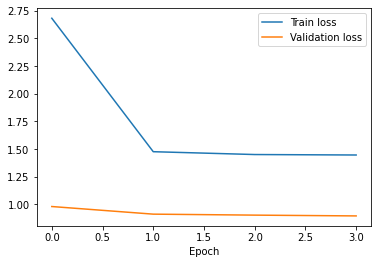

Train loss = tensor(1.4465, device='cuda:0', grad_fn=<AddBackward0>)
Val loss = tensor(0.8967, device='cuda:0', grad_fn=<AddBackward0>)


In [ ]:
best_hyperparams = {'L': 2, 'lr': 0.1, 'fc_dim': 50, 
                    'hidden_dim_main': 50, 'hidden_dim_aux': 20}

num_epochs = 4
inputs = [left_hand_train_main, left_hand_train_fourier]
val_in = [left_hand_val_main, left_hand_val_fourier]
targets = torch.FloatTensor(left_train_labels)
val_targets = torch.FloatTensor(left_val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

model = LSTMRegressorWithFourierAux(num_features, 
                                    best_hyperparams['hidden_dim_main'],
                                    best_hyperparams['hidden_dim_aux'], 
                                    num_layers=best_hyperparams['L'], 
                                    fc_size=best_hyperparams['fc_dim'])
optimizer = optim.SGD(model.parameters(), lr=best_hyperparams['lr'])
model = model.to(device)

running_train_loss = []
running_val_loss = []
for epoch in range(num_epochs):
  train_loss = 0
  for i in range(num_batches):
    model.zero_grad()
    batch_main = inputs[0][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
    batch_fourier = inputs[1][:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model((batch_main, batch_fourier)).squeeze()
    loss = loss_fn(scores, target_batch.squeeze())
    loss.backward()
    optimizer.step()
    train_loss += loss / num_batches
  val_loss = 0
  num_val_batches = val_in[0].shape[1] // batch_size + 1
  for i in range(num_val_batches):
    batch_main = val_in[0][:, i * batch_size : min(val_in[0].shape[1], 
                                          i * batch_size + batch_size), :]
    batch_fourier = val_in[1][:, i * batch_size : min(val_in[0].shape[1], 
                                        i * batch_size + batch_size), :]
    target_batch = val_targets[i * batch_size : min(val_in[0].shape[1], 
                                        i * batch_size + batch_size)]
    val_scores = model((batch_main, batch_fourier)).squeeze()
    loss = loss_fn(val_scores, target_batch.squeeze())
    val_loss += loss / num_val_batches
  running_train_loss.append(train_loss)
  running_val_loss.append(val_loss)
  print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
      epoch, train_loss, val_loss))
  print("")

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(running_val_loss, label="Validation loss")
plt.legend()
plt.xlabel("Epoch")
plt.show()

print("Train loss =", min(running_train_loss))
print("Val loss =", min(running_val_loss))

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del inputs
del targets
del val_in
del val_targets

In [ ]:
model.eval()
test_in = [left_hand_test_main, left_hand_test_fourier]
targets = torch.FloatTensor(left_test_labels)

test_in[0], test_in[1] = test_in[0].to(device), test_in[1].to(device)
targets = targets.to(device).squeeze()
pred = model(test_in).squeeze()

loss = loss_fn(pred, targets)
print("Test loss = ", loss.item())
print()

Test loss =  1.3338565826416016



In [ ]:
anims = []

for i in np.random.randint(len(test_data), size=2):
  test_sample = [left_hand_test_main[:, i, :].unsqueeze(dim=1), 
                 left_hand_test_fourier[:, i, :].unsqueeze(dim=1)]
  test_sample[0], test_sample[1] = test_sample[0].to(device), test_sample[1].to(device)
  sample = test_data[i]
  df = sample.data
  on_state = sample.on_state
  tap_score = sample.left_on_tapping_score if on_state == "on" else sample.left_off_tapping_score
  pred = model(test_sample).squeeze().item()
  title = "PID: {}, Diagnosis: {}, ON/OFF: {}, \n Ground Truth Left Hand Tapping Score: {}, \n Predicted Left Hand Tapping Score: {}"
  anims.append(animate(df, title.format(
      sample.pid, sample.diagnosis, on_state, tap_score, pred
  )))
rc('animation', html='jshtml')

In [ ]:
anims[0]

In [ ]:
anims[1]

### Best right hand model test set evaluation

In [ ]:
def primary_featurized_data(sample, hand):
  dist_right, dist_left, time = normalized_tapping_distance(sample.data)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  time = np.asarray(time) - time[0]
  seq_len = len(time)
  if sample.on_state == "on":
    label = sample.left_on_tapping_score if (hand == "left") else sample.right_on_tapping_score
  else:
    label = sample.left_off_tapping_score if (hand == "left") else sample.right_off_tapping_score
  featurized_main = np.zeros((seq_len, 1, 2))
  if hand == "left":
    featurized_main[:, 0, 0] = np.asarray(dist_left)
    featurized_main[:, 0, 1] = np.asarray(left_v)
  elif hand == "right":
    featurized_main[:, 0, 0] = np.asarray(dist_right)
    featurized_main[:, 0, 1] = np.asarray(right_v)
  else:
    return "error"
  dist_right_spectrum, freq = fourier_transform(time, np.asarray(dist_right))
  dist_left_spectrum, _ = fourier_transform(time, np.asarray(dist_left))
  right_v_spectrum, _ = fourier_transform(time, np.asarray(right_v))
  left_v_spectrum, _ = fourier_transform(time, np.asarray(left_v))
  seq_len = len(freq)
  featurized_fourier = np.zeros((seq_len, 1, 2))
  if hand == "left":
    featurized_fourier[:, 0, 0] = dist_left_spectrum
    featurized_fourier[:, 0, 1] = left_v_spectrum
  elif hand == "right":
    featurized_fourier[:, 0, 0] = dist_right_spectrum
    featurized_fourier[:, 0, 1] = right_v_spectrum
  else:
    return "error"
  return time, featurized_main, freq, featurized_fourier, label

def primary_featurized_dataset(dataset, hand):
  featurized_main_list = []
  times_list = []
  featurized_fourier_list = []
  freq_list = []
  labels = []
  for sample in dataset:
    time, featurized_main, freq, featurized_fourier, label = primary_featurized_data(sample, hand)
    featurized_main_list.append(featurized_main)
    times_list.append(time)
    featurized_fourier_list.append(featurized_fourier)
    freq_list.append(freq)
    labels.append(label)
  times_concat = np.concatenate(times_list)
  times_union = np.unique(times_concat)
  freq_concat = np.concatenate(freq_list)
  freq_union = np.unique(freq_concat)
  featurized_main_interped_list = []
  featurized_fourier_interped_list = []

  seq_len = len(times_union)
  for i, f in enumerate(featurized_main_list):
    times_f = times_list[i]
    dist_f = f[:, 0, 0]
    v_f = f[:, 0, 1]
    dist_interped = np.interp(times_union, times_f, dist_f)
    v_interped = np.interp(times_union, times_f, v_f)
    featurized_interped = torch.zeros((seq_len, 1, 2))
    featurized_interped[:, 0, 0] = torch.tensor(dist_interped)
    featurized_interped[:, 0, 1] = torch.tensor(v_interped)
    featurized_main_interped_list.append(featurized_interped)
  
  seq_len = len(freq_union)
  for i, f in enumerate(featurized_fourier_list):
    freq_f = freq_list[i]
    dist_spectrum_f = f[:, 0, 0]
    v_spectrum_f = f[:, 0, 1]
    dist_spectrum_interped = np.interp(freq_union, freq_f, dist_spectrum_f)
    v_spectrum_interped = np.interp(freq_union, freq_f, v_spectrum_f)
    featurized_interped = torch.zeros((seq_len, 1, 2))
    featurized_interped[:, 0, 0] = torch.tensor(dist_spectrum_interped)
    featurized_interped[:, 0, 1] = torch.tensor(v_spectrum_interped)
    featurized_fourier_interped_list.append(featurized_interped)
    
  return (featurized_main_interped_list, featurized_fourier_interped_list), labels

In [ ]:
right_hand_featurized, right_hand_labels = primary_featurized_dataset(
                                          right_hand_data, "right")

right_hand_featurized_main = [right_hand_featurized[0][i] for i in 
                             range(len(right_hand_featurized[0])) if 
                             right_hand_labels[i] <= 4 and right_hand_labels[i] >= 0]
right_hand_featurized_fourier = [right_hand_featurized[1][i] for i in 
                             range(len(right_hand_featurized[1])) if 
                             right_hand_labels[i] <= 4 and right_hand_labels[i] >= 0]
right_hand_data = [right_hand_data[i] for i in range(len(right_hand_data)) if 
                  right_hand_labels[i] <= 4 and right_hand_labels[i] >= 0]
right_hand_labels = [l for l in right_hand_labels if l <= 4 and l >= 0]

In [ ]:
n = len(right_hand_featurized_main)
right_train_idxs = np.random.choice(range(n), round(0.8 * n), replace=False)
right_test_idxs = [i for i in range(n) if i not in right_train_idxs]
test_data = [right_hand_data[i] for i in right_test_idxs]

In [ ]:
right_hand_train_main = [right_hand_featurized_main[i] for i in right_train_idxs]
right_hand_train_fourier = [right_hand_featurized_fourier[i] for i in right_train_idxs]
right_hand_train_main = torch.nan_to_num(torch.cat(right_hand_train_main, dim=1))
right_hand_train_fourier = torch.nan_to_num(torch.cat(right_hand_train_fourier, dim=1))
right_train_labels = [right_hand_labels[i] for i in right_train_idxs]

right_hand_test_main = [right_hand_featurized_main[i] for i in right_test_idxs]
right_hand_test_fourier = [right_hand_featurized_fourier[i] for i in right_test_idxs]
right_test_labels = [right_hand_labels[i] for i in right_test_idxs]

In [ ]:
n = len(right_hand_test_main)
right_val_idxs = np.random.choice(range(n), round(0.6 * n), replace=False)
right_test_idxs = [i for i in range(n) if i not in right_val_idxs]
test_data = [test_data[i] for i in right_test_idxs]

In [ ]:
right_hand_val_main = [right_hand_test_main[i] for i in right_val_idxs]
right_hand_val_main = torch.nan_to_num(torch.cat(right_hand_val_main, dim=1))
right_hand_val_fourier = [right_hand_test_fourier[i] for i in right_val_idxs]
right_hand_val_fourier = torch.nan_to_num(torch.cat(right_hand_val_fourier, dim=1))
right_val_labels = [right_test_labels[i] for i in right_val_idxs]

right_hand_test_main = [right_hand_test_main[i] for i in right_test_idxs]
right_hand_test_main = torch.nan_to_num(torch.cat(right_hand_test_main, dim=1))
right_hand_test_fourier = [right_hand_test_fourier[i] for i in right_test_idxs]
right_hand_test_fourier = torch.nan_to_num(torch.cat(right_hand_test_fourier, dim=1))
right_test_labels = [right_test_labels[i] for i in right_test_idxs]

In [ ]:
seq_len_main = right_hand_train_main.shape[0]
num_samples = right_hand_train_main.shape[1]
num_features = 2
batch_size = 8
num_batches = num_samples // batch_size + 1

class LSTMRegressorWithFourierAux(nn.Module):

  def __init__(self, num_features, hidden_dim_main, hidden_dim_aux, 
               num_layers=1, fc_size=10, bidirectional=True):
    super().__init__()
    self.lstm_main = nn.LSTM(num_features, hidden_dim_main, num_layers)
    if num_features == 2:
      self.lstm_aux = nn.LSTM(2, hidden_dim_aux, num_layers)
    elif num_features == 7:
      self.lstm_aux = nn.LSTM(5, hidden_dim_aux, num_layers)
    self.linear_main = nn.Linear(hidden_dim_main, fc_size)
    self.linear_aux = nn.Linear(hidden_dim_aux, fc_size)
    self.relu = nn.ReLU()
    self.output = nn.Linear(2 * fc_size, 1)

  def forward(self, x):
    x_main = x[0]
    x_fourier = x[1]
    all_h, (h, c) = self.lstm_main(x_main)
    h_main = torch.mean(h, dim=0)
    all_h, (h, c) = self.lstm_aux(x_fourier)
    h_aux = torch.mean(h, dim=0)
    a_main = self.relu(self.linear_main(h_main))
    a_aux = self.relu(self.linear_aux(h_aux))
    out = self.output(torch.cat([a_main, a_aux], dim=-1))
    return out

loss_fn = nn.MSELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


Epoch 0: 
 Training loss = 2.037998914718628 
 Validation loss = 0.9315918684005737

Epoch 1: 
 Training loss = 1.4301111698150635 
 Validation loss = 0.8771770000457764

Epoch 2: 
 Training loss = 1.4213589429855347 
 Validation loss = 0.8753126859664917

Epoch 3: 
 Training loss = 1.4139795303344727 
 Validation loss = 0.8682334423065186



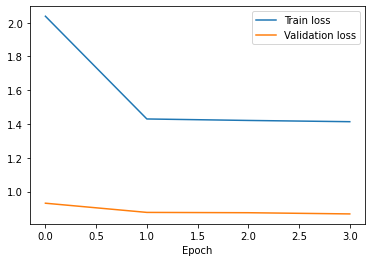

Train loss = tensor(1.4140, device='cuda:0', grad_fn=<AddBackward0>)
Val loss = tensor(0.8682, device='cuda:0', grad_fn=<AddBackward0>)


In [ ]:
best_hyperparams = {'L': 2, 'lr': 0.1, 'fc_dim': 100, 
                    'hidden_dim_main': 100, 'hidden_dim_aux': 20}

num_epochs = 4
inputs = [right_hand_train_main, right_hand_train_fourier]
val_in = [right_hand_val_main, right_hand_val_fourier]
targets = torch.FloatTensor(right_train_labels)
val_targets = torch.FloatTensor(right_val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

model = LSTMRegressorWithFourierAux(num_features, 
                                    best_hyperparams['hidden_dim_main'],
                                    best_hyperparams['hidden_dim_aux'], 
                                    num_layers=best_hyperparams['L'], 
                                    fc_size=best_hyperparams['fc_dim'])
optimizer = optim.SGD(model.parameters(), lr=best_hyperparams['lr'])
model = model.to(device)

running_train_loss = []
running_val_loss = []
for epoch in range(num_epochs):
  train_loss = 0
  for i in range(num_batches):
    model.zero_grad()
    batch_main = inputs[0][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
    batch_fourier = inputs[1][:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model((batch_main, batch_fourier)).squeeze()
    loss = loss_fn(scores, target_batch)
    loss.backward()
    optimizer.step()
    train_loss += loss / num_batches
  val_loss = 0
  num_val_batches = val_in[0].shape[1] // batch_size + 1
  for i in range(num_val_batches):
    batch_main = val_in[0][:, i * batch_size : min(val_in[0].shape[1], 
                                          i * batch_size + batch_size), :]
    batch_fourier = val_in[1][:, i * batch_size : min(val_in[0].shape[1], 
                                        i * batch_size + batch_size), :]
    target_batch = val_targets[i * batch_size : min(val_in[0].shape[1], 
                                        i * batch_size + batch_size)]
    val_scores = model((batch_main, batch_fourier)).squeeze()
    loss = loss_fn(val_scores, target_batch)
    val_loss += loss / num_val_batches
  running_train_loss.append(train_loss)
  running_val_loss.append(val_loss)
  print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
      epoch, train_loss, val_loss))
  print("")

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(running_val_loss, label="Validation loss")
plt.legend()
plt.xlabel("Epoch")
plt.show()

print("Train loss =", min(running_train_loss))
print("Val loss =", min(running_val_loss))

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del inputs
del targets
del val_in
del val_targets

In [ ]:
model.eval()
test_in = [right_hand_test_main, right_hand_test_fourier]
targets = torch.FloatTensor(right_test_labels)

test_in[0], test_in[1] = test_in[0].to(device), test_in[1].to(device)
targets = targets.to(device).squeeze()
pred = model(test_in).squeeze()

loss = loss_fn(pred, targets)
print("Test loss = ", loss.item())
print()

Test loss =  1.0260051488876343



In [ ]:
anims = []

for i in np.random.choice(len(test_data), size=2):
  test_sample = [right_hand_test_main[:, i, :].unsqueeze(dim=1), 
                 right_hand_test_fourier[:, i, :].unsqueeze(dim=1)]
  test_sample[0], test_sample[1] = test_sample[0].to(device), test_sample[1].to(device)
  sample = test_data[i]
  df = sample.data
  on_state = sample.on_state
  tap_score = sample.right_on_tapping_score if on_state == "on" else sample.right_off_tapping_score
  pred = model(test_sample).squeeze().item()
  title = "PID: {}, Diagnosis: {}, ON/OFF: {}, \n Ground Truth right Hand Tapping Score: {}, \n Predicted right Hand Tapping Score: {}"
  anims.append(animate(df, title.format(
      sample.pid, sample.diagnosis, on_state, tap_score, pred
  )))
rc('animation', html='jshtml')

In [ ]:
anims[0]

In [ ]:
anims[1]

## On/Off State Classification

In [ ]:
on_data = [data for data in dataset if data.on_state == "on"]
off_data = [data for data in dataset if data.on_state == "off"]

print("# of on state samples:", len(on_data))
print("# of off state samples:", len(off_data))

# of on state samples: 49
# of off state samples: 50


### Only Primary Features

In [ ]:
def primary_featurized_data(sample):
  dist_right, dist_left, time = normalized_tapping_distance(sample.data)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  time = np.asarray(time) - time[0]
  seq_len = len(time)
  label = 1 if sample.on_state == "on" else 0
  featurized = np.zeros((seq_len, 1, 4))
  featurized[:, 0, 0] = np.asarray(dist_left)
  featurized[:, 0, 1] = np.asarray(dist_right)
  featurized[:, 0, 2] = np.asarray(left_v)
  featurized[:, 0, 3] = np.asarray(right_v)
  return time, featurized, label

def primary_featurized_dataset(dataset):
  featurized_list = []
  times_list = []
  labels = []
  for sample in dataset:
    time, featurized, label = primary_featurized_data(sample)
    featurized_list.append(featurized)
    times_list.append(time)
    labels.append(label)
  times_concat = np.concatenate(times_list)
  times_union = np.unique(times_concat)
  featurized_interped_list = []
  seq_len = len(times_union)
  for i, f in enumerate(featurized_list):
    times_f = times_list[i]
    featurized_interped = torch.zeros((seq_len, 1, f.shape[2]))
    for j in range(f.shape[2]):
      feature = f[:, 0, j]
      feature_interped = np.interp(times_union, times_f, feature)
      featurized_interped[:, 0, j] = torch.tensor(feature_interped)
    featurized_interped_list.append(featurized_interped)
  return featurized_interped_list, labels

In [ ]:
featurized_data, labels = primary_featurized_dataset(on_data + off_data)

In [ ]:
n = len(featurized_data)
train_idxs = np.random.choice(range(n), round(0.8 * n), replace=False)
test_idxs = [i for i in range(n) if i not in train_idxs]

train_data = [featurized_data[i] for i in train_idxs]
train_data = torch.nan_to_num(torch.cat(train_data, dim=1))
train_labels = [labels[i] for i in train_idxs]
test_data = [featurized_data[i] for i in test_idxs]
test_labels = [labels[i] for i in test_idxs]

In [ ]:
n = len(test_data)
val_idxs = np.random.choice(range(n), round(0.6 * n), replace=False)
test_idxs = [i for i in range(n) if i not in val_idxs]

val_data = [test_data[i] for i in val_idxs]
val_data = torch.nan_to_num(torch.cat(val_data, dim=1))
val_labels = [test_labels[i] for i in val_idxs]
test_data = [test_data[i] for i in test_idxs]
test_data = torch.nan_to_num(torch.cat(test_data, dim=1))
test_labels = [test_labels[i] for i in test_idxs]

In [ ]:
print(train_data.size())
print(val_data.size())
print(test_data.size())

torch.Size([13522, 79, 4])
torch.Size([13522, 12, 4])
torch.Size([13522, 8, 4])


In [ ]:
def standardize_data(dataset):
  mean = torch.mean(dataset, dim=0)
  std = torch.std(dataset, dim=0)
  return (dataset - mean) / std

In [ ]:
train_data = standardize_data(train_data)
val_data = standardize_data(val_data)
test_data = standardize_data(test_data)

#### Multi-layer LSTM model

In [ ]:
seq_len = train_data.shape[0]
num_samples = train_data.shape[1]
num_features = 4
num_epochs = 10
batch_size = 8
num_batches = num_samples // batch_size + 1

class LSTMClassifier(nn.Module):

  def __init__(self, num_features, hidden_dim, num_layers=1, fc_size=10, bidirectional=True):
    super().__init__()
    self.lstm = nn.LSTM(num_features, hidden_dim, num_layers)
    self.linear = nn.Linear(hidden_dim, fc_size)
    self.relu = nn.ReLU()
    self.output = nn.Linear(fc_size, 1)
    self.sigmoid = nn.Sigmoid()

  def forward(self, x):
    all_h, (h, c) = self.lstm(x)
    h = torch.mean(h, dim=0)
    out = self.sigmoid(self.output(self.relu(self.linear(h))))
    return out

loss_fn = nn.BCELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
seed = 123
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

inputs = train_data
val_in = val_data
targets = torch.FloatTensor(train_labels)
val_targets = torch.FloatTensor(val_labels)

inputs, targets = inputs.to(device), targets.to(device)
val_in, val_targets = val_in.to(device), val_targets.to(device)

best_hyperparams = {}
best_val_loss = np.inf

for i in range(20):
  L = np.random.choice([1, 2])
  fc_dim = np.random.choice([20, 50, 100])
  lr = np.random.choice([1e-1, 1e-2, 1e-3])
  hidden_dim = np.random.choice([20, 50, 100])

  curr_hyperparams = {"L": L, "lr": lr, "fc_dim": fc_dim, 
                        "hidden_dim": hidden_dim}

  model = LSTMClassifier(num_features, hidden_dim, num_layers=L, fc_size=fc_dim)
  optimizer = optim.SGD(model.parameters(), lr=lr)
  model = model.to(device)

  running_train_loss = []
  running_val_loss = []
  for epoch in range(num_epochs):
    train_loss = 0
    for i in range(num_batches):
      model.zero_grad()
      batch = inputs[:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      target_batch = targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      scores = model(batch).squeeze()
      loss = loss_fn(scores, target_batch.squeeze())
      loss.backward()
      optimizer.step()
      train_loss += loss / num_batches
    val_loss = 0
    num_val_batches = val_in.shape[1] // batch_size + 1
    with torch.no_grad():
      for i in range(num_val_batches):
        batch = val_in[:, i * batch_size : min(val_in.shape[1], 
                                            i * batch_size + batch_size), :]
        target_batch = val_targets[i * batch_size : min(val_in.shape[1], 
                                            i * batch_size + batch_size)]
        val_scores = model(batch).squeeze()
        loss = loss_fn(val_scores, target_batch.squeeze())
        val_loss += loss / num_val_batches
    running_train_loss.append(train_loss)
    running_val_loss.append(val_loss)
  if min(running_val_loss) < best_val_loss:
    best_val_loss = min(running_val_loss)
    best_hyperparams = curr_hyperparams

  print(curr_hyperparams)
  print("Train loss:", min(running_train_loss))
  print("Val loss:", min(running_val_loss))
  print()

  gc.collect()
  torch.cuda.empty_cache()
  del model

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim': 100}
Train loss: tensor(0.6949, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6862, device='cuda:0')

{'L': 1, 'lr': 0.001, 'fc_dim': 100, 'hidden_dim': 50}
Train loss: tensor(0.6912, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6969, device='cuda:0')

{'L': 2, 'lr': 0.01, 'fc_dim': 100, 'hidden_dim': 100}
Train loss: tensor(0.6925, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6933, device='cuda:0')

{'L': 2, 'lr': 0.01, 'fc_dim': 20, 'hidden_dim': 100}
Train loss: tensor(0.6929, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.7033, device='cuda:0')

{'L': 2, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim': 100}
Train loss: tensor(0.6910, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6963, device='cuda:0')

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim': 50}
Train loss: tensor(0.6933, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6967, device='cuda:0')

{'L': 1,

Best hyperparameters: {'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim': 100}

Epoch 0: 
 Training loss = 0.6927554607391357 
 Validation loss = 0.6906665563583374

Epoch 1: 
 Training loss = 0.692742645740509 
 Validation loss = 0.690670371055603

Epoch 2: 
 Training loss = 0.6927297711372375 
 Validation loss = 0.6906741857528687

Epoch 3: 
 Training loss = 0.6927168369293213 
 Validation loss = 0.6906778812408447

Epoch 4: 
 Training loss = 0.6927041411399841 
 Validation loss = 0.6906816363334656

Epoch 5: 
 Training loss = 0.692691445350647 
 Validation loss = 0.6906855702400208

Epoch 6: 
 Training loss = 0.6926785707473755 
 Validation loss = 0.6906894445419312

Epoch 7: 
 Training loss = 0.6926656365394592 
 Validation loss = 0.6906930804252625

Epoch 8: 
 Training loss = 0.6926530599594116 
 Validation loss = 0.6906967163085938

Epoch 9: 
 Training loss = 0.6926405429840088 
 Validation loss = 0.690700352191925

Epoch 10: 
 Training loss = 0.692628026008606 
 Validation loss = 

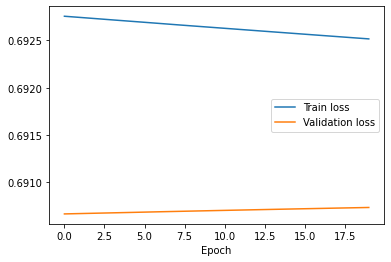

Train loss = tensor(0.6925, device='cuda:0', grad_fn=<AddBackward0>)
Val loss = tensor(0.6907, device='cuda:0')


In [ ]:
print("Best hyperparameters:", best_hyperparams)
print()

num_epochs = 20
inputs = train_data
val_in = val_data
targets = torch.FloatTensor(train_labels)
val_targets = torch.FloatTensor(val_labels)
inputs, targets = inputs.to(device), targets.to(device)
val_in, val_targets = val_in.to(device), val_targets.to(device)

model = LSTMClassifier(num_features, best_hyperparams['hidden_dim'], 
                      num_layers=best_hyperparams['L'], fc_size=best_hyperparams['fc_dim'])
optimizer = optim.SGD(model.parameters(), lr=best_hyperparams['lr'])
model = model.to(device)

running_train_loss = []
running_val_loss = []
for epoch in range(num_epochs):
  train_loss = 0
  for i in range(num_batches):
    model.zero_grad()
    batch = inputs[:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model(batch).squeeze()
    loss = loss_fn(scores, target_batch.squeeze())
    loss.backward()
    optimizer.step()
    train_loss += loss / num_batches
  val_loss = 0
  num_val_batches = val_in.shape[1] // batch_size + 1
  with torch.no_grad():
    for i in range(num_val_batches):
      batch = val_in[:, i * batch_size : min(val_in.shape[1], 
                                          i * batch_size + batch_size), :]
      target_batch = val_targets[i * batch_size : min(val_in.shape[1], 
                                          i * batch_size + batch_size)]
      val_scores = model(batch).squeeze()
      loss = loss_fn(val_scores, target_batch.squeeze())
      val_loss += loss / num_val_batches
  running_train_loss.append(train_loss)
  running_val_loss.append(val_loss)
  print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
      epoch, train_loss, val_loss))
  print("")

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(running_val_loss, label="Validation loss")
plt.legend()
plt.xlabel("Epoch")
plt.show()

print("Train loss =", min(running_train_loss))
print("Val loss =", min(running_val_loss))

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del model
del inputs
del targets
del val_in
del val_targets

### Primary + Secondary Features

In [ ]:
def primary_secondary_featurized_data(sample):
  #distance, velocity, distance amplitude, velocity amplitude, frequency, 
  #acceleration, and movement coefficient of variation
  dist_right, dist_left, time = normalized_tapping_distance(sample.data)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  dist_right_amp, _ = distance_amplitude(time, dist_right)
  dist_left_amp, _ = distance_amplitude(time, dist_left)
  right_v_amp, _ = velocity_amplitude(time, right_v)
  left_v_amp, _ = velocity_amplitude(time, left_v)
  right_freq, _, _ = tapping_frequency(time, dist_right)
  left_freq, _, _ = tapping_frequency(time, dist_right)
  right_acc, _ = tap_acceleration(time, right_v)
  left_acc, _ = tap_acceleration(time, left_v)
  _, right_cv = movement_consistency(time, dist_right)
  _, left_cv = movement_consistency(time, dist_left)
  time = np.asarray(time) - time[0]
  seq_len = len(time)
  label = 1 if sample.on_state == "on" else 0
  featurized = np.zeros((seq_len, 1, 14))
  featurized[:, 0, 0] = np.asarray(dist_left)
  featurized[:, 0, 1] = np.asarray(dist_right)
  featurized[:, 0, 2] = np.asarray(left_v)
  featurized[:, 0, 3] = np.asarray(right_v)
  featurized[:, 0, 4] = np.asarray(dist_left_amp)
  featurized[:, 0, 5] = np.asarray(dist_right_amp)
  featurized[:, 0, 6] = np.asarray(left_v_amp)
  featurized[:, 0, 7] = np.asarray(right_v_amp)
  featurized[:, 0, 8] = np.asarray(left_freq)
  featurized[:, 0, 9] = np.asarray(right_freq)
  featurized[:, 0, 10] = np.asarray(left_acc)
  featurized[:, 0, 11] = np.asarray(right_acc)
  featurized[:, 0, 12] = np.asarray(left_cv)
  featurized[:, 0, 13] = np.asarray(right_cv)
  return time, featurized, label

def primary_secondary_featurized_dataset(dataset):
  featurized_list = []
  times_list = []
  labels = []
  for sample in dataset:
    time, featurized, label = primary_secondary_featurized_data(sample)
    featurized_list.append(featurized)
    times_list.append(time)
    labels.append(label)
  times_concat = np.concatenate(times_list)
  times_union = np.unique(times_concat)
  featurized_interped_list = []
  seq_len = len(times_union)
  for i, f in enumerate(featurized_list):
    times_f = times_list[i]
    featurized_interped = torch.zeros((seq_len, 1, f.shape[2]))
    for j in range(f.shape[2]):
      feature = f[:, 0, j]
      feature_interped = np.interp(times_union, times_f, feature)
      featurized_interped[:, 0, j] = torch.tensor(feature_interped)
    featurized_interped_list.append(featurized_interped)
  return featurized_interped_list, labels

In [ ]:
featurized_data, labels = primary_secondary_featurized_dataset(on_data + off_data)

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:1072: RuntimeWarning: Mean of empty slice.
  return a.std(axis) / a.mean(axis)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning

In [ ]:
n = len(featurized_data)
train_idxs = np.random.choice(range(n), round(0.8 * n), replace=False)
test_idxs = [i for i in range(n) if i not in train_idxs]

train_data = [featurized_data[i] for i in train_idxs]
train_data = torch.nan_to_num(torch.cat(train_data, dim=1))
train_labels = [labels[i] for i in train_idxs]
test_data = [featurized_data[i] for i in test_idxs]
test_labels = [labels[i] for i in test_idxs]

In [ ]:
n = len(test_data)
val_idxs = np.random.choice(range(n), round(0.6 * n), replace=False)
test_idxs = [i for i in range(n) if i not in val_idxs]

val_data = [test_data[i] for i in val_idxs]
val_data = torch.nan_to_num(torch.cat(val_data, dim=1))
val_labels = [test_labels[i] for i in val_idxs]
test_data = [test_data[i] for i in test_idxs]
test_data = torch.nan_to_num(torch.cat(test_data, dim=1))
test_labels = [test_labels[i] for i in test_idxs]

In [ ]:
print(train_data.size())
print(val_data.size())
print(test_data.size())

torch.Size([13522, 79, 14])
torch.Size([13522, 12, 14])
torch.Size([13522, 8, 14])


In [ ]:
def standardize_data(dataset):
  mean = torch.mean(dataset, dim=0)
  std = torch.std(dataset, dim=0)
  return (dataset - mean) / std

In [ ]:
train_data = standardize_data(train_data).nan_to_num()
val_data = standardize_data(val_data).nan_to_num()
test_data = standardize_data(test_data).nan_to_num()

#### Multi-layer LSTM model

In [ ]:
seq_len = train_data.shape[0]
num_samples = train_data.shape[1]
num_features = 14
num_epochs = 10
batch_size = 8
num_batches = num_samples // batch_size + 1

class LSTMClassifier(nn.Module):

  def __init__(self, num_features, hidden_dim, num_layers=1, fc_size=10, bidirectional=True):
    super().__init__()
    self.lstm = nn.LSTM(num_features, hidden_dim, num_layers)
    self.linear = nn.Linear(hidden_dim, fc_size)
    self.relu = nn.ReLU()
    self.output = nn.Linear(fc_size, 1)
    self.sigmoid = nn.Sigmoid()

  def forward(self, x):
    all_h, (h, c) = self.lstm(x)
    h = torch.mean(h, dim=0)
    out = self.sigmoid(self.output(self.relu(self.linear(h))))
    return out

loss_fn = nn.BCELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
seed = 123
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

inputs = train_data
val_in = val_data
targets = torch.FloatTensor(train_labels)
val_targets = torch.FloatTensor(val_labels)

inputs, targets = inputs.to(device), targets.to(device)
val_in, val_targets = val_in.to(device), val_targets.to(device)

best_hyperparams = {}
best_val_loss = np.inf

for i in range(20):
  L = np.random.choice([1, 2])
  fc_dim = np.random.choice([20, 50, 100])
  lr = np.random.choice([1e-1, 1e-2, 1e-3])
  hidden_dim = np.random.choice([20, 50, 100])

  curr_hyperparams = {"L": L, "lr": lr, "fc_dim": fc_dim, 
                        "hidden_dim": hidden_dim}

  model = LSTMClassifier(num_features, hidden_dim, num_layers=L, fc_size=fc_dim)
  optimizer = optim.SGD(model.parameters(), lr=lr)
  model = model.to(device)

  running_train_loss = []
  running_val_loss = []
  for epoch in range(num_epochs):
    train_loss = 0
    for i in range(num_batches):
      model.zero_grad()
      batch = inputs[:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      target_batch = targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      scores = model(batch).squeeze()
      loss = loss_fn(scores, target_batch.squeeze())
      loss.backward()
      optimizer.step()
      train_loss += loss / num_batches
    val_loss = 0
    num_val_batches = val_in.shape[1] // batch_size + 1
    with torch.no_grad():
      for i in range(num_val_batches):
        batch = val_in[:, i * batch_size : min(val_in.shape[1], 
                                            i * batch_size + batch_size), :]
        target_batch = val_targets[i * batch_size : min(val_in.shape[1], 
                                            i * batch_size + batch_size)]
        val_scores = model(batch).squeeze()
        loss = loss_fn(val_scores, target_batch.squeeze())
        val_loss += loss / num_val_batches
    running_train_loss.append(train_loss)
    running_val_loss.append(val_loss)
  if min(running_val_loss) < best_val_loss:
    best_val_loss = min(running_val_loss)
    best_hyperparams = curr_hyperparams

  print(curr_hyperparams)
  print("Train loss:", min(running_train_loss))
  print("Val loss:", min(running_val_loss))
  print()

  gc.collect()
  torch.cuda.empty_cache()
  del model

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim': 100}
Train loss: tensor(0.7006, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.7081, device='cuda:0')

{'L': 1, 'lr': 0.001, 'fc_dim': 100, 'hidden_dim': 50}
Train loss: tensor(0.7022, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6966, device='cuda:0')

{'L': 2, 'lr': 0.01, 'fc_dim': 100, 'hidden_dim': 100}
Train loss: tensor(0.6845, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6909, device='cuda:0')

{'L': 2, 'lr': 0.01, 'fc_dim': 20, 'hidden_dim': 100}
Train loss: tensor(0.6834, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6867, device='cuda:0')

{'L': 2, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim': 100}
Train loss: tensor(0.6497, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.7164, device='cuda:0')

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim': 50}
Train loss: tensor(0.6961, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6777, device='cuda:0')

{'L': 1,

Best hyperparameters: {'L': 1, 'lr': 0.001, 'fc_dim': 100, 'hidden_dim': 20}

Epoch 0: 
 Training loss = 0.6809644103050232 
 Validation loss = 0.6650370955467224

Epoch 1: 
 Training loss = 0.6807715892791748 
 Validation loss = 0.665286123752594

Epoch 2: 
 Training loss = 0.6805792450904846 
 Validation loss = 0.6655337810516357

Epoch 3: 
 Training loss = 0.6803874969482422 
 Validation loss = 0.6657801866531372

Epoch 4: 
 Training loss = 0.6801962852478027 
 Validation loss = 0.6660254001617432

Epoch 5: 
 Training loss = 0.6800055503845215 
 Validation loss = 0.6662693023681641

Epoch 6: 
 Training loss = 0.6798154711723328 
 Validation loss = 0.6665117740631104

Epoch 7: 
 Training loss = 0.6796258687973022 
 Validation loss = 0.6667532324790955

Epoch 8: 
 Training loss = 0.6794368028640747 
 Validation loss = 0.666993260383606

Epoch 9: 
 Training loss = 0.6792483329772949 
 Validation loss = 0.6672321557998657

Epoch 10: 
 Training loss = 0.6790602207183838 
 Validation loss

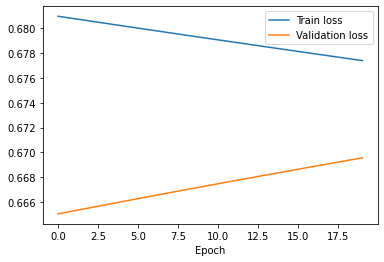

Train loss = tensor(0.6774, device='cuda:0', grad_fn=<AddBackward0>)
Val loss = tensor(0.6650, device='cuda:0')


In [ ]:
print("Best hyperparameters:", best_hyperparams)
print()

num_epochs = 20
inputs = train_data
val_in = val_data
targets = torch.FloatTensor(train_labels)
val_targets = torch.FloatTensor(val_labels)
inputs, targets = inputs.to(device), targets.to(device)
val_in, val_targets = val_in.to(device), val_targets.to(device)

model = LSTMClassifier(num_features, best_hyperparams['hidden_dim'], 
                      num_layers=best_hyperparams['L'], fc_size=best_hyperparams['fc_dim'])
optimizer = optim.SGD(model.parameters(), lr=best_hyperparams['lr'])
model = model.to(device)

running_train_loss = []
running_val_loss = []
for epoch in range(num_epochs):
  train_loss = 0
  for i in range(num_batches):
    model.zero_grad()
    batch = inputs[:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model(batch).squeeze()
    loss = loss_fn(scores, target_batch.squeeze())
    loss.backward()
    optimizer.step()
    train_loss += loss / num_batches
  val_loss = 0
  num_val_batches = val_in.shape[1] // batch_size + 1
  with torch.no_grad():
    for i in range(num_val_batches):
      batch = val_in[:, i * batch_size : min(val_in.shape[1], 
                                          i * batch_size + batch_size), :]
      target_batch = val_targets[i * batch_size : min(val_in.shape[1], 
                                          i * batch_size + batch_size)]
      val_scores = model(batch).squeeze()
      loss = loss_fn(val_scores, target_batch.squeeze())
      val_loss += loss / num_val_batches
  running_train_loss.append(train_loss)
  running_val_loss.append(val_loss)
  print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
      epoch, train_loss, val_loss))
  print("")

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(running_val_loss, label="Validation loss")
plt.legend()
plt.xlabel("Epoch")
plt.show()

print("Train loss =", min(running_train_loss))
print("Val loss =", min(running_val_loss))

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del model
del inputs
del targets
del val_in
del val_targets

### Primary (with Fourier) Features

In [ ]:
def primary_featurized_data(sample):
  dist_right, dist_left, time = normalized_tapping_distance(sample.data)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  time = np.asarray(time) - time[0]
  seq_len = len(time)
  label = 1 if sample.on_state == "on" else 0
  featurized_main = np.zeros((seq_len, 1, 4))
  featurized_main[:, 0, 0] = np.asarray(dist_left)
  featurized_main[:, 0, 1] = np.asarray(dist_right)
  featurized_main[:, 0, 2] = np.asarray(left_v)
  featurized_main[:, 0, 3] = np.asarray(right_v)
  dist_right_spectrum, freq = fourier_transform(time, np.asarray(dist_right))
  dist_left_spectrum, _ = fourier_transform(time, np.asarray(dist_left))
  right_v_spectrum, _ = fourier_transform(time, np.asarray(right_v))
  left_v_spectrum, _ = fourier_transform(time, np.asarray(left_v))
  seq_len = len(freq)
  featurized_fourier = np.zeros((seq_len, 1, 4))
  featurized_fourier[:, 0, 0] = dist_left_spectrum
  featurized_fourier[:, 0, 1] = dist_right_spectrum
  featurized_fourier[:, 0, 2] = left_v_spectrum
  featurized_fourier[:, 0, 3] = right_v_spectrum
  return time, featurized_main, freq, featurized_fourier, label

def primary_featurized_dataset(dataset):
  featurized_main_list = []
  times_list = []
  featurized_fourier_list = []
  freq_list = []
  labels = []
  for sample in dataset:
    time, featurized_main, freq, featurized_fourier, label = primary_featurized_data(sample)
    featurized_main_list.append(featurized_main)
    times_list.append(time)
    featurized_fourier_list.append(featurized_fourier)
    freq_list.append(freq)
    labels.append(label)
  times_concat = np.concatenate(times_list)
  times_union = np.unique(times_concat)
  freq_concat = np.concatenate(freq_list)
  freq_union = np.unique(freq_concat)
  featurized_main_interped_list = []
  featurized_fourier_interped_list = []

  seq_len = len(times_union)
  for i, f in enumerate(featurized_main_list):
    times_f = times_list[i]
    featurized_interped = torch.zeros((seq_len, 1, f.shape[2]))
    for j in range(f.shape[2]):
      feature = f[:, 0, j]
      feature_interped = np.interp(times_union, times_f, feature)
      featurized_interped[:, 0, j] = torch.tensor(feature_interped)
    featurized_main_interped_list.append(featurized_interped)
  
  seq_len = len(freq_union)
  for i, f in enumerate(featurized_fourier_list):
    freq_f = freq_list[i]
    featurized_interped = torch.zeros((seq_len, 1, f.shape[2]))
    for j in range(f.shape[2]):
      feature = f[:, 0, j]
      feature_interped = np.interp(freq_union, freq_f, feature)
      featurized_interped[:, 0, j] = torch.tensor(feature_interped)
    featurized_fourier_interped_list.append(featurized_interped)
    
  return (featurized_main_interped_list, featurized_fourier_interped_list), labels

In [ ]:
(featurized_data_main, featurized_data_fourier), labels = primary_featurized_dataset(on_data + off_data)

In [ ]:
n = len(featurized_data_main)
train_idxs = np.random.choice(range(n), round(0.8 * n), replace=False)
test_idxs = [i for i in range(n) if i not in train_idxs]

train_data_main = [featurized_data_main[i] for i in train_idxs]
train_data_main = torch.nan_to_num(torch.cat(train_data_main, dim=1))
train_data_fourier = [featurized_data_fourier[i] for i in train_idxs]
train_data_fourier = torch.nan_to_num(torch.cat(train_data_fourier, dim=1))
train_labels = [labels[i] for i in train_idxs]
test_data_main = [featurized_data_main[i] for i in test_idxs]
test_data_fourier = [featurized_data_fourier[i] for i in test_idxs]
test_labels = [labels[i] for i in test_idxs]

In [ ]:
n = len(test_data_main)
val_idxs = np.random.choice(range(n), round(0.6 * n), replace=False)
test_idxs = [i for i in range(n) if i not in val_idxs]

val_data_main = [test_data_main[i] for i in val_idxs]
val_data_main = torch.nan_to_num(torch.cat(val_data_main, dim=1))
val_data_fourier = [test_data_fourier[i] for i in val_idxs]
val_data_fourier = torch.nan_to_num(torch.cat(val_data_fourier, dim=1))
val_labels = [test_labels[i] for i in val_idxs]
test_data_main = [test_data_main[i] for i in test_idxs]
test_data_main = torch.nan_to_num(torch.cat(test_data_main, dim=1))
test_data_fourier = [test_data_fourier[i] for i in test_idxs]
test_data_fourier = torch.nan_to_num(torch.cat(test_data_fourier, dim=1))
test_labels = [test_labels[i] for i in test_idxs]

In [ ]:
print(train_data_main.size())
print(train_data_fourier.size())
print(val_data_main.size())
print(val_data_fourier.size())
print(test_data_main.size())
print(test_data_fourier.size())

torch.Size([13522, 79, 4])
torch.Size([20900, 79, 4])
torch.Size([13522, 12, 4])
torch.Size([20900, 12, 4])
torch.Size([13522, 8, 4])
torch.Size([20900, 8, 4])


In [ ]:
def standardize_data(dataset):
  mean = torch.mean(dataset, dim=0)
  std = torch.std(dataset, dim=0)
  return (dataset - mean) / std

In [ ]:
train_data_main = standardize_data(train_data_main)
val_data_main = standardize_data(val_data_main)
test_data_main = standardize_data(test_data_main)

train_data_fourier = standardize_data(train_data_fourier)
val_data_fourier = standardize_data(val_data_fourier)
test_data_fourier = standardize_data(test_data_fourier)

#### Multi-layer LSTM model

In [ ]:
seq_len_main = train_data_main.shape[0]
num_samples = train_data_main.shape[1]
num_features = 4
num_epochs = 10
batch_size = 8
num_batches = num_samples // batch_size + 1

class LSTMClassifierWithFourierAux(nn.Module):

  def __init__(self, num_features, hidden_dim_main, hidden_dim_aux, 
               num_layers=1, fc_size=10, bidirectional=True):
    super().__init__()
    self.lstm_main = nn.LSTM(num_features, hidden_dim_main, num_layers)
    if num_features == 4:
      self.lstm_aux = nn.LSTM(4, hidden_dim_aux, num_layers)
    elif num_features == 14:
      self.lstm_aux = nn.LSTM(10, hidden_dim_aux, num_layers)
    self.linear_main = nn.Linear(hidden_dim_main, fc_size)
    self.linear_aux = nn.Linear(hidden_dim_aux, fc_size)
    self.relu = nn.ReLU()
    self.output = nn.Linear(2 * fc_size, 1)
    self.sigmoid = nn.Sigmoid()

  def forward(self, x):
    x_main = x[0]
    x_fourier = x[1]
    all_h, (h, c) = self.lstm_main(x_main)
    h_main = torch.mean(h, dim=0)
    all_h, (h, c) = self.lstm_aux(x_fourier)
    h_aux = torch.mean(h, dim=0)
    a_main = self.relu(self.linear_main(h_main))
    a_aux = self.relu(self.linear_aux(h_aux))
    out = self.sigmoid(self.output(torch.cat([a_main, a_aux], dim=-1)))
    return out

loss_fn = nn.BCELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
seed = 123
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

inputs = [train_data_main, train_data_fourier]
val_in = [val_data_main, val_data_fourier]
targets = torch.FloatTensor(train_labels)
val_targets = torch.FloatTensor(val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

best_hyperparams = {}
best_val_loss = np.inf

for i in range(20):
  L = np.random.choice([1, 2])
  fc_dim = np.random.choice([20, 50, 100])
  lr = np.random.choice([1e-1, 1e-2, 1e-3])
  hidden_dim_main = np.random.choice([20, 50, 100])
  hidden_dim_aux = np.random.choice([20, 50, 100])

  curr_hyperparams = {"L": L, "lr": lr, "fc_dim": fc_dim, 
                      "hidden_dim_main": hidden_dim_main, 
                      "hidden_dim_aux":hidden_dim_aux}

  model = LSTMClassifierWithFourierAux(num_features, hidden_dim_main, hidden_dim_aux, 
                                      num_layers=L, fc_size=fc_dim)
  optimizer = optim.SGD(model.parameters(), lr=lr)
  model = model.to(device)

  running_train_loss = []
  running_val_loss = []
  for epoch in range(num_epochs):
    train_loss = 0
    for i in range(num_batches):
      model.zero_grad()
      batch_main = inputs[0][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      batch_fourier = inputs[1][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      target_batch = targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      scores = model((batch_main, batch_fourier)).squeeze()
      loss = loss_fn(scores, target_batch.squeeze())
      loss.backward()
      optimizer.step()
      train_loss += loss / num_batches
    val_loss = 0
    num_val_batches = val_in[0].shape[1] // batch_size + 1
    with torch.no_grad():
      for i in range(num_val_batches):
        batch_main = val_in[0][:, i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size), :]
        batch_fourier = val_in[1][:, i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size), :]
        target_batch = val_targets[i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size)]
        val_scores = model((batch_main, batch_fourier)).squeeze()
        loss = loss_fn(val_scores, target_batch.squeeze())
        val_loss += loss / num_val_batches
    running_train_loss.append(train_loss)
    running_val_loss.append(val_loss)
  if min(running_val_loss) < best_val_loss:
    best_val_loss = min(running_val_loss)
    best_hyperparams = curr_hyperparams

  print(curr_hyperparams)
  print("Train loss:", min(running_train_loss))
  print("Val loss:", min(running_val_loss))
  print()

  gc.collect()
  torch.cuda.empty_cache()
  del model

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim_main': 100, 'hidden_dim_aux': 20}
Train loss: tensor(0.6933, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6883, device='cuda:0')

{'L': 1, 'lr': 0.01, 'fc_dim': 100, 'hidden_dim_main': 100, 'hidden_dim_aux': 50}
Train loss: tensor(0.6934, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6913, device='cuda:0')

{'L': 1, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim_main': 50, 'hidden_dim_aux': 100}
Train loss: tensor(0.6903, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6842, device='cuda:0')

{'L': 2, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim_main': 100, 'hidden_dim_aux': 20}
Train loss: tensor(0.6940, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6872, device='cuda:0')

{'L': 2, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim_main': 50, 'hidden_dim_aux': 20}
Train loss: tensor(0.6931, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6920, device='cuda:0')

{'L': 1, 'lr': 0.1, 'fc_dim': 20, 'hidde

In [ ]:
del inputs
del val_in

Best hyperparameters: {'L': 1, 'lr': 0.1, 'fc_dim': 100, 'hidden_dim_main': 20, 'hidden_dim_aux': 50}

Epoch 0: 
 Training loss = 0.699294924736023 
 Validation loss = 0.6941432952880859

Epoch 1: 
 Training loss = 0.6974084973335266 
 Validation loss = 0.690209686756134

Epoch 2: 
 Training loss = 0.6963702440261841 
 Validation loss = 0.6882058382034302

Epoch 3: 
 Training loss = 0.6952058672904968 
 Validation loss = 0.6869009733200073

Epoch 4: 
 Training loss = 0.6938421726226807 
 Validation loss = 0.6859242916107178

Epoch 5: 
 Training loss = 0.6923277974128723 
 Validation loss = 0.6850833296775818

Epoch 6: 
 Training loss = 0.6906515955924988 
 Validation loss = 0.684284508228302

Epoch 7: 
 Training loss = 0.6888402104377747 
 Validation loss = 0.6835116147994995

Epoch 8: 
 Training loss = 0.6868895888328552 
 Validation loss = 0.6827385425567627

Epoch 9: 
 Training loss = 0.6847693920135498 
 Validation loss = 0.6819872260093689

Epoch 10: 
 Training loss = 0.6824317574

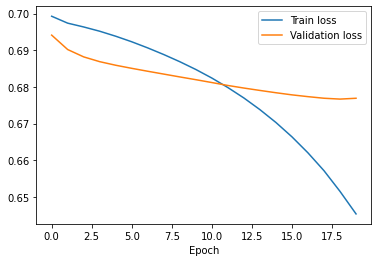

Train loss = tensor(0.6454, device='cuda:0', grad_fn=<AddBackward0>)
Val loss = tensor(0.6767, device='cuda:0')


In [ ]:
print("Best hyperparameters:", best_hyperparams)
print()

num_epochs = 20
inputs = [train_data_main, train_data_fourier]
val_in = [val_data_main, val_data_fourier]
targets = torch.FloatTensor(train_labels)
val_targets = torch.FloatTensor(val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

model = LSTMClassifierWithFourierAux(num_features, 
                                    best_hyperparams['hidden_dim_main'],
                                    best_hyperparams['hidden_dim_aux'], 
                                    num_layers=best_hyperparams['L'], 
                                    fc_size=best_hyperparams['fc_dim'])
optimizer = optim.SGD(model.parameters(), lr=best_hyperparams['lr'])
model = model.to(device)

running_train_loss = []
running_val_loss = []
for epoch in range(num_epochs):
  train_loss = 0
  for i in range(num_batches):
    model.zero_grad()
    batch_main = inputs[0][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
    batch_fourier = inputs[1][:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model((batch_main, batch_fourier)).squeeze()
    loss = loss_fn(scores, target_batch.squeeze())
    loss.backward()
    optimizer.step()
    train_loss += loss / num_batches
  val_loss = 0
  num_val_batches = val_in[0].shape[1] // batch_size + 1
  with torch.no_grad():
    for i in range(num_val_batches):
      batch_main = val_in[0][:, i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size), :]
      batch_fourier = val_in[1][:, i * batch_size : min(val_in[0].shape[1], 
                                          i * batch_size + batch_size), :]
      target_batch = val_targets[i * batch_size : min(val_in[0].shape[1], 
                                          i * batch_size + batch_size)]
      val_scores = model((batch_main, batch_fourier)).squeeze()
      loss = loss_fn(val_scores, target_batch.squeeze())
      val_loss += loss / num_val_batches
  running_train_loss.append(train_loss)
  running_val_loss.append(val_loss)
  print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
      epoch, train_loss, val_loss))
  print("")

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(running_val_loss, label="Validation loss")
plt.legend()
plt.xlabel("Epoch")
plt.show()

print("Train loss =", min(running_train_loss))
print("Val loss =", min(running_val_loss))

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del model
del inputs
del targets
del val_in
del val_targets

### Primary + Secondary (with Fourier) Features

In [ ]:
def primary_secondary_featurized_data(sample):
  dist_right, dist_left, time = normalized_tapping_distance(sample.data)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  dist_right_amp, _ = distance_amplitude(time, dist_right)
  dist_left_amp, _ = distance_amplitude(time, dist_left)
  right_v_amp, _ = velocity_amplitude(time, right_v)
  left_v_amp, _ = velocity_amplitude(time, left_v)
  right_freq, _, _ = tapping_frequency(time, dist_right)
  left_freq, _, _ = tapping_frequency(time, dist_right)
  right_acc, _ = tap_acceleration(time, right_v)
  left_acc, _ = tap_acceleration(time, left_v)
  _, right_cv = movement_consistency(time, dist_right)
  _, left_cv = movement_consistency(time, dist_left)
  time = np.asarray(time) - time[0]
  seq_len = len(time)
  label = 1 if sample.on_state == "on" else 0
  featurized_main = np.zeros((seq_len, 1, 14))
  featurized_main[:, 0, 0] = np.asarray(dist_left)
  featurized_main[:, 0, 1] = np.asarray(dist_right)
  featurized_main[:, 0, 2] = np.asarray(left_v)
  featurized_main[:, 0, 3] = np.asarray(right_v)
  featurized_main[:, 0, 4] = np.asarray(dist_left_amp)
  featurized_main[:, 0, 5] = np.asarray(dist_right_amp)
  featurized_main[:, 0, 6] = np.asarray(left_v_amp)
  featurized_main[:, 0, 7] = np.asarray(right_v_amp)
  featurized_main[:, 0, 8] = np.asarray(left_freq)
  featurized_main[:, 0, 9] = np.asarray(right_freq)
  featurized_main[:, 0, 10] = np.asarray(left_acc)
  featurized_main[:, 0, 11] = np.asarray(right_acc)
  featurized_main[:, 0, 12] = np.asarray(left_cv)
  featurized_main[:, 0, 13] = np.asarray(right_cv)
  dist_right_spectrum, freq = fourier_transform(time, np.asarray(dist_right))
  dist_left_spectrum, _ = fourier_transform(time, np.asarray(dist_left))
  right_v_spectrum, _ = fourier_transform(time, np.asarray(right_v))
  left_v_spectrum, _ = fourier_transform(time, np.asarray(left_v))
  dist_right_amp_spectrum, _ = fourier_transform(time, np.asarray(dist_right_amp))
  dist_left_amp_spectrum, _ = fourier_transform(time, np.asarray(dist_left_amp))
  right_v_amp_spectrum, _ = fourier_transform(time, np.asarray(right_v_amp))
  left_v_amp_spectrum, _ = fourier_transform(time, np.asarray(left_v_amp))
  left_acc_spectrum, _ = fourier_transform(time, np.asarray(left_acc))
  right_acc_spectrum, _ = fourier_transform(time, np.asarray(right_acc))
  seq_len = len(freq)
  featurized_fourier = np.zeros((seq_len, 1, 10))
  featurized_fourier[:, 0, 0] = np.asarray(dist_left_spectrum)
  featurized_fourier[:, 0, 1] = np.asarray(dist_right_spectrum)
  featurized_fourier[:, 0, 2] = np.asarray(left_v_spectrum)
  featurized_fourier[:, 0, 3] = np.asarray(right_v_spectrum)
  featurized_fourier[:, 0, 4] = np.asarray(dist_left_amp_spectrum)
  featurized_fourier[:, 0, 5] = np.asarray(dist_right_amp_spectrum)
  featurized_fourier[:, 0, 6] = np.asarray(left_v_amp_spectrum)
  featurized_fourier[:, 0, 7] = np.asarray(right_v_amp_spectrum)
  featurized_fourier[:, 0, 8] = np.asarray(left_acc_spectrum)
  featurized_fourier[:, 0, 9] = np.asarray(right_acc_spectrum)
  return time, featurized_main, freq, featurized_fourier, label

def primary_secondary_featurized_dataset(dataset):
  featurized_main_list = []
  times_list = []
  featurized_fourier_list = []
  freq_list = []
  labels = []
  for sample in dataset:
    time, featurized_main, freq, featurized_fourier, label = primary_secondary_featurized_data(sample)
    featurized_main_list.append(featurized_main)
    times_list.append(time)
    featurized_fourier_list.append(featurized_fourier)
    freq_list.append(freq)
    labels.append(label)
  times_concat = np.concatenate(times_list)
  times_union = np.unique(times_concat)
  freq_concat = np.concatenate(freq_list)
  freq_union = np.unique(freq_concat)
  featurized_main_interped_list = []
  featurized_fourier_interped_list = []

  seq_len = len(times_union)
  for i, f in enumerate(featurized_main_list):
    times_f = times_list[i]
    featurized_interped = torch.zeros((seq_len, 1, f.shape[2]))
    for j in range(f.shape[2]):
      feature = f[:, 0, j]
      feature_interped = np.interp(times_union, times_f, feature)
      featurized_interped[:, 0, j] = torch.tensor(feature_interped)
    featurized_main_interped_list.append(featurized_interped)
  
  seq_len = len(freq_union)
  for i, f in enumerate(featurized_fourier_list):
    freq_f = freq_list[i]
    featurized_interped = torch.zeros((seq_len, 1, f.shape[2]))
    for j in range(f.shape[2]):
      feature = f[:, 0, j]
      feature_interped = np.interp(freq_union, freq_f, feature)
      featurized_interped[:, 0, j] = torch.tensor(feature_interped)
    featurized_fourier_interped_list.append(featurized_interped)
    
  return (featurized_main_interped_list, featurized_fourier_interped_list), labels

In [ ]:
(featurized_data_main, featurized_data_fourier), labels = primary_secondary_featurized_dataset(on_data + off_data)

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:1072: RuntimeWarning: Mean of empty slice.
  return a.std(axis) / a.mean(axis)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning

In [ ]:
n = len(featurized_data_main)
train_idxs = np.random.choice(range(n), round(0.8 * n), replace=False)
test_idxs = [i for i in range(n) if i not in train_idxs]

train_data_main = [featurized_data_main[i] for i in train_idxs]
train_data_main = torch.nan_to_num(torch.cat(train_data_main, dim=1))
train_data_fourier = [featurized_data_fourier[i] for i in train_idxs]
train_data_fourier = torch.nan_to_num(torch.cat(train_data_fourier, dim=1))
train_labels = [labels[i] for i in train_idxs]
test_data_main = [featurized_data_main[i] for i in test_idxs]
test_data_fourier = [featurized_data_fourier[i] for i in test_idxs]
test_labels = [labels[i] for i in test_idxs]

In [ ]:
n = len(test_data_main)
val_idxs = np.random.choice(range(n), round(0.6 * n), replace=False)
test_idxs = [i for i in range(n) if i not in val_idxs]

val_data_main = [test_data_main[i] for i in val_idxs]
val_data_main = torch.nan_to_num(torch.cat(val_data_main, dim=1))
val_data_fourier = [test_data_fourier[i] for i in val_idxs]
val_data_fourier = torch.nan_to_num(torch.cat(val_data_fourier, dim=1))
val_labels = [test_labels[i] for i in val_idxs]
test_data_main = [test_data_main[i] for i in test_idxs]
test_data_main = torch.nan_to_num(torch.cat(test_data_main, dim=1))
test_data_fourier = [test_data_fourier[i] for i in test_idxs]
test_data_fourier = torch.nan_to_num(torch.cat(test_data_fourier, dim=1))
test_labels = [test_labels[i] for i in test_idxs]

In [ ]:
print(train_data_main.size())
print(train_data_fourier.size())
print(val_data_main.size())
print(val_data_fourier.size())
print(test_data_main.size())
print(test_data_fourier.size())

torch.Size([13522, 79, 14])
torch.Size([20900, 79, 10])
torch.Size([13522, 12, 14])
torch.Size([20900, 12, 10])
torch.Size([13522, 8, 14])
torch.Size([20900, 8, 10])


In [ ]:
def standardize_data(dataset):
  mean = torch.mean(dataset, dim=0)
  std = torch.std(dataset, dim=0)
  return (dataset - mean) / std

In [ ]:
train_data_main = standardize_data(train_data_main).nan_to_num()
val_data_main = standardize_data(val_data_main).nan_to_num()
test_data_main = standardize_data(test_data_main).nan_to_num()

train_data_fourier = standardize_data(train_data_fourier).nan_to_num()
val_data_fourier = standardize_data(val_data_fourier).nan_to_num()
test_data_fourier = standardize_data(test_data_fourier).nan_to_num()

#### Multi-layer LSTM model

In [ ]:
seq_len_main = train_data_main.shape[0]
num_samples = train_data_main.shape[1]
num_features = 14
num_epochs = 10
batch_size = 8
num_batches = num_samples // batch_size + 1

class LSTMClassifierWithFourierAux(nn.Module):

  def __init__(self, num_features, hidden_dim_main, hidden_dim_aux, 
               num_layers=1, fc_size=10, bidirectional=True):
    super().__init__()
    self.lstm_main = nn.LSTM(num_features, hidden_dim_main, num_layers)
    if num_features == 4:
      self.lstm_aux = nn.LSTM(4, hidden_dim_aux, num_layers)
    elif num_features == 14:
      self.lstm_aux = nn.LSTM(10, hidden_dim_aux, num_layers)
    self.linear_main = nn.Linear(hidden_dim_main, fc_size)
    self.linear_aux = nn.Linear(hidden_dim_aux, fc_size)
    self.relu = nn.ReLU()
    self.output = nn.Linear(2 * fc_size, 1)
    self.sigmoid = nn.Sigmoid()

  def forward(self, x):
    x_main = x[0]
    x_fourier = x[1]
    all_h, (h, c) = self.lstm_main(x_main)
    h_main = torch.mean(h, dim=0)
    all_h, (h, c) = self.lstm_aux(x_fourier)
    h_aux = torch.mean(h, dim=0)
    a_main = self.relu(self.linear_main(h_main))
    a_aux = self.relu(self.linear_aux(h_aux))
    out = self.sigmoid(self.output(torch.cat([a_main, a_aux], dim=-1)))
    return out

loss_fn = nn.BCELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
seed = 123
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

inputs = [train_data_main, train_data_fourier]
val_in = [val_data_main, val_data_fourier]
targets = torch.FloatTensor(train_labels)
val_targets = torch.FloatTensor(val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

best_hyperparams = {}
best_val_loss = np.inf

for i in range(20):
  L = np.random.choice([1, 2])
  fc_dim = np.random.choice([20, 50, 100])
  lr = np.random.choice([1e-1, 1e-2, 1e-3])
  hidden_dim_main = np.random.choice([20, 50, 100])
  hidden_dim_aux = np.random.choice([20, 50, 100])

  curr_hyperparams = {"L": L, "lr": lr, "fc_dim": fc_dim, 
                      "hidden_dim_main": hidden_dim_main, 
                      "hidden_dim_aux":hidden_dim_aux}

  model = LSTMClassifierWithFourierAux(num_features, hidden_dim_main, hidden_dim_aux, 
                                      num_layers=L, fc_size=fc_dim)
  optimizer = optim.SGD(model.parameters(), lr=lr)
  model = model.to(device)

  running_train_loss = []
  running_val_loss = []
  for epoch in range(num_epochs):
    train_loss = 0
    for i in range(num_batches):
      model.zero_grad()
      batch_main = inputs[0][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      batch_fourier = inputs[1][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      target_batch = targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      scores = model((batch_main, batch_fourier)).squeeze()
      loss = loss_fn(scores, target_batch.squeeze())
      loss.backward()
      optimizer.step()
      train_loss += loss / num_batches
    val_loss = 0
    num_val_batches = val_in[0].shape[1] // batch_size + 1
    with torch.no_grad():
      for i in range(num_val_batches):
        batch_main = val_in[0][:, i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size), :]
        batch_fourier = val_in[1][:, i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size), :]
        target_batch = val_targets[i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size)]
        val_scores = model((batch_main, batch_fourier)).squeeze()
        loss = loss_fn(val_scores, target_batch.squeeze())
        val_loss += loss / num_val_batches
    running_train_loss.append(train_loss)
    running_val_loss.append(val_loss)
  if min(running_val_loss) < best_val_loss:
    best_val_loss = min(running_val_loss)
    best_hyperparams = curr_hyperparams

  print(curr_hyperparams)
  print("Train loss:", min(running_train_loss))
  print("Val loss:", min(running_val_loss))
  print()

  gc.collect()
  torch.cuda.empty_cache()
  del model

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim_main': 100, 'hidden_dim_aux': 20}
Train loss: tensor(0.6869, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6909, device='cuda:0')

{'L': 1, 'lr': 0.01, 'fc_dim': 100, 'hidden_dim_main': 100, 'hidden_dim_aux': 50}
Train loss: tensor(0.6809, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.7073, device='cuda:0')

{'L': 1, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim_main': 50, 'hidden_dim_aux': 100}
Train loss: tensor(0.6152, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6423, device='cuda:0')

{'L': 2, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim_main': 100, 'hidden_dim_aux': 20}
Train loss: tensor(0.6445, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6757, device='cuda:0')

{'L': 2, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim_main': 50, 'hidden_dim_aux': 20}
Train loss: tensor(0.6968, device='cuda:0', grad_fn=<AddBackward0>)
Val loss: tensor(0.6835, device='cuda:0')

{'L': 1, 'lr': 0.1, 'fc_dim': 20, 'hidde

In [ ]:
del inputs
del val_in

Best hyperparameters: {'L': 1, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim_main': 100, 'hidden_dim_aux': 20}

Epoch 0: 
 Training loss = 0.6972889304161072 
 Validation loss = 0.6911145448684692

Epoch 1: 
 Training loss = 0.6892138123512268 
 Validation loss = 0.6887999176979065

Epoch 2: 
 Training loss = 0.6819650530815125 
 Validation loss = 0.68559730052948

Epoch 3: 
 Training loss = 0.6747481822967529 
 Validation loss = 0.6818675994873047

Epoch 4: 
 Training loss = 0.6675084233283997 
 Validation loss = 0.6779506802558899

Epoch 5: 
 Training loss = 0.6601427793502808 
 Validation loss = 0.6744236946105957

Epoch 6: 
 Training loss = 0.6527122855186462 
 Validation loss = 0.6708654761314392

Epoch 7: 
 Training loss = 0.6455039978027344 
 Validation loss = 0.6675903797149658

Epoch 8: 
 Training loss = 0.6388214230537415 
 Validation loss = 0.6645466089248657

Epoch 9: 
 Training loss = 0.6328907608985901 
 Validation loss = 0.661670446395874

Epoch 10: 
 Training loss = 0.6278676986

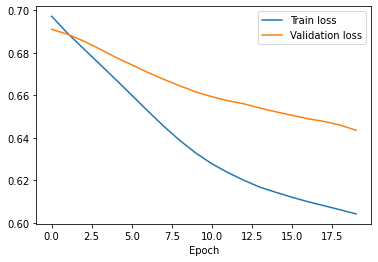

Train loss = tensor(0.6043, device='cuda:0', grad_fn=<AddBackward0>)
Val loss = tensor(0.6436, device='cuda:0')


In [ ]:
print("Best hyperparameters:", best_hyperparams)
print()

num_epochs = 20
inputs = [train_data_main, train_data_fourier]
val_in = [val_data_main, val_data_fourier]
targets = torch.FloatTensor(train_labels)
val_targets = torch.FloatTensor(val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

model = LSTMClassifierWithFourierAux(num_features, 
                                    best_hyperparams['hidden_dim_main'],
                                    best_hyperparams['hidden_dim_aux'], 
                                    num_layers=best_hyperparams['L'], 
                                    fc_size=best_hyperparams['fc_dim'])
optimizer = optim.SGD(model.parameters(), lr=best_hyperparams['lr'])
model = model.to(device)

running_train_loss = []
running_val_loss = []
for epoch in range(num_epochs):
  train_loss = 0
  for i in range(num_batches):
    model.zero_grad()
    batch_main = inputs[0][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
    batch_fourier = inputs[1][:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model((batch_main, batch_fourier)).squeeze()
    loss = loss_fn(scores, target_batch.squeeze())
    loss.backward()
    optimizer.step()
    train_loss += loss / num_batches
  val_loss = 0
  num_val_batches = val_in[0].shape[1] // batch_size + 1
  with torch.no_grad():
    for i in range(num_val_batches):
      batch_main = val_in[0][:, i * batch_size : min(val_in[0].shape[1], 
                                            i * batch_size + batch_size), :]
      batch_fourier = val_in[1][:, i * batch_size : min(val_in[0].shape[1], 
                                          i * batch_size + batch_size), :]
      target_batch = val_targets[i * batch_size : min(val_in[0].shape[1], 
                                          i * batch_size + batch_size)]
      val_scores = model((batch_main, batch_fourier)).squeeze()
      loss = loss_fn(val_scores, target_batch.squeeze())
      val_loss += loss / num_val_batches
  running_train_loss.append(train_loss)
  running_val_loss.append(val_loss)
  print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
      epoch, train_loss, val_loss))
  print("")

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(running_val_loss, label="Validation loss")
plt.legend()
plt.xlabel("Epoch")
plt.show()

print("Train loss =", min(running_train_loss))
print("Val loss =", min(running_val_loss))

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del model
del inputs
del targets
del val_in
del val_targets

### Statistical scalar features (time and frequency domain) + LSTM feature extraction

In [ ]:
def scalar_features(sample):
  dist_right, dist_left, time = normalized_tapping_distance(sample.data)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  dist_right_amp, _ = distance_amplitude(time, dist_right)
  dist_left_amp, _ = distance_amplitude(time, dist_left)
  right_v_amp, _ = velocity_amplitude(time, right_v)
  left_v_amp, _ = velocity_amplitude(time, left_v)
  right_freq, _, _ = tapping_frequency(time, dist_right)
  left_freq, _, _ = tapping_frequency(time, dist_right)
  right_acc, _ = tap_acceleration(time, right_v)
  left_acc, _ = tap_acceleration(time, left_v)
  _, right_cv = movement_consistency(time, dist_right)
  _, left_cv = movement_consistency(time, dist_left)
  dist_right_spectrum, freq = fourier_transform(time, np.asarray(dist_right))
  dist_left_spectrum, _ = fourier_transform(time, np.asarray(dist_left))
  right_v_spectrum, _ = fourier_transform(time, np.asarray(right_v))
  left_v_spectrum, _ = fourier_transform(time, np.asarray(left_v))
  dist_right_amp_spectrum, _ = fourier_transform(time, np.asarray(dist_right_amp))
  dist_left_amp_spectrum, _ = fourier_transform(time, np.asarray(dist_left_amp))
  right_v_amp_spectrum, _ = fourier_transform(time, np.asarray(right_v_amp))
  left_v_amp_spectrum, _ = fourier_transform(time, np.asarray(left_v_amp))
  left_acc_spectrum, _ = fourier_transform(time, np.asarray(left_acc))
  right_acc_spectrum, _ = fourier_transform(time, np.asarray(right_acc))

  featurized = np.zeros(46)

  featurized[0] = np.nanmean(np.asarray(dist_right))
  featurized[1] = np.nanstd(np.asarray(dist_right))
  featurized[2] = np.nanmean(np.asarray(dist_left))
  featurized[3] = np.nanstd(np.asarray(dist_left))
  featurized[4] = np.nanmean(np.asarray(right_v))
  featurized[5] = np.nanstd(np.asarray(right_v))
  featurized[6] = np.nanmean(np.asarray(left_v))
  featurized[7] = np.nanstd(np.asarray(left_v))
  featurized[8] = np.nanmean(np.asarray(right_acc))
  featurized[9] = np.nanstd(np.asarray(right_acc))
  featurized[10] = np.nanmean(np.asarray(left_acc))
  featurized[11] = np.nanstd(np.asarray(left_acc))
  featurized[12] = np.nanmean(np.asarray(dist_right_amp))
  featurized[13] = np.nanstd(np.asarray(dist_right_amp))
  featurized[14] = np.nanmean(np.asarray(dist_left_amp))
  featurized[15] = np.nanstd(np.asarray(dist_left_amp))
  featurized[16] = np.nanmean(np.asarray(right_v_amp))
  featurized[17] = np.nanstd(np.asarray(right_v_amp))
  featurized[18] = np.nanmean(np.asarray(left_v_amp))
  featurized[19] = np.nanstd(np.asarray(left_v_amp))

  featurized[20] = np.nanmean(np.asarray(dist_right_spectrum))
  featurized[21] = np.nanstd(np.asarray(dist_right_spectrum))
  featurized[22] = np.nanmean(np.asarray(dist_left_spectrum))
  featurized[23] = np.nanstd(np.asarray(dist_left_spectrum))
  featurized[24] = np.nanmean(np.asarray(right_v_spectrum))
  featurized[25] = np.nanstd(np.asarray(right_v_spectrum))
  featurized[26] = np.nanmean(np.asarray(left_v_spectrum))
  featurized[27] = np.nanstd(np.asarray(left_v_spectrum))
  featurized[28] = np.nanmean(np.asarray(right_acc_spectrum))
  featurized[29] = np.nanstd(np.asarray(right_acc_spectrum))
  featurized[30] = np.nanmean(np.asarray(left_acc_spectrum))
  featurized[31] = np.nanstd(np.asarray(left_acc_spectrum))
  featurized[32] = np.nanmean(np.asarray(dist_right_amp_spectrum))
  featurized[33] = np.nanstd(np.asarray(dist_right_amp_spectrum))
  featurized[34] = np.nanmean(np.asarray(dist_left_amp_spectrum))
  featurized[35] = np.nanstd(np.asarray(dist_left_amp_spectrum))
  featurized[36] = np.nanmean(np.asarray(right_v_amp_spectrum))
  featurized[37] = np.nanstd(np.asarray(right_v_amp_spectrum))
  featurized[38] = np.nanmean(np.asarray(left_v_amp_spectrum))
  featurized[39] = np.nanstd(np.asarray(left_v_amp_spectrum))

  featurized[40] = np.nanmean(np.asarray(right_freq))
  featurized[41] = np.nanstd(np.asarray(right_freq))
  featurized[42] = np.nanmean(np.asarray(left_freq))
  featurized[43] = np.nanstd(np.asarray(left_freq))
  featurized[44] = right_cv
  featurized[45] = left_cv

  label = 1 if sample.on_state == "on" else 0

  featurized = torch.FloatTensor(featurized.reshape((1, 46)))
  
  return featurized, label

def scalar_featurize_dataset(dataset):
  featurized_list = []
  labels = []
  for sample in dataset:
    featurized, label = scalar_features(sample)
    featurized_list.append(featurized)
    labels.append(label)
  return featurized_list, labels

def raw_data(dataset):
  multivariate_data = []
  times_list = []
  labels = []

  for sample in dataset:
    sample_df = sample.data
    right_thumb_tip_x = np.asarray(sample_df["right_thumb_tip:x"])
    right_thumb_tip_y = np.asarray(sample_df["right_thumb_tip:y"])
    right_index_tip_x = np.asarray(sample_df["right_index_tip:x"])
    right_index_tip_y = np.asarray(sample_df["right_index_tip:y"])
    left_thumb_tip_x = np.asarray(sample_df["left_thumb_tip:x"])
    left_thumb_tip_y = np.asarray(sample_df["left_thumb_tip:y"])
    left_index_tip_x = np.asarray(sample_df["left_index_tip:x"])
    left_index_tip_y = np.asarray(sample_df["left_index_tip:y"])
    time = np.asarray(sample_df["timestamp"])
    time = time - time[0]
    times_list.append(time)
    extracted_data = np.zeros((len(time), 1, 8))
    extracted_data[:, 0, 0] = right_thumb_tip_x
    extracted_data[:, 0, 1] = right_thumb_tip_y
    extracted_data[:, 0, 2] = right_index_tip_x
    extracted_data[:, 0, 3] = right_index_tip_y
    extracted_data[:, 0, 4] = left_thumb_tip_x
    extracted_data[:, 0, 5] = left_thumb_tip_y
    extracted_data[:, 0, 6] = left_index_tip_x
    extracted_data[:, 0, 7] = left_index_tip_y
    multivariate_data.append(extracted_data)
    label = 1 if sample.on_state == "on" else 0
    labels.append(label)
    
  times_concat = np.concatenate(times_list)
  times_union = np.unique(times_concat)

  interped_multivariate_data = []
  seq_len = len(times_union)
  for i, f in enumerate(multivariate_data):
    times_f = times_list[i]
    interped = torch.zeros((seq_len, 1, f.shape[2]))
    for j in range(f.shape[2]):
      feature = f[:, 0, j]
      feature_interped = np.interp(times_union, times_f, feature)
      interped[:, 0, j] = torch.tensor(feature_interped)
    interped_multivariate_data.append(interped)

  return interped_multivariate_data, labels

In [ ]:
scalar_features, labels = scalar_featurize_dataset(on_data + off_data)
raw_multivariate_data, _ = raw_data(on_data + off_data)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:1072: RuntimeWarning: Mean of empty slice.
  return a.std

In [ ]:
n = len(scalar_features)
train_idxs = np.random.choice(range(n), round(0.8 * n), replace=False)
test_idxs = [i for i in range(n) if i not in train_idxs]

train_data_scalar = [scalar_features[i] for i in train_idxs]
train_data_scalar = torch.nan_to_num(torch.cat(train_data_scalar, dim=0))
train_data_raw = [raw_multivariate_data[i] for i in train_idxs]
train_data_raw = torch.nan_to_num(torch.cat(train_data_raw, dim=1))
train_labels = [labels[i] for i in train_idxs]
test_data_scalar = [scalar_features[i] for i in test_idxs]
test_data_raw = [raw_multivariate_data[i] for i in test_idxs]
test_labels = [labels[i] for i in test_idxs]

In [ ]:
n = len(test_data_scalar)
val_idxs = np.random.choice(range(n), round(0.6 * n), replace=False)
test_idxs = [i for i in range(n) if i not in val_idxs]

val_data_scalar = [test_data_scalar[i] for i in val_idxs]
val_data_scalar = torch.nan_to_num(torch.cat(val_data_scalar, dim=0))
val_data_raw = [test_data_raw[i] for i in val_idxs]
val_data_raw = torch.nan_to_num(torch.cat(val_data_raw, dim=1))
val_labels = [test_labels[i] for i in val_idxs]
test_data_scalar = [test_data_scalar[i] for i in test_idxs]
test_data_scalar = torch.nan_to_num(torch.cat(test_data_scalar, dim=0))
test_data_raw = [test_data_raw[i] for i in test_idxs]
test_data_raw = torch.nan_to_num(torch.cat(test_data_raw, dim=1))
test_labels = [test_labels[i] for i in test_idxs]

In [ ]:
print(train_data_scalar.size())
print(train_data_raw.size())
print(val_data_scalar.size())
print(val_data_raw.size())
print(test_data_scalar.size())
print(test_data_raw.size())

torch.Size([79, 46])
torch.Size([1945, 79, 8])
torch.Size([12, 46])
torch.Size([1945, 12, 8])
torch.Size([8, 46])
torch.Size([1945, 8, 8])


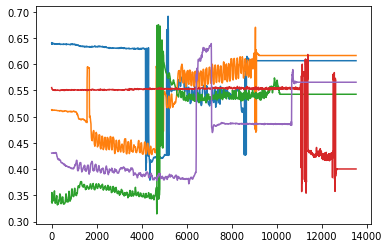

In [ ]:
for i in range(5):
  plt.plot(train_data_raw[:, i, 0])

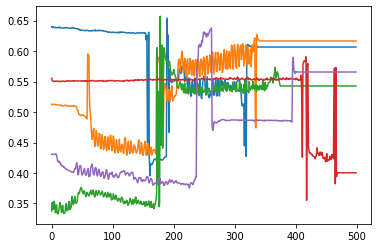

In [ ]:
sampled_idxs = np.linspace(0, train_data_raw.shape[0], 500, endpoint=False, dtype=int)
for i in range(5):
  sampled = train_data_raw[:, i, 0][sampled_idxs]
  plt.plot(sampled)

In [ ]:
sampled_idxs = np.linspace(0, train_data_raw.shape[0], 500, endpoint=False, dtype=int)
train_data_raw = train_data_raw[sampled_idxs]
val_data_raw = val_data_raw[sampled_idxs]
test_data_raw = test_data_raw[sampled_idxs]

print(train_data_scalar.size())
print(train_data_raw.size())
print(val_data_scalar.size())
print(val_data_raw.size())
print(test_data_scalar.size())
print(test_data_raw.size())

torch.Size([79, 46])
torch.Size([500, 79, 8])
torch.Size([12, 46])
torch.Size([500, 12, 8])
torch.Size([8, 46])
torch.Size([500, 8, 8])


In [ ]:
seq_len = train_data_raw.shape[0]
num_samples = train_data_raw.shape[1]
num_epochs = 10
batch_size = 32
num_batches = num_samples // batch_size + 1

class CombinedScalarAndLSTMFeatureClassifier(nn.Module):

  def __init__(self, hidden_dim=54, num_layers=1, fc_size=10, bidirectional=True):
    super(CombinedScalarAndLSTMFeatureClassifier, self).__init__()
    self.lstm = nn.LSTM(8, hidden_dim)
    self.linear1 = nn.Linear(hidden_dim + 46, fc_size)
    self.relu = nn.ReLU()
    self.linear2 = nn.Linear(fc_size, 1)
    self.sigmoid = nn.Sigmoid()

  def forward(self, x):
    x_scalar = x[0]
    x_raw = x[1]

    all_h, (h, c) = self.lstm(x_raw)
    h = torch.mean(h, dim=0)
    a = self.relu(self.linear1(torch.cat([h, x_scalar], dim=-1)))
    out = self.sigmoid(self.linear2(a))
    return out

loss_fn = nn.BCELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
seed = 123
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

inputs = [train_data_scalar, train_data_raw]
val_in = [val_data_scalar, val_data_raw]
targets = torch.FloatTensor(train_labels)
val_targets = torch.FloatTensor(val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

best_hyperparams = {}
best_val_loss = np.inf

for i in range(20):
  L = np.random.choice([1, 2])
  fc_dim = np.random.choice([20, 50, 100])
  lr = np.random.choice([1e-1, 1e-2, 1e-3])
  hidden_dim = np.random.choice([20, 50, 100])

  curr_hyperparams = {"L": L, "lr": lr, "fc_dim": fc_dim, 
                      "hidden_dim": hidden_dim}

  model = CombinedScalarAndLSTMFeatureClassifier(hidden_dim, num_layers=L, fc_size=fc_dim)
  optimizer = optim.SGD(model.parameters(), lr=lr)
  model = model.to(device)

  running_train_loss = []
  running_val_loss = []
  for epoch in range(num_epochs):
    train_loss = 0
    for i in range(num_batches):
      model.zero_grad()
      batch_scalar = inputs[0][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      batch_raw = inputs[1][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      target_batch = targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      scores = model((batch_scalar, batch_raw)).squeeze()
      loss = loss_fn(scores, target_batch.squeeze())
      loss.backward()
      optimizer.step()
      train_loss += loss.item() / num_batches
    val_loss = 0
    num_val_batches = val_in[1].shape[1] // batch_size + 1
    with torch.no_grad():
      for i in range(num_val_batches):
        val_batch_scalar = val_in[0][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
        val_batch_raw = val_in[1][:, i * batch_size : min(num_samples, 
                                            i * batch_size + batch_size), :]
        val_target_batch = val_targets[i * batch_size : min(num_samples, 
                                            i * batch_size + batch_size)]
        val_scores = model((val_batch_scalar, val_batch_raw)).squeeze()
        loss = loss_fn(val_scores, val_target_batch.squeeze())
        val_loss += loss.item() / num_val_batches
    running_train_loss.append(train_loss)
    running_val_loss.append(val_loss)
  if min(running_val_loss) < best_val_loss:
    best_val_loss = min(running_val_loss)
    best_hyperparams = curr_hyperparams

  print(curr_hyperparams)
  print("Train loss:", min(running_train_loss))
  print("Val loss:", min(running_val_loss))
  print()

  gc.collect()
  torch.cuda.empty_cache()
  del model

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim': 100}
Train loss: 0.7015296419461567
Val loss: 0.7716726064682007

{'L': 1, 'lr': 0.001, 'fc_dim': 100, 'hidden_dim': 50}
Train loss: 0.7296777764956156
Val loss: 0.7997394800186157

{'L': 2, 'lr': 0.01, 'fc_dim': 100, 'hidden_dim': 100}
Train loss: 0.6723690430323284
Val loss: 0.7018332481384277

{'L': 2, 'lr': 0.01, 'fc_dim': 20, 'hidden_dim': 100}
Train loss: 0.683606227238973
Val loss: 0.6784933805465698

{'L': 2, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim': 100}
Train loss: 38.656186421712235
Val loss: 30.733436584472656

{'L': 1, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim': 50}
Train loss: 0.7489140232404073
Val loss: 0.8077397346496582

{'L': 1, 'lr': 0.1, 'fc_dim': 20, 'hidden_dim': 20}
Train loss: 25.985050638516746
Val loss: 65.625

{'L': 2, 'lr': 0.1, 'fc_dim': 100, 'hidden_dim': 100}
Train loss: 41.90059566497803
Val loss: 34.375

{'L': 1, 'lr': 0.01, 'fc_dim': 20, 'hidden_dim': 20}
Train loss: 0.6741451819737753
Val loss: 0.6814552545

In [ ]:
del inputs
del val_in

Best hyperparameters: {'L': 1, 'lr': 0.01, 'fc_dim': 100, 'hidden_dim': 50}

Epoch 0: 
 Training loss = 3.7028442223866778 
 Validation loss = 3.873140811920166

Epoch 1: 
 Training loss = 2.0074748198191323 
 Validation loss = 0.8224791288375854

Epoch 2: 
 Training loss = 0.7491089701652527 
 Validation loss = 0.7787129878997803

Epoch 3: 
 Training loss = 0.7214735945065817 
 Validation loss = 0.7495149374008179

Epoch 4: 
 Training loss = 0.7018925746281942 
 Validation loss = 0.7313004732131958

Epoch 5: 
 Training loss = 0.6896205345789591 
 Validation loss = 0.7190319299697876

Epoch 6: 
 Training loss = 0.6793471574783325 
 Validation loss = 0.7069298028945923

Epoch 7: 
 Training loss = 0.6716273029645283 
 Validation loss = 0.7025506496429443

Epoch 8: 
 Training loss = 0.6692704757054646 
 Validation loss = 0.701147198677063

Epoch 9: 
 Training loss = 0.6631638209025066 
 Validation loss = 0.6864106059074402

Epoch 10: 
 Training loss = 0.6578808228174846 
 Validation loss 

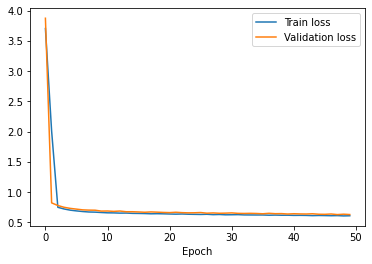

Train loss = 0.6068161527315776
Val loss = 0.6288430690765381


In [ ]:
print("Best hyperparameters:", best_hyperparams)
print()

num_epochs = 50
inputs = [train_data_scalar, train_data_raw]
val_in = [val_data_scalar, val_data_raw]
targets = torch.FloatTensor(train_labels)
val_targets = torch.FloatTensor(val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

model = CombinedScalarAndLSTMFeatureClassifier(best_hyperparams['hidden_dim'],
                                               num_layers=best_hyperparams['L'], 
                                               fc_size=best_hyperparams['fc_dim'])
optimizer = optim.SGD(model.parameters(), lr=best_hyperparams['lr'])
model = model.to(device)

running_train_loss = []
running_val_loss = []
for epoch in range(num_epochs):
  train_loss = 0
  for i in range(num_batches):
    model.zero_grad()
    batch_scalar = inputs[0][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
    batch_raw = inputs[1][:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model((batch_scalar, batch_raw)).squeeze()
    loss = loss_fn(scores, target_batch.squeeze())
    loss.backward()
    optimizer.step()
    train_loss += loss.item() / num_batches
  val_loss = 0
  num_val_batches = val_in[1].shape[1] // batch_size + 1
  with torch.no_grad():
    for i in range(num_val_batches):
      val_batch_scalar = val_in[0][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      val_batch_raw = val_in[1][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      val_target_batch = val_targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      val_scores = model((val_batch_scalar, val_batch_raw)).squeeze()
      loss = loss_fn(val_scores, val_target_batch.squeeze())
      val_loss += loss.item() / num_val_batches
  running_train_loss.append(train_loss)
  running_val_loss.append(val_loss)
  print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
      epoch, train_loss, val_loss))
  print("")

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(running_val_loss, label="Validation loss")
plt.legend()
plt.xlabel("Epoch")
plt.show()

print("Train loss =", min(running_train_loss))
print("Val loss =", min(running_val_loss))

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del model
del inputs
del targets
del val_in
del val_targets

### Statistical scalar features (time and frequency domain) + transformer feature extraction

In [ ]:
def scalar_features(sample):
  dist_right, dist_left, time = normalized_tapping_distance(sample.data)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  dist_right_amp, _ = distance_amplitude(time, dist_right)
  dist_left_amp, _ = distance_amplitude(time, dist_left)
  right_v_amp, _ = velocity_amplitude(time, right_v)
  left_v_amp, _ = velocity_amplitude(time, left_v)
  right_freq, _, _ = tapping_frequency(time, dist_right)
  left_freq, _, _ = tapping_frequency(time, dist_right)
  right_acc, _ = tap_acceleration(time, right_v)
  left_acc, _ = tap_acceleration(time, left_v)
  _, right_cv = movement_consistency(time, dist_right)
  _, left_cv = movement_consistency(time, dist_left)
  dist_right_spectrum, freq = fourier_transform(time, np.asarray(dist_right))
  dist_left_spectrum, _ = fourier_transform(time, np.asarray(dist_left))
  right_v_spectrum, _ = fourier_transform(time, np.asarray(right_v))
  left_v_spectrum, _ = fourier_transform(time, np.asarray(left_v))
  dist_right_amp_spectrum, _ = fourier_transform(time, np.asarray(dist_right_amp))
  dist_left_amp_spectrum, _ = fourier_transform(time, np.asarray(dist_left_amp))
  right_v_amp_spectrum, _ = fourier_transform(time, np.asarray(right_v_amp))
  left_v_amp_spectrum, _ = fourier_transform(time, np.asarray(left_v_amp))
  left_acc_spectrum, _ = fourier_transform(time, np.asarray(left_acc))
  right_acc_spectrum, _ = fourier_transform(time, np.asarray(right_acc))

  featurized = np.zeros(46)

  featurized[0] = np.nanmean(np.asarray(dist_right))
  featurized[1] = np.nanstd(np.asarray(dist_right))
  featurized[2] = np.nanmean(np.asarray(dist_left))
  featurized[3] = np.nanstd(np.asarray(dist_left))
  featurized[4] = np.nanmean(np.asarray(right_v))
  featurized[5] = np.nanstd(np.asarray(right_v))
  featurized[6] = np.nanmean(np.asarray(left_v))
  featurized[7] = np.nanstd(np.asarray(left_v))
  featurized[8] = np.nanmean(np.asarray(right_acc))
  featurized[9] = np.nanstd(np.asarray(right_acc))
  featurized[10] = np.nanmean(np.asarray(left_acc))
  featurized[11] = np.nanstd(np.asarray(left_acc))
  featurized[12] = np.nanmean(np.asarray(dist_right_amp))
  featurized[13] = np.nanstd(np.asarray(dist_right_amp))
  featurized[14] = np.nanmean(np.asarray(dist_left_amp))
  featurized[15] = np.nanstd(np.asarray(dist_left_amp))
  featurized[16] = np.nanmean(np.asarray(right_v_amp))
  featurized[17] = np.nanstd(np.asarray(right_v_amp))
  featurized[18] = np.nanmean(np.asarray(left_v_amp))
  featurized[19] = np.nanstd(np.asarray(left_v_amp))

  featurized[20] = np.nanmean(np.asarray(dist_right_spectrum))
  featurized[21] = np.nanstd(np.asarray(dist_right_spectrum))
  featurized[22] = np.nanmean(np.asarray(dist_left_spectrum))
  featurized[23] = np.nanstd(np.asarray(dist_left_spectrum))
  featurized[24] = np.nanmean(np.asarray(right_v_spectrum))
  featurized[25] = np.nanstd(np.asarray(right_v_spectrum))
  featurized[26] = np.nanmean(np.asarray(left_v_spectrum))
  featurized[27] = np.nanstd(np.asarray(left_v_spectrum))
  featurized[28] = np.nanmean(np.asarray(right_acc_spectrum))
  featurized[29] = np.nanstd(np.asarray(right_acc_spectrum))
  featurized[30] = np.nanmean(np.asarray(left_acc_spectrum))
  featurized[31] = np.nanstd(np.asarray(left_acc_spectrum))
  featurized[32] = np.nanmean(np.asarray(dist_right_amp_spectrum))
  featurized[33] = np.nanstd(np.asarray(dist_right_amp_spectrum))
  featurized[34] = np.nanmean(np.asarray(dist_left_amp_spectrum))
  featurized[35] = np.nanstd(np.asarray(dist_left_amp_spectrum))
  featurized[36] = np.nanmean(np.asarray(right_v_amp_spectrum))
  featurized[37] = np.nanstd(np.asarray(right_v_amp_spectrum))
  featurized[38] = np.nanmean(np.asarray(left_v_amp_spectrum))
  featurized[39] = np.nanstd(np.asarray(left_v_amp_spectrum))

  featurized[40] = np.nanmean(np.asarray(right_freq))
  featurized[41] = np.nanstd(np.asarray(right_freq))
  featurized[42] = np.nanmean(np.asarray(left_freq))
  featurized[43] = np.nanstd(np.asarray(left_freq))
  featurized[44] = right_cv
  featurized[45] = left_cv

  label = 1 if sample.on_state == "on" else 0

  featurized = torch.FloatTensor(featurized.reshape((1, 46)))
  
  return featurized, label

def scalar_featurize_dataset(dataset):
  featurized_list = []
  labels = []
  for sample in dataset:
    featurized, label = scalar_features(sample)
    featurized_list.append(featurized)
    labels.append(label)
  return featurized_list, labels

def raw_data(dataset):
  multivariate_data = []
  times_list = []
  labels = []

  for sample in dataset:
    sample_df = sample.data
    right_thumb_tip_x = np.asarray(sample_df["right_thumb_tip:x"])
    right_thumb_tip_y = np.asarray(sample_df["right_thumb_tip:y"])
    right_index_tip_x = np.asarray(sample_df["right_index_tip:x"])
    right_index_tip_y = np.asarray(sample_df["right_index_tip:y"])
    left_thumb_tip_x = np.asarray(sample_df["left_thumb_tip:x"])
    left_thumb_tip_y = np.asarray(sample_df["left_thumb_tip:y"])
    left_index_tip_x = np.asarray(sample_df["left_index_tip:x"])
    left_index_tip_y = np.asarray(sample_df["left_index_tip:y"])
    time = np.asarray(sample_df["timestamp"])
    time = time - time[0]
    times_list.append(time)
    extracted_data = np.zeros((len(time), 1, 8))
    extracted_data[:, 0, 0] = right_thumb_tip_x
    extracted_data[:, 0, 1] = right_thumb_tip_y
    extracted_data[:, 0, 2] = right_index_tip_x
    extracted_data[:, 0, 3] = right_index_tip_y
    extracted_data[:, 0, 4] = left_thumb_tip_x
    extracted_data[:, 0, 5] = left_thumb_tip_y
    extracted_data[:, 0, 6] = left_index_tip_x
    extracted_data[:, 0, 7] = left_index_tip_y
    multivariate_data.append(extracted_data)
    label = 1 if sample.on_state == "on" else 0
    labels.append(label)
    
  times_concat = np.concatenate(times_list)
  times_union = np.unique(times_concat)

  interped_multivariate_data = []
  seq_len = len(times_union)
  for i, f in enumerate(multivariate_data):
    times_f = times_list[i]
    interped = torch.zeros((seq_len, 1, f.shape[2]))
    for j in range(f.shape[2]):
      feature = f[:, 0, j]
      feature_interped = np.interp(times_union, times_f, feature)
      interped[:, 0, j] = torch.tensor(feature_interped)
    interped_multivariate_data.append(interped)

  return interped_multivariate_data, labels

In [ ]:
scalar_features, labels = scalar_featurize_dataset(on_data + off_data)
raw_multivariate_data, _ = raw_data(on_data + off_data)

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:1072: RuntimeWarning: Mean of empty slice.
  return a.std(axis) / a.mean(axis)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning

In [ ]:
n = len(scalar_features)
train_idxs = np.random.choice(range(n), round(0.8 * n), replace=False)
test_idxs = [i for i in range(n) if i not in train_idxs]

train_data_scalar = [scalar_features[i] for i in train_idxs]
train_data_scalar = torch.nan_to_num(torch.cat(train_data_scalar, dim=0))
train_data_raw = [raw_multivariate_data[i] for i in train_idxs]
train_data_raw = torch.nan_to_num(torch.cat(train_data_raw, dim=1))
train_labels = [labels[i] for i in train_idxs]
test_data_scalar = [scalar_features[i] for i in test_idxs]
test_data_raw = [raw_multivariate_data[i] for i in test_idxs]
test_labels = [labels[i] for i in test_idxs]

In [ ]:
n = len(test_data_scalar)
val_idxs = np.random.choice(range(n), round(0.6 * n), replace=False)
test_idxs = [i for i in range(n) if i not in val_idxs]

val_data_scalar = [test_data_scalar[i] for i in val_idxs]
val_data_scalar = torch.nan_to_num(torch.cat(val_data_scalar, dim=0))
val_data_raw = [test_data_raw[i] for i in val_idxs]
val_data_raw = torch.nan_to_num(torch.cat(val_data_raw, dim=1))
val_labels = [test_labels[i] for i in val_idxs]
test_data_scalar = [test_data_scalar[i] for i in test_idxs]
test_data_scalar = torch.nan_to_num(torch.cat(test_data_scalar, dim=0))
test_data_raw = [test_data_raw[i] for i in test_idxs]
test_data_raw = torch.nan_to_num(torch.cat(test_data_raw, dim=1))
test_labels = [test_labels[i] for i in test_idxs]

In [ ]:
print(train_data_scalar.size())
print(train_data_raw.size())
print(val_data_scalar.size())
print(val_data_raw.size())
print(test_data_scalar.size())
print(test_data_raw.size())

torch.Size([79, 46])
torch.Size([13522, 79, 8])
torch.Size([12, 46])
torch.Size([13522, 12, 8])
torch.Size([8, 46])
torch.Size([13522, 8, 8])


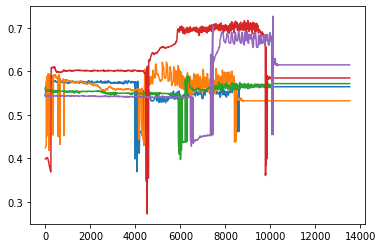

In [ ]:
for i in range(5):
  plt.plot(train_data_raw[:, i, 0])

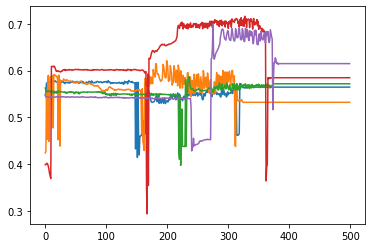

In [ ]:
sampled_idxs = np.linspace(0, train_data_raw.shape[0], 500, endpoint=False, dtype=int)
for i in range(5):
  sampled = train_data_raw[:, i, 0][sampled_idxs]
  plt.plot(sampled)

In [ ]:
sampled_idxs = np.linspace(0, train_data_raw.shape[0], 500, endpoint=False, dtype=int)
train_data_raw = train_data_raw[sampled_idxs]
val_data_raw = val_data_raw[sampled_idxs]
test_data_raw = test_data_raw[sampled_idxs]

print(train_data_scalar.size())
print(train_data_raw.size())
print(val_data_scalar.size())
print(val_data_raw.size())
print(test_data_scalar.size())
print(test_data_raw.size())

torch.Size([79, 46])
torch.Size([500, 79, 8])
torch.Size([12, 46])
torch.Size([500, 12, 8])
torch.Size([8, 46])
torch.Size([500, 8, 8])


In [ ]:
seq_len = train_data_raw.shape[0]
num_samples = train_data_raw.shape[1]
num_epochs = 10
batch_size = 32
num_batches = num_samples // batch_size + 1

class CombinedScalarAndTransformerFeatureClassifier(nn.Module):

  def __init__(self, num_layers=3, fc_size=10):
    super(CombinedScalarAndTransformerFeatureClassifier, self).__init__()
    self.encoder_layer = nn.TransformerEncoderLayer(d_model=8, nhead=8)
    self.transformer_encoder = nn.TransformerEncoder(self.encoder_layer, 
                                                     num_layers=num_layers)  
    self.linear1 = nn.Linear(8 + 46, fc_size)
    self.relu = nn.ReLU()
    self.linear2 = nn.Linear(fc_size, 1)
    self.sigmoid = nn.Sigmoid()

  def forward(self, x):
    x_scalar = x[0]
    x_raw = x[1]

    h = self.transformer_encoder(x_raw)
    h = h.mean(dim=0)
    a = self.relu(self.linear1(torch.cat([h, x_scalar], dim=-1)))
    out = self.sigmoid(self.linear2(a))
    return out

loss_fn = nn.BCELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
seed = 123
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

inputs = [train_data_scalar, train_data_raw]
val_in = [val_data_scalar, val_data_raw]
targets = torch.FloatTensor(train_labels)
val_targets = torch.FloatTensor(val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

best_hyperparams = {}
best_val_loss = np.inf

for i in range(20):
  L = np.random.choice([2, 3])
  fc_dim = np.random.choice([20, 50, 100])
  lr = np.random.choice([1e-1, 1e-2, 1e-3])
  hidden_dim = np.random.choice([20, 50, 100])

  curr_hyperparams = {"L": L, "lr": lr, "fc_dim": fc_dim, 
                      "hidden_dim": hidden_dim}

  model = CombinedScalarAndTransformerFeatureClassifier(num_layers=L, fc_size=fc_dim)
  optimizer = optim.SGD(model.parameters(), lr=lr)
  model = model.to(device)

  running_train_loss = []
  running_val_loss = []
  for epoch in range(num_epochs):
    train_loss = 0
    for i in range(num_batches):
      model.zero_grad()
      batch_scalar = inputs[0][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      batch_raw = inputs[1][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      target_batch = targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      scores = model((batch_scalar, batch_raw)).squeeze()
      loss = loss_fn(scores, target_batch.squeeze())
      loss.backward()
      optimizer.step()
      train_loss += loss.item() / num_batches
    val_loss = 0
    num_val_batches = val_in[1].shape[1] // batch_size + 1
    with torch.no_grad():
      for i in range(num_val_batches):
        val_batch_scalar = val_in[0][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
        val_batch_raw = val_in[1][:, i * batch_size : min(num_samples, 
                                            i * batch_size + batch_size), :]
        val_target_batch = val_targets[i * batch_size : min(num_samples, 
                                            i * batch_size + batch_size)]
        val_scores = model((val_batch_scalar, val_batch_raw)).squeeze()
        loss = loss_fn(val_scores, val_target_batch.squeeze())
        val_loss += loss.item() / num_val_batches
    running_train_loss.append(train_loss)
    running_val_loss.append(val_loss)
  if min(running_val_loss) < best_val_loss:
    best_val_loss = min(running_val_loss)
    best_hyperparams = curr_hyperparams

  print(curr_hyperparams)
  print("Train loss:", min(running_train_loss))
  print("Val loss:", min(running_val_loss))
  print()

  gc.collect()
  torch.cuda.empty_cache()
  del model

{'L': 2, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim': 100}
Train loss: 0.7251261472702026
Val loss: 0.7278127074241638

{'L': 2, 'lr': 0.001, 'fc_dim': 100, 'hidden_dim': 50}
Train loss: 0.783423662185669
Val loss: 0.8682878017425537

{'L': 3, 'lr': 0.01, 'fc_dim': 100, 'hidden_dim': 100}
Train loss: 0.6464908719062805
Val loss: 0.738205075263977

{'L': 3, 'lr': 0.01, 'fc_dim': 20, 'hidden_dim': 100}
Train loss: 0.6732608675956726
Val loss: 0.6953852772712708

{'L': 3, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim': 100}
Train loss: 12.01142152150472
Val loss: 62.5

{'L': 2, 'lr': 0.001, 'fc_dim': 50, 'hidden_dim': 50}
Train loss: 0.683986763159434
Val loss: 0.7079463601112366

{'L': 2, 'lr': 0.1, 'fc_dim': 20, 'hidden_dim': 20}
Train loss: 26.76121425628662
Val loss: 62.5

{'L': 3, 'lr': 0.1, 'fc_dim': 100, 'hidden_dim': 100}
Train loss: 41.247913797696434
Val loss: 37.5

{'L': 2, 'lr': 0.01, 'fc_dim': 20, 'hidden_dim': 20}
Train loss: 0.6749041477839152
Val loss: 0.7128363847732544

{'L': 3, 'lr'

In [ ]:
del inputs
del val_in

Best hyperparameters: {'L': 3, 'lr': 0.01, 'fc_dim': 20, 'hidden_dim': 100}

Epoch 0: 
 Training loss = 2.2639150420824685 
 Validation loss = 0.7459622025489807

Epoch 1: 
 Training loss = 0.70987602074941 
 Validation loss = 0.7548583745956421

Epoch 2: 
 Training loss = 0.709551731745402 
 Validation loss = 0.7457520961761475

Epoch 3: 
 Training loss = 0.7048359711964926 
 Validation loss = 0.738498330116272

Epoch 4: 
 Training loss = 0.7011144558588663 
 Validation loss = 0.732765793800354

Epoch 5: 
 Training loss = 0.6980565190315247 
 Validation loss = 0.7279915809631348

Epoch 6: 
 Training loss = 0.695531686147054 
 Validation loss = 0.7237877249717712

Epoch 7: 
 Training loss = 0.6936168869336446 
 Validation loss = 0.7198933362960815

Epoch 8: 
 Training loss = 0.6919291218121847 
 Validation loss = 0.7176287174224854

Epoch 9: 
 Training loss = 0.6905339360237122 
 Validation loss = 0.714958667755127

Epoch 10: 
 Training loss = 0.6894564827283223 
 Validation loss = 0.7

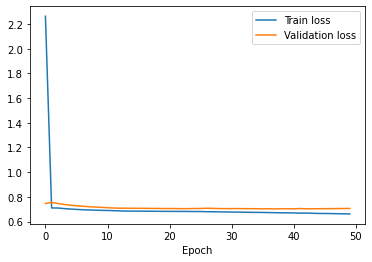

Train loss = 0.6615852316220602
Val loss = 0.7020257711410522


In [ ]:
print("Best hyperparameters:", best_hyperparams)
print()

num_epochs = 50
inputs = [train_data_scalar, train_data_raw]
val_in = [val_data_scalar, val_data_raw]
targets = torch.FloatTensor(train_labels)
val_targets = torch.FloatTensor(val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

model = CombinedScalarAndLSTMFeatureClassifier(best_hyperparams['hidden_dim'],
                                               num_layers=best_hyperparams['L'], 
                                               fc_size=best_hyperparams['fc_dim'])
optimizer = optim.SGD(model.parameters(), lr=best_hyperparams['lr'])
model = model.to(device)

running_train_loss = []
running_val_loss = []
for epoch in range(num_epochs):
  train_loss = 0
  for i in range(num_batches):
    model.zero_grad()
    batch_scalar = inputs[0][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
    batch_raw = inputs[1][:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model((batch_scalar, batch_raw)).squeeze()
    loss = loss_fn(scores, target_batch.squeeze())
    loss.backward()
    optimizer.step()
    train_loss += loss.item() / num_batches
  val_loss = 0
  num_val_batches = val_in[1].shape[1] // batch_size + 1
  with torch.no_grad():
    for i in range(num_val_batches):
      val_batch_scalar = val_in[0][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      val_batch_raw = val_in[1][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      val_target_batch = val_targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      val_scores = model((val_batch_scalar, val_batch_raw)).squeeze()
      loss = loss_fn(val_scores, val_target_batch.squeeze())
      val_loss += loss.item() / num_val_batches
  running_train_loss.append(train_loss)
  running_val_loss.append(val_loss)
  print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
      epoch, train_loss, val_loss))
  print("")

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(running_val_loss, label="Validation loss")
plt.legend()
plt.xlabel("Epoch")
plt.show()

print("Train loss =", min(running_train_loss))
print("Val loss =", min(running_val_loss))

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del model
del inputs
del targets
del val_in
del val_targets

### Statistical scalar features (time and frequency domain) + subsegmenting + LSTM feature extraction

In [ ]:
def get_scalar_features(sample):
  dist_right, dist_left, time = normalized_tapping_distance(sample.data)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  dist_right_amp, _ = distance_amplitude(time, dist_right)
  dist_left_amp, _ = distance_amplitude(time, dist_left)
  right_v_amp, _ = velocity_amplitude(time, right_v)
  left_v_amp, _ = velocity_amplitude(time, left_v)
  right_freq, _, _ = tapping_frequency(time, dist_right)
  left_freq, _, _ = tapping_frequency(time, dist_right)
  right_acc, _ = tap_acceleration(time, right_v)
  left_acc, _ = tap_acceleration(time, left_v)
  _, right_cv = movement_consistency(time, dist_right)
  _, left_cv = movement_consistency(time, dist_left)
  dist_right_spectrum, freq = fourier_transform(time, np.asarray(dist_right))
  dist_left_spectrum, _ = fourier_transform(time, np.asarray(dist_left))
  right_v_spectrum, _ = fourier_transform(time, np.asarray(right_v))
  left_v_spectrum, _ = fourier_transform(time, np.asarray(left_v))
  dist_right_amp_spectrum, _ = fourier_transform(time, np.asarray(dist_right_amp))
  dist_left_amp_spectrum, _ = fourier_transform(time, np.asarray(dist_left_amp))
  right_v_amp_spectrum, _ = fourier_transform(time, np.asarray(right_v_amp))
  left_v_amp_spectrum, _ = fourier_transform(time, np.asarray(left_v_amp))
  left_acc_spectrum, _ = fourier_transform(time, np.asarray(left_acc))
  right_acc_spectrum, _ = fourier_transform(time, np.asarray(right_acc))

  featurized = np.zeros(46)

  featurized[0] = np.nanmean(np.asarray(dist_right))
  featurized[1] = np.nanstd(np.asarray(dist_right))
  featurized[2] = np.nanmean(np.asarray(dist_left))
  featurized[3] = np.nanstd(np.asarray(dist_left))
  featurized[4] = np.nanmean(np.asarray(right_v))
  featurized[5] = np.nanstd(np.asarray(right_v))
  featurized[6] = np.nanmean(np.asarray(left_v))
  featurized[7] = np.nanstd(np.asarray(left_v))
  featurized[8] = np.nanmean(np.asarray(right_acc))
  featurized[9] = np.nanstd(np.asarray(right_acc))
  featurized[10] = np.nanmean(np.asarray(left_acc))
  featurized[11] = np.nanstd(np.asarray(left_acc))
  featurized[12] = np.nanmean(np.asarray(dist_right_amp))
  featurized[13] = np.nanstd(np.asarray(dist_right_amp))
  featurized[14] = np.nanmean(np.asarray(dist_left_amp))
  featurized[15] = np.nanstd(np.asarray(dist_left_amp))
  featurized[16] = np.nanmean(np.asarray(right_v_amp))
  featurized[17] = np.nanstd(np.asarray(right_v_amp))
  featurized[18] = np.nanmean(np.asarray(left_v_amp))
  featurized[19] = np.nanstd(np.asarray(left_v_amp))

  featurized[20] = np.nanmean(np.asarray(dist_right_spectrum))
  featurized[21] = np.nanstd(np.asarray(dist_right_spectrum))
  featurized[22] = np.nanmean(np.asarray(dist_left_spectrum))
  featurized[23] = np.nanstd(np.asarray(dist_left_spectrum))
  featurized[24] = np.nanmean(np.asarray(right_v_spectrum))
  featurized[25] = np.nanstd(np.asarray(right_v_spectrum))
  featurized[26] = np.nanmean(np.asarray(left_v_spectrum))
  featurized[27] = np.nanstd(np.asarray(left_v_spectrum))
  featurized[28] = np.nanmean(np.asarray(right_acc_spectrum))
  featurized[29] = np.nanstd(np.asarray(right_acc_spectrum))
  featurized[30] = np.nanmean(np.asarray(left_acc_spectrum))
  featurized[31] = np.nanstd(np.asarray(left_acc_spectrum))
  featurized[32] = np.nanmean(np.asarray(dist_right_amp_spectrum))
  featurized[33] = np.nanstd(np.asarray(dist_right_amp_spectrum))
  featurized[34] = np.nanmean(np.asarray(dist_left_amp_spectrum))
  featurized[35] = np.nanstd(np.asarray(dist_left_amp_spectrum))
  featurized[36] = np.nanmean(np.asarray(right_v_amp_spectrum))
  featurized[37] = np.nanstd(np.asarray(right_v_amp_spectrum))
  featurized[38] = np.nanmean(np.asarray(left_v_amp_spectrum))
  featurized[39] = np.nanstd(np.asarray(left_v_amp_spectrum))

  featurized[40] = np.nanmean(np.asarray(right_freq))
  featurized[41] = np.nanstd(np.asarray(right_freq))
  featurized[42] = np.nanmean(np.asarray(left_freq))
  featurized[43] = np.nanstd(np.asarray(left_freq))
  featurized[44] = right_cv
  featurized[45] = left_cv

  label = 1 if sample.on_state == "on" else 0

  featurized = torch.FloatTensor(featurized.reshape((1, 46)))
  
  return featurized, label

def scalar_featurize_dataset(dataset):
  featurized_list = []
  labels = []
  for sample in dataset:
    featurized, label = get_scalar_features(sample)
    featurized_list.append(featurized)
    labels.append(label)
  return featurized_list, labels

def raw_data(dataset):
  multivariate_data = []
  times_list = []
  labels = []

  for sample in dataset:
    sample_df = sample.data
    right_thumb_tip_x = np.asarray(sample_df["right_thumb_tip:x"])
    right_thumb_tip_y = np.asarray(sample_df["right_thumb_tip:y"])
    right_index_tip_x = np.asarray(sample_df["right_index_tip:x"])
    right_index_tip_y = np.asarray(sample_df["right_index_tip:y"])
    left_thumb_tip_x = np.asarray(sample_df["left_thumb_tip:x"])
    left_thumb_tip_y = np.asarray(sample_df["left_thumb_tip:y"])
    left_index_tip_x = np.asarray(sample_df["left_index_tip:x"])
    left_index_tip_y = np.asarray(sample_df["left_index_tip:y"])
    time = np.asarray(sample_df["timestamp"])
    time = time - time[0]
    times_list.append(time)
    extracted_data = np.zeros((len(time), 1, 8))
    extracted_data[:, 0, 0] = right_thumb_tip_x
    extracted_data[:, 0, 1] = right_thumb_tip_y
    extracted_data[:, 0, 2] = right_index_tip_x
    extracted_data[:, 0, 3] = right_index_tip_y
    extracted_data[:, 0, 4] = left_thumb_tip_x
    extracted_data[:, 0, 5] = left_thumb_tip_y
    extracted_data[:, 0, 6] = left_index_tip_x
    extracted_data[:, 0, 7] = left_index_tip_y
    multivariate_data.append(extracted_data)
    label = 1 if sample.on_state == "on" else 0
    labels.append(label)
    
  times_concat = np.concatenate(times_list)
  times_union = np.unique(times_concat)

  interped_multivariate_data = []
  seq_len = len(times_union)
  for i, f in enumerate(multivariate_data):
    times_f = times_list[i]
    interped = torch.zeros((seq_len, 1, f.shape[2]))
    for j in range(f.shape[2]):
      feature = f[:, 0, j]
      feature_interped = np.interp(times_union, times_f, feature)
      interped[:, 0, j] = torch.tensor(feature_interped)
    interped_multivariate_data.append(interped)

  return interped_multivariate_data, labels

def raw_data_subseg(dataset):
  multivariate_data = []
  times_list = []
  labels = []

  for sample in dataset:
    sample_df = sample.data
    right_thumb_tip_x = np.asarray(sample_df["right_thumb_tip:x"])
    right_thumb_tip_y = np.asarray(sample_df["right_thumb_tip:y"])
    right_index_tip_x = np.asarray(sample_df["right_index_tip:x"])
    right_index_tip_y = np.asarray(sample_df["right_index_tip:y"])
    left_thumb_tip_x = np.asarray(sample_df["left_thumb_tip:x"])
    left_thumb_tip_y = np.asarray(sample_df["left_thumb_tip:y"])
    left_index_tip_x = np.asarray(sample_df["left_index_tip:x"])
    left_index_tip_y = np.asarray(sample_df["left_index_tip:y"])
    time = np.asarray(sample_df["timestamp"])
    time = time - time[0]
    times_list.append(time)
    extracted_data = np.zeros((len(time), 1, 8))
    extracted_data[:, 0, 0] = right_thumb_tip_x
    extracted_data[:, 0, 1] = right_thumb_tip_y
    extracted_data[:, 0, 2] = right_index_tip_x
    extracted_data[:, 0, 3] = right_index_tip_y
    extracted_data[:, 0, 4] = left_thumb_tip_x
    extracted_data[:, 0, 5] = left_thumb_tip_y
    extracted_data[:, 0, 6] = left_index_tip_x
    extracted_data[:, 0, 7] = left_index_tip_y
    multivariate_data.append(torch.FloatTensor(extracted_data))
    label = 1 if sample.on_state == "on" else 0
    labels.append(label)

  return multivariate_data, labels

In [ ]:
scalar_features, labels = scalar_featurize_dataset(on_data + off_data)
scalar_features_subsegs = [scalar_featurize_dataset(data.subsegs)[0] for data in (on_data + off_data)]
raw_multivariate_data, _ = raw_data(on_data + off_data)
raw_multivariate_data_subsegs = [raw_data_subseg(data.subsegs)[0] for data in (on_data + off_data)]

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:1072: RuntimeWarning: Mean of empty slice.
  return a.std(axis) / a.mean(axis)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning

In [ ]:
n = len(scalar_features)
train_idxs = np.random.choice(range(n), round(0.9 * n), replace=False)
test_idxs = [i for i in range(n) if i not in train_idxs]

train_data_scalar = [scalar_features[i] for i in train_idxs]
train_data_scalar = torch.nan_to_num(torch.cat(train_data_scalar, dim=0))
train_data_scalar_subsegs = [scalar_features_subsegs[i] for i in train_idxs]
train_data_raw = [raw_multivariate_data[i] for i in train_idxs]
train_data_raw = torch.nan_to_num(torch.cat(train_data_raw, dim=1))
train_data_raw_subsegs = [raw_multivariate_data_subsegs[i] for i in train_idxs]
train_labels = [labels[i] for i in train_idxs]
test_data_scalar = [scalar_features[i] for i in test_idxs]
test_data_scalar_subsegs = [scalar_features_subsegs[i] for i in test_idxs]
test_data_raw = [raw_multivariate_data[i] for i in test_idxs]
test_data_raw_subsegs = [raw_multivariate_data_subsegs[i] for i in test_idxs]
test_labels = [labels[i] for i in test_idxs]

In [ ]:
n = len(test_data_scalar)
val_idxs = np.random.choice(range(n), round(0.6 * n), replace=False)
test_idxs = [i for i in range(n) if i not in val_idxs]

val_data_scalar = [test_data_scalar[i] for i in val_idxs]
val_data_scalar = torch.nan_to_num(torch.cat(val_data_scalar, dim=0))
val_data_scalar_subsegs = [scalar_features_subsegs[i] for i in val_idxs]
val_data_raw = [test_data_raw[i] for i in val_idxs]
val_data_raw = torch.nan_to_num(torch.cat(val_data_raw, dim=1))
val_data_raw_subsegs = [raw_multivariate_data_subsegs[i] for i in val_idxs]
val_labels = [test_labels[i] for i in val_idxs]
test_data_scalar = [test_data_scalar[i] for i in test_idxs]
test_data_scalar = torch.nan_to_num(torch.cat(test_data_scalar, dim=0))
test_data_scalar_subsegs = [scalar_features_subsegs[i] for i in test_idxs]
test_data_raw = [test_data_raw[i] for i in test_idxs]
test_data_raw = torch.nan_to_num(torch.cat(test_data_raw, dim=1))
test_data_raw_subsegs = [raw_multivariate_data_subsegs[i] for i in test_idxs]
test_labels = [test_labels[i] for i in test_idxs]

In [ ]:
print(train_data_scalar.size())
print(train_data_raw.size())
print(val_data_scalar.size())
print(val_data_raw.size())
print(test_data_scalar.size())
print(test_data_raw.size())

torch.Size([89, 46])
torch.Size([1945, 89, 8])
torch.Size([6, 46])
torch.Size([1945, 6, 8])
torch.Size([4, 46])
torch.Size([1945, 4, 8])


torch.Size([89, 46])
torch.Size([100, 89, 8])
torch.Size([6, 46])
torch.Size([100, 6, 8])
torch.Size([4, 46])
torch.Size([100, 4, 8])


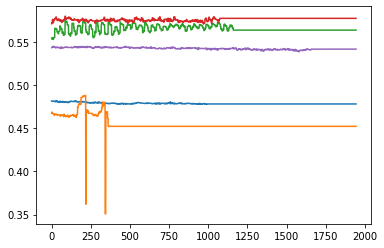

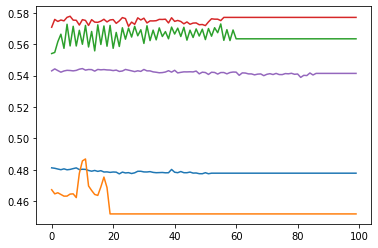

In [ ]:
sampled_idxs = np.linspace(0, train_data_raw.shape[0], 100, endpoint=False, dtype=int)

plt.figure()
for i in range(5):
  plt.plot(train_data_raw[:, i, 0])
plt.figure()
for i in range(5):
  plt.plot(train_data_raw[:, i, 0][sampled_idxs])

train_data_raw = train_data_raw[sampled_idxs]
val_data_raw = val_data_raw[sampled_idxs]
test_data_raw = test_data_raw[sampled_idxs]

print(train_data_scalar.size())
print(train_data_raw.size())
print(val_data_scalar.size())
print(val_data_raw.size())
print(test_data_scalar.size())
print(test_data_raw.size())

In [ ]:
train_data_scalar = (train_data_scalar - 
                     torch.mean(train_data_scalar, dim=0, 
                                keepdim=True)) / torch.std(train_data_scalar, 
                                                           dim=0, keepdim=True)
val_data_scalar = (val_data_scalar - 
                     torch.mean(val_data_scalar, dim=0, 
                                keepdim=True)) / torch.std(val_data_scalar, 
                                                           dim=0, keepdim=True)
test_data_scalar = (test_data_scalar - 
                     torch.mean(test_data_scalar, dim=0, 
                                keepdim=True)) / torch.std(test_data_scalar, 
                                                           dim=0, keepdim=True)
                                
train_data_scalar = torch.nan_to_num(train_data_scalar)
val_data_scalar = torch.nan_to_num(val_data_scalar)
test_data_scalar = torch.nan_to_num(test_data_scalar)

In [ ]:
data = train_data_scalar_subsegs
all_subsegs = [data[i][j] for i in range(len(data)) for j in range(len(data[i]))]
all_subsegs = torch.cat(all_subsegs, dim=0)

for i, d in enumerate(train_data_scalar_subsegs):
  for j, s in enumerate(d):
    if s.shape[0] > 1:
      print(s)
    s = (s - torch.mean(all_subsegs, dim=0, 
                        keepdim=True)) / torch.std(s, dim=0, keepdim=True)
    train_data_scalar_subsegs[i][j] = torch.nan_to_num(s)

data = val_data_scalar_subsegs
all_subsegs = [data[i][j] for i in range(len(data)) for j in range(len(data[i]))]
all_subsegs = torch.cat(all_subsegs, dim=0)

for i, d in enumerate(val_data_scalar_subsegs):
  for j, s in enumerate(d):
    s = (s - torch.mean(all_subsegs, dim=0, 
                        keepdim=True)) / torch.std(all_subsegs, dim=0, keepdim=True)
    val_data_scalar_subsegs[i][j] = torch.nan_to_num(s)

data = test_data_scalar_subsegs
all_subsegs = [data[i][j] for i in range(len(data)) for j in range(len(data[i]))]
all_subsegs = torch.cat(all_subsegs, dim=0)

for i, d in enumerate(test_data_scalar_subsegs):
  for j, s in enumerate(d):
    s = (s - torch.mean(all_subsegs, dim=0, 
                        keepdim=True)) / torch.std(all_subsegs, dim=0, keepdim=True)
    test_data_scalar_subsegs[i][j] = torch.nan_to_num(s)

In [ ]:
train_data_raw = (train_data_raw - 
                     torch.mean(train_data_raw, dim=1, 
                                keepdim=True)) / torch.std(train_data_raw, 
                                                           dim=1, keepdim=True)
minmax = torch.max(
    train_data_raw, dim=0, keepdim=True
    )[0] - torch.min(
        train_data_raw, dim=0, keepdim=True
        )[0]
min_val = torch.min(train_data_raw, dim=0, keepdim=True)[0]
train_data_raw = (train_data_raw - min_val) / minmax

val_data_raw = (val_data_raw - 
                     torch.mean(val_data_raw, dim=1, 
                                keepdim=True)) / torch.std(val_data_raw, 
                                                           dim=1, keepdim=True)
minmax = torch.max(
    val_data_raw, dim=0, keepdim=True
    )[0] - torch.min(
        val_data_raw, dim=0, keepdim=True
        )[0]
min_val = torch.min(val_data_raw, dim=0, keepdim=True)[0]
val_data_raw = (val_data_raw - min_val) / minmax
                                
test_data_raw = (test_data_raw - 
                     torch.mean(test_data_raw, dim=1, 
                                keepdim=True)) / torch.std(test_data_raw, 
                                                           dim=1, keepdim=True)
minmax = torch.max(
    test_data_raw, dim=0, keepdim=True
    )[0] - torch.min(
        test_data_raw, dim=0, keepdim=True
        )[0]
min_val = torch.min(test_data_raw, dim=0, keepdim=True)[0]
test_data_raw = (test_data_raw - min_val) / minmax
                                
train_data_raw = torch.nan_to_num(train_data_raw)
val_data_raw = torch.nan_to_num(val_data_raw)
test_data_raw = torch.nan_to_num(test_data_raw)

In [ ]:
data = train_data_raw_subsegs
all_subsegs = [data[i][j] for i in range(len(data)) for j in range(len(data[i]))]
all_subsegs = torch.cat(all_subsegs, dim=1)

for i, d in enumerate(train_data_raw_subsegs):
  for j, s in enumerate(d):
    s = (s - torch.mean(all_subsegs, dim=1, 
                        keepdim=True)) / torch.std(all_subsegs, dim=1, 
                                                   keepdim=True)
    minmax = torch.max(
        s, dim=0, keepdim=True
        )[0] - torch.min(
            s, dim=0, keepdim=True
            )[0]
    min_val = torch.min(s, dim=0, keepdim=True)[0]
    s = (s - min_val) / minmax
    train_data_raw_subsegs[i][j] = torch.nan_to_num(s)

data = val_data_raw_subsegs
all_subsegs = [data[i][j] for i in range(len(data)) for j in range(len(data[i]))]
all_subsegs = torch.cat(all_subsegs, dim=1)

for i, d in enumerate(val_data_raw_subsegs):
  for j, s in enumerate(d):
    s = (s - torch.mean(all_subsegs, dim=1, 
                        keepdim=True)) / torch.std(all_subsegs, dim=1, 
                                                   keepdim=True)
    minmax = torch.max(
        s, dim=0, keepdim=True
        )[0] - torch.min(
            s, dim=0, keepdim=True
            )[0]
    min_val = torch.min(s, dim=0, keepdim=True)[0]
    s = (s - min_val) / minmax
    val_data_raw_subsegs[i][j] = torch.nan_to_num(s)

data = test_data_raw_subsegs
all_subsegs = [data[i][j] for i in range(len(data)) for j in range(len(data[i]))]
all_subsegs = torch.cat(all_subsegs, dim=1)
                                
for i, d in enumerate(test_data_raw_subsegs):
  for j, s in enumerate(d):
    s = (s - torch.mean(all_subsegs, dim=1, 
                        keepdim=True)) / torch.std(all_subsegs, dim=1, 
                                                   keepdim=True)
    minmax = torch.max(
        s, dim=0, keepdim=True
        )[0] - torch.min(
            s, dim=0, keepdim=True
            )[0]
    min_val = torch.min(s, dim=0, keepdim=True)[0]
    s = (s - min_val) / minmax
    test_data_raw_subsegs[i][j] = torch.nan_to_num(s)

In [ ]:
seq_len = train_data_raw.shape[0]
num_samples = train_data_raw.shape[1]
num_epochs = 20
batch_size = 32
num_batches = num_samples // batch_size + 1

class CombinedScalarAndLSTMFeatureClassifier(nn.Module):

  def __init__(self, hidden_dim=100, num_layers=2, fc_size=100, bidirectional=True):
    super(CombinedScalarAndLSTMFeatureClassifier, self).__init__()
    self.lstm1 = nn.LSTM(8, hidden_dim)
    self.lstm2 = nn.LSTM(8, hidden_dim)
    self.linear1 = nn.Linear(hidden_dim + 46, fc_size)
    self.linear2 = nn.Linear(hidden_dim + 46, fc_size)
    self.linear3 = nn.Linear(2 * fc_size, fc_size)
    self.linear4 = nn.Linear(fc_size, 1)
    self.relu = nn.ReLU()
    self.sigmoid = nn.Sigmoid()
    self.scalar_embeddings = nn.Embedding(10, 1)
    self.raw_embeddings = nn.Embedding(10, 100)

  def forward(self, x):
    x_scalar = x[0]
    x_raw = x[1]
    x_scalar_subsegs = x[2]
    x_raw_subsegs = x[3]

    for i, sample in enumerate(x_scalar_subsegs):
      num_subsegs = len(sample)
      if num_subsegs == 0:
        x_scalar_subsegs[i] = torch.zeros(1, 46).to(device)
        continue
      embeddings = self.scalar_embeddings(torch.arange(num_subsegs).to(device))
      x_scalar_subsegs[i] = sum(
          [embeddings[j] * torch.nan_to_num(sample[j]) for j in range(num_subsegs)])
    x_scalar_subsegs = torch.cat(x_scalar_subsegs, dim=0)

    for i, sample in enumerate(x_raw_subsegs):
      num_subsegs = len(sample)
      if num_subsegs == 0:
        x_raw_subsegs[i] = torch.zeros(100, 1, 8).to(device)
        continue
      embeddings = self.raw_embeddings(torch.arange(num_subsegs).to(device))
      x_raw_subsegs[i] = sum(
          [embeddings[j].unsqueeze(1).unsqueeze(2).expand(100, 1, 8) * torch.nan_to_num(sample[j]) 
          for j in range(num_subsegs)])
    x_raw_subsegs = torch.cat(x_raw_subsegs, dim=1)


    a1, hidden = self.lstm1(x_raw)
    a1 = self.relu(self.linear1(torch.cat([a1[-1, :, :], x_scalar], dim=-1)))
    
    a2, hidden = self.lstm2(x_raw_subsegs)
    a2 = self.relu(self.linear2(torch.cat([a2[-1, :, :], x_scalar_subsegs], dim=-1)))

    out = self.relu(self.linear3(torch.cat([a1, a2], dim=-1)))
    out = self.relu(self.linear4(out))

    out = self.sigmoid(out)

    return out

loss_fn = nn.BCELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
# seed = 123
# random.seed(seed)
# np.random.seed(seed)
# torch.manual_seed(seed)
# torch.cuda.manual_seed(seed)

inputs = [train_data_scalar, train_data_raw, 
          train_data_scalar_subsegs, train_data_raw_subsegs]
val_in = [val_data_scalar, val_data_raw, 
          val_data_scalar_subsegs, val_data_raw_subsegs]
targets = torch.FloatTensor(train_labels)
val_targets = torch.FloatTensor(val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

for i in [2, 3]:
  for j in range(len(inputs[i])):
    for k in range(len(inputs[i][j])):
      inputs[i][j][k] = inputs[i][j][k].to(device)
  for j in range(len(val_in[i])):
    for k in range(len(val_in[i][j])):
      val_in[i][j][k] = val_in[i][j][k].to(device)

best_hyperparams = {}
best_val_loss = np.inf

# for i in range(20):
for i in range(1):
  L = np.random.choice([2, 3, 5])
  fc_dim = np.random.choice([50, 100, 200])
  lr = np.random.choice([1e-1, 1e-2, 1e-3])
  hidden_dim = np.random.choice([50, 100, 200])
  L = 5
  fc_dim = 200
  lr = 0.1
  hidden_dim = 200

  curr_hyperparams = {"L": L, "lr": lr, "fc_dim": fc_dim, 
                      "hidden_dim": hidden_dim}

  model = CombinedScalarAndLSTMFeatureClassifier(hidden_dim, num_layers=L, fc_size=fc_dim)
  model = model.to(device)
  optimizer = optim.SGD(model.parameters(), lr=lr)

  running_train_loss = []
  running_val_loss = []
  # for epoch in range(num_epochs):
  for epoch in range(5):
    train_loss = 0
    for i in range(num_batches):
      model.zero_grad()
      model.train()
      batch_scalar = inputs[0][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      batch_raw = inputs[1][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      batch_scalar_subsegs = inputs[2][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      batch_raw_subsegs = inputs[3][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      target_batch = targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      scores = model((batch_scalar, batch_raw, batch_scalar_subsegs, batch_raw_subsegs)).squeeze()
      loss = loss_fn(scores, target_batch.squeeze())
      print(scores)
      print(target_batch.squeeze())
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      for i, param in enumerate(model.parameters()):
        print("Param {} grad: {}".format(i, param.grad.data.sum()))
      train_loss += loss.item() / num_batches
    val_loss = 0
    num_val_batches = val_in[1].shape[1] // batch_size + 1
    with torch.no_grad():
      for i in range(num_val_batches):
        val_batch_scalar = val_in[0][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
        val_batch_raw = val_in[1][:, i * batch_size : min(num_samples, 
                                            i * batch_size + batch_size), :]
        val_batch_scalar_subsegs = val_in[2][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
        val_batch_raw_subsegs = val_in[3][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
        val_target_batch = val_targets[i * batch_size : min(num_samples, 
                                            i * batch_size + batch_size)]
        val_scores = model((val_batch_scalar, val_batch_raw, 
                            val_batch_scalar_subsegs, val_batch_raw_subsegs)).squeeze()
        loss = loss_fn(val_scores, val_target_batch.squeeze())
        val_loss += loss.item() / num_val_batches
    running_train_loss.append(train_loss)
    running_val_loss.append(val_loss)
  if min(running_val_loss) < best_val_loss:
    best_val_loss = min(running_val_loss)
    best_hyperparams = curr_hyperparams

  print(curr_hyperparams)
  print("Train loss:", min(running_train_loss))
  print("Val loss:", min(running_val_loss))
  print()

  gc.collect()
  torch.cuda.empty_cache()
  del model

In [ ]:
del inputs
del val_in

Best hyperparameters: {'L': 5, 'lr': 0.1, 'fc_dim': 200, 'hidden_dim': 200}

tensor([0.5000, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000,
        0.5000, 0.5000, 0.5000, 0.5035, 0.5013, 0.5053, 0.5000, 0.5000, 0.5018,
        0.5023, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000,
        0.5000, 0.5000, 0.5019, 0.5000, 0.5120], device='cuda:0',
       grad_fn=<SqueezeBackward0>)
tensor([0., 1., 0., 1., 0., 0., 0., 0., 1., 0., 0., 1., 1., 1., 0., 1., 0., 1.,
        1., 1., 0., 1., 1., 1., 1., 0., 0., 1., 0., 0., 1., 1.],
       device='cuda:0')
tensor([0.5068, 0.5018, 0.5005, 0.5000, 0.5000, 0.5046, 0.5000, 0.5000, 0.5000,
        0.5039, 0.5042, 0.5000, 0.5028, 0.5065, 0.5000, 0.5000, 0.5000, 0.5022,
        0.5000, 0.5118, 0.5000, 0.5000, 0.5000, 0.5018, 0.5000, 0.5000, 0.5000,
        0.5015, 0.5000, 0.5008, 0.5000, 0.5000], device='cuda:0',
       grad_fn=<SqueezeBackward0>)
tensor([1., 0., 1., 0., 0., 1., 0., 0., 1., 0., 1., 0., 0., 1., 0., 1., 

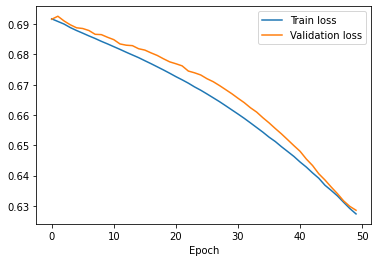

Train loss = 0.6273128191630045
Val loss = 0.6285208463668823


In [ ]:
print("Best hyperparameters:", best_hyperparams)
print()

num_epochs = 50
inputs = [train_data_scalar, train_data_raw, 
          train_data_scalar_subsegs, train_data_raw_subsegs]
val_in = [val_data_scalar, val_data_raw, 
          val_data_scalar_subsegs, val_data_raw_subsegs]
targets = torch.FloatTensor(train_labels)
val_targets = torch.FloatTensor(val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

for i in [2, 3]:
  for j in range(len(inputs[i])):
    for k in range(len(inputs[i][j])):
      inputs[i][j][k] = inputs[i][j][k].to(device)
  for j in range(len(val_in[i])):
    for k in range(len(val_in[i][j])):
      val_in[i][j][k] = val_in[i][j][k].to(device)

model = CombinedScalarAndLSTMFeatureClassifier(best_hyperparams['hidden_dim'],
                                               num_layers=best_hyperparams['L'], 
                                               fc_size=best_hyperparams['fc_dim'])
optimizer = optim.SGD(model.parameters(), lr=best_hyperparams['lr'])
model = model.to(device)

running_train_loss = []
running_val_loss = []
for epoch in range(num_epochs):
  train_loss = 0
  for i in range(num_batches):
    model.zero_grad()
    model.train()
    batch_scalar = inputs[0][i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    batch_raw = inputs[1][:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    batch_scalar_subsegs = inputs[2][i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    batch_raw_subsegs = inputs[3][i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model((batch_scalar, batch_raw, batch_scalar_subsegs, batch_raw_subsegs)).squeeze()
    loss = loss_fn(scores, target_batch.squeeze())
    print(scores)
    print(target_batch.squeeze())
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    # for param in model.parameters():
    #   print("After:", param.grad.data.sum())
    train_loss += loss.item() / num_batches
  val_loss = 0
  num_val_batches = val_in[1].shape[1] // batch_size + 1
  with torch.no_grad():
    for i in range(num_val_batches):
      val_batch_scalar = val_in[0][i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
      val_batch_raw = val_in[1][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      val_batch_scalar_subsegs = val_in[2][i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
      val_batch_raw_subsegs = val_in[3][i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
      val_target_batch = val_targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      val_scores = model((val_batch_scalar, val_batch_raw, 
                          val_batch_scalar_subsegs, val_batch_raw_subsegs)).squeeze()
      loss = loss_fn(val_scores, val_target_batch.squeeze())
      val_loss += loss.item() / num_val_batches
  running_train_loss.append(train_loss)
  running_val_loss.append(val_loss)
  print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
      epoch, train_loss, val_loss))
  print("")

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(running_val_loss, label="Validation loss")
plt.legend()
plt.xlabel("Epoch")
plt.show()

print("Train loss =", min(running_train_loss))
print("Val loss =", min(running_val_loss))

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del model
del inputs
del targets
del val_in
del val_targets

### Statistical scalar features (time and frequency domain) + subsegmenting + transformer feature extraction

In [ ]:
def get_scalar_features(sample):
  dist_right, dist_left, time = normalized_tapping_distance(sample.data)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  dist_right_amp, _ = distance_amplitude(time, dist_right)
  dist_left_amp, _ = distance_amplitude(time, dist_left)
  right_v_amp, _ = velocity_amplitude(time, right_v)
  left_v_amp, _ = velocity_amplitude(time, left_v)
  right_freq, _, _ = tapping_frequency(time, dist_right)
  left_freq, _, _ = tapping_frequency(time, dist_right)
  right_acc, _ = tap_acceleration(time, right_v)
  left_acc, _ = tap_acceleration(time, left_v)
  _, right_cv = movement_consistency(time, dist_right)
  _, left_cv = movement_consistency(time, dist_left)
  dist_right_spectrum, freq = fourier_transform(time, np.asarray(dist_right))
  dist_left_spectrum, _ = fourier_transform(time, np.asarray(dist_left))
  right_v_spectrum, _ = fourier_transform(time, np.asarray(right_v))
  left_v_spectrum, _ = fourier_transform(time, np.asarray(left_v))
  dist_right_amp_spectrum, _ = fourier_transform(time, np.asarray(dist_right_amp))
  dist_left_amp_spectrum, _ = fourier_transform(time, np.asarray(dist_left_amp))
  right_v_amp_spectrum, _ = fourier_transform(time, np.asarray(right_v_amp))
  left_v_amp_spectrum, _ = fourier_transform(time, np.asarray(left_v_amp))
  left_acc_spectrum, _ = fourier_transform(time, np.asarray(left_acc))
  right_acc_spectrum, _ = fourier_transform(time, np.asarray(right_acc))

  featurized = np.zeros(46)

  featurized[0] = np.nanmean(np.asarray(dist_right))
  featurized[1] = np.nanstd(np.asarray(dist_right))
  featurized[2] = np.nanmean(np.asarray(dist_left))
  featurized[3] = np.nanstd(np.asarray(dist_left))
  featurized[4] = np.nanmean(np.asarray(right_v))
  featurized[5] = np.nanstd(np.asarray(right_v))
  featurized[6] = np.nanmean(np.asarray(left_v))
  featurized[7] = np.nanstd(np.asarray(left_v))
  featurized[8] = np.nanmean(np.asarray(right_acc))
  featurized[9] = np.nanstd(np.asarray(right_acc))
  featurized[10] = np.nanmean(np.asarray(left_acc))
  featurized[11] = np.nanstd(np.asarray(left_acc))
  featurized[12] = np.nanmean(np.asarray(dist_right_amp))
  featurized[13] = np.nanstd(np.asarray(dist_right_amp))
  featurized[14] = np.nanmean(np.asarray(dist_left_amp))
  featurized[15] = np.nanstd(np.asarray(dist_left_amp))
  featurized[16] = np.nanmean(np.asarray(right_v_amp))
  featurized[17] = np.nanstd(np.asarray(right_v_amp))
  featurized[18] = np.nanmean(np.asarray(left_v_amp))
  featurized[19] = np.nanstd(np.asarray(left_v_amp))

  featurized[20] = np.nanmean(np.asarray(dist_right_spectrum))
  featurized[21] = np.nanstd(np.asarray(dist_right_spectrum))
  featurized[22] = np.nanmean(np.asarray(dist_left_spectrum))
  featurized[23] = np.nanstd(np.asarray(dist_left_spectrum))
  featurized[24] = np.nanmean(np.asarray(right_v_spectrum))
  featurized[25] = np.nanstd(np.asarray(right_v_spectrum))
  featurized[26] = np.nanmean(np.asarray(left_v_spectrum))
  featurized[27] = np.nanstd(np.asarray(left_v_spectrum))
  featurized[28] = np.nanmean(np.asarray(right_acc_spectrum))
  featurized[29] = np.nanstd(np.asarray(right_acc_spectrum))
  featurized[30] = np.nanmean(np.asarray(left_acc_spectrum))
  featurized[31] = np.nanstd(np.asarray(left_acc_spectrum))
  featurized[32] = np.nanmean(np.asarray(dist_right_amp_spectrum))
  featurized[33] = np.nanstd(np.asarray(dist_right_amp_spectrum))
  featurized[34] = np.nanmean(np.asarray(dist_left_amp_spectrum))
  featurized[35] = np.nanstd(np.asarray(dist_left_amp_spectrum))
  featurized[36] = np.nanmean(np.asarray(right_v_amp_spectrum))
  featurized[37] = np.nanstd(np.asarray(right_v_amp_spectrum))
  featurized[38] = np.nanmean(np.asarray(left_v_amp_spectrum))
  featurized[39] = np.nanstd(np.asarray(left_v_amp_spectrum))

  featurized[40] = np.nanmean(np.asarray(right_freq))
  featurized[41] = np.nanstd(np.asarray(right_freq))
  featurized[42] = np.nanmean(np.asarray(left_freq))
  featurized[43] = np.nanstd(np.asarray(left_freq))
  featurized[44] = right_cv
  featurized[45] = left_cv

  label = 1 if sample.on_state == "on" else 0

  featurized = torch.FloatTensor(featurized.reshape((1, 46)))
  
  return featurized, label

def scalar_featurize_dataset(dataset):
  featurized_list = []
  labels = []
  for sample in dataset:
    featurized, label = get_scalar_features(sample)
    featurized_list.append(featurized)
    labels.append(label)
  return featurized_list, labels

def raw_data(dataset):
  multivariate_data = []
  times_list = []
  labels = []

  for sample in dataset:
    sample_df = sample.data
    right_thumb_tip_x = np.asarray(sample_df["right_thumb_tip:x"])
    right_thumb_tip_y = np.asarray(sample_df["right_thumb_tip:y"])
    right_index_tip_x = np.asarray(sample_df["right_index_tip:x"])
    right_index_tip_y = np.asarray(sample_df["right_index_tip:y"])
    left_thumb_tip_x = np.asarray(sample_df["left_thumb_tip:x"])
    left_thumb_tip_y = np.asarray(sample_df["left_thumb_tip:y"])
    left_index_tip_x = np.asarray(sample_df["left_index_tip:x"])
    left_index_tip_y = np.asarray(sample_df["left_index_tip:y"])
    time = np.asarray(sample_df["timestamp"])
    time = time - time[0]
    times_list.append(time)
    extracted_data = np.zeros((len(time), 1, 8))
    extracted_data[:, 0, 0] = right_thumb_tip_x
    extracted_data[:, 0, 1] = right_thumb_tip_y
    extracted_data[:, 0, 2] = right_index_tip_x
    extracted_data[:, 0, 3] = right_index_tip_y
    extracted_data[:, 0, 4] = left_thumb_tip_x
    extracted_data[:, 0, 5] = left_thumb_tip_y
    extracted_data[:, 0, 6] = left_index_tip_x
    extracted_data[:, 0, 7] = left_index_tip_y
    multivariate_data.append(extracted_data)
    label = 1 if sample.on_state == "on" else 0
    labels.append(label)
    
  times_concat = np.concatenate(times_list)
  times_union = np.unique(times_concat)

  interped_multivariate_data = []
  seq_len = len(times_union)
  for i, f in enumerate(multivariate_data):
    times_f = times_list[i]
    interped = torch.zeros((seq_len, 1, f.shape[2]))
    for j in range(f.shape[2]):
      feature = f[:, 0, j]
      feature_interped = np.interp(times_union, times_f, feature)
      interped[:, 0, j] = torch.tensor(feature_interped)
    interped_multivariate_data.append(interped)

  return interped_multivariate_data, labels

def raw_data_subseg(dataset):
  multivariate_data = []
  times_list = []
  labels = []

  for sample in dataset:
    sample_df = sample.data
    right_thumb_tip_x = np.asarray(sample_df["right_thumb_tip:x"])
    right_thumb_tip_y = np.asarray(sample_df["right_thumb_tip:y"])
    right_index_tip_x = np.asarray(sample_df["right_index_tip:x"])
    right_index_tip_y = np.asarray(sample_df["right_index_tip:y"])
    left_thumb_tip_x = np.asarray(sample_df["left_thumb_tip:x"])
    left_thumb_tip_y = np.asarray(sample_df["left_thumb_tip:y"])
    left_index_tip_x = np.asarray(sample_df["left_index_tip:x"])
    left_index_tip_y = np.asarray(sample_df["left_index_tip:y"])
    time = np.asarray(sample_df["timestamp"])
    time = time - time[0]
    times_list.append(time)
    extracted_data = np.zeros((len(time), 1, 8))
    extracted_data[:, 0, 0] = right_thumb_tip_x
    extracted_data[:, 0, 1] = right_thumb_tip_y
    extracted_data[:, 0, 2] = right_index_tip_x
    extracted_data[:, 0, 3] = right_index_tip_y
    extracted_data[:, 0, 4] = left_thumb_tip_x
    extracted_data[:, 0, 5] = left_thumb_tip_y
    extracted_data[:, 0, 6] = left_index_tip_x
    extracted_data[:, 0, 7] = left_index_tip_y
    multivariate_data.append(torch.FloatTensor(extracted_data))
    label = 1 if sample.on_state == "on" else 0
    labels.append(label)

  return multivariate_data, labels

In [ ]:
scalar_features, labels = scalar_featurize_dataset(on_data + off_data)
scalar_features_subsegs = [scalar_featurize_dataset(data.subsegs)[0] for data in (on_data + off_data)]
raw_multivariate_data, _ = raw_data(on_data + off_data)
raw_multivariate_data_subsegs = [raw_data_subseg(data.subsegs)[0] for data in (on_data + off_data)]

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:1072: RuntimeWarning: Mean of empty slice.
  return a.std(axis) / a.mean(axis)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning

In [ ]:
n = len(scalar_features)
train_idxs = np.random.choice(range(n), round(0.9 * n), replace=False)
test_idxs = [i for i in range(n) if i not in train_idxs]

train_data_scalar = [scalar_features[i] for i in train_idxs]
train_data_scalar = torch.nan_to_num(torch.cat(train_data_scalar, dim=0))
train_data_scalar_subsegs = [scalar_features_subsegs[i] for i in train_idxs]
train_data_raw = [raw_multivariate_data[i] for i in train_idxs]
train_data_raw = torch.nan_to_num(torch.cat(train_data_raw, dim=1))
train_data_raw_subsegs = [raw_multivariate_data_subsegs[i] for i in train_idxs]
train_labels = [labels[i] for i in train_idxs]
test_data_scalar = [scalar_features[i] for i in test_idxs]
test_data_scalar_subsegs = [scalar_features_subsegs[i] for i in test_idxs]
test_data_raw = [raw_multivariate_data[i] for i in test_idxs]
test_data_raw_subsegs = [raw_multivariate_data_subsegs[i] for i in test_idxs]
test_labels = [labels[i] for i in test_idxs]

In [ ]:
n = len(test_data_scalar)
val_idxs = np.random.choice(range(n), round(0.6 * n), replace=False)
test_idxs = [i for i in range(n) if i not in val_idxs]

val_data_scalar = [test_data_scalar[i] for i in val_idxs]
val_data_scalar = torch.nan_to_num(torch.cat(val_data_scalar, dim=0))
val_data_scalar_subsegs = [scalar_features_subsegs[i] for i in val_idxs]
val_data_raw = [test_data_raw[i] for i in val_idxs]
val_data_raw = torch.nan_to_num(torch.cat(val_data_raw, dim=1))
val_data_raw_subsegs = [raw_multivariate_data_subsegs[i] for i in val_idxs]
val_labels = [test_labels[i] for i in val_idxs]
test_data_scalar = [test_data_scalar[i] for i in test_idxs]
test_data_scalar = torch.nan_to_num(torch.cat(test_data_scalar, dim=0))
test_data_scalar_subsegs = [scalar_features_subsegs[i] for i in test_idxs]
test_data_raw = [test_data_raw[i] for i in test_idxs]
test_data_raw = torch.nan_to_num(torch.cat(test_data_raw, dim=1))
test_data_raw_subsegs = [raw_multivariate_data_subsegs[i] for i in test_idxs]
test_labels = [test_labels[i] for i in test_idxs]

In [ ]:
print(train_data_scalar.size())
print(train_data_raw.size())
print(val_data_scalar.size())
print(val_data_raw.size())
print(test_data_scalar.size())
print(test_data_raw.size())

torch.Size([89, 46])
torch.Size([1945, 89, 8])
torch.Size([6, 46])
torch.Size([1945, 6, 8])
torch.Size([4, 46])
torch.Size([1945, 4, 8])


torch.Size([89, 46])
torch.Size([100, 89, 8])
torch.Size([6, 46])
torch.Size([100, 6, 8])
torch.Size([4, 46])
torch.Size([100, 4, 8])


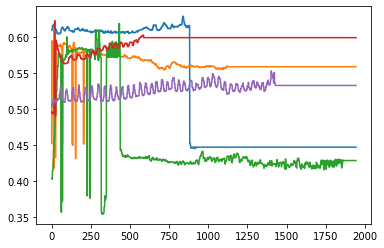

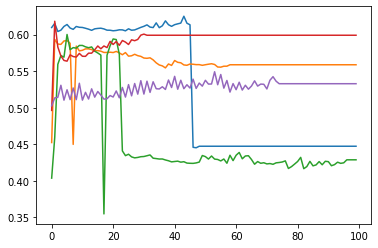

In [ ]:
sampled_idxs = np.linspace(0, train_data_raw.shape[0], 100, endpoint=False, dtype=int)

plt.figure()
for i in range(5):
  plt.plot(train_data_raw[:, i, 0])
plt.figure()
for i in range(5):
  plt.plot(train_data_raw[:, i, 0][sampled_idxs])

train_data_raw = train_data_raw[sampled_idxs]
val_data_raw = val_data_raw[sampled_idxs]
test_data_raw = test_data_raw[sampled_idxs]

print(train_data_scalar.size())
print(train_data_raw.size())
print(val_data_scalar.size())
print(val_data_raw.size())
print(test_data_scalar.size())
print(test_data_raw.size())

In [ ]:
train_data_scalar = (train_data_scalar - 
                     torch.mean(train_data_scalar, dim=0, 
                                keepdim=True)) / torch.std(train_data_scalar, 
                                                           dim=0, keepdim=True)
val_data_scalar = (val_data_scalar - 
                     torch.mean(val_data_scalar, dim=0, 
                                keepdim=True)) / torch.std(val_data_scalar, 
                                                           dim=0, keepdim=True)
test_data_scalar = (test_data_scalar - 
                     torch.mean(test_data_scalar, dim=0, 
                                keepdim=True)) / torch.std(test_data_scalar, 
                                                           dim=0, keepdim=True)
                                
train_data_scalar = torch.nan_to_num(train_data_scalar)
val_data_scalar = torch.nan_to_num(val_data_scalar)
test_data_scalar = torch.nan_to_num(test_data_scalar)

In [ ]:
data = train_data_scalar_subsegs
all_subsegs = [data[i][j] for i in range(len(data)) for j in range(len(data[i]))]
all_subsegs = torch.cat(all_subsegs, dim=0)

for i, d in enumerate(train_data_scalar_subsegs):
  for j, s in enumerate(d):
    if s.shape[0] > 1:
      print(s)
    s = (s - torch.mean(all_subsegs, dim=0, 
                        keepdim=True)) / torch.std(s, dim=0, keepdim=True)
    train_data_scalar_subsegs[i][j] = torch.nan_to_num(s)

data = val_data_scalar_subsegs
all_subsegs = [data[i][j] for i in range(len(data)) for j in range(len(data[i]))]
all_subsegs = torch.cat(all_subsegs, dim=0)

for i, d in enumerate(val_data_scalar_subsegs):
  for j, s in enumerate(d):
    s = (s - torch.mean(all_subsegs, dim=0, 
                        keepdim=True)) / torch.std(all_subsegs, dim=0, keepdim=True)
    val_data_scalar_subsegs[i][j] = torch.nan_to_num(s)

data = test_data_scalar_subsegs
all_subsegs = [data[i][j] for i in range(len(data)) for j in range(len(data[i]))]
all_subsegs = torch.cat(all_subsegs, dim=0)

for i, d in enumerate(test_data_scalar_subsegs):
  for j, s in enumerate(d):
    s = (s - torch.mean(all_subsegs, dim=0, 
                        keepdim=True)) / torch.std(all_subsegs, dim=0, keepdim=True)
    test_data_scalar_subsegs[i][j] = torch.nan_to_num(s)

In [ ]:
train_data_raw = (train_data_raw - 
                     torch.mean(train_data_raw, dim=1, 
                                keepdim=True)) / torch.std(train_data_raw, 
                                                           dim=1, keepdim=True)
minmax = torch.max(
    train_data_raw, dim=0, keepdim=True
    )[0] - torch.min(
        train_data_raw, dim=0, keepdim=True
        )[0]
min_val = torch.min(train_data_raw, dim=0, keepdim=True)[0]
train_data_raw = (train_data_raw - min_val) / minmax

val_data_raw = (val_data_raw - 
                     torch.mean(val_data_raw, dim=1, 
                                keepdim=True)) / torch.std(val_data_raw, 
                                                           dim=1, keepdim=True)
minmax = torch.max(
    val_data_raw, dim=0, keepdim=True
    )[0] - torch.min(
        val_data_raw, dim=0, keepdim=True
        )[0]
min_val = torch.min(val_data_raw, dim=0, keepdim=True)[0]
val_data_raw = (val_data_raw - min_val) / minmax
                                
test_data_raw = (test_data_raw - 
                     torch.mean(test_data_raw, dim=1, 
                                keepdim=True)) / torch.std(test_data_raw, 
                                                           dim=1, keepdim=True)
minmax = torch.max(
    test_data_raw, dim=0, keepdim=True
    )[0] - torch.min(
        test_data_raw, dim=0, keepdim=True
        )[0]
min_val = torch.min(test_data_raw, dim=0, keepdim=True)[0]
test_data_raw = (test_data_raw - min_val) / minmax
                                
train_data_raw = torch.nan_to_num(train_data_raw)
val_data_raw = torch.nan_to_num(val_data_raw)
test_data_raw = torch.nan_to_num(test_data_raw)

In [ ]:
data = train_data_raw_subsegs
all_subsegs = [data[i][j] for i in range(len(data)) for j in range(len(data[i]))]
all_subsegs = torch.cat(all_subsegs, dim=1)

for i, d in enumerate(train_data_raw_subsegs):
  for j, s in enumerate(d):
    s = (s - torch.mean(all_subsegs, dim=1, 
                        keepdim=True)) / torch.std(all_subsegs, dim=1, 
                                                   keepdim=True)
    minmax = torch.max(
        s, dim=0, keepdim=True
        )[0] - torch.min(
            s, dim=0, keepdim=True
            )[0]
    min_val = torch.min(s, dim=0, keepdim=True)[0]
    s = (s - min_val) / minmax
    train_data_raw_subsegs[i][j] = torch.nan_to_num(s)

data = val_data_raw_subsegs
all_subsegs = [data[i][j] for i in range(len(data)) for j in range(len(data[i]))]
all_subsegs = torch.cat(all_subsegs, dim=1)

for i, d in enumerate(val_data_raw_subsegs):
  for j, s in enumerate(d):
    s = (s - torch.mean(all_subsegs, dim=1, 
                        keepdim=True)) / torch.std(all_subsegs, dim=1, 
                                                   keepdim=True)
    minmax = torch.max(
        s, dim=0, keepdim=True
        )[0] - torch.min(
            s, dim=0, keepdim=True
            )[0]
    min_val = torch.min(s, dim=0, keepdim=True)[0]
    s = (s - min_val) / minmax
    val_data_raw_subsegs[i][j] = torch.nan_to_num(s)

data = test_data_raw_subsegs
all_subsegs = [data[i][j] for i in range(len(data)) for j in range(len(data[i]))]
all_subsegs = torch.cat(all_subsegs, dim=1)
                                
for i, d in enumerate(test_data_raw_subsegs):
  for j, s in enumerate(d):
    s = (s - torch.mean(all_subsegs, dim=1, 
                        keepdim=True)) / torch.std(all_subsegs, dim=1, 
                                                   keepdim=True)
    minmax = torch.max(
        s, dim=0, keepdim=True
        )[0] - torch.min(
            s, dim=0, keepdim=True
            )[0]
    min_val = torch.min(s, dim=0, keepdim=True)[0]
    s = (s - min_val) / minmax
    test_data_raw_subsegs[i][j] = torch.nan_to_num(s)

In [ ]:
seq_len = train_data_raw.shape[0]
num_samples = train_data_raw.shape[1]
num_epochs = 20
batch_size = 32
num_batches = num_samples // batch_size + 1

class CombinedScalarAndTransformerFeatureClassifier(nn.Module):

  def __init__(self, num_layers=3, fc_size=10):
    super(CombinedScalarAndTransformerFeatureClassifier, self).__init__()
    self.encoder_layer1 = nn.TransformerEncoderLayer(d_model=8, nhead=8)
    self.transformer_encoder1 = nn.TransformerEncoder(self.encoder_layer1, 
                                                     num_layers=num_layers)
    self.encoder_layer2 = nn.TransformerEncoderLayer(d_model=8, nhead=8)
    self.transformer_encoder2 = nn.TransformerEncoder(self.encoder_layer2, 
                                                     num_layers=num_layers)   
    self.linear1 = nn.Linear(8 + 46, fc_size)
    self.linear2 = nn.Linear(8 + 46, fc_size)
    self.relu = nn.ReLU()
    self.linear3 = nn.Linear(2 * fc_size, fc_size)
    self.linear4 = nn.Linear(fc_size, 1)
    self.sigmoid = nn.Sigmoid()
    self.scalar_embeddings = nn.Embedding(10, 1)
    self.raw_embeddings = nn.Embedding(10, 100)

  def forward(self, x):
    x_scalar = x[0]
    x_raw = x[1]
    x_scalar_subsegs = x[2]
    x_raw_subsegs = x[3]

    for i, sample in enumerate(x_scalar_subsegs):
      num_subsegs = len(sample)
      if num_subsegs == 0:
        x_scalar_subsegs[i] = torch.zeros(1, 46).to(device)
        continue
      embeddings = self.scalar_embeddings(torch.arange(num_subsegs).to(device))
      x_scalar_subsegs[i] = sum(
          [embeddings[j] * torch.nan_to_num(sample[j]) for j in range(num_subsegs)])
    x_scalar_subsegs = torch.cat(x_scalar_subsegs, dim=0)

    for i, sample in enumerate(x_raw_subsegs):
      num_subsegs = len(sample)
      if num_subsegs == 0:
        x_raw_subsegs[i] = torch.zeros(100, 1, 8).to(device)
        continue
      embeddings = self.raw_embeddings(torch.arange(num_subsegs).to(device))
      x_raw_subsegs[i] = sum(
          [embeddings[j].unsqueeze(1).unsqueeze(2).expand(100, 1, 8) * torch.nan_to_num(sample[j]) 
          for j in range(num_subsegs)])
    x_raw_subsegs = torch.cat(x_raw_subsegs, dim=1)

    h = self.transformer_encoder1(x_raw)
    h = h.mean(dim=0)
    a1 = self.relu(self.linear1(torch.cat([h, x_scalar], dim=-1)))

    h = self.transformer_encoder2(x_raw_subsegs)
    h = h.mean(dim=0)
    a2 = self.relu(self.linear2(torch.cat([h, x_scalar_subsegs], dim=-1)))

    out = self.relu(self.linear3(torch.cat([a1, a2], dim=-1)))
    out = self.relu(self.linear4(out))

    out = self.sigmoid(out)
    return out

loss_fn = nn.BCELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
# seed = 123
# random.seed(seed)
# np.random.seed(seed)
# torch.manual_seed(seed)
# torch.cuda.manual_seed(seed)

inputs = [train_data_scalar, train_data_raw, 
          train_data_scalar_subsegs, train_data_raw_subsegs]
val_in = [val_data_scalar, val_data_raw, 
          val_data_scalar_subsegs, val_data_raw_subsegs]
targets = torch.FloatTensor(train_labels)
val_targets = torch.FloatTensor(val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

for i in [2, 3]:
  for j in range(len(inputs[i])):
    for k in range(len(inputs[i][j])):
      inputs[i][j][k] = inputs[i][j][k].to(device)
  for j in range(len(val_in[i])):
    for k in range(len(val_in[i][j])):
      val_in[i][j][k] = val_in[i][j][k].to(device)

best_hyperparams = {}
best_val_loss = np.inf

for i in range(20):
  L = np.random.choice([2, 3, 5])
  fc_dim = np.random.choice([50, 100, 200])
  lr = np.random.choice([1e-1, 1e-2, 1e-3])
  # L = 5
  # fc_dim = 200
  # lr = 0.1
  # hidden_dim = 200

  curr_hyperparams = {"L": L, "lr": lr, "fc_dim": fc_dim}

  model = CombinedScalarAndTransformerFeatureClassifier(num_layers=L, fc_size=fc_dim)
  model = model.to(device)
  optimizer = optim.SGD(model.parameters(), lr=lr)

  running_train_loss = []
  running_val_loss = []
  for epoch in range(num_epochs):
    train_loss = 0
    for i in range(num_batches):
      model.zero_grad()
      model.train()
      batch_scalar = inputs[0][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      batch_raw = inputs[1][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      batch_scalar_subsegs = inputs[2][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      batch_raw_subsegs = inputs[3][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      target_batch = targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      scores = model((batch_scalar, batch_raw, batch_scalar_subsegs, batch_raw_subsegs)).squeeze()
      loss = loss_fn(scores, target_batch.squeeze())
      # print(loss)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      # for param in model.parameters():
      #   if param.grad is not None:
      #     print("After:", param.grad.data.sum())
      train_loss += loss.item() / num_batches
    val_loss = 0
    num_val_batches = val_in[1].shape[1] // batch_size + 1
    with torch.no_grad():
      for i in range(num_val_batches):
        val_batch_scalar = val_in[0][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
        val_batch_raw = val_in[1][:, i * batch_size : min(num_samples, 
                                            i * batch_size + batch_size), :]
        val_batch_scalar_subsegs = val_in[2][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
        val_batch_raw_subsegs = val_in[3][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
        val_target_batch = val_targets[i * batch_size : min(num_samples, 
                                            i * batch_size + batch_size)]
        val_scores = model((val_batch_scalar, val_batch_raw, 
                            val_batch_scalar_subsegs, val_batch_raw_subsegs)).squeeze()
        loss = loss_fn(val_scores, val_target_batch.squeeze())
        val_loss += loss.item() / num_val_batches
    running_train_loss.append(train_loss)
    running_val_loss.append(val_loss)
  if min(running_val_loss) < best_val_loss:
    best_val_loss = min(running_val_loss)
    best_hyperparams = curr_hyperparams

  print(curr_hyperparams)
  print("Train loss:", min(running_train_loss))
  print("Val loss:", min(running_val_loss))
  print()

  gc.collect()
  torch.cuda.empty_cache()
  del model

{'L': 2, 'lr': 0.1, 'fc_dim': 100}
Train loss: 0.6739298701286316
Val loss: 0.6957525014877319

{'L': 2, 'lr': 0.01, 'fc_dim': 50}
Train loss: 0.6919430096944174
Val loss: 0.7128621935844421

{'L': 5, 'lr': 0.01, 'fc_dim': 100}
Train loss: 0.69075874487559
Val loss: 0.6941360831260681

{'L': 3, 'lr': 0.01, 'fc_dim': 50}
Train loss: 0.6928561131159465
Val loss: 0.6931471824645996

{'L': 2, 'lr': 0.001, 'fc_dim': 200}
Train loss: 0.6929241617520651
Val loss: 0.6975997686386108

{'L': 2, 'lr': 0.001, 'fc_dim': 50}
Train loss: 0.6939163009325663
Val loss: 0.6997525691986084

{'L': 3, 'lr': 0.01, 'fc_dim': 100}
Train loss: 0.6914089123407999
Val loss: 0.7139759063720703

{'L': 3, 'lr': 0.001, 'fc_dim': 100}
Train loss: 0.693402906258901
Val loss: 0.6942845582962036

{'L': 5, 'lr': 0.001, 'fc_dim': 100}
Train loss: 0.6931471824645996
Val loss: 0.6931471824645996

{'L': 2, 'lr': 0.1, 'fc_dim': 100}
Train loss: 0.6741976141929626
Val loss: 0.7024977207183838

{'L': 3, 'lr': 0.001, 'fc_dim': 10

In [ ]:
del inputs
del val_in

Best hyperparameters: {'L': 3, 'lr': 0.01, 'fc_dim': 50}

tensor([0.5006, 0.5132, 0.5000, 0.5015, 0.5000, 0.5342, 0.5375, 0.5000, 0.5376,
        0.5321, 0.5408, 0.5350, 0.5002, 0.5046, 0.5287, 0.5000, 0.5293, 0.5000,
        0.5062, 0.5037, 0.5045, 0.5232, 0.5000, 0.5338, 0.5156, 0.5006, 0.5134,
        0.5367, 0.5000, 0.5000, 0.5355, 0.5022], device='cuda:0',
       grad_fn=<SqueezeBackward0>)
tensor([0., 1., 0., 0., 0., 0., 1., 1., 1., 0., 0., 1., 1., 0., 1., 1., 0., 1.,
        1., 1., 1., 0., 1., 0., 1., 0., 1., 0., 0., 1., 0., 0.],
       device='cuda:0')
tensor([0.5000, 0.5307, 0.5000, 0.5341, 0.5000, 0.5223, 0.5202, 0.5278, 0.5000,
        0.5121, 0.5000, 0.5000, 0.5000, 0.5000, 0.5008, 0.5000, 0.5105, 0.5310,
        0.5000, 0.5029, 0.5000, 0.5287, 0.5362, 0.5362, 0.5172, 0.5345, 0.5362,
        0.5374, 0.5034, 0.5000, 0.5343, 0.5365], device='cuda:0',
       grad_fn=<SqueezeBackward0>)
tensor([1., 0., 1., 0., 0., 0., 0., 1., 0., 1., 1., 0., 1., 0., 1., 0., 1., 0.,
        1.,

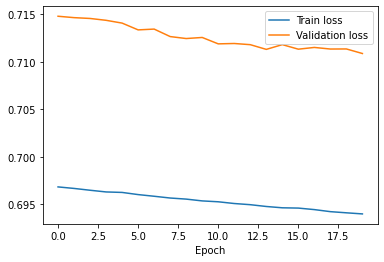

Train loss = 0.6939940055211385
Val loss = 0.7108817100524902


In [ ]:
print("Best hyperparameters:", best_hyperparams)
print()

num_epochs = 20
inputs = [train_data_scalar, train_data_raw, 
          train_data_scalar_subsegs, train_data_raw_subsegs]
val_in = [val_data_scalar, val_data_raw, 
          val_data_scalar_subsegs, val_data_raw_subsegs]
targets = torch.FloatTensor(train_labels)
val_targets = torch.FloatTensor(val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

for i in [2, 3]:
  for j in range(len(inputs[i])):
    for k in range(len(inputs[i][j])):
      inputs[i][j][k] = inputs[i][j][k].to(device)
  for j in range(len(val_in[i])):
    for k in range(len(val_in[i][j])):
      val_in[i][j][k] = val_in[i][j][k].to(device)

model = CombinedScalarAndTransformerFeatureClassifier(num_layers=best_hyperparams['L'], 
                                                      fc_size=best_hyperparams['fc_dim'])
optimizer = optim.SGD(model.parameters(), lr=best_hyperparams['lr'])
model = model.to(device)

running_train_loss = []
running_val_loss = []
for epoch in range(num_epochs):
  train_loss = 0
  for i in range(num_batches):
    model.zero_grad()
    model.train()
    batch_scalar = inputs[0][i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    batch_raw = inputs[1][:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    batch_scalar_subsegs = inputs[2][i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    batch_raw_subsegs = inputs[3][i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model((batch_scalar, batch_raw, batch_scalar_subsegs, batch_raw_subsegs)).squeeze()
    print(scores)
    print(target_batch.squeeze())
    loss = loss_fn(scores, target_batch.squeeze())
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    train_loss += loss.item() / num_batches
  val_loss = 0
  num_val_batches = val_in[1].shape[1] // batch_size + 1
  with torch.no_grad():
    for i in range(num_val_batches):
      val_batch_scalar = val_in[0][i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
      val_batch_raw = val_in[1][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      val_batch_scalar_subsegs = val_in[2][i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
      val_batch_raw_subsegs = val_in[3][i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
      val_target_batch = val_targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      val_scores = model((val_batch_scalar, val_batch_raw, 
                          val_batch_scalar_subsegs, val_batch_raw_subsegs)).squeeze()
      loss = loss_fn(val_scores, val_target_batch.squeeze())
      val_loss += loss.item() / num_val_batches
  running_train_loss.append(train_loss)
  running_val_loss.append(val_loss)
  print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
      epoch, train_loss, val_loss))
  print("")

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(running_val_loss, label="Validation loss")
plt.legend()
plt.xlabel("Epoch")
plt.show()

print("Train loss =", min(running_train_loss))
print("Val loss =", min(running_val_loss))

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del model
del inputs
del targets
del val_in
del val_targets

### Testing on toy data

In [ ]:
toy_data = [torch.rand(1945, 1, 8) for _ in range(99)]
toy_targets = torch.zeros(len(toy_data))

class1_idxs = np.random.choice(len(toy_data), len(toy_data)//2, replace=False)

for i in class1_idxs:
  toy_data[i] += 2
  toy_targets[i] = 1

NameError: ignored

In [ ]:
toy_targets

tensor([1., 1., 0., 0., 1., 1., 0., 0., 1., 1., 0., 1., 1., 0., 1., 0., 0., 0.,
        0., 1., 1., 1., 0., 1., 1., 0., 0., 0., 1., 1., 0., 1., 0., 1., 0., 1.,
        0., 1., 1., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1.,
        1., 0., 1., 0., 0., 1., 1., 0., 1., 1., 0., 1., 0., 0., 0., 1., 0., 0.,
        0., 0., 1., 1., 1., 1., 0., 1., 0., 1., 1., 0., 1., 0., 0., 1., 1., 1.,
        1., 1., 0., 1., 1., 0., 1., 0., 0.])

In [ ]:
train_data_raw = torch.nan_to_num(torch.cat(toy_data, dim=1))

torch.Size([100, 99, 8])


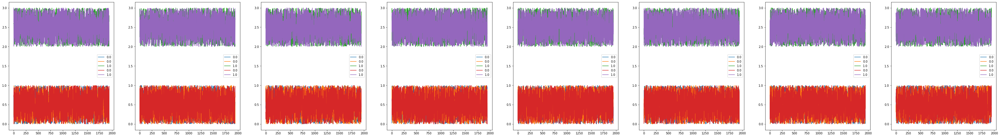

<Figure size 432x288 with 0 Axes>

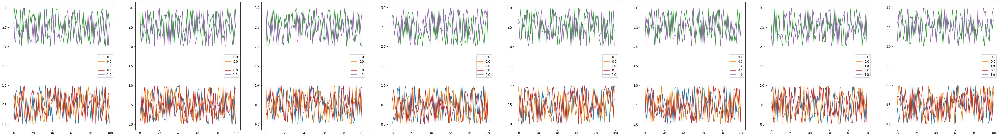

<Figure size 432x288 with 0 Axes>

In [ ]:
sampled_idxs = np.linspace(0, train_data_raw.shape[0], 100, endpoint=False, dtype=int)

fig, ax = plt.subplots(1, 8, figsize=[60, 8])
for i in range(5):
  for j in range(8):
    ax[j].plot(train_data_raw[:, i, j], label="{}".format(toy_targets[i]))
    ax[j].legend()
plt.figure()
fig, ax = plt.subplots(1, 8, figsize=[60, 8])
for i in range(5):
  for j in range(8):
    ax[j].plot(train_data_raw[:, i, j][sampled_idxs], label="{}".format(toy_targets[i]))
    ax[j].legend()
plt.figure()

train_data_raw = train_data_raw[sampled_idxs]

print(train_data_raw.size())

In [ ]:
train_data_raw = (train_data_raw - 
                     torch.mean(train_data_raw, dim=1, 
                                keepdim=True)) / torch.std(train_data_raw, 
                                                           dim=1, keepdim=True)
# minmax = torch.max(
#     train_data_raw, dim=0, keepdim=True
#     )[0] - torch.min(
#         train_data_raw, dim=0, keepdim=True
#         )[0]
# min_val = torch.min(train_data_raw, dim=0, keepdim=True)[0]
# train_data_raw = (train_data_raw - min_val) / minmax
                                
train_data_raw = torch.nan_to_num(train_data_raw)

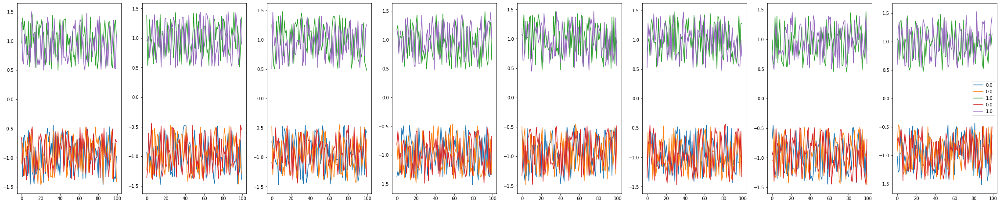

In [ ]:
fig, ax = plt.subplots(1, 8, figsize=[40, 8])
for i in range(5):
  for j in range(8):
    ax[j].plot(train_data_raw[:, i, j], label="{}".format(toy_targets[i]))
  plt.legend()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
class ToyLSTMFeatureClassifier(nn.Module):

  def __init__(self, hidden_dim=100, num_layers=2, fc_size=100, bidirectional=True):
    super(ToyLSTMFeatureClassifier, self).__init__()
    self.lstm = nn.LSTM(8, hidden_dim, bidirectional=bidirectional)
    self.linear = nn.Linear(2 * hidden_dim, 1)
    self.sigmoid = nn.Sigmoid()
    self.dimension = hidden_dim

  def forward(self, x):
    x_raw = x
    a1, hidden = self.lstm(x_raw)
    out_forward = a1[-1, :, :self.dimension].squeeze()
    out_reverse = a1[0, :, self.dimension:].squeeze()
    out = torch.cat((out_forward, out_reverse), 1).squeeze()
    out = self.linear(out)
    out = self.sigmoid(out)

    return out

loss_fn = nn.BCELoss()

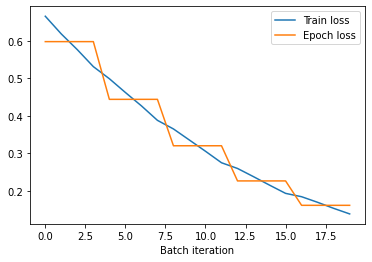

In [ ]:
# seed = 123
# random.seed(seed)
# np.random.seed(seed)
# torch.manual_seed(seed)
# torch.cuda.manual_seed(seed)

seq_len = train_data_raw.shape[0]
num_samples = train_data_raw.shape[1]
num_epochs = 20
batch_size = 32
num_batches = num_samples // batch_size + 1

inputs = train_data_raw
targets = torch.FloatTensor(toy_targets)

inputs, targets = inputs.to(device), targets.to(device)

L = 2
fc_dim = 200
lr = 1e-1
hidden_dim = 200

model = ToyLSTMFeatureClassifier(hidden_dim, num_layers=L, fc_size=fc_dim)
model = model.to(device)
optimizer = optim.SGD(model.parameters(), lr=lr)

running_train_loss = []
running_val_loss = []
model.train()
# for epoch in range(num_epochs):
for epoch in range(5):
  for i in range(num_batches):
    batch_raw = inputs[:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model(batch_raw).squeeze()
    loss = loss_fn(scores, target_batch.squeeze())
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    running_train_loss.append(loss.item())

epoch_loss = sum([[np.mean(running_train_loss[i * num_batches : (i + 1) * num_batches])] * num_batches 
for i in range(5)], [])

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(epoch_loss, label="Epoch loss")
plt.legend()
plt.xlabel("Batch iteration")
plt.show()

### Comparison

| Features | Best model hyperparameters | Best model validation loss | # Epochs |
| --- | --- | --- | --- |
| Primary | 'L': 2, 'lr': 0.1, 'fc_dim': 20, 'hidden_dim': 100 | 0.6852 | 20 |
| Primary + Secondary | 'L': 2, 'lr': 0.01, 'fc_dim': 20, 'hidden_dim': 20 | 0.6842 | 20 |
| Primary (with Fourier) | 'L': 2, 'lr': 0.1, 'fc_dim': 50, 'hidden_dim_main': 20, 'hidden_dim_aux': 50 | 0.6263 | 20 |
| Primary + Secondary (with Fourier) | 'L': 1, 'lr': 0.01, 'fc_dim': 100, 'hidden_dim_main': 20, 'hidden_dim_aux': 20 | 0.7051 | 6 |

### Best model test set evaluation

In [ ]:
def primary_featurized_data(sample):
  dist_right, dist_left, time = normalized_tapping_distance(sample.data)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  time = np.asarray(time) - time[0]
  seq_len = len(time)
  label = 1 if sample.on_state == "on" else 0
  featurized_main = np.zeros((seq_len, 1, 4))
  featurized_main[:, 0, 0] = np.asarray(dist_left)
  featurized_main[:, 0, 1] = np.asarray(dist_right)
  featurized_main[:, 0, 2] = np.asarray(left_v)
  featurized_main[:, 0, 3] = np.asarray(right_v)
  dist_right_spectrum, freq = fourier_transform(time, np.asarray(dist_right))
  dist_left_spectrum, _ = fourier_transform(time, np.asarray(dist_left))
  right_v_spectrum, _ = fourier_transform(time, np.asarray(right_v))
  left_v_spectrum, _ = fourier_transform(time, np.asarray(left_v))
  seq_len = len(freq)
  featurized_fourier = np.zeros((seq_len, 1, 4))
  featurized_fourier[:, 0, 0] = dist_left_spectrum
  featurized_fourier[:, 0, 1] = dist_right_spectrum
  featurized_fourier[:, 0, 2] = left_v_spectrum
  featurized_fourier[:, 0, 3] = right_v_spectrum
  return time, featurized_main, freq, featurized_fourier, label

def primary_featurized_dataset(dataset):
  featurized_main_list = []
  times_list = []
  featurized_fourier_list = []
  freq_list = []
  labels = []
  for sample in dataset:
    time, featurized_main, freq, featurized_fourier, label = primary_featurized_data(sample)
    featurized_main_list.append(featurized_main)
    times_list.append(time)
    featurized_fourier_list.append(featurized_fourier)
    freq_list.append(freq)
    labels.append(label)
  times_concat = np.concatenate(times_list)
  times_union = np.unique(times_concat)
  freq_concat = np.concatenate(freq_list)
  freq_union = np.unique(freq_concat)
  featurized_main_interped_list = []
  featurized_fourier_interped_list = []

  seq_len = len(times_union)
  for i, f in enumerate(featurized_main_list):
    times_f = times_list[i]
    featurized_interped = torch.zeros((seq_len, 1, f.shape[2]))
    for j in range(f.shape[2]):
      feature = f[:, 0, j]
      feature_interped = np.interp(times_union, times_f, feature)
      featurized_interped[:, 0, j] = torch.tensor(feature_interped)
    featurized_main_interped_list.append(featurized_interped)
  
  seq_len = len(freq_union)
  for i, f in enumerate(featurized_fourier_list):
    freq_f = freq_list[i]
    featurized_interped = torch.zeros((seq_len, 1, f.shape[2]))
    for j in range(f.shape[2]):
      feature = f[:, 0, j]
      feature_interped = np.interp(freq_union, freq_f, feature)
      featurized_interped[:, 0, j] = torch.tensor(feature_interped)
    featurized_fourier_interped_list.append(featurized_interped)
    
  return (featurized_main_interped_list, featurized_fourier_interped_list), labels

In [ ]:
(featurized_data_main, featurized_data_fourier), labels = primary_featurized_dataset(on_data + off_data)

In [ ]:
n = len(featurized_data_main)
train_idxs = np.random.choice(range(n), round(0.8 * n), replace=False)
test_idxs = [i for i in range(n) if i not in train_idxs]
test_data = [(on_data + off_data)[i] for i in test_idxs]

train_data_main = [featurized_data_main[i] for i in train_idxs]
train_data_main = torch.nan_to_num(torch.cat(train_data_main, dim=1))
train_data_fourier = [featurized_data_fourier[i] for i in train_idxs]
train_data_fourier = torch.nan_to_num(torch.cat(train_data_fourier, dim=1))
train_labels = [labels[i] for i in train_idxs]
test_data_main = [featurized_data_main[i] for i in test_idxs]
test_data_fourier = [featurized_data_fourier[i] for i in test_idxs]
test_labels = [labels[i] for i in test_idxs]

In [ ]:
n = len(test_data_main)
val_idxs = np.random.choice(range(n), round(0.6 * n), replace=False)
test_idxs = [i for i in range(n) if i not in val_idxs]
test_data = [test_data[i] for i in test_idxs]

val_data_main = [test_data_main[i] for i in val_idxs]
val_data_main = torch.nan_to_num(torch.cat(val_data_main, dim=1))
val_data_fourier = [test_data_fourier[i] for i in val_idxs]
val_data_fourier = torch.nan_to_num(torch.cat(val_data_fourier, dim=1))
val_labels = [test_labels[i] for i in val_idxs]
test_data_main = [test_data_main[i] for i in test_idxs]
test_data_main = torch.nan_to_num(torch.cat(test_data_main, dim=1))
test_data_fourier = [test_data_fourier[i] for i in test_idxs]
test_data_fourier = torch.nan_to_num(torch.cat(test_data_fourier, dim=1))
test_labels = [test_labels[i] for i in test_idxs]

In [ ]:
print(train_data_main.size())
print(train_data_fourier.size())
print(val_data_main.size())
print(val_data_fourier.size())
print(test_data_main.size())
print(test_data_fourier.size())

torch.Size([13400, 62, 4])
torch.Size([16875, 62, 4])
torch.Size([13400, 9, 4])
torch.Size([16875, 9, 4])
torch.Size([13400, 6, 4])
torch.Size([16875, 6, 4])


In [ ]:
seq_len_main = left_hand_train_main.shape[0]
num_samples = left_hand_train_main.shape[1]
num_features = 4
num_epochs = 10
batch_size = 8
num_batches = num_samples // batch_size + 1

class LSTMClassifierWithFourierAux(nn.Module):

  def __init__(self, num_features, hidden_dim_main, hidden_dim_aux, 
               num_layers=1, fc_size=10, bidirectional=True):
    super().__init__()
    self.lstm_main = nn.LSTM(num_features, hidden_dim_main, num_layers)
    if num_features == 4:
      self.lstm_aux = nn.LSTM(4, hidden_dim_aux, num_layers)
    elif num_features == 14:
      self.lstm_aux = nn.LSTM(10, hidden_dim_aux, num_layers)
    self.linear_main = nn.Linear(hidden_dim_main, fc_size)
    self.linear_aux = nn.Linear(hidden_dim_aux, fc_size)
    self.relu = nn.ReLU()
    self.output = nn.Linear(2 * fc_size, 1)
    self.sigmoid = nn.Sigmoid()

  def forward(self, x):
    x_main = x[0]
    x_fourier = x[1]
    all_h, (h, c) = self.lstm_main(x_main)
    h_main = torch.mean(h, dim=0)
    all_h, (h, c) = self.lstm_aux(x_fourier)
    h_aux = torch.mean(h, dim=0)
    a_main = self.relu(self.linear_main(h_main))
    a_aux = self.relu(self.linear_aux(h_aux))
    out = self.sigmoid(self.output(torch.cat([a_main, a_aux], dim=-1)))
    return out

loss_fn = nn.BCELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


Epoch 0: 
 Training loss = 0.6947939395904541 
 Validation loss = 0.6865055561065674



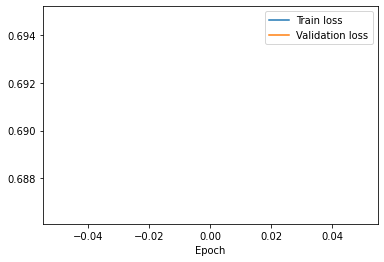

Train loss = tensor(0.6948, device='cuda:0', grad_fn=<AddBackward0>)
Val loss = tensor(0.6865, device='cuda:0', grad_fn=<AddBackward0>)


In [ ]:
best_hyperparams = {'L': 2, 'lr': 0.085, 'fc_dim': 50, 'hidden_dim_main': 20, 'hidden_dim_aux': 50}

num_epochs = 1
inputs = [train_data_main, train_data_fourier]
val_in = [val_data_main, val_data_fourier]
targets = torch.FloatTensor(train_labels)
val_targets = torch.FloatTensor(val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

model = LSTMClassifierWithFourierAux(num_features, 
                                    best_hyperparams['hidden_dim_main'],
                                    best_hyperparams['hidden_dim_aux'], 
                                    num_layers=best_hyperparams['L'], 
                                    fc_size=best_hyperparams['fc_dim'])
optimizer = optim.SGD(model.parameters(), lr=best_hyperparams['lr'])
model = model.to(device)

running_train_loss = []
running_val_loss = []
for epoch in range(num_epochs):
  train_loss = 0
  for i in range(num_batches):
    model.zero_grad()
    batch_main = inputs[0][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
    batch_fourier = inputs[1][:, i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size), :]
    target_batch = targets[i * batch_size : min(num_samples, 
                                        i * batch_size + batch_size)]
    scores = model((batch_main, batch_fourier)).squeeze()
    loss = loss_fn(scores, target_batch.squeeze())
    loss.backward()
    optimizer.step()
    train_loss += loss / num_batches
  val_loss = 0
  num_val_batches = val_in[0].shape[1] // batch_size + 1
  for i in range(num_val_batches):
    batch_main = val_in[0][:, i * batch_size : min(val_in[0].shape[1], 
                                          i * batch_size + batch_size), :]
    batch_fourier = val_in[1][:, i * batch_size : min(val_in[0].shape[1], 
                                        i * batch_size + batch_size), :]
    target_batch = val_targets[i * batch_size : min(val_in[0].shape[1], 
                                        i * batch_size + batch_size)]
    val_scores = model((batch_main, batch_fourier)).squeeze()
    loss = loss_fn(val_scores, target_batch.squeeze())
    val_loss += loss / num_val_batches
  running_train_loss.append(train_loss)
  running_val_loss.append(val_loss)
  print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
      epoch, train_loss, val_loss))
  print("")

plt.figure()
plt.plot(running_train_loss, label="Train loss")
plt.plot(running_val_loss, label="Validation loss")
plt.legend()
plt.xlabel("Epoch")
plt.show()

print("Train loss =", min(running_train_loss))
print("Val loss =", min(running_val_loss))

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del inputs
del targets
del val_in
del val_targets

In [ ]:
model.eval()
test_in = [test_data_main, test_data_fourier]
targets = torch.FloatTensor(test_labels)

test_in[0], test_in[1] = test_in[0].to(device), test_in[1].to(device)
targets = targets.to(device).squeeze()
pred = model(test_in).squeeze()

loss = loss_fn(pred, targets)
print("Test loss = ", loss.item())
print()

print(pred)
print(test_labels)

Test loss =  0.6927949786186218

tensor([0.4833, 0.4846, 0.4838, 0.4849, 0.4839, 0.4801], device='cuda:0',
       grad_fn=<SqueezeBackward0>)
[1, 1, 1, 0, 0, 0]


## Finger Tapping Score Classification (Left Hand)

In [ ]:
left_data = [data for data in dataset if data.prominent_hand == "left"]
right_data = [data for data in dataset if data.prominent_hand == "right"]

print("# of on state samples:", len(left_data))
print("# of off state samples:", len(right_data))

# of on state samples: 50
# of off state samples: 49


In [ ]:
def get_scalar_features(sample):
  dist_right, dist_left, time = normalized_tapping_distance(sample.data)
  right_v, _ = tap_velocity(time, dist_right)
  left_v, _ = tap_velocity(time, dist_left)
  dist_right_amp, _ = distance_amplitude(time, dist_right)
  dist_left_amp, _ = distance_amplitude(time, dist_left)
  right_v_amp, _ = velocity_amplitude(time, right_v)
  left_v_amp, _ = velocity_amplitude(time, left_v)
  right_freq, _, _ = tapping_frequency(time, dist_right)
  left_freq, _, _ = tapping_frequency(time, dist_right)
  right_acc, _ = tap_acceleration(time, right_v)
  left_acc, _ = tap_acceleration(time, left_v)
  _, right_cv = movement_consistency(time, dist_right)
  _, left_cv = movement_consistency(time, dist_left)
  dist_right_spectrum, freq = fourier_transform(time, np.asarray(dist_right))
  dist_left_spectrum, _ = fourier_transform(time, np.asarray(dist_left))
  right_v_spectrum, _ = fourier_transform(time, np.asarray(right_v))
  left_v_spectrum, _ = fourier_transform(time, np.asarray(left_v))
  dist_right_amp_spectrum, _ = fourier_transform(time, np.asarray(dist_right_amp))
  dist_left_amp_spectrum, _ = fourier_transform(time, np.asarray(dist_left_amp))
  right_v_amp_spectrum, _ = fourier_transform(time, np.asarray(right_v_amp))
  left_v_amp_spectrum, _ = fourier_transform(time, np.asarray(left_v_amp))
  left_acc_spectrum, _ = fourier_transform(time, np.asarray(left_acc))
  right_acc_spectrum, _ = fourier_transform(time, np.asarray(right_acc))

  featurized = np.zeros(46)

  featurized[0] = np.nanmean(np.asarray(dist_right))
  featurized[1] = np.nanstd(np.asarray(dist_right))
  featurized[2] = np.nanmean(np.asarray(dist_left))
  featurized[3] = np.nanstd(np.asarray(dist_left))
  featurized[4] = np.nanmean(np.asarray(right_v))
  featurized[5] = np.nanstd(np.asarray(right_v))
  featurized[6] = np.nanmean(np.asarray(left_v))
  featurized[7] = np.nanstd(np.asarray(left_v))
  featurized[8] = np.nanmean(np.asarray(right_acc))
  featurized[9] = np.nanstd(np.asarray(right_acc))
  featurized[10] = np.nanmean(np.asarray(left_acc))
  featurized[11] = np.nanstd(np.asarray(left_acc))
  featurized[12] = np.nanmean(np.asarray(dist_right_amp))
  featurized[13] = np.nanstd(np.asarray(dist_right_amp))
  featurized[14] = np.nanmean(np.asarray(dist_left_amp))
  featurized[15] = np.nanstd(np.asarray(dist_left_amp))
  featurized[16] = np.nanmean(np.asarray(right_v_amp))
  featurized[17] = np.nanstd(np.asarray(right_v_amp))
  featurized[18] = np.nanmean(np.asarray(left_v_amp))
  featurized[19] = np.nanstd(np.asarray(left_v_amp))

  featurized[20] = np.nanmean(np.asarray(dist_right_spectrum))
  featurized[21] = np.nanstd(np.asarray(dist_right_spectrum))
  featurized[22] = np.nanmean(np.asarray(dist_left_spectrum))
  featurized[23] = np.nanstd(np.asarray(dist_left_spectrum))
  featurized[24] = np.nanmean(np.asarray(right_v_spectrum))
  featurized[25] = np.nanstd(np.asarray(right_v_spectrum))
  featurized[26] = np.nanmean(np.asarray(left_v_spectrum))
  featurized[27] = np.nanstd(np.asarray(left_v_spectrum))
  featurized[28] = np.nanmean(np.asarray(right_acc_spectrum))
  featurized[29] = np.nanstd(np.asarray(right_acc_spectrum))
  featurized[30] = np.nanmean(np.asarray(left_acc_spectrum))
  featurized[31] = np.nanstd(np.asarray(left_acc_spectrum))
  featurized[32] = np.nanmean(np.asarray(dist_right_amp_spectrum))
  featurized[33] = np.nanstd(np.asarray(dist_right_amp_spectrum))
  featurized[34] = np.nanmean(np.asarray(dist_left_amp_spectrum))
  featurized[35] = np.nanstd(np.asarray(dist_left_amp_spectrum))
  featurized[36] = np.nanmean(np.asarray(right_v_amp_spectrum))
  featurized[37] = np.nanstd(np.asarray(right_v_amp_spectrum))
  featurized[38] = np.nanmean(np.asarray(left_v_amp_spectrum))
  featurized[39] = np.nanstd(np.asarray(left_v_amp_spectrum))

  featurized[40] = np.nanmean(np.asarray(right_freq))
  featurized[41] = np.nanstd(np.asarray(right_freq))
  featurized[42] = np.nanmean(np.asarray(left_freq))
  featurized[43] = np.nanstd(np.asarray(left_freq))
  featurized[44] = right_cv
  featurized[45] = left_cv

  if sample.prominent_hand == "left":
      if sample.on_state == "on":
          if sample.left_on_tapping_score == -99:
              return None, None
          label = (sample.left_on_tapping_score > 1)
      else:
          if sample.left_off_tapping_score == -99:
              return None, None
          label = (sample.left_off_tapping_score > 1)
  else:
      if sample.on_state == "on":
          if sample.right_on_tapping_score == -99:
              return None, None
          label = (sample.right_on_tapping_score > 1)
      else:
          if sample.right_off_tapping_score == -99:
              return None, None
          label = (sample.right_off_tapping_score > 1)

  featurized = torch.FloatTensor(featurized.reshape((1, 46)))
  
  return featurized, label

def scalar_featurize_dataset(dataset):
  featurized_list = []
  labels = []
  for sample in dataset:
    featurized, label = get_scalar_features(sample)
    if featurized != None and label != None:
      featurized_list.append(featurized)
      labels.append(label)
  return featurized_list, labels

def raw_data(dataset):
  multivariate_data = []
  times_list = []
  labels = []

  for sample in dataset:
    sample_df = sample.data
    right_thumb_tip_x = np.asarray(sample_df["right_thumb_tip:x"])
    right_thumb_tip_y = np.asarray(sample_df["right_thumb_tip:y"])
    right_index_tip_x = np.asarray(sample_df["right_index_tip:x"])
    right_index_tip_y = np.asarray(sample_df["right_index_tip:y"])
    left_thumb_tip_x = np.asarray(sample_df["left_thumb_tip:x"])
    left_thumb_tip_y = np.asarray(sample_df["left_thumb_tip:y"])
    left_index_tip_x = np.asarray(sample_df["left_index_tip:x"])
    left_index_tip_y = np.asarray(sample_df["left_index_tip:y"])
    time = np.asarray(sample_df["timestamp"])
    time = time - time[0]
    extracted_data = np.zeros((len(time), 1, 8))
    extracted_data[:, 0, 0] = right_thumb_tip_x
    extracted_data[:, 0, 1] = right_thumb_tip_y
    extracted_data[:, 0, 2] = right_index_tip_x
    extracted_data[:, 0, 3] = right_index_tip_y
    extracted_data[:, 0, 4] = left_thumb_tip_x
    extracted_data[:, 0, 5] = left_thumb_tip_y
    extracted_data[:, 0, 6] = left_index_tip_x
    extracted_data[:, 0, 7] = left_index_tip_y
    if sample.prominent_hand == "left":
      if sample.on_state == "on":
        if sample.left_on_tapping_score != -99:
          multivariate_data.append(torch.FloatTensor(extracted_data))
          label = (sample.left_on_tapping_score > 1)
          labels.append(label)
          times_list.append(time)
      else:
        if sample.left_off_tapping_score != -99:
          multivariate_data.append(torch.FloatTensor(extracted_data))
          label = (sample.left_off_tapping_score > 1)
          labels.append(label)
          times_list.append(time)
    else:
      if sample.on_state == "on":
        if sample.right_on_tapping_score != -99:
          multivariate_data.append(torch.FloatTensor(extracted_data))
          label = (sample.right_on_tapping_score > 1)
          labels.append(label)
          times_list.append(time)
      else:
        if sample.right_off_tapping_score != -99:
          multivariate_data.append(torch.FloatTensor(extracted_data))
          label = (sample.right_off_tapping_score > 1)
          labels.append(label)
          times_list.append(time)
    
  times_concat = np.concatenate(times_list)
  times_union = np.unique(times_concat)

  interped_multivariate_data = []
  seq_len = len(times_union)
  for i, f in enumerate(multivariate_data):
    times_f = times_list[i]
    interped = torch.zeros((seq_len, 1, f.shape[2]))
    for j in range(f.shape[2]):
      feature = f[:, 0, j]
      feature_interped = np.interp(times_union, times_f, feature)
      interped[:, 0, j] = torch.tensor(feature_interped)
    interped_multivariate_data.append(interped)

  return interped_multivariate_data, labels

def raw_data_subseg(dataset):
  multivariate_data = []
  times_list = []
  labels = []

  for sample in dataset:
    sample_df = sample.data
    right_thumb_tip_x = np.asarray(sample_df["right_thumb_tip:x"])
    right_thumb_tip_y = np.asarray(sample_df["right_thumb_tip:y"])
    right_index_tip_x = np.asarray(sample_df["right_index_tip:x"])
    right_index_tip_y = np.asarray(sample_df["right_index_tip:y"])
    left_thumb_tip_x = np.asarray(sample_df["left_thumb_tip:x"])
    left_thumb_tip_y = np.asarray(sample_df["left_thumb_tip:y"])
    left_index_tip_x = np.asarray(sample_df["left_index_tip:x"])
    left_index_tip_y = np.asarray(sample_df["left_index_tip:y"])
    time = np.asarray(sample_df["timestamp"])
    time = time - time[0]
    times_list.append(time)
    extracted_data = np.zeros((len(time), 1, 8))
    extracted_data[:, 0, 0] = right_thumb_tip_x
    extracted_data[:, 0, 1] = right_thumb_tip_y
    extracted_data[:, 0, 2] = right_index_tip_x
    extracted_data[:, 0, 3] = right_index_tip_y
    extracted_data[:, 0, 4] = left_thumb_tip_x
    extracted_data[:, 0, 5] = left_thumb_tip_y
    extracted_data[:, 0, 6] = left_index_tip_x
    extracted_data[:, 0, 7] = left_index_tip_y
    if sample.prominent_hand == "left":
      if sample.on_state == "on":
        if sample.left_on_tapping_score != -99:
          multivariate_data.append(torch.FloatTensor(extracted_data))
          label = (sample.left_on_tapping_score > 1)
          labels.append(label)
      else:
        if sample.left_off_tapping_score != -99:
          multivariate_data.append(torch.FloatTensor(extracted_data))
          label = (sample.left_off_tapping_score > 1)
          labels.append(label)
    else:
      if sample.on_state == "on":
        if sample.right_on_tapping_score != -99:
          multivariate_data.append(torch.FloatTensor(extracted_data))
          label = (sample.right_on_tapping_score > 1)
          labels.append(label)
      else:
        if sample.right_off_tapping_score != -99:
          multivariate_data.append(torch.FloatTensor(extracted_data))
          label = (sample.right_off_tapping_score > 1)
          labels.append(label)

  return multivariate_data, labels

In [ ]:
scalar_features, labels = scalar_featurize_dataset(left_data)
scalar_features_subsegs = [scalar_featurize_dataset(data.subsegs)[0] for data in left_data]
raw_multivariate_data, _ = raw_data(left_data)
raw_multivariate_data_subsegs = [raw_data_subseg(data.subsegs)[0] for data in left_data]

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:263: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims, where=where)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:223: RuntimeWarning: invalid value encountered in true_divide
  subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:1072: RuntimeWarning: Mean of empty slice.
  return a.std(axis) / a.mean(axis)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: Mean of empty slice
/usr/local/li

In [ ]:
print(len([l for l in labels if l == 1]))
print(len([l for l in labels if l == 0]))

22
25


In [ ]:
class GaitSymptomDataset(Dataset):
  def __init__(self, scalar_features, scalar_features_subsegs, 
               raw_multivariate_data, raw_multivariate_data_subsegs,
               labels):
    self.scalar_features = scalar_features
    self.scalar_features_subsegs = scalar_features_subsegs
    self.raw = raw_multivariate_data
    self.raw_subsegs = raw_multivariate_data_subsegs
    self.labels = labels

  def __len__(self):
    return len(self.labels)

  def __getitem__(self, idx):
    scalar = self.scalar_features[idx]
    scalar_subsegs = self.scalar_features_subsegs[idx]
    raw = self.raw[idx]
    raw_subsegs = self.raw_subsegs[idx]
    label = self.labels[idx]

    sampled_idxs = np.linspace(0, raw.shape[0], 100, endpoint=False, dtype=int)
    raw = raw[sampled_idxs]

    return scalar, raw, scalar_subsegs, raw_subsegs, label

def collate_fn(data):
    #data is a list of tuples corresponding to the output of calling getitem on
    #each element in a batch taken from GaitSymptomDataset
    scalar, raw, scalar_subsegs, raw_subsegs, labels = zip(*data)
    labels = torch.FloatTensor(labels)
    scalar = torch.cat(scalar, dim=0)
    raw = torch.cat(raw, dim=1)

    scalar = (scalar - torch.mean(scalar, dim=0, 
                                  keepdim=True)) / torch.std(scalar, dim=0, 
                                                             keepdim=True)
    scalar = torch.nan_to_num(scalar)

    m = scalar_subsegs
    all_subsegs = [m[i][j] for i in range(len(m)) for j in range(len(m[i]))]
    all_subsegs = torch.cat(all_subsegs, dim=0)
    for i, d in enumerate(m):
        for j, s in enumerate(d):
            # if s.shape[0] > 1:
            #     print(s)
            s = (s - torch.mean(all_subsegs, dim=0, 
                                keepdim=True)) / torch.std(s, dim=0, 
                                                           keepdim=True)
            m[i][j] = torch.nan_to_num(s)

    raw = (raw - torch.mean(raw, dim=1, 
                            keepdim=True)) / torch.std(raw, dim=1, 
                                                       keepdim=True)
    minmax = torch.max(
        raw, dim=0, keepdim=True
        )[0] - torch.min(
            raw, dim=0, keepdim=True
            )[0]
    min_val = torch.min(raw, dim=0, keepdim=True)[0]
    raw = (raw - min_val) / minmax
    raw = torch.nan_to_num(raw)

    m = raw_subsegs
    all_subsegs = [m[i][j] for i in range(len(m)) for j in range(len(m[i]))]
    all_subsegs = torch.cat(all_subsegs, dim=1)

    for i, d in enumerate(m):
        for j, s in enumerate(d):
            s = (s - torch.mean(all_subsegs, dim=1, 
                                keepdim=True)) / torch.std(all_subsegs, dim=1, 
                                                           keepdim=True)
            minmax = torch.max(
                s, dim=0, keepdim=True
                )[0] - torch.min(
                    s, dim=0, keepdim=True
                    )[0]
            min_val = torch.min(s, dim=0, keepdim=True)[0]
            s = (s - min_val) / minmax
            m[i][j] = torch.nan_to_num(s)

    return scalar, raw, list(scalar_subsegs), list(raw_subsegs), labels

In [ ]:
symptom_data = GaitSymptomDataset(scalar_features, scalar_features_subsegs,
                          raw_multivariate_data, raw_multivariate_data_subsegs,
                          labels)

In [ ]:
class CombinedScalarAndTransformerFeatureClassifier(nn.Module):

  def __init__(self, num_layers=3, fc_size=10):
    super(CombinedScalarAndTransformerFeatureClassifier, self).__init__()
    self.encoder_layer1 = nn.TransformerEncoderLayer(d_model=8, nhead=8)
    self.transformer_encoder1 = nn.TransformerEncoder(self.encoder_layer1, 
                                                     num_layers=num_layers)
    self.encoder_layer2 = nn.TransformerEncoderLayer(d_model=8, nhead=8)
    self.transformer_encoder2 = nn.TransformerEncoder(self.encoder_layer2, 
                                                     num_layers=num_layers)   
    self.linear1 = nn.Linear(8 + 46, fc_size)
    self.linear2 = nn.Linear(8 + 46, fc_size)
    self.relu = nn.ReLU()
    self.linear3 = nn.Linear(2 * fc_size, fc_size)
    self.linear4 = nn.Linear(fc_size, 1)
    self.sigmoid = nn.Sigmoid()
    self.scalar_embeddings = nn.Embedding(10, 1)
    self.raw_embeddings = nn.Embedding(10, 100)

  def forward(self, x):
    x_scalar = x[0]
    x_raw = x[1]
    x_scalar_subsegs = x[2]
    x_raw_subsegs = x[3]

    for i, sample in enumerate(x_scalar_subsegs):
      sample.to(device)
      num_subsegs = len(sample)
      if num_subsegs == 0:
        x_scalar_subsegs[i] = torch.zeros(1, 46).to(device)
        continue
      embeddings = self.scalar_embeddings(torch.arange(num_subsegs).to(device))
      x_scalar_subsegs[i] = sum(
          [embeddings[j] * torch.nan_to_num(sample[j].to(device)) for j in range(num_subsegs)])
    x_scalar_subsegs = torch.cat(x_scalar_subsegs, dim=0)

    for i, sample in enumerate(x_raw_subsegs):
      num_subsegs = len(sample)
      if num_subsegs == 0:
        x_raw_subsegs[i] = torch.zeros(100, 1, 8).to(device)
        continue
      embeddings = self.raw_embeddings(torch.arange(num_subsegs).to(device))
      x_raw_subsegs[i] = sum(
          [embeddings[j].unsqueeze(1).unsqueeze(2).expand(100, 1, 8) * torch.nan_to_num(sample[j].to(device)) 
          for j in range(num_subsegs)])
    x_raw_subsegs = torch.cat(x_raw_subsegs, dim=1)

    h = self.transformer_encoder1(x_raw)
    h = h.mean(dim=0)
    a1 = self.relu(self.linear1(torch.cat([h, x_scalar], dim=-1)))

    h = self.transformer_encoder2(x_raw_subsegs)
    h = h.mean(dim=0)
    a2 = self.relu(self.linear2(torch.cat([h, x_scalar_subsegs], dim=-1)))

    out = self.relu(self.linear3(torch.cat([a1, a2], dim=-1)))
    out = self.linear4(out)

    out = self.sigmoid(out)
    return out

loss_fn = nn.BCELoss()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


### 10-fold cross-validation

In [ ]:
folds = []
for i in range(10):
    folds.append([symptom_data[j] for j in range(len(symptom_data)) if (j >= 5 * i and j < 5 * (i + 1))])
print(len(folds))

10


In [ ]:
len(sum([sum([list(f[i][0]) for i in range(len(f))], []) for f in folds], []))

47


Iteration 1/10
42
Number of symptomatic cases in train data: 19
Number of asymptomatic cases in train data: 23
Number of symptomatic cases in val data: 3
Number of asymptomatic cases in val data: 2


RuntimeError: ignored

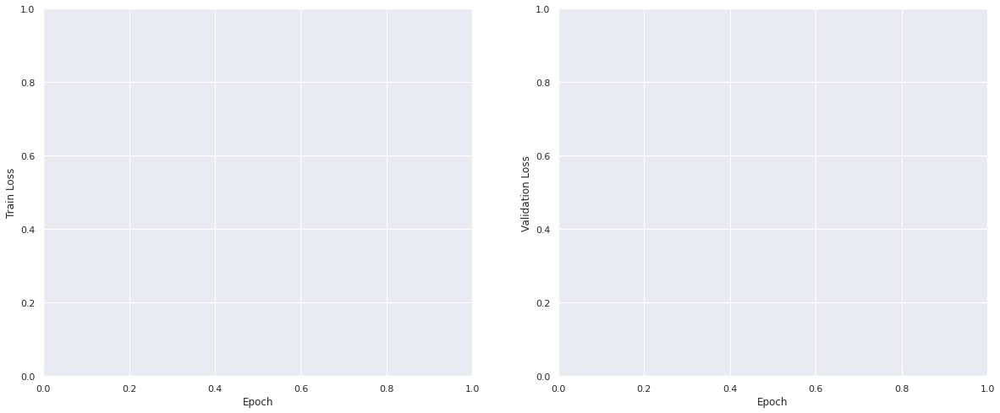

In [ ]:
import seaborn as sns
sns.set()

fig, ax = plt.subplots(1, 2, figsize=[20, 8])
ax[0].set_ylabel("Train Loss")
ax[0].set_xlabel("Epoch")
ax[1].set_ylabel("Validation Loss")
ax[1].set_xlabel("Epoch")

train_loss_arrays = []
val_loss_arrays = []

for val_idx in range(10):

    print()
    print(f"Iteration {val_idx + 1}/10")

    train_folds = [f for i, f in enumerate(folds) if i != val_idx]
    train_dataset = GaitSymptomDataset(sum([sum([list(f[i][0]) for i in range(len(f))], []) for f in train_folds], []), 
                                       sum([sum([list(f[i][1]) for i in range(len(f))], []) for f in train_folds], []),
                                       sum([sum([list(f[i][2]) for i in range(len(f))], []) for f in train_folds], []),
                                       sum([sum([list(f[i][3]) for i in range(len(f))], []) for f in train_folds], []),
                                       sum([sum([[f[i][4]] for i in range(len(f))], []) for f in train_folds], []))
    val_dataset = folds[val_idx]

    print(len(train_dataset))

    print("Number of symptomatic cases in train data:", len([d for d in train_dataset if d[4] == 1]))
    print("Number of asymptomatic cases in train data:", len([d for d in train_dataset if d[4] == 0]))
    print("Number of symptomatic cases in val data:", len([d for d in val_dataset if d[4] == 1]))
    print("Number of asymptomatic cases in val data:", len([d for d in val_dataset if d[4] == 0])) 

    seed = 123
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

    num_epochs = 100
    train_loader = DataLoader(train_dataset, collate_fn=collate_fn, batch_size=8, shuffle=True)
    val_loader = DataLoader(val_dataset, collate_fn=collate_fn, batch_size=8, shuffle=True)
    model = CombinedScalarAndTransformerFeatureClassifier(num_layers=2, 
                                                        fc_size=100)
    optimizer = optim.SGD(model.parameters(), lr=0.05)
    num_batches = len(train_loader)
    model = model.to(device)

    losses = []
    val_losses = []
    for epoch in range(num_epochs):
        model.train()
        for batch in train_loader: 
            scalar, raw, scalar_subsegs, raw_subsegs, targets = batch
            scalar.to(device)
            raw.to(device)
            targets.to(device)
            for i in range(len(scalar_subsegs)):
                for j in range(len(scalar_subsegs[i])):
                    scalar_subsegs[i][j] = scalar_subsegs[i][j].to(device)
            for i in range(len(raw_subsegs)):
                for j in range(len(raw_subsegs[i])):
                    raw_subsegs[i][j] = raw_subsegs[i][j].to(device)
            scores = model((scalar, raw, scalar_subsegs, raw_subsegs)).squeeze()
            loss = loss_fn(scores, targets.squeeze())
            losses.append(loss.item())
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        model.eval()
        val_loss = 0
        for batch in val_loader:
            scalar, raw, scalar_subsegs, raw_subsegs, targets = batch
            scalar.to(device)
            raw.to(device)
            targets.to(device)
            for i in range(len(scalar_subsegs)):
                for j in range(len(scalar_subsegs[i])):
                    scalar_subsegs[i][j] = scalar_subsegs[i][j].to(device)
            for i in range(len(raw_subsegs)):
                for j in range(len(raw_subsegs[i])):
                    raw_subsegs[i][j] = raw_subsegs[i][j].to(device)
            scores = model((scalar, raw, scalar_subsegs, raw_subsegs)).squeeze()
            val_loss += loss_fn(scores, targets.squeeze()).item()
        val_loss /= len(val_loader)
        val_losses.append(val_loss)

        # print("Epoch {}: \n Training loss = {} \n Validation loss = {}".format(
        #     epoch, np.mean(losses[-num_batches : ]), val_losses[-1]))
        # print("")

    mean_losses = [np.mean(losses[i * num_batches : (i + 1) * num_batches])
            for i in range(num_epochs)]
    ax[0].plot(mean_losses, '--', label="Iteration {}/5 of cross validation".format(val_idx + 1), alpha=0.6)
    ax[1].plot(val_losses, '--', label="Iteration {}/5 of cross validation".format(val_idx + 1), alpha=0.6)

    train_loss_arrays.append(mean_losses)
    val_loss_arrays.append(val_losses)


ax[0].plot(np.sum(train_loss_arrays, axis=0) / 5, label="Mean train loss", color='black')
ax[1].plot(np.sum(val_loss_arrays, axis=0) / 5, label="Mean val loss", color='black')

ax[0].legend()
ax[1].legend()
plt.show()

In [ ]:
gc.collect()
torch.cuda.empty_cache()

del model
del inputs
del targets
del val_in
del val_targets

In [ ]:
seed = 123
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

seq_len = train_data_raw.shape[0]
num_samples = train_data_raw.shape[1]
num_epochs = 20
batch_size = 8
num_batches = num_samples // batch_size + 1

inputs = [train_data_scalar, train_data_raw, 
          train_data_scalar_subsegs, train_data_raw_subsegs]
val_in = [val_data_scalar, val_data_raw, 
          val_data_scalar_subsegs, val_data_raw_subsegs]
targets = torch.FloatTensor(train_labels)
val_targets = torch.FloatTensor(val_labels)

inputs[0], inputs[1], targets = inputs[0].to(device), inputs[1].to(device), targets.to(device)
val_in[0], val_in[1], val_targets = val_in[0].to(device), val_in[1].to(device), val_targets.to(device)

for i in [2, 3]:
  for j in range(len(inputs[i])):
    for k in range(len(inputs[i][j])):
      inputs[i][j][k] = inputs[i][j][k].to(device)
  for j in range(len(val_in[i])):
    for k in range(len(val_in[i][j])):
      val_in[i][j][k] = val_in[i][j][k].to(device)

best_hyperparams = {}
best_val_loss = np.inf

for i in range(20):
  L = np.random.choice([2, 3, 5])
  fc_dim = np.random.choice([50, 100, 200])
  lr = np.random.choice([1e-1, 1e-2, 1e-3])
  # L = 5
  # fc_dim = 200
  # lr = 0.1
  # hidden_dim = 200

  curr_hyperparams = {"L": L, "lr": lr, "fc_dim": fc_dim}

  model = CombinedScalarAndTransformerFeatureClassifier(num_layers=L, fc_size=fc_dim)
  model = model.to(device)
  optimizer = optim.SGD(model.parameters(), lr=lr)

  running_train_loss = []
  running_val_loss = []
  for epoch in range(num_epochs):
    train_loss = 0
    for i in range(num_batches):
      model.zero_grad()
      model.train()
      batch_scalar = inputs[0][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      batch_raw = inputs[1][:, i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
      batch_scalar_subsegs = inputs[2][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      batch_raw_subsegs = inputs[3][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      target_batch = targets[i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
      scores = model((batch_scalar, batch_raw, batch_scalar_subsegs, batch_raw_subsegs)).squeeze()
      loss = loss_fn(scores, target_batch.squeeze())
      # print(loss)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      # for param in model.parameters():
      #   if param.grad is not None:
      #     print("After:", param.grad.data.sum())
      train_loss += loss.item() / num_batches
    val_loss = 0
    num_val_batches = val_in[1].shape[1] // batch_size + 1
    with torch.no_grad():
      for i in range(num_val_batches):
        val_batch_scalar = val_in[0][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size), :]
        val_batch_raw = val_in[1][:, i * batch_size : min(num_samples, 
                                            i * batch_size + batch_size), :]
        val_batch_scalar_subsegs = val_in[2][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
        val_batch_raw_subsegs = val_in[3][i * batch_size : min(num_samples, 
                                          i * batch_size + batch_size)]
        val_target_batch = val_targets[i * batch_size : min(num_samples, 
                                            i * batch_size + batch_size)]
        val_scores = model((val_batch_scalar, val_batch_raw, 
                            val_batch_scalar_subsegs, val_batch_raw_subsegs)).squeeze()
        loss = loss_fn(val_scores, val_target_batch.squeeze())
        val_loss += loss.item() / num_val_batches
    running_train_loss.append(train_loss)
    running_val_loss.append(val_loss)
  if min(running_val_loss) < best_val_loss:
    best_val_loss = min(running_val_loss)
    best_hyperparams = curr_hyperparams

  print(curr_hyperparams)
  print("Train loss:", min(running_train_loss))
  print("Val loss:", min(running_val_loss))
  print()

  gc.collect()
  torch.cuda.empty_cache()
  del model

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  if sys.path[0] == '':


{'L': 3, 'lr': 0.001, 'fc_dim': 200}
Train loss: 0.6908454696337382
Val loss: 0.7027812004089355

{'L': 3, 'lr': 0.001, 'fc_dim': 100}
Train loss: 0.6891422967116038
Val loss: 0.6731664538383484

{'L': 2, 'lr': 0.001, 'fc_dim': 100}
Train loss: 0.6861736675103505
Val loss: 0.683016300201416

{'L': 3, 'lr': 0.001, 'fc_dim': 200}
Train loss: 0.6808117330074309
Val loss: 0.6853406429290771



KeyboardInterrupt: ignored

In [ ]:
del inputs
del val_in